# PARAMS

In [1]:
import numpy as np
import pandas as pd
import os
import xarray as xr
import seaborn as sns

from n0_config_params import *
from n0bis_config_analysis_functions import *
from n0ter_stats import *

from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/outdated/utils.py:14: OutdatedCacheFailedWarning: Failed to use cache while checking for outdated package.
Set the environment variable OUTDATED_RAISE_EXCEPTION=1 for a full traceback.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/outdated/utils.py:14: OutdatedPackageWarning: The package pingouin is out of date. Your version is 0.5.2, the latest is 0.5.4.
Set the environment variable OUTDATED_IGNORE=1 to disable these warnings.
  return warn(


# LOAD DATA

In [2]:
os.chdir(os.path.join(path_data, 'psychometric'))
os.listdir()

['OLFADYS_mdp.xlsx',
 'OLFADYS_MAIA.xlsx',
 'OLFADYS_odor_profiles.xlsx',
 'OLFADYS_questionnaire.xlsx',
 'OLFADYS_correspondance_questions.xlsx',
 'OLFADYS_odor_choice.xlsx',
 '~$OLFADYS_correspondance_questions.xlsx']

In [3]:
sujet_list =                    np.array(['01PD','03VN','05LV','06EF','07PB','08DM','09TA','10BH',
                            '11FA','12BD','13FP','14MD','15LG','16GM','17JR','19TM','20TY','21ZV',
                            '23LF','24TJ','26MN','28NT','29SC','30AR','31HJ','32CM','33MA'])

sujet_list_rev =                np.array(['PD01','VN03','LV05','EF06','PB07','DM08','TA09','BH10',
                            'FA11','BD12','FP13','MD14','LG15','GM16','JR17','TM19','TY20','ZV21',
                            'LF23','TJ24','MN26','NT28','SC29','AR30','HJ31','CM32','MA33'])

# ['02MJ', '18SE', '22DI', '27BD'] signal problems
# ['04GB', '25DF'] dypnea induction failed

sujet_best_list =               np.array(['BD12','CM32','FA11','GM16','HJ31','JR17','MA33','MN26',
                            'PD01','SC29','TA09','TJ24','TM19','VN03','ZV21'])
sujet_best_list_rev =           np.array(['12BD','32CM','11FA','16GM','31HJ','17JR','33MA','26MN',
                            '01PD','29SC','09TA','24TJ','19TM','03VN','21ZV'])

sujet_no_respond =              np.array(['LV05','EF06','PB07','DM08','BH10','FP13','MD14','LG15',
                            'TY20','LF23','NT28','AR30'])
sujet_no_respond_rev =          np.array(['05LV','06EF','07PB','08DM','10BH','13FP','14MD','15LG',
                            '20TY','23LF','28NT','30AR'])

In [4]:
df_mdp = pd.read_excel('OLFADYS_mdp.xlsx')
df_q = pd.read_excel('OLFADYS_questionnaire.xlsx')
correspondance_question = pd.read_excel('OLFADYS_correspondance_questions.xlsx')
df_odor_profile = pd.read_excel('OLFADYS_odor_profiles.xlsx')
df_odor_choice = pd.read_excel('OLFADYS_odor_choice.xlsx')
df_MAIA_raw = pd.read_excel('OLFADYS_MAIA.xlsx')

In [5]:
df_odor_choice = df_odor_choice.query(f"sujet in {sujet_list_rev.tolist()}")

In [6]:
df_mdp = df_mdp.query(f"sujet in {sujet_list_rev.tolist()}")

In [7]:
os.chdir(os.path.join(path_data, 'respi_detection'))
df_respi_paris = pd.read_excel('OLFADYS_alldata_mean.xlsx')

In [8]:
os.chdir(os.path.join(path_data, 'respi_detection'))
df_CO2 = pd.read_excel('OLFADYS_alldata_mean.xlsx').query(f"cond == 'CO2'")[['sujet', 'odor', 'PetCO2', 'VAS_A', 'VAS_S']].reset_index(drop=True)
df_CO2 = df_CO2.query(f"sujet in {sujet_list.tolist()}").reset_index(drop=True)
group_list = []

for row_i in range(df_CO2.shape[0]):

    if df_CO2['sujet'][row_i] in sujet_best_list_rev:
        group_list.append('REP')
    else:
        group_list.append('NO_REP')

    if df_CO2['odor'][row_i] == 'p':
        df_CO2['odor'][row_i] = '+'
    if df_CO2['odor'][row_i] == 'n':
        df_CO2['odor'][row_i] = '-'

for nan_i in np.where(df_CO2['PetCO2'].isnull().values)[0]:
    odor = df_CO2['odor'][nan_i]
    nan_replace_petCO2 = df_CO2.query(f"odor == '{odor}'")['PetCO2'].median()
    nan_replace_VAS_A = df_CO2.query(f"odor == '{odor}'")['VAS_A'].median()
    nan_replace_VAS_S = df_CO2.query(f"odor == '{odor}'")['VAS_S'].median()
    df_CO2['PetCO2'][nan_i] = nan_replace_petCO2 
    df_CO2['VAS_A'][nan_i] = nan_replace_VAS_A 
    df_CO2['VAS_S'][nan_i] = nan_replace_VAS_S 

df_CO2['group'] = group_list

/tmp/ipykernel_3741936/1925766556.py:14: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['odor'][row_i] = '+'
/tmp/ipykernel_3741936/1925766556.py:16: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['odor'][row_i] = '-'
/tmp/ipykernel_3741936/1925766556.py:23: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['PetCO2'][nan_i] = nan_replace_petCO2
/tmp/ipykernel_3741936/1925766556.py:24: SettingWithCopyWarning: 
A value is 

In [9]:
df_CO2 = df_CO2.reset_index(drop=True)
A1_val = []
for row_i in range(df_CO2.shape[0]):

    _sujet, _odor = df_CO2['sujet'][row_i], df_CO2['odor'][row_i]
    _sujet_rev = f"{_sujet[2:]}{_sujet[:2]}"
    
    A1_val.append(df_mdp.query(f"sujet == '{_sujet_rev}' and question == 'A1' and session == '{_odor}' and cond == 'CO2'")['value'].values[0])

df_CO2['A1'] = A1_val

question_A2 = ['A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5']
df_A2 = df_mdp.query(f"question in {question_A2}").groupby(['sujet', 'session', 'cond']).mean().reset_index()

/tmp/ipykernel_3741936/2035279872.py:13: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_A2 = df_mdp.query(f"question in {question_A2}").groupby(['sujet', 'session', 'cond']).mean().reset_index()


In [27]:
val = np.zeros((df_q['sujet'].unique().shape[0]*df_q['session'].unique().shape[0]*df_q['cond'].unique().shape[0], 4), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_q['sujet'].unique()):
    for session_i, session in enumerate(df_q['session'].unique()):
        for cond_i, cond in enumerate(df_q['cond'].unique()):
            df_i = df_q.query(f"sujet == '{sujet}' & session == '{session}' & cond == '{cond}'")
            val_p = 300 - df_i[df_i['question'].isin([1, 4, 5])]['val'].sum()
            val_n = df_i[df_i['question'].isin([2, 3, 6])]['val'].sum()
            val_stai = ((val_n + val_p)/600)*100
            val[i, :] = np.array([sujet, session, cond, val_stai])
            i += 1
df_stai = pd.DataFrame(val, columns=['sujet', 'session', 'cond', 'val'])
df_stai['val'] = df_stai['val'].astype(np.float64) 
df_stai = df_stai.query(f"sujet in {sujet_list_rev.tolist()}")

sel_vec = []
for row_i in range(df_stai.shape[0]):
    if df_stai['sujet'].values[row_i] in sujet_best_list:
        sel_vec.append('REP')
    else:
        sel_vec.append('NO_REP')
        
df_stai['group'] = sel_vec


In [31]:
df_relax = df_q.query(f"question == 7").drop(['question', 'raw_val', 'scale'], axis=1)
df_relax = df_relax.query(f"sujet in {sujet_list_rev.tolist()}")

In [12]:
question_A2 = ['A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5']
df_A2 = df_mdp.query(f"question in {question_A2}").groupby(['sujet', 'session', 'cond']).mean().reset_index()
df_A2 = df_A2.query(f"sujet in {sujet_list_rev.tolist()}")

/tmp/ipykernel_3741936/1667413269.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_A2 = df_mdp.query(f"question in {question_A2}").groupby(['sujet', 'session', 'cond']).mean().reset_index()


In [13]:
MAIA_aspects_list = ['Noticing', 'Not_Distracting', 'Not_Worrying', 'Attention_Regulation', 'Emotional_Awareness', 'Self_Regulation', 'Body_Listening', 'Trusting' ]
dict_MAIA = {'sujet' : [], 'aspect' : [], 'value' : [], 'rep' : []}

for sujet in sujet_list:

    sujet_rev = f"{sujet[2:]}{sujet[:2]}"

    for aspect in MAIA_aspects_list:

        dict_MAIA['sujet'].append(sujet)
        dict_MAIA['aspect'].append(aspect)

        if aspect == 'Noticing':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [1, 2, 3, 4]")['value'].mean()
        if aspect == 'Not_Distracting':
            val = (5 - df_MAIA_raw.query(f"sujet == '{sujet}' and question in [5, 6, 7]")['value'].values).mean()
        if aspect == 'Not_Worrying':
            val = np.append((5 - df_MAIA_raw.query(f"sujet == '{sujet}' and question in [8, 9]")['value'].values), (df_MAIA_raw.query(f"sujet == '{sujet}' and question in [10]")['value'].values)).mean()
        if aspect == 'Attention_Regulation':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [11, 12, 13 ,14 ,15 ,16 ,17]")['value'].mean()
        if aspect == 'Emotional_Awareness':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [18, 19, 20, 21, 22]")['value'].mean()
        if aspect == 'Self_Regulation':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [23, 24, 25, 26]")['value'].mean()
        if aspect == 'Body_Listening':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [27, 28, 29]")['value'].mean()
        if aspect == 'Trusting':
            val = df_MAIA_raw.query(f"sujet == '{sujet}' and question in [30, 31, 32]")['value'].mean()

        if sujet_rev in sujet_best_list:
            dict_MAIA['rep'].append('+')
        else:
            dict_MAIA['rep'].append('-')
            
        dict_MAIA['value'].append(val)

df_MAIA = pd.DataFrame(dict_MAIA)
df_MAIA = df_MAIA.query(f"sujet in {sujet_list.tolist()}")


/tmp/ipykernel_3741936/2189028106.py:16: RuntimeWarning: Mean of empty slice.
  val = (5 - df_MAIA_raw.query(f"sujet == '{sujet}' and question in [5, 6, 7]")['value'].values).mean()
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/numpy/core/_methods.py:192: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)
/tmp/ipykernel_3741936/2189028106.py:18: RuntimeWarning: Mean of empty slice.
  val = np.append((5 - df_MAIA_raw.query(f"sujet == '{sujet}' and question in [8, 9]")['value'].values), (df_MAIA_raw.query(f"sujet == '{sujet}' and question in [10]")['value'].values)).mean()


In [14]:
df_q = df_q.query(f"sujet in {sujet_list_rev.tolist()}")

In [15]:
df_q.query(f"question == 8 and session in ['+', '-']")

sel_vec = []
for row_i in range(df_q.shape[0]):
    if df_q['sujet'].values[row_i] in sujet_best_list:
        sel_vec.append('YES')
    else:
        sel_vec.append('NO')

df_q['select_best'] = sel_vec
df_intensity = df_q[['sujet', 'session', 'question', 'cond', 'val', 'select_best']].query(f"question == 8 and sujet in {sujet_list_rev.tolist()}")

In [16]:
val = np.zeros((df_odor_choice['sujet'].unique().shape[0], 2), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_odor_choice['sujet'].unique()):
    df_i = df_odor_choice.query(f"sujet == '{sujet}'")
    diff_i = df_i[df_i['session'] == 'odor_+']['value'].values[0] - df_i[df_i['session'] == 'odor_-']['value'].values[0]
    val[i, :] = np.array([sujet, diff_i])
    i += 1

df_diff = pd.DataFrame(val, columns=['sujet', 'value'])
df_diff['value'] = df_diff['value'].astype(np.float64) 

sel_vec = []
for row_i in range(df_diff.shape[0]):
    if df_diff['sujet'].values[row_i] in sujet_best_list:
        sel_vec.append('YES')
    else:
        sel_vec.append('NO')

df_diff['select_best'] = sel_vec

In [17]:
df_A2_repnorep = df_A2.copy()

sel_vec = []
for row_i in range(df_A2.shape[0]):
    if df_A2['sujet'].values[row_i] in sujet_best_list:
        sel_vec.append('YES')
    else:
        sel_vec.append('NO')

df_A2_repnorep['select_best'] = sel_vec

In [18]:
df_relax_repnorep = df_relax.copy()

sel_vec = []
for row_i in range(df_relax.shape[0]):
    if df_relax['sujet'].values[row_i] in sujet_best_list:
        sel_vec.append('YES')
    else:
        sel_vec.append('NO')

df_relax_repnorep['select_best'] = sel_vec

In [19]:
df_stai_repnorep = df_stai.copy()

sel_vec = []
for row_i in range(df_stai.shape[0]):
    if df_stai['sujet'].values[row_i] in sujet_best_list:
        sel_vec.append('YES')
    else:
        sel_vec.append('NO')

df_stai_repnorep['select_best'] = sel_vec

In [20]:
data = {'sujet' : [], 'cond' : [], 'metric' : [], 'effect' : []}

for sujet in sujet_list:

    for cond in ['MECA', 'CO2']:

        for metric in ['A2', 'STAI', 'RELAX']:

            data['sujet'].append(sujet)
            data['cond'].append(cond)
            data['metric'].append(metric)

            effect = 0

            if metric == 'A2':

                if df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['value'].values < df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values:

                    effect = 1

            if metric == 'STAI':

                if df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['val'].values < df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values:

                    effect = 1

            if metric == 'RELAX':

                if df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['val'].values > df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values:

                    effect = 1

            data['effect'].append(effect)

df_allmetric = pd.DataFrame(data)

/tmp/ipykernel_3741936/1020011545.py:17: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['value'].values < df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values:
/tmp/ipykernel_3741936/1020011545.py:23: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an error. Use `array.size > 0` to check that an array is not empty.
  if df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['val'].values < df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values:
/tmp/ipykernel_3741936/1020011545.py:29: DeprecationWarning: The truth value of an empty array is ambiguous. Returning False, but in future this will result in an e

In [21]:
question_list = df_odor_profile['question'].unique()

sujet_sel_mask = []

for row_i in range(df_odor_profile.shape[0]):

    if df_odor_profile['sujet'].iloc[row_i] in sujet_best_list:

        sujet_sel_mask.append('YES')

    else:

        sujet_sel_mask.append('NO')

df_odor_profile['select_best'] = sujet_sel_mask

odor_choice = {}

for sujet in df_odor_choice['sujet'].unique():

    odor_choice[sujet] = df_odor_choice.query(f"sujet == '{sujet}'")['odor'].values.tolist()

for sujet_i, sujet in enumerate(sujet_list_rev):

    if sujet_i == 0:

        df_odor_profile_filtered = df_odor_profile.query(f"sujet == '{sujet}' and odor in {odor_choice[sujet]}")

    else:

        df_odor_profile_filtered = pd.concat((df_odor_profile_filtered, df_odor_profile.query(f"sujet == '{sujet}' and odor in {odor_choice[sujet]}")), axis=0)

for row_i in range(df_odor_profile_filtered.shape[0]):

    sujet_i = df_odor_profile_filtered['sujet'].iloc[row_i]

    if df_odor_profile_filtered['odor'].iloc[row_i] == odor_choice[sujet_i][0]:

        odor_quality = '+'

    elif df_odor_profile_filtered['odor'].iloc[row_i] == odor_choice[sujet_i][1]:

        odor_quality = '-'

    df_odor_profile_filtered['odor'].iloc[row_i] = odor_quality

/tmp/ipykernel_3741936/2784253326.py:45: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_odor_profile_filtered['odor'].iloc[row_i] = odor_quality


In [22]:
df_mdp_A1A2 = df_mdp.query(f"question == 'A1'").groupby(['sujet', 'session', 'cond']).mean().reset_index().rename(columns={'value' : 'A1'})
df_mdp_A1A2['A2'] = df_mdp.query(f"question in ['A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5']").groupby(['sujet', 'session', 'cond']).mean().reset_index().rename(columns={'value' : 'A2'})['A2']
df_mdp_A1A2['select_best'] = np.array([sujet in sujet_best_list for sujet in df_mdp_A1A2['sujet']])
df_mdp_A1A2

/tmp/ipykernel_3741936/1351590633.py:1: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_mdp_A1A2 = df_mdp.query(f"question == 'A1'").groupby(['sujet', 'session', 'cond']).mean().reset_index().rename(columns={'value' : 'A1'})
/tmp/ipykernel_3741936/1351590633.py:2: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  df_mdp_A1A2['A2'] = df_mdp.query(f"question in ['A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5']").groupby(['sujet', 'session', 'cond']).mean().reset_index().rename(columns={'value' : 'A2'})['A2']


,sujet,session,cond,A1,A2,select_best
0,AR30,+,CO2,7.0,1.6,False
1,AR30,+,MECA,8.0,0.0,False
2,AR30,-,CO2,9.0,0.2,False
3,AR30,-,MECA,7.0,0.0,False
4,AR30,o,CO2,5.0,0.0,False
...,...,...,...,...,...,...
157,ZV21,+,MECA,7.0,0.0,True
158,ZV21,-,CO2,9.0,2.2,True
159,ZV21,-,MECA,8.0,0.0,True
160,ZV21,o,CO2,8.0,2.4,True


In [23]:
data = {'sujet' : [], 'odor' : [], 'PetCO2' : [], 'VAS_A' : [], 'VAS_S' : [], 'A1' : [], 'A2' : [], 'RELAX' : [], 'STAI' : []}

for sujet in sujet_list_rev:

    for odor in ['+', '-']:

        sujet_rev = f"{sujet[2:]}{sujet[:2]}"

        _PetCO2 = df_CO2.query(f"sujet == '{sujet_rev}' and odor == '{odor}'")['PetCO2'].values[0] - df_CO2.query(f"sujet == '{sujet_rev}' and odor == 'o'")['PetCO2'].values[0]
        _VAS_A = df_CO2.query(f"sujet == '{sujet_rev}' and odor == '{odor}'")['VAS_A'].values[0] - df_CO2.query(f"sujet == '{sujet_rev}' and odor == 'o'")['VAS_A'].values[0]
        _VAS_S = df_CO2.query(f"sujet == '{sujet_rev}' and odor == '{odor}'")['VAS_S'].values[0] - df_CO2.query(f"sujet == '{sujet_rev}' and odor == 'o'")['VAS_S'].values[0]
        _A1 = df_CO2.query(f"sujet == '{sujet_rev}' and odor == '{odor}'")['A1'].values[0] - df_CO2.query(f"sujet == '{sujet_rev}' and odor == 'o'")['A1'].values[0]
        _A2 = df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['value'].values[0] - df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values[0]
        _RELAX = df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['val'].values[0] - df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values[0]
        _STAI = df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['val'].values[0] - df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['val'].values[0]

        data['sujet'].append(sujet)
        data['odor'].append(odor)
        data['PetCO2'].append(_PetCO2)
        data['VAS_A'].append(_VAS_A)
        data['VAS_S'].append(_VAS_S)
        data['A1'].append(_A1)
        data['A2'].append(_A2)
        data['RELAX'].append(_RELAX)
        data['STAI'].append(_STAI)

df_diff_CO2 = pd.DataFrame(data)

# FILTER SUBJECTS

## difference hedonicity

In [ ]:
df_diff

,sujet,value,select_best
0,PD01,46.456693,YES
1,VN03,27.559055,YES
2,LV05,33.858268,NO
3,EF06,62.204724,NO
4,PB07,80.314961,NO
5,DM08,78.571429,NO
6,TA09,75.396825,YES
7,BH10,41.269841,NO
8,FA11,76.190476,YES
9,BD12,62.698413,YES


<Axes: xlabel='value', ylabel='Count'>

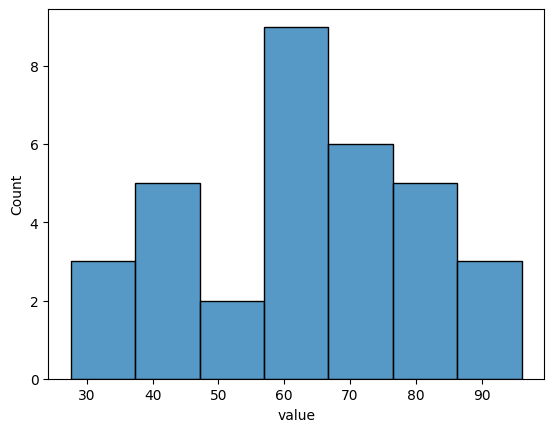

In [ ]:
sns.histplot(data=df_diff, x="value")


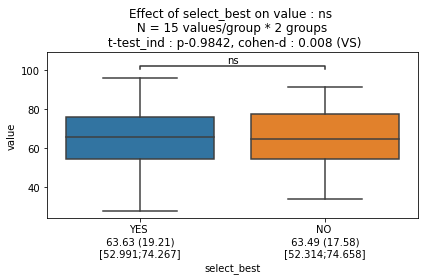

In [ ]:
predictor = 'select_best' 
outcome = 'value'
df_stats = df_diff
fig, ax = plt.subplots()
ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True)
plt.tight_layout()

## A2

In [ ]:
data = {'sujet' : [], 'MECA' : [], 'CO2' : []}

for sujet in sujet_list_rev:

    data['sujet'].append(sujet)

    for cond in ['MECA', 'CO2']:

        diff = df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values - df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '+'")['value'].values
        data[cond].append(diff[0])

df_sujet_diff_value_selection = pd.DataFrame(data)
df_sujet_diff_value_selection.sort_values('CO2', ascending=False)

,sujet,MECA,CO2
6,TA09,0.4,3.0
26,MA33,1.0,2.8
17,ZV21,0.2,2.0
22,SC29,1.8,1.4
19,TJ24,-0.6,1.4
13,GM16,0.0,1.2
9,BD12,0.2,0.6
15,TM19,0.2,0.6
24,HJ31,-0.8,0.6
20,MN26,0.8,0.4


In [ ]:
# BEST SUJET
cond = 'CO2'
df_A2['sujet'].unique()[df_A2.query(f"cond == '{cond}' and session == '+'")['value'].values < df_A2.query(f"cond == '{cond}' and session == 'o'")['value'].values]


array(['BD12', 'CM32', 'FA11', 'GM16', 'HJ31', 'JR17', 'MA33', 'MN26',
       'PD01', 'SC29', 'TA09', 'TJ24', 'TM19', 'VN03', 'ZV21'],
      dtype=object)

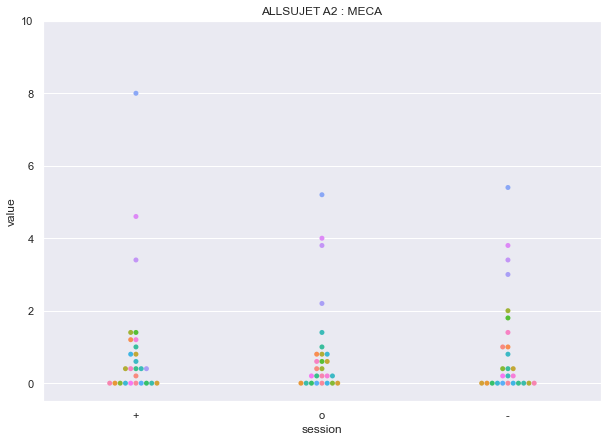

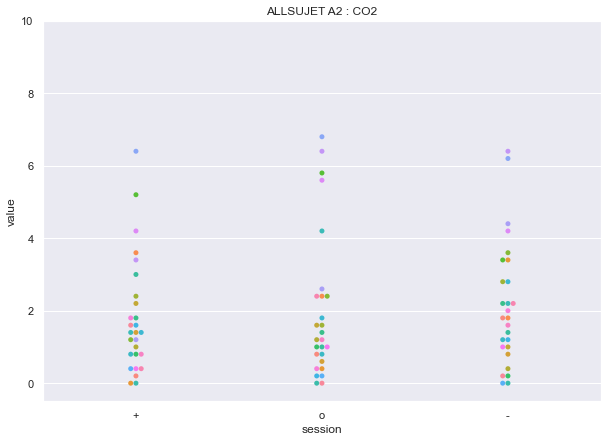

In [ ]:
for cond in ['MECA', 'CO2']:
    
    fig, ax = plt.subplots()
    df_plot = df_A2.query(f"cond == '{cond}'")
    sns.swarmplot(data=df_plot, x="session", y="value", hue="sujet", ax=ax, order=['+', 'o', '-'])
    plt.ylim(-0.5,10)
    plt.legend([],[], frameon=False)
    plt.title(f'ALLSUJET A2 : {cond}')
    sns.set(rc={'figure.figsize':(10,7)})

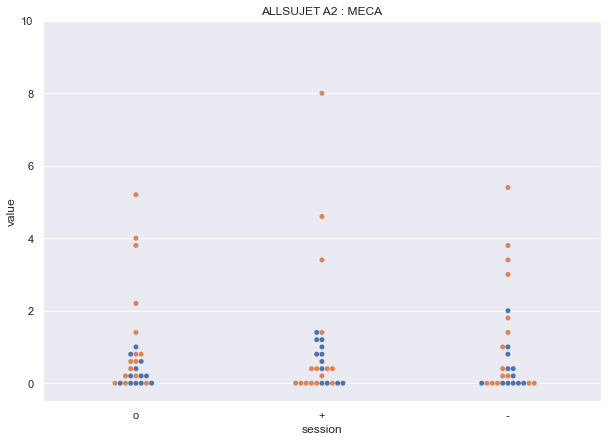

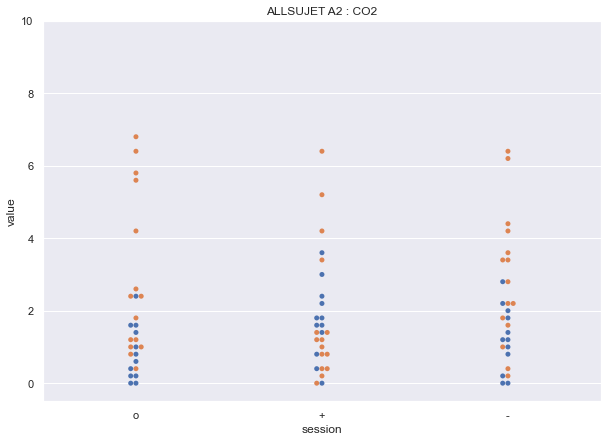

In [ ]:
for cond in ['MECA', 'CO2']:
    
    fig, ax = plt.subplots()
    df_plot = df_A2_repnorep.query(f"cond == '{cond}'")
    sns.swarmplot(data=df_plot, x="session", y="value", hue="select_best", ax=ax, order=['o', '+', '-'])
    plt.ylim(-0.5,10)
    plt.legend([],[], frameon=False)
    plt.title(f'ALLSUJET A2 : {cond}')
    sns.set(rc={'figure.figsize':(10,7)})

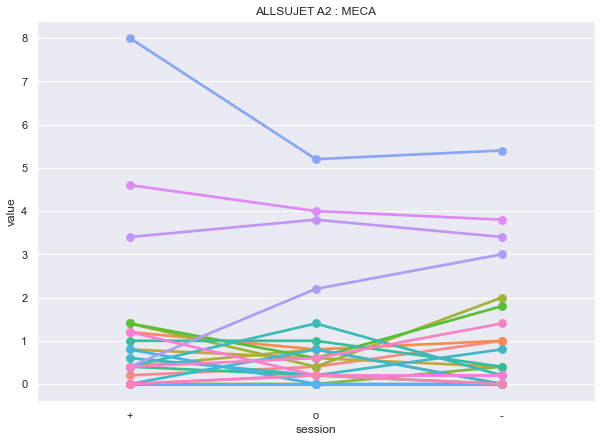

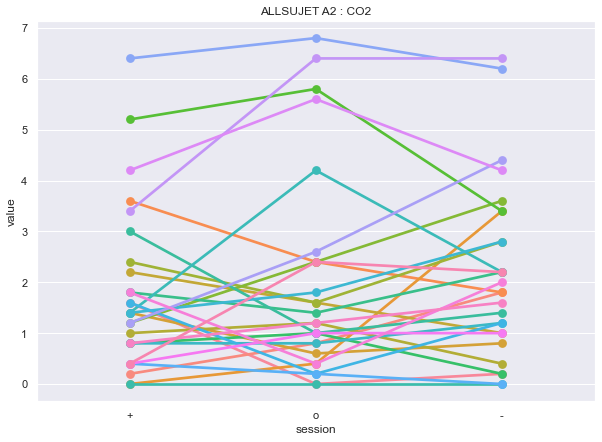

In [ ]:
for cond in ['MECA', 'CO2']:
    
    fig, ax = plt.subplots()
    df_plot = df_A2.query(f"cond == '{cond}'")
    sns.pointplot(data=df_plot, x="session", y="value", hue="sujet", ax=ax, order=['+', 'o', '-'])
    plt.legend([],[], frameon=False)
    plt.title(f'ALLSUJET A2 : {cond}')
    sns.set(rc={'figure.figsize':(10,7)})

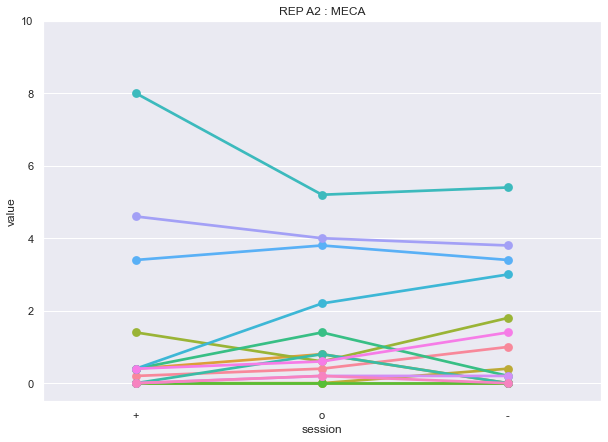

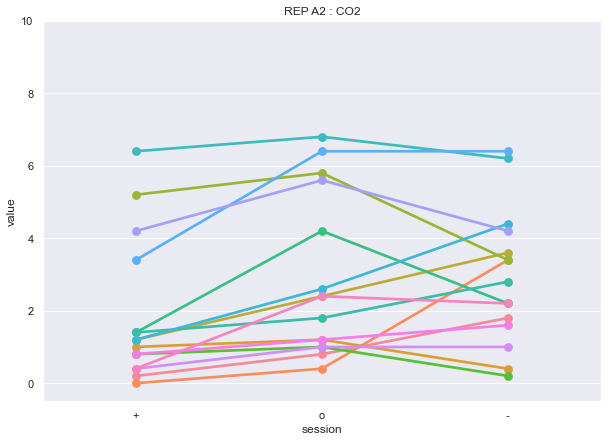

In [ ]:
for cond in ['MECA', 'CO2']:
    
    fig, ax = plt.subplots()
    df_plot = df_A2.query(f"cond == '{cond}' and sujet in {sujet_best_list.tolist()}")
    sns.pointplot(data=df_plot, x="session", y="value", hue="sujet", ax=ax, order=['+', 'o', '-'])
    plt.ylim(-0.5, 10)
    plt.legend([],[], frameon=False)
    plt.title(f'REP A2 : {cond}')
    sns.set(rc={'figure.figsize':(10,7)})

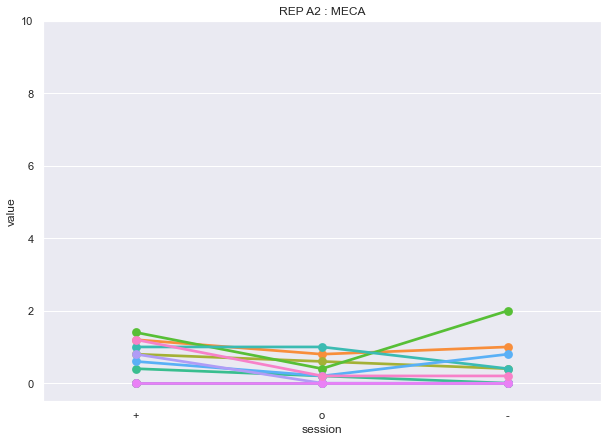

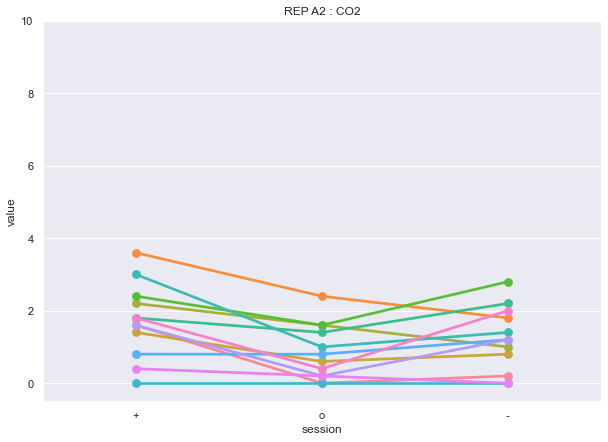

In [ ]:
for cond in ['MECA', 'CO2']:
    
    fig, ax = plt.subplots()
    df_plot = df_A2.query(f"cond == '{cond}' and sujet in {sujet_no_respond.tolist()}")
    sns.pointplot(data=df_plot, x="session", y="value", hue="sujet", ax=ax, order=['+', 'o', '-'])
    plt.ylim(-0.5, 10)
    plt.legend([],[], frameon=False)
    plt.title(f'REP A2 : {cond}')
    sns.set(rc={'figure.figsize':(10,7)})

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

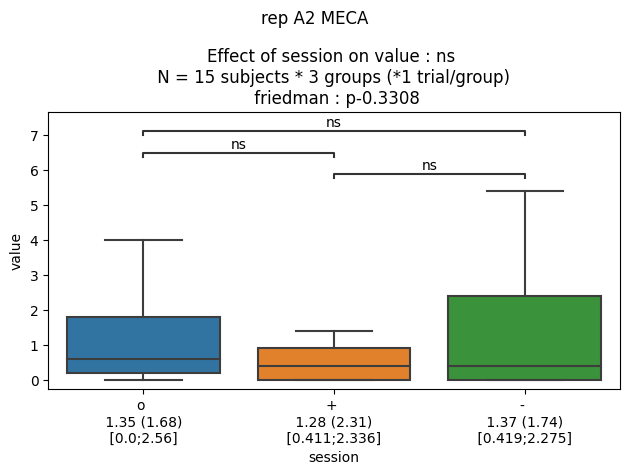

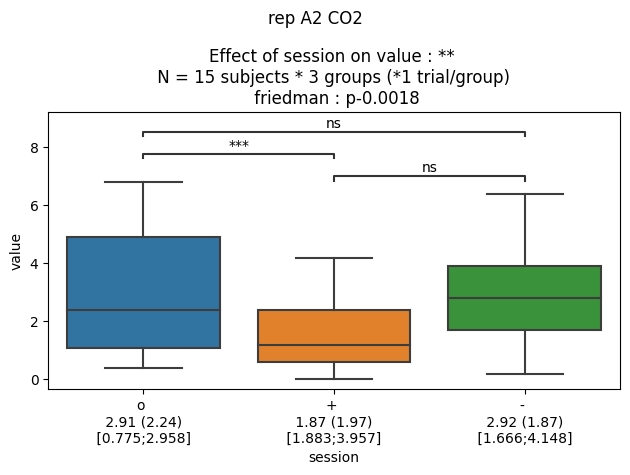

In [28]:
predictor = 'session' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    df_stats = df_A2.query(f"cond == '{cond}' and sujet in {sujet_best_list.tolist()}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"rep A2 {cond}")
    plt.tight_layout()

In [29]:
predictor = 'session' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    df_stats = df_A2.query(f"cond == '{cond}' and sujet in {sujet_best_list.tolist()}")
    os.chdir(os.path.join(path_results, 'allplot', 'stats', 'psycho'))
    get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='within', transform=False, verbose=True).to_excel(f'MDP_A2_rep_{cond}_PRED_{predictor}_OUTCOME_val.xlsx')



/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switchi

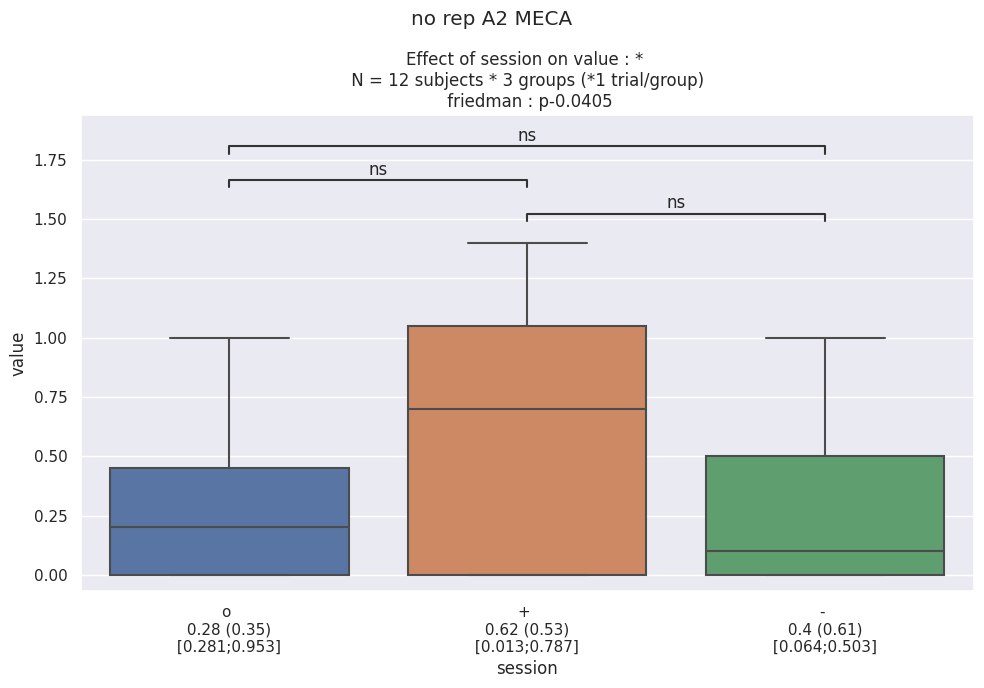

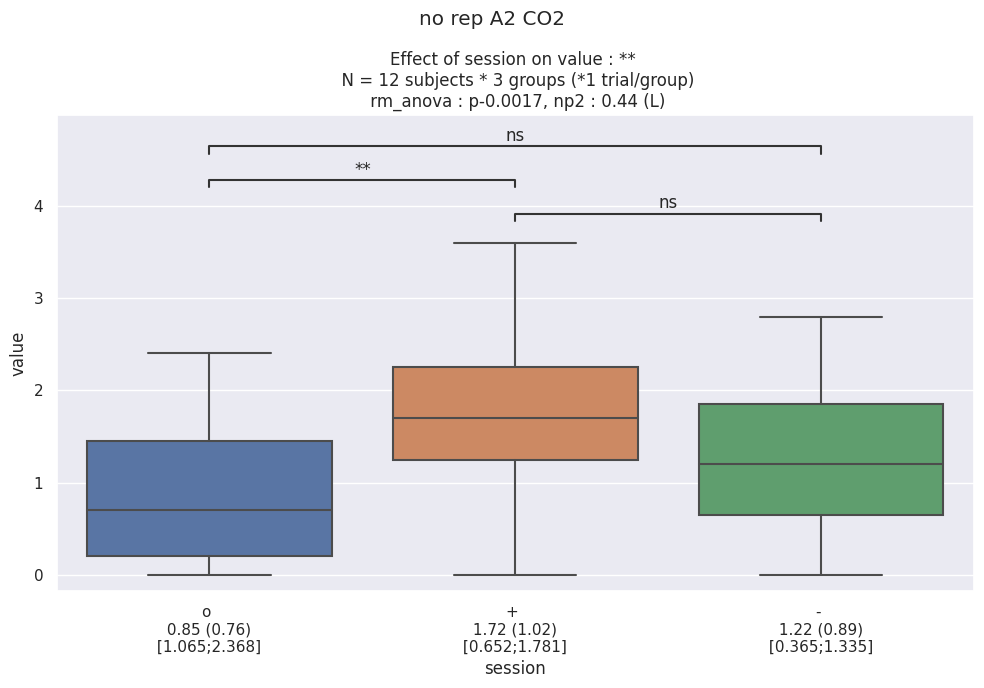

In [ ]:
predictor = 'session' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    df_stats = df_A2.query(f"cond == '{cond}' and sujet in {sujet_no_respond.tolist()}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"no rep A2 {cond}")
    plt.tight_layout()

In [30]:
predictor = 'session' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    df_stats = df_A2.query(f"cond == '{cond}' and sujet in {sujet_no_respond.tolist()}")
    os.chdir(os.path.join(path_results, 'allplot', 'stats', 'psycho'))
    get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='within', transform=False, verbose=True).to_excel(f'MDP_A2_norep_{cond}_PRED_{predictor}_OUTCOME_val.xlsx')


/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/pingouin/parametric.py:551: FutureWarning: Not prepending group keys to the result index of transform-like apply. In the future, the group keys will be included in the index, regardless of whether the applied function returns a like-indexed object.
To preserve the previous behavior, use

	>>> .groupby(..., group_keys=False)

To adopt the future behavior and silence this warning, use 

	>>> .groupby(..., group_keys=True)
  ss_resall = grp_with.apply(lambda x: (x - x.mean()) ** 2).sum()


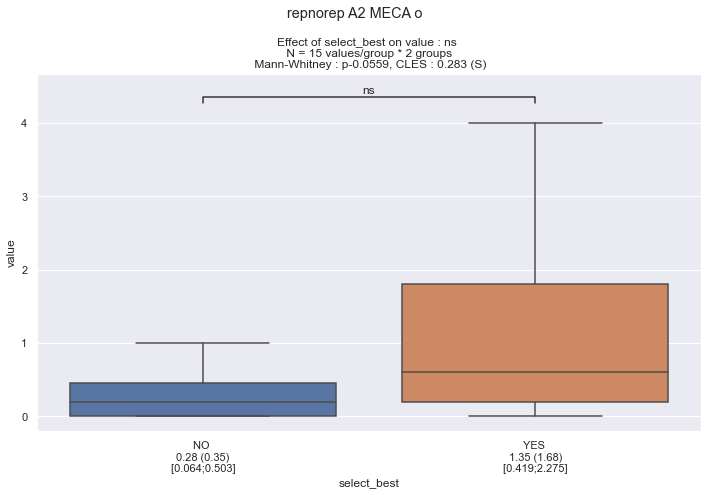

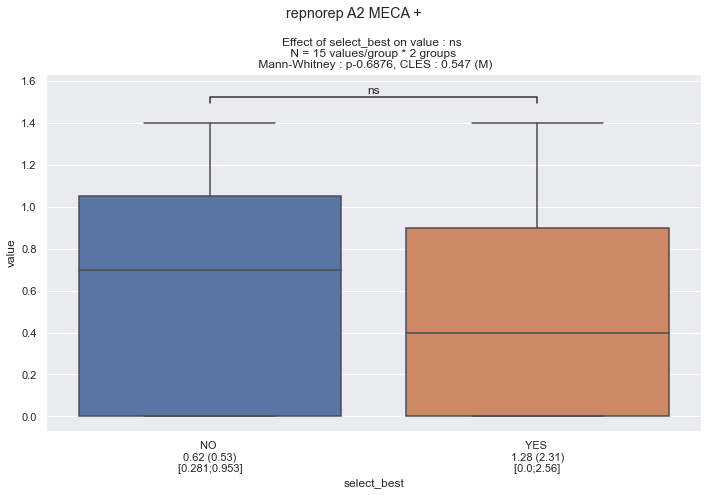

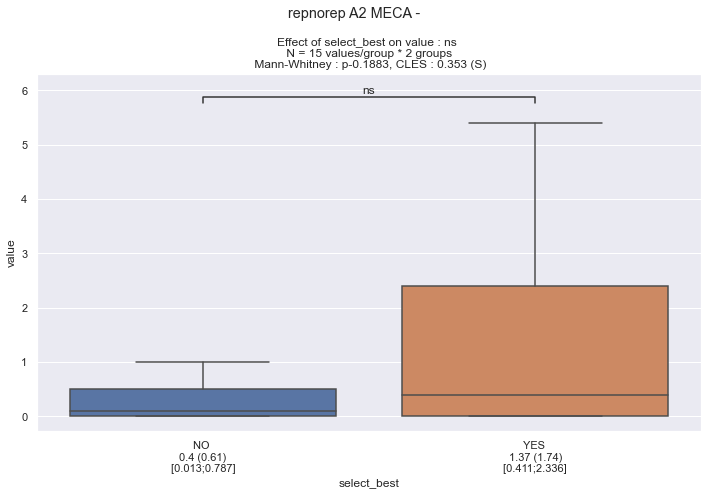

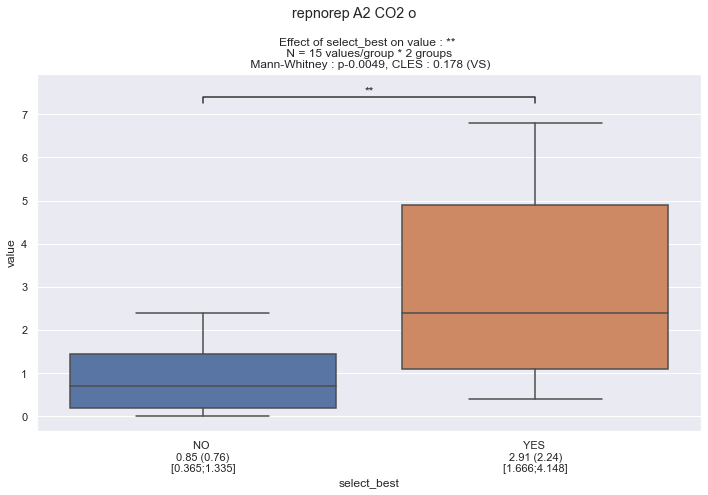

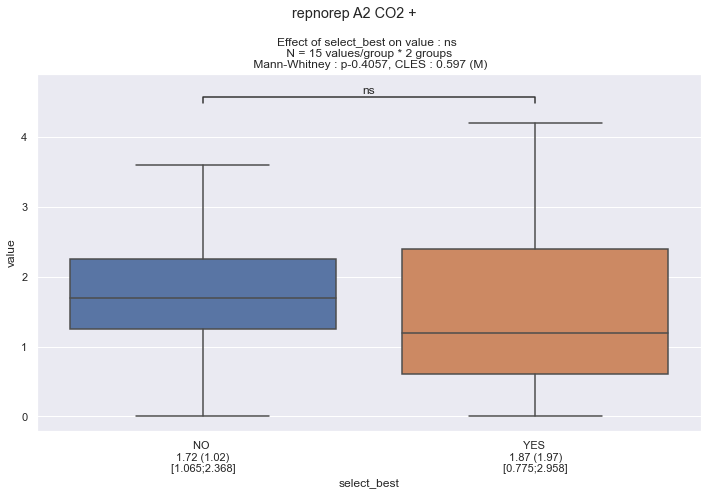

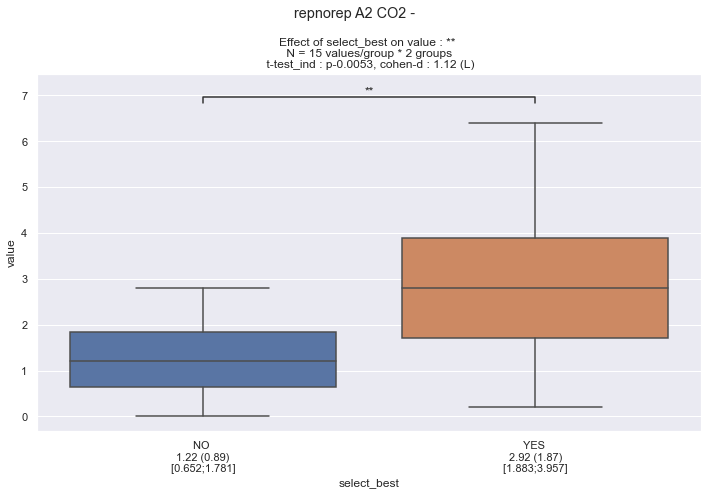

In [ ]:
predictor = 'select_best' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    for odor in odor_list:
        df_stats = df_A2_repnorep.query(f"cond == '{cond}' and session == '{odor}'")
        fig, ax = plt.subplots()
        ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True)
        plt.suptitle(f"repnorep A2 {cond} {odor}")
        plt.tight_layout()

In [24]:

predictor = 'select_best' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    for odor in odor_list:
        df_stats = df_A2_repnorep.query(f"cond == '{cond}' and session == '{odor}'")
        os.chdir(os.path.join(path_results, 'allplot', 'stats', 'psycho'))
        get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='between', transform=False, verbose=True).to_excel(f'MDP_A2_repnorep_PRED_{predictor}_OUTCOME_{cond}{odor}.xlsx')


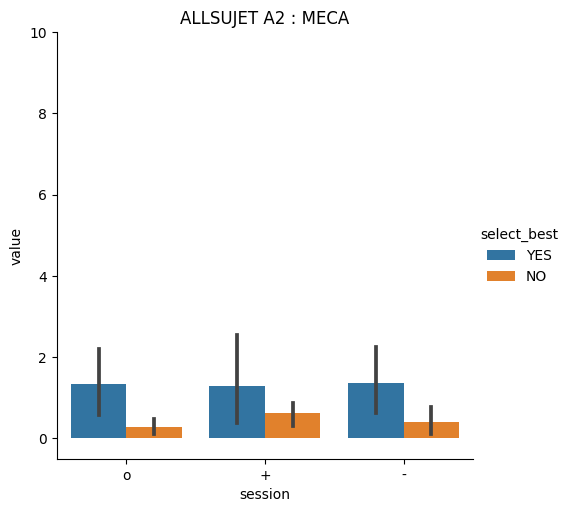

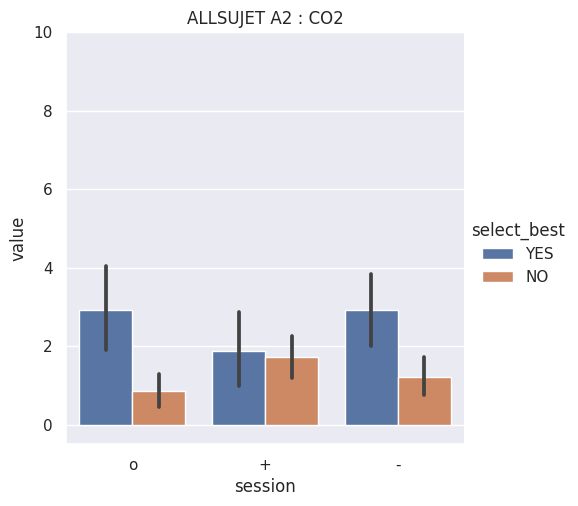

In [ ]:
for cond in ['MECA', 'CO2']:
    
    df_plot = df_A2_repnorep.query(f"cond == '{cond}'")
    sns.catplot(data=df_plot, kind='bar', x="session", y="value", hue="select_best", order=['o', '+', '-'], hue_order=['YES', 'NO'])
    plt.title(f'ALLSUJET A2 : {cond}')
    plt.ylim(-0.5,10)
    sns.set(rc={'figure.figsize':(10,7)})
    plt.show()



## A1

In [33]:
df_mdp_A1A2

,sujet,session,cond,A1,A2,select_best
0,AR30,+,CO2,7.0,1.6,False
1,AR30,+,MECA,8.0,0.0,False
2,AR30,-,CO2,9.0,0.2,False
3,AR30,-,MECA,7.0,0.0,False
4,AR30,o,CO2,5.0,0.0,False
...,...,...,...,...,...,...
157,ZV21,+,MECA,7.0,0.0,True
158,ZV21,-,CO2,9.0,2.2,True
159,ZV21,-,MECA,8.0,0.0,True
160,ZV21,o,CO2,8.0,2.4,True


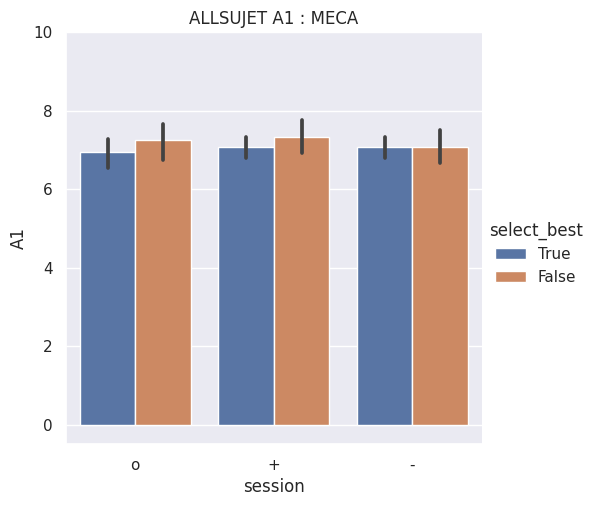

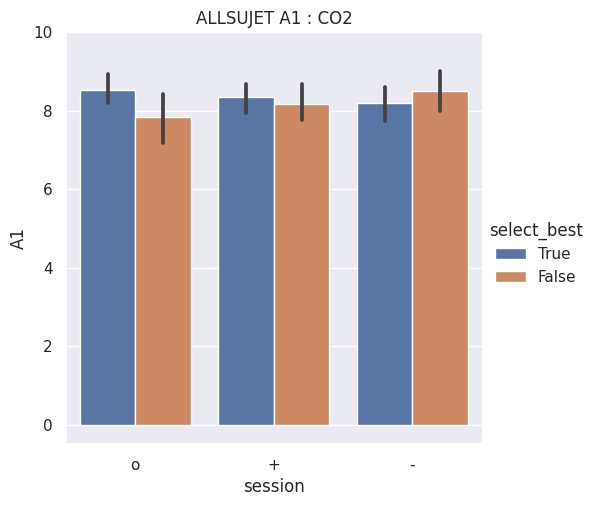

In [31]:
for cond in ['MECA', 'CO2']:
    
    df_plot = df_mdp_A1A2.query(f"cond == '{cond}'")
    sns.catplot(data=df_plot, kind='bar', x="session", y="A1", hue="select_best", order=['o', '+', '-'], hue_order=[True, False])
    plt.title(f'ALLSUJET A1 : {cond}')
    plt.ylim(-0.5,10)
    sns.set(rc={'figure.figsize':(10,7)})
    plt.show()


## VAS

In [36]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S,group,A1
0,01PD,o,49.315507,7.241427,7.188733,REP,9
1,03VN,o,54.132044,7.243436,6.856938,REP,7
2,05LV,o,68.663220,6.411272,6.203500,NO_REP,8
3,06EF,o,47.157457,6.038375,4.894141,NO_REP,7
4,07PB,o,65.216693,5.947063,3.555419,NO_REP,8
...,...,...,...,...,...,...,...
76,29SC,-,59.775720,6.322902,6.956098,REP,9
77,30AR,-,59.686274,7.858206,7.906425,NO_REP,9
78,31HJ,-,43.976907,6.370555,6.291526,REP,8
79,32CM,-,61.331429,5.377888,6.603407,REP,8


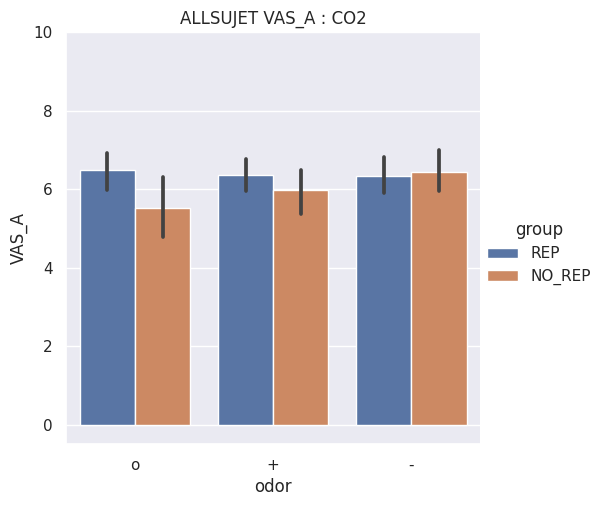

In [30]:
metric = 'VAS_A'

df_plot = df_CO2
sns.catplot(data=df_plot, kind='bar', x="odor", y=metric, hue="group", order=['o', '+', '-'], hue_order=['REP', 'NO_REP'])
plt.title(f'ALLSUJET {metric} : {cond}')
plt.ylim(-0.5,10)
sns.set(rc={'figure.figsize':(10,7)})
plt.show()


/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

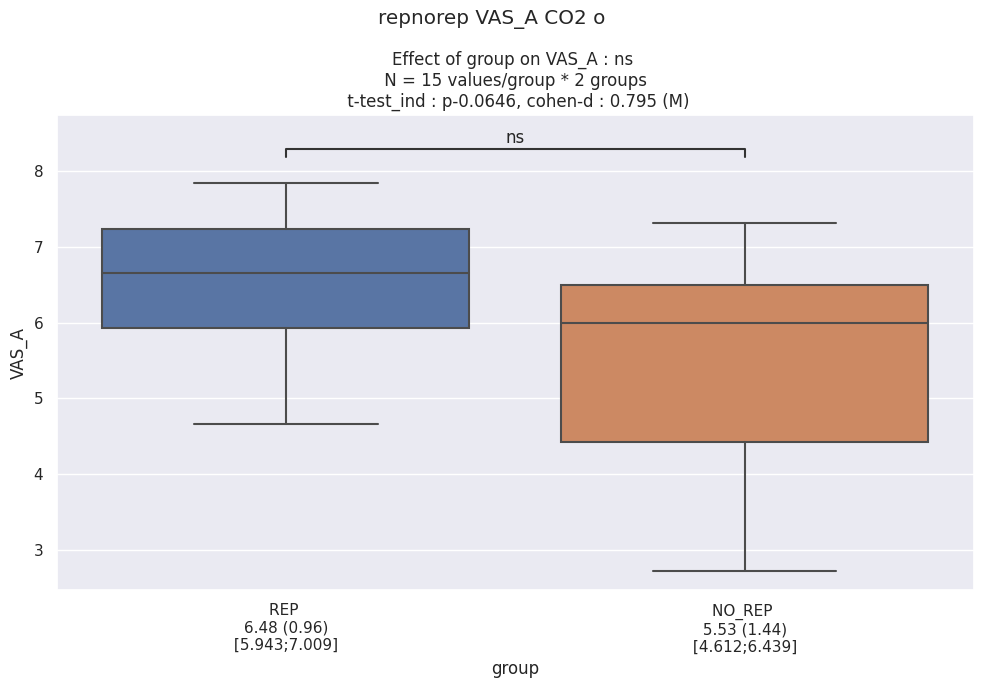

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

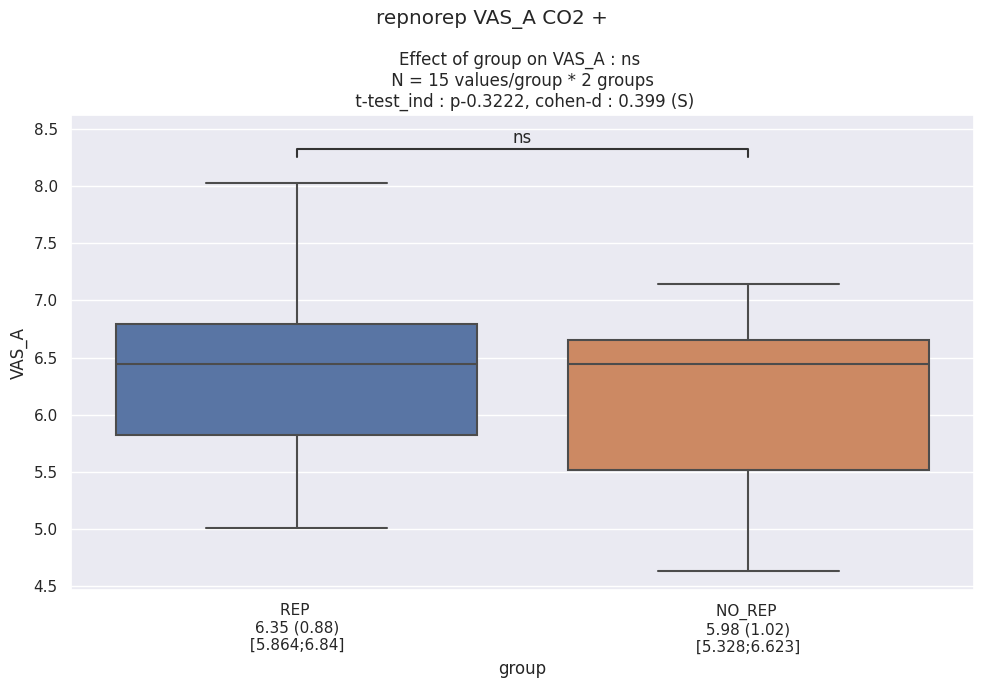

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

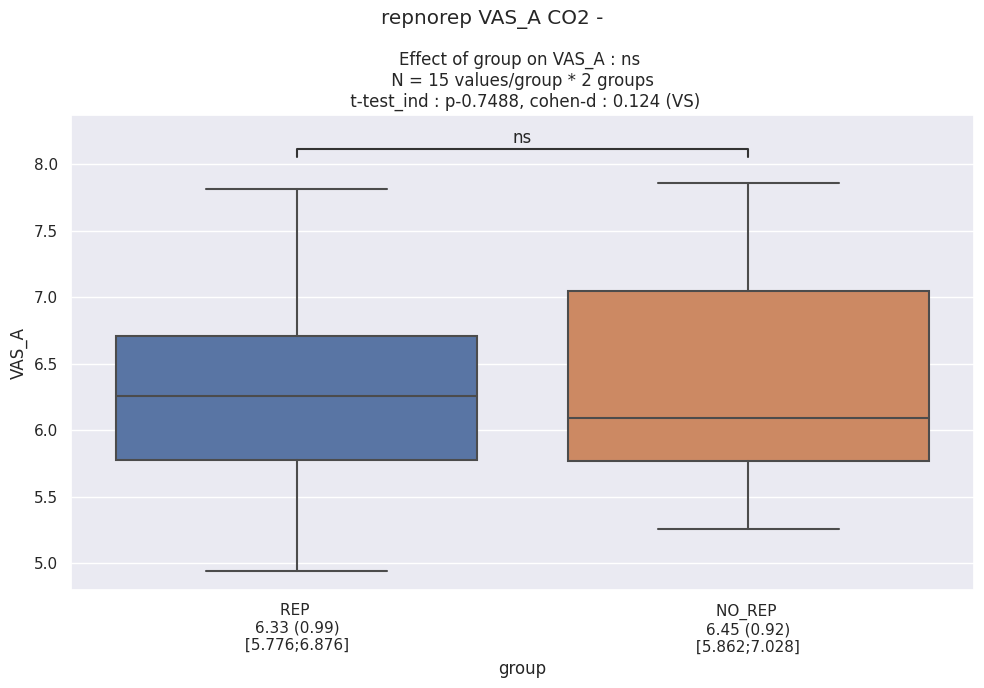

In [32]:
predictor = 'group' 
outcome = 'VAS_A'
for odor in odor_list:
    df_stats = df_CO2.query(f"odor == '{odor}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True)
    plt.suptitle(f"repnorep {outcome} {cond} {odor}")
    plt.tight_layout()
    plt.show()

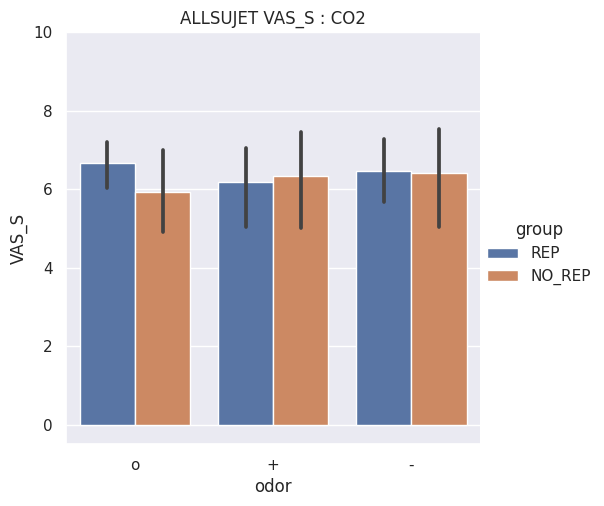

In [27]:
metric = 'VAS_S'

df_plot = df_CO2
sns.catplot(data=df_plot, kind='bar', x="odor", y=metric, hue="group", order=['o', '+', '-'], hue_order=['REP', 'NO_REP'])
plt.title(f'ALLSUJET {metric} : {cond}')
plt.ylim(-0.5,10)
sns.set(rc={'figure.figsize':(10,7)})
plt.show()

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

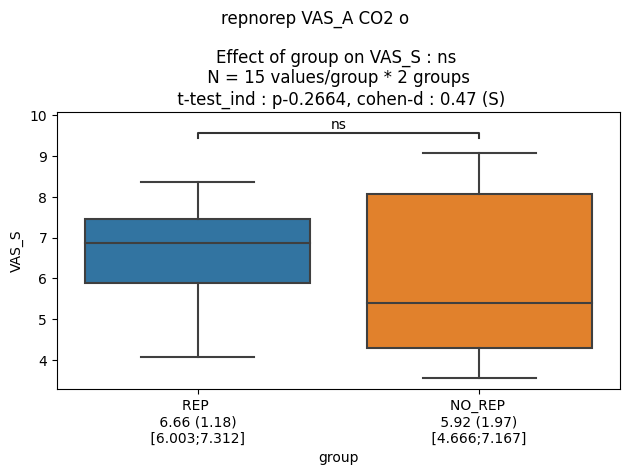

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

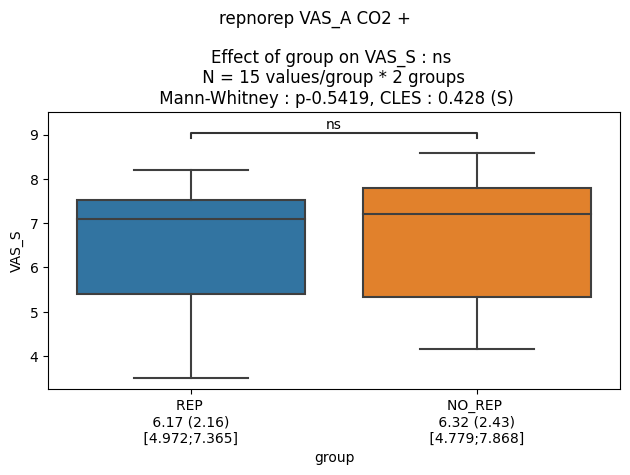

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

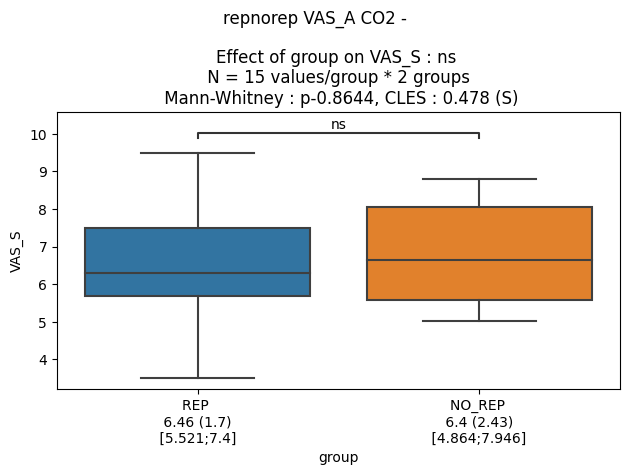

In [24]:
predictor = 'group' 
outcome = 'VAS_S'
for odor in odor_list:
    df_stats = df_CO2.query(f"odor == '{odor}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True)
    plt.suptitle(f"repnorep {outcome} {cond} {odor}")
    plt.tight_layout()
    plt.show()

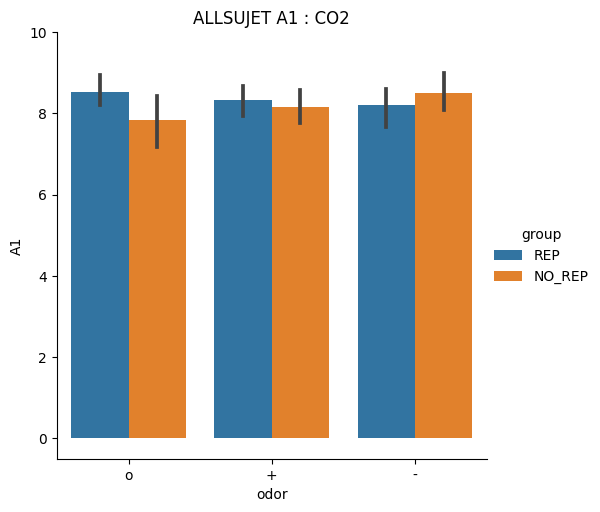

In [25]:
metric = 'A1'

df_plot = df_CO2
sns.catplot(data=df_plot, kind='bar', x="odor", y=metric, hue="group", order=['o', '+', '-'], hue_order=['REP', 'NO_REP'])
plt.title(f'ALLSUJET {metric} : {cond}')
plt.ylim(-0.5,10)
sns.set(rc={'figure.figsize':(10,7)})
plt.show()

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

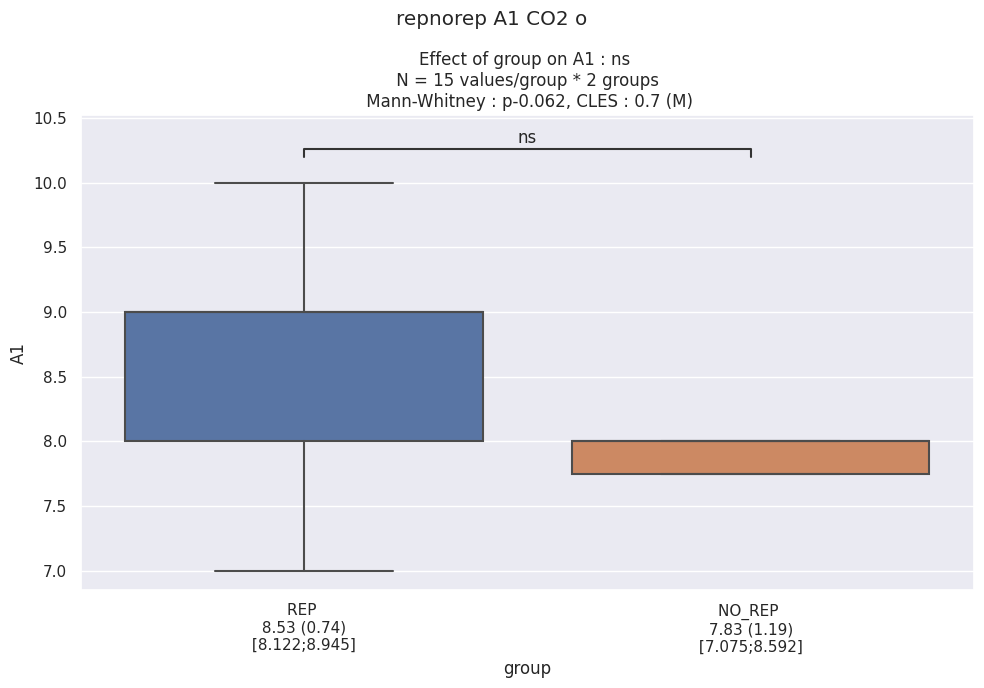

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

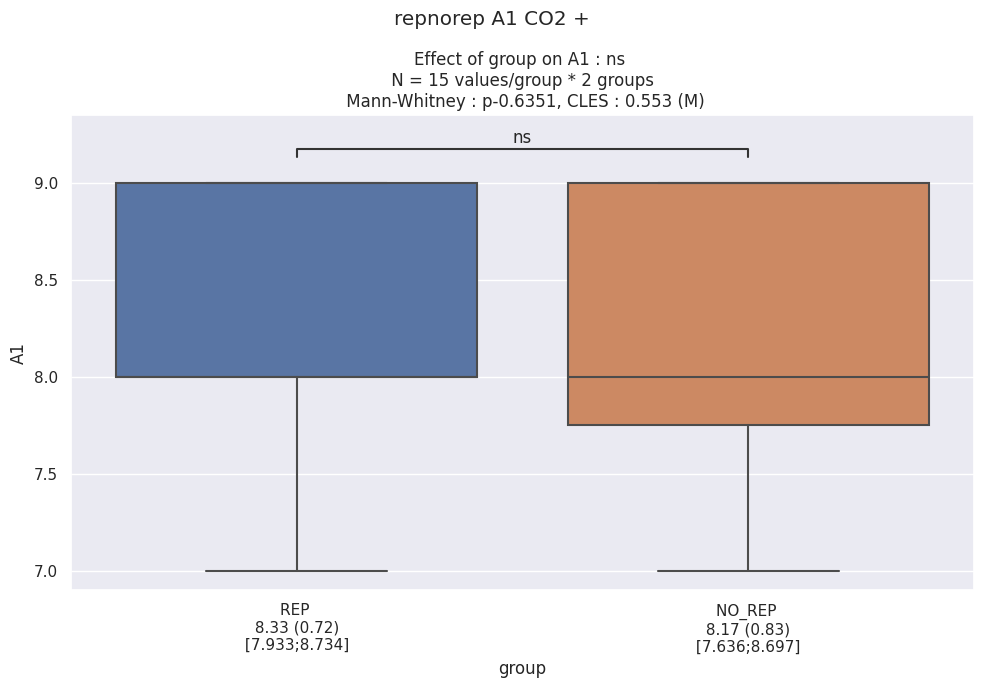

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

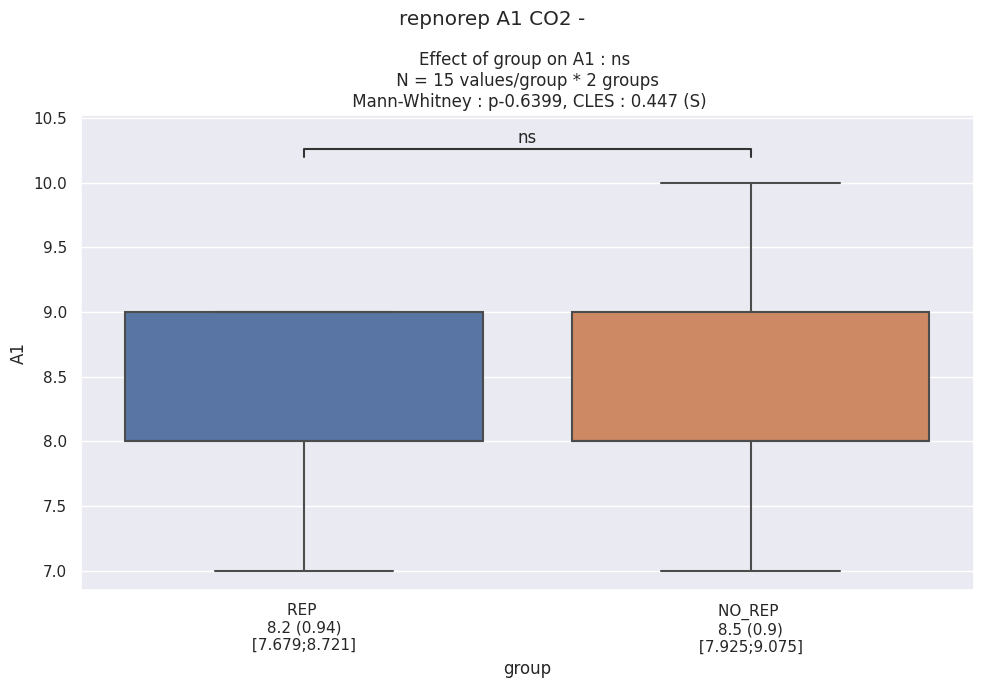

In [26]:
predictor = 'group' 
outcome = 'A1'
for odor in odor_list:
    df_stats = df_CO2.query(f"odor == '{odor}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True)
    plt.suptitle(f"repnorep {outcome} {cond} {odor}")
    plt.tight_layout()
    plt.show()

## RELAX

ValueError: Invalid RGBA argument: 0.24112152698689931

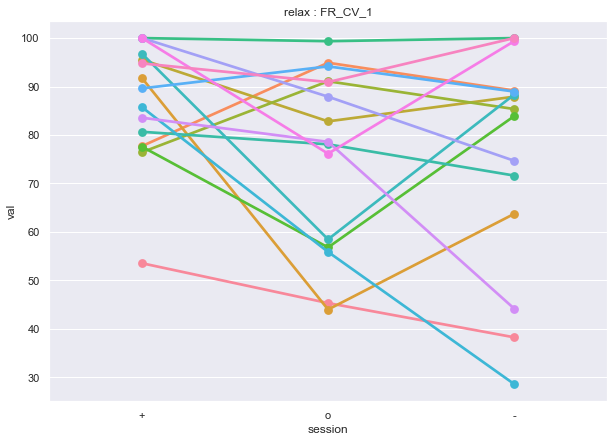

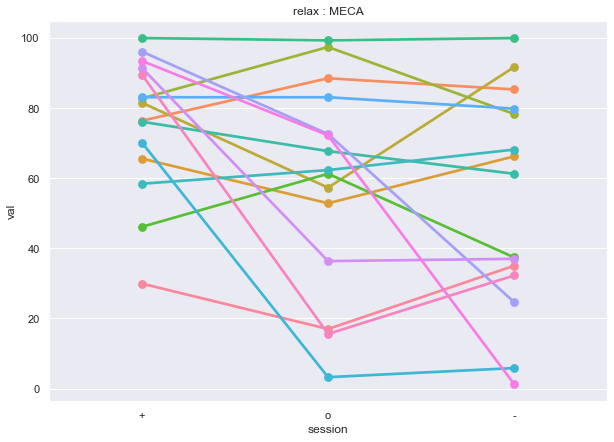

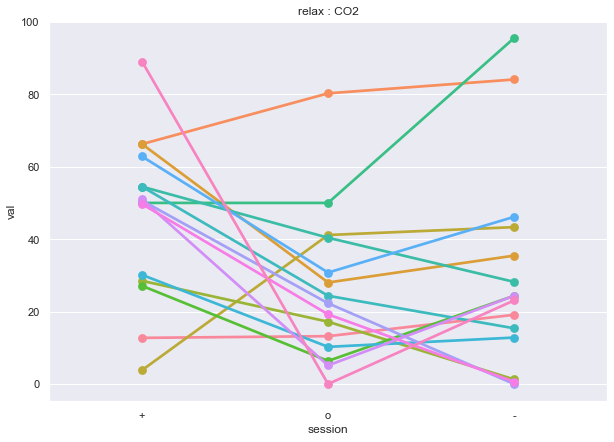

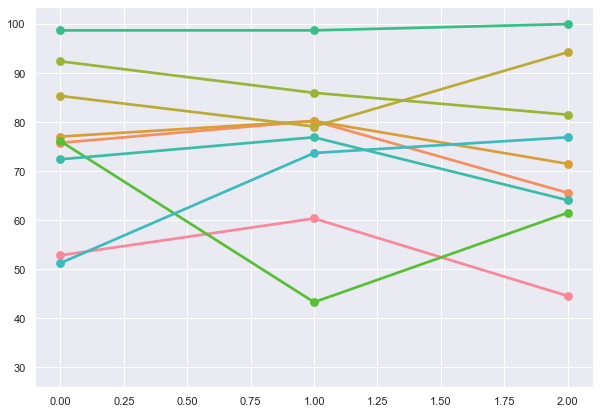

In [ ]:
for cond in conditions:

    fig, ax = plt.subplots()
    df_plot = df_relax.query(f"cond == '{cond}' and sujet in {sujet_best_list.tolist()}")
    sns.pointplot(data=df_plot, x="session", y="val", hue="sujet", ax=ax, order=['+', 'o', '-'])
    plt.legend([],[], frameon=False)
    plt.title(f'relax : {cond}')
    sns.set(rc={'figure.figsize':(10,7)})


/home/jules/anaconda3/lib/python3.8/site-packages/scipy/stats/_morestats.py:3145: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules/anaconda3/lib/python3.8/site-packages/scipy/stats/_morestats.py:3145: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


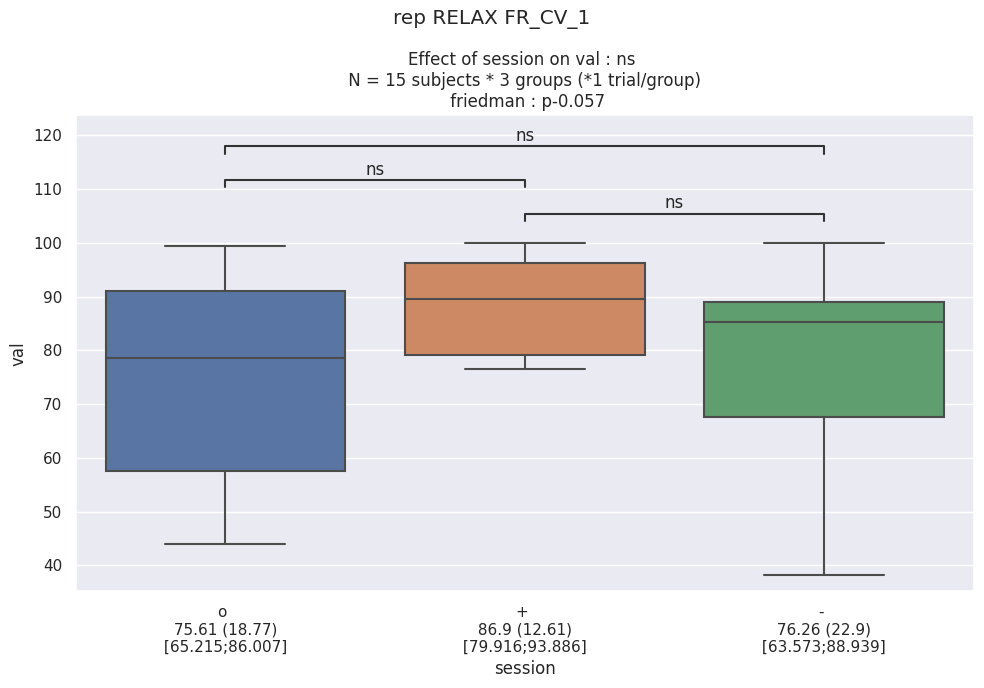

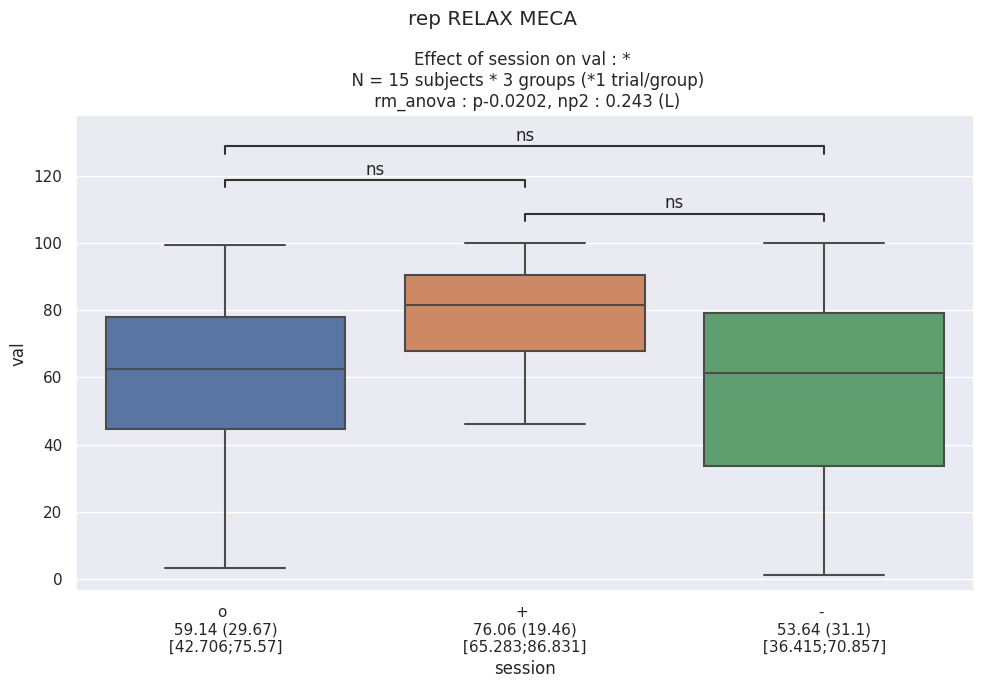

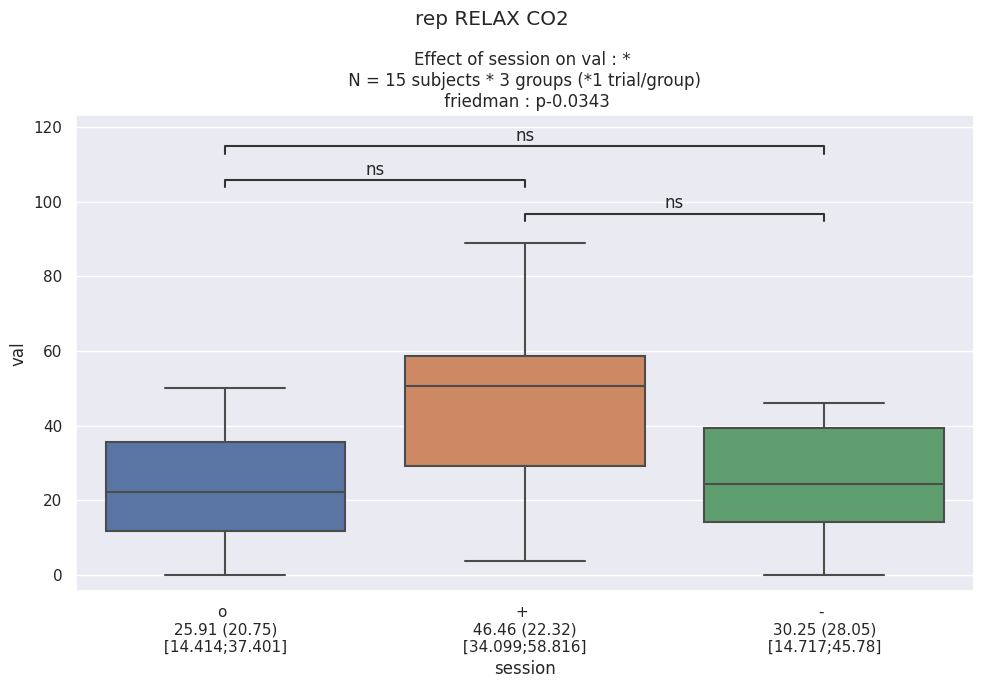

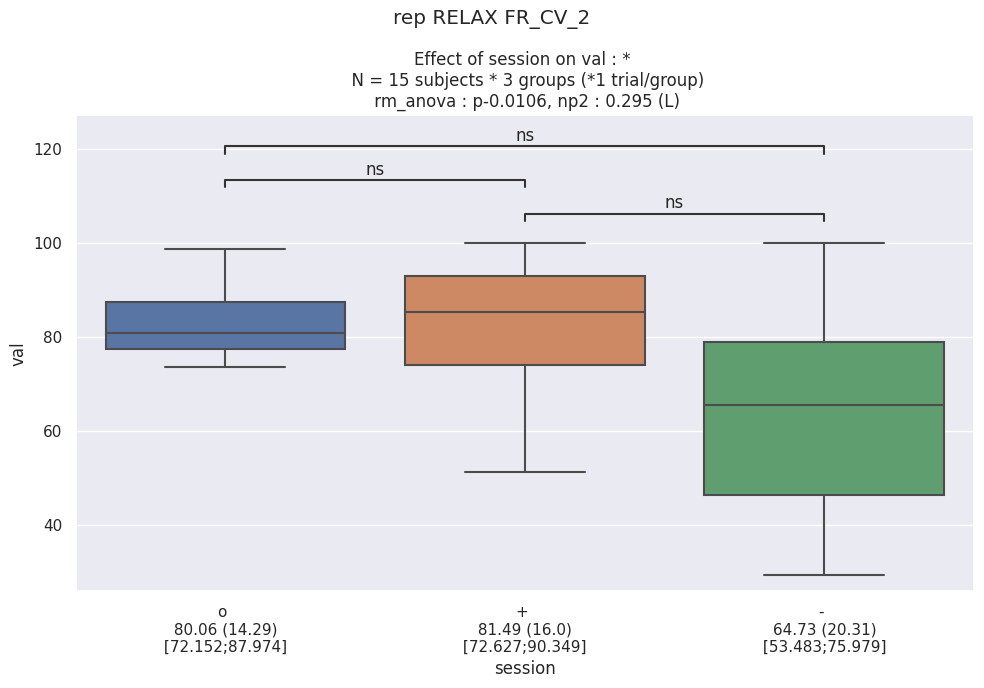

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_relax.query(f"cond == '{cond}' and sujet in {sujet_best_list.tolist()}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"rep RELAX {cond}")
    plt.tight_layout()

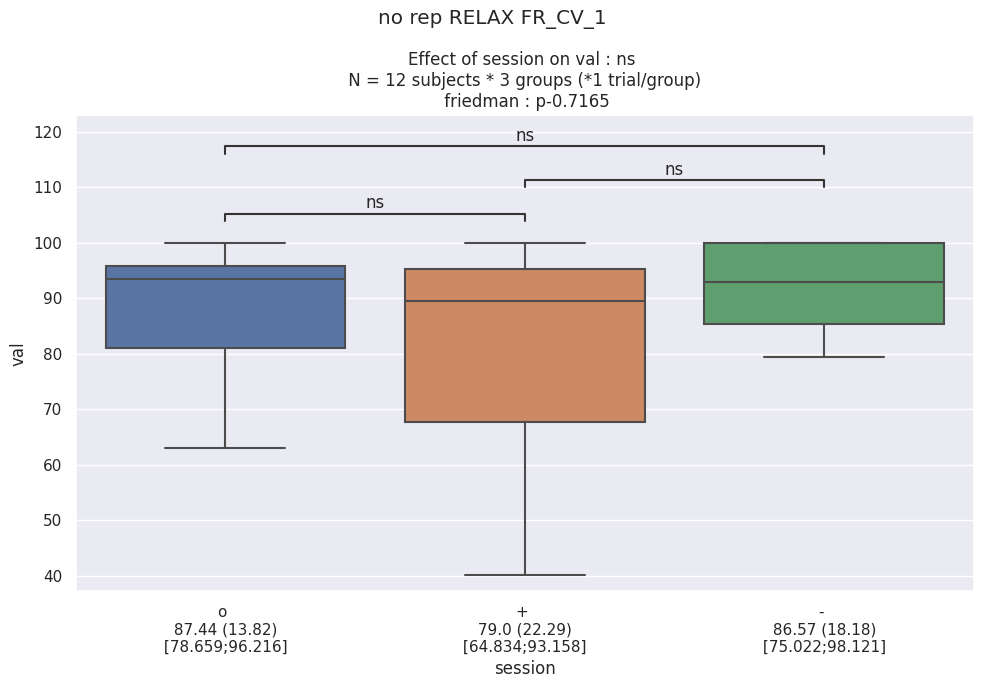

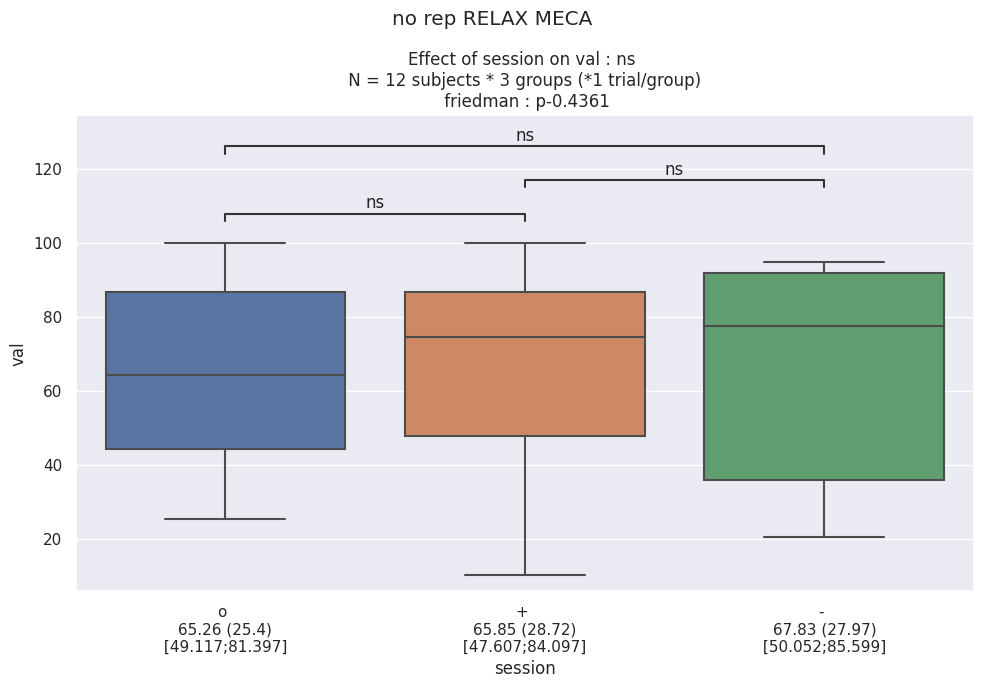

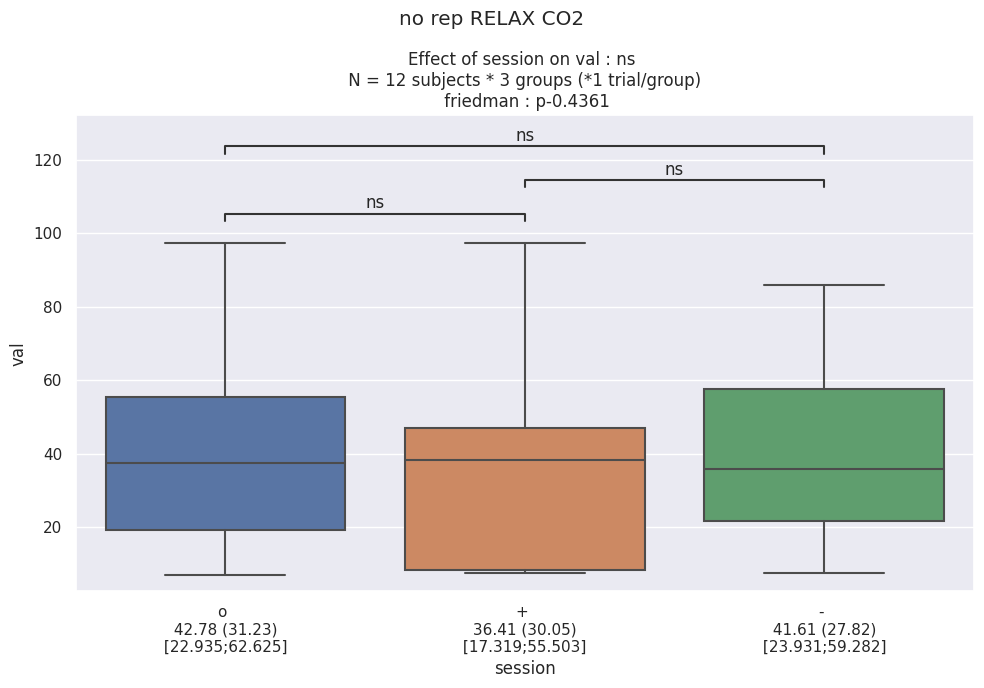

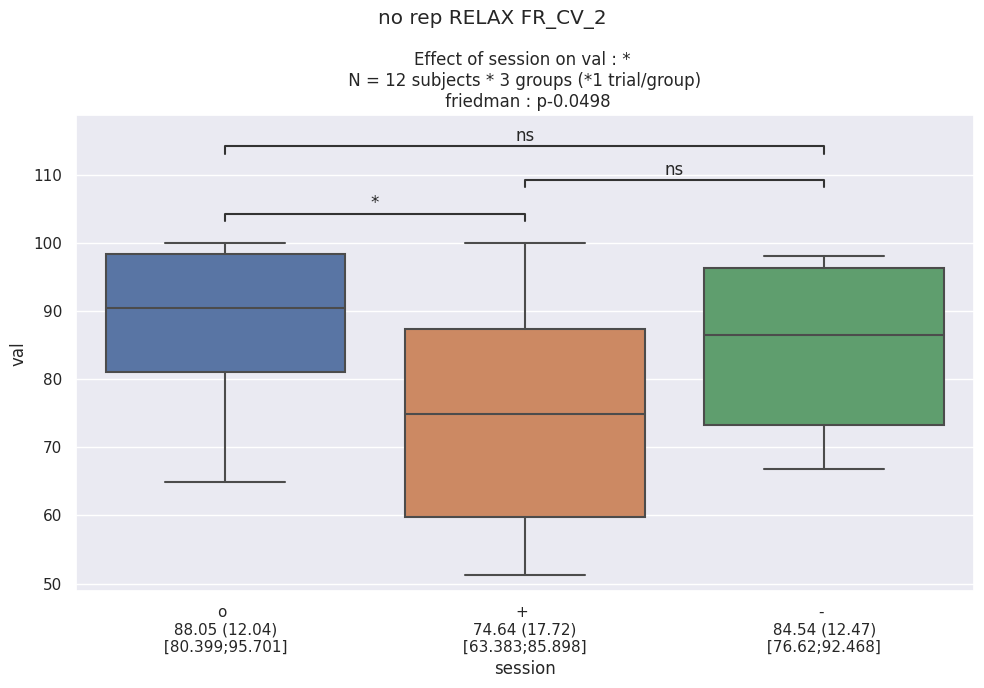

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_relax.query(f"cond == '{cond}' and sujet in {sujet_no_respond.tolist()}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"no rep RELAX {cond}")
    plt.tight_layout()

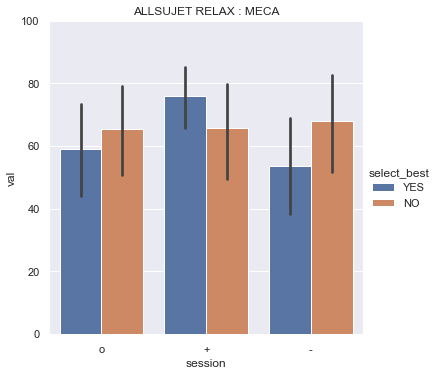

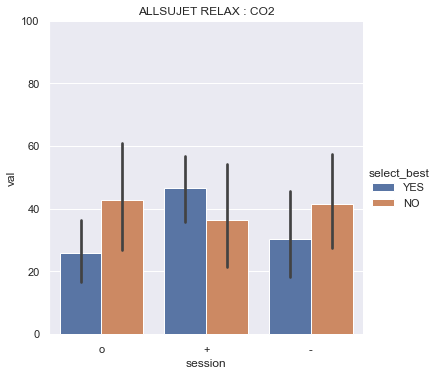

In [ ]:
for cond in ['MECA', 'CO2']:
    
    df_plot = df_relax_repnorep.query(f"cond == '{cond}'")
    sns.catplot(data=df_plot, kind='bar', x="session", y="val", hue="select_best", order=['o', '+', '-'])
    plt.title(f'ALLSUJET RELAX : {cond}')
    plt.ylim(-0.5,100)
    sns.set(rc={'figure.figsize':(10,7)})
    plt.show()

## STAI

/home/jules/anaconda3/lib/python3.8/site-packages/scipy/stats/_morestats.py:3145: UserWarning: Exact p-value calculation does not work if there are ties. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


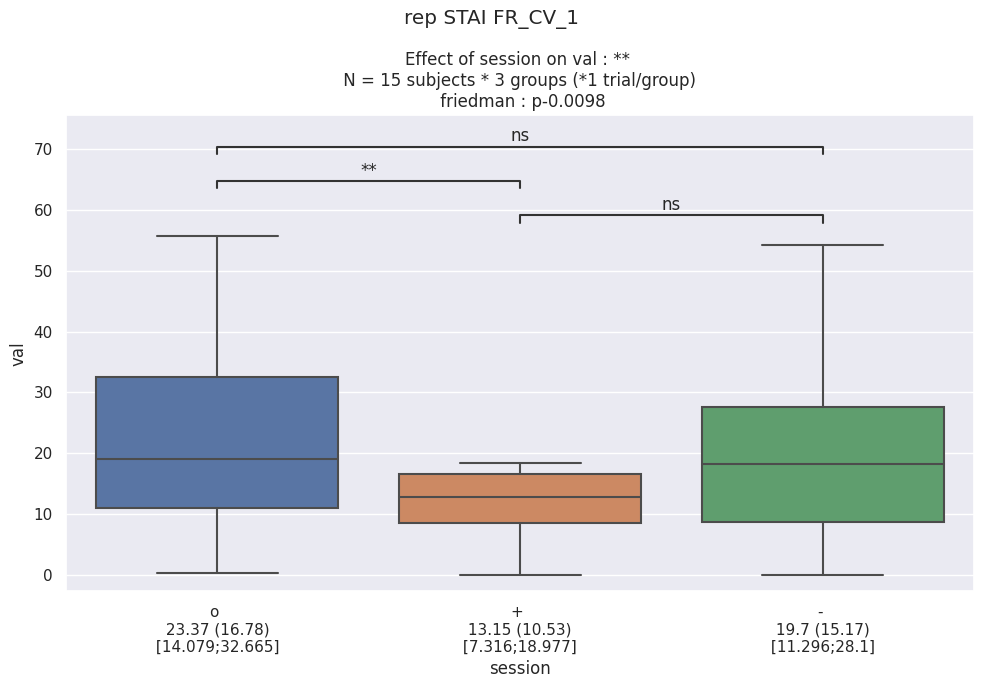

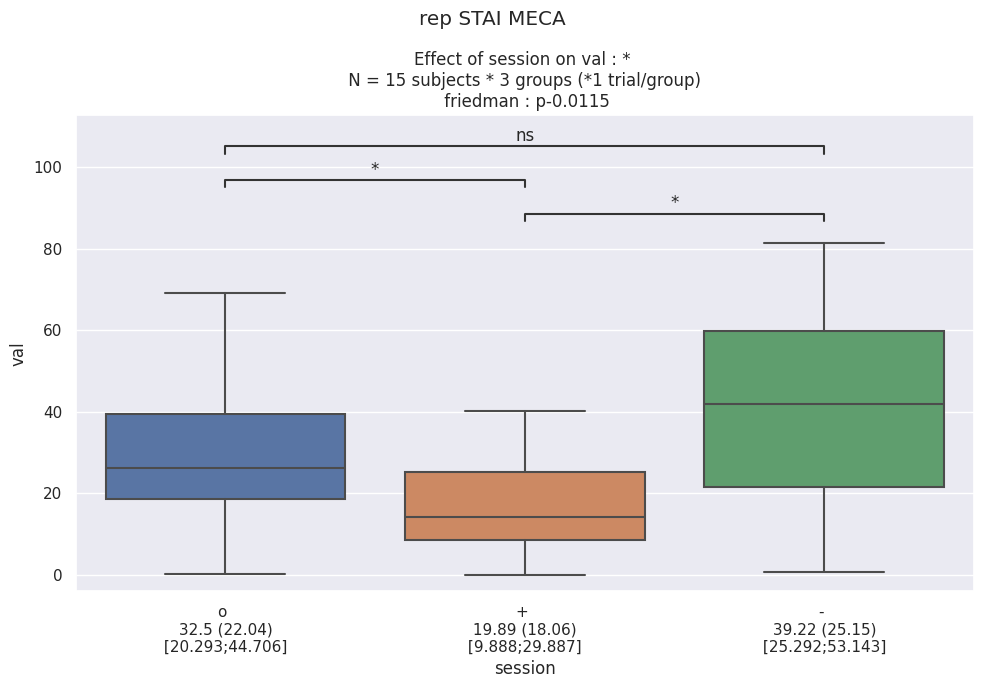

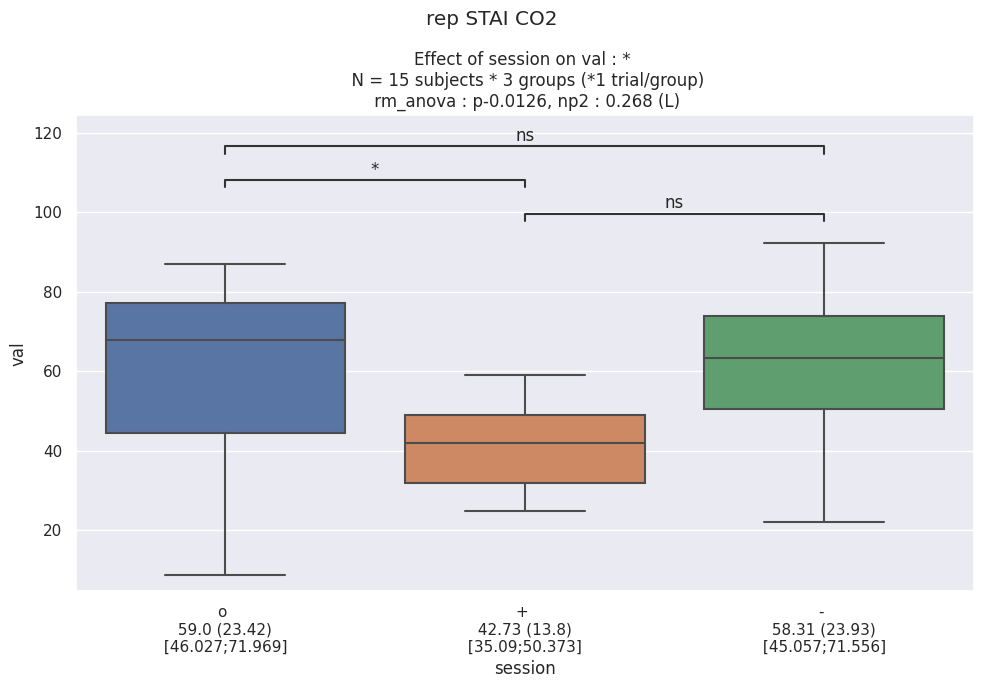

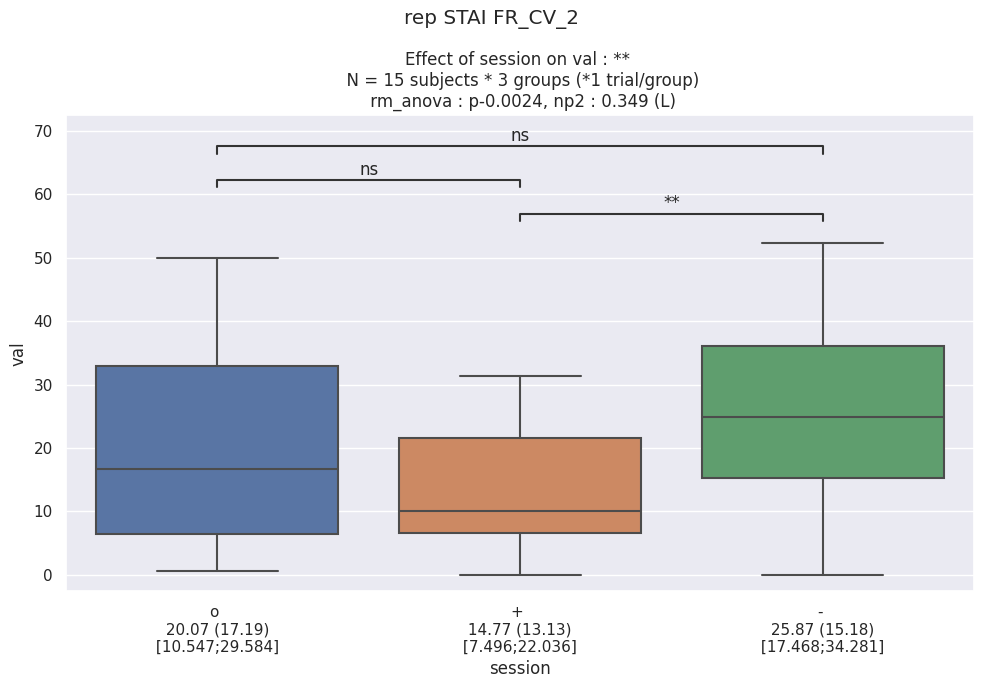

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_stai.query(f"cond == '{cond}' and sujet in {sujet_best_list.tolist()}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"rep STAI {cond}")
    plt.tight_layout()

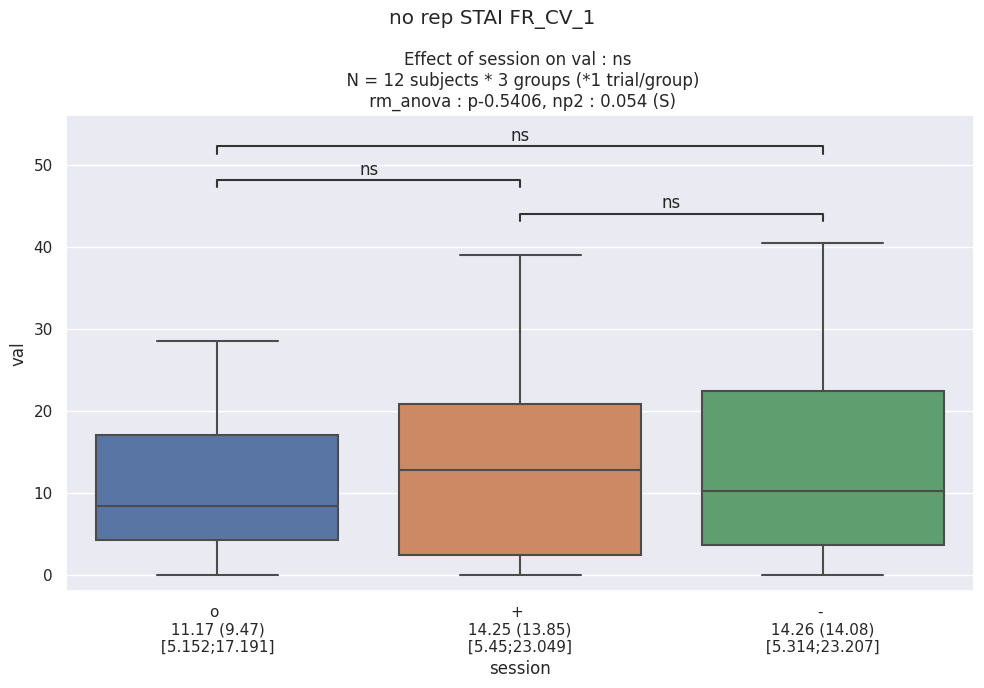

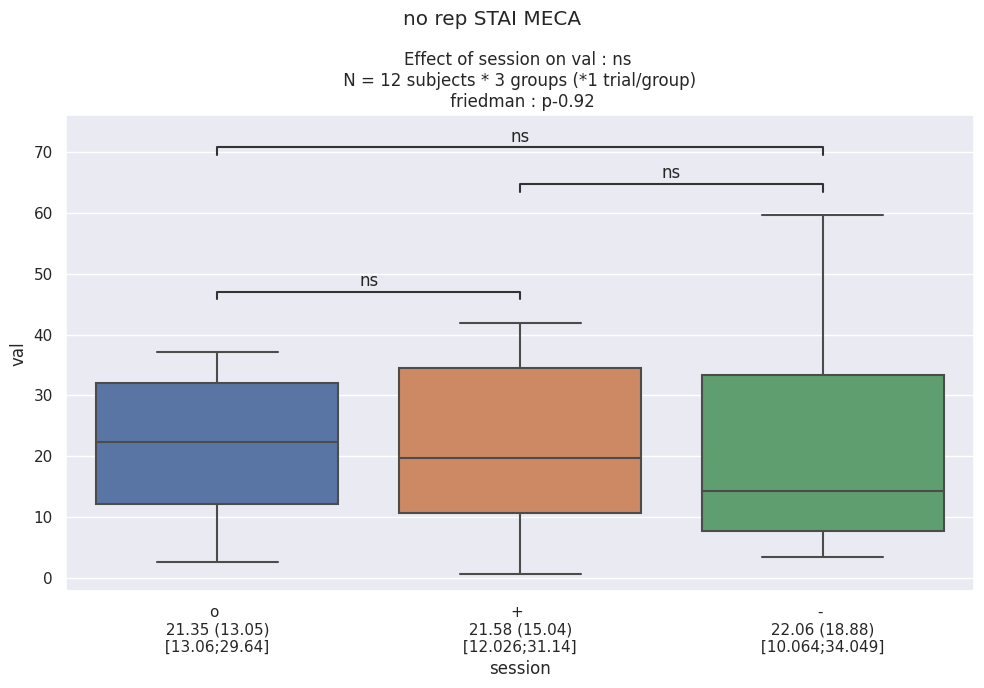

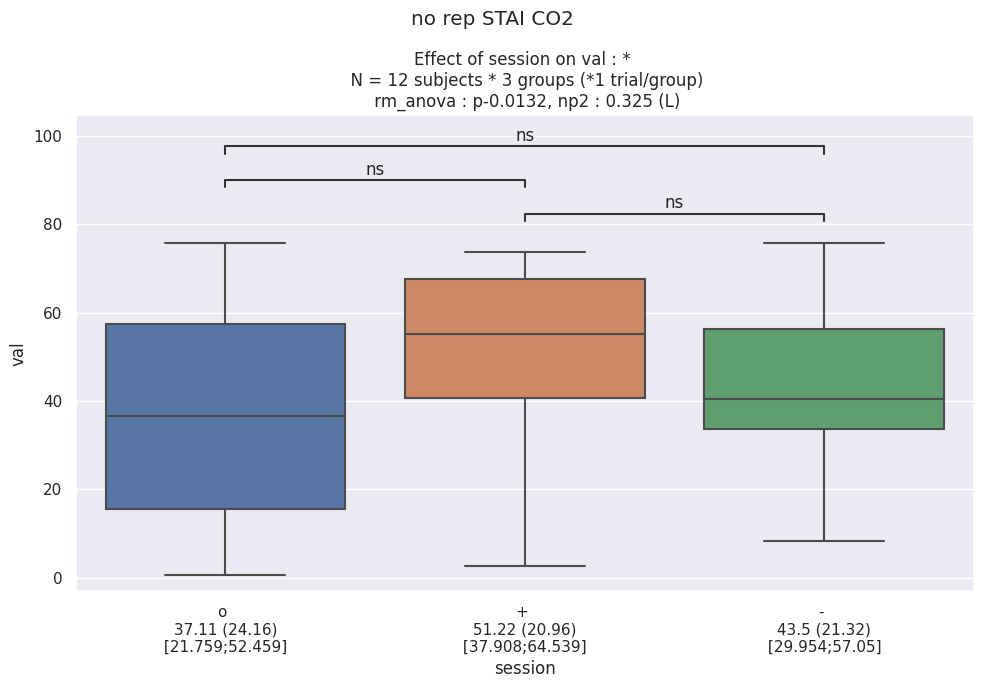

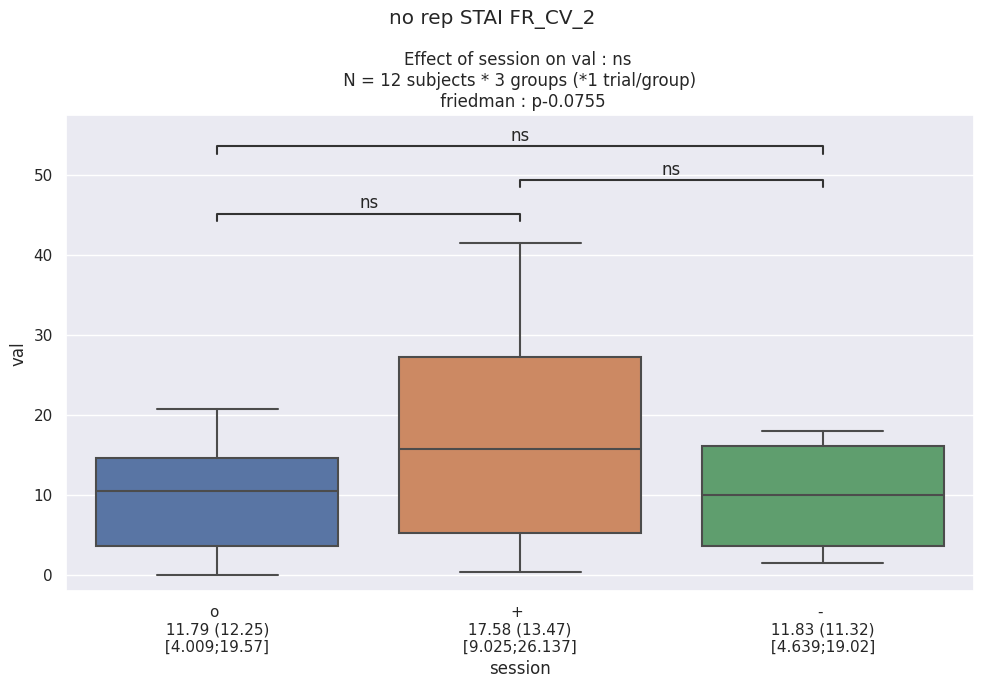

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_stai.query(f"cond == '{cond}' and sujet in {sujet_no_respond.tolist()}")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=['o', '+', '-'])
    plt.suptitle(f"no rep STAI {cond}")
    plt.tight_layout()

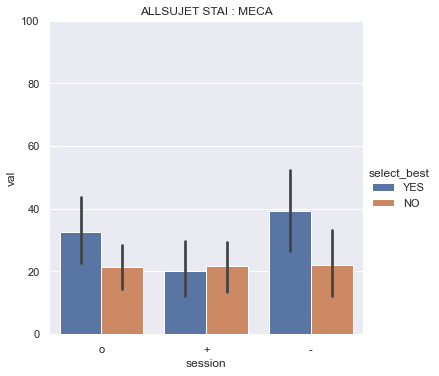

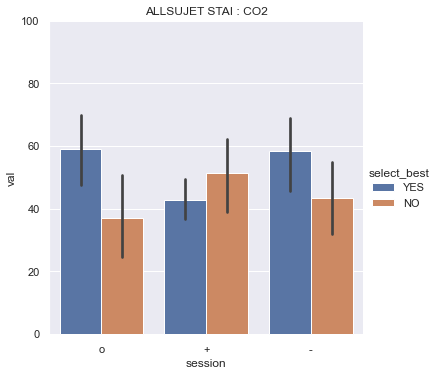

In [ ]:
for cond in ['MECA', 'CO2']:
    
    df_plot = df_stai_repnorep.query(f"cond == '{cond}'")
    sns.catplot(data=df_plot, kind='bar', x="session", y="val", hue="select_best", order=['o', '+', '-'])
    plt.title(f'ALLSUJET STAI : {cond}')
    plt.ylim(-0.5,100)
    sns.set(rc={'figure.figsize':(10,7)})
    plt.show()

## best sujet exploration

In [ ]:
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
0,PD01,appreciation,-,0.0,15.0,0.000000,YES
5,PD01,appreciation,+,14.6,15.0,97.333333,YES
8,PD01,eveil,+,9.9,15.0,66.000000,YES
11,PD01,eveil,-,14.8,15.0,98.666667,YES
12,PD01,familiarite,-,4.7,15.0,31.333333,YES
...,...,...,...,...,...,...,...
976,MA33,familiarite,+,12.5,12.5,100.000000,YES
978,MA33,intensite,+,5.4,12.5,43.200000,YES
983,MA33,intensite,-,12.5,12.5,100.000000,YES
984,MA33,evocation,-,0.0,12.5,0.000000,YES


In [ ]:
data = {'question' : [], 'odor' : [], 'pval' : []}

for question in df_odor_profile_filtered['question'].unique():
    
    for odor in ['+', '-']:

        df_stats = df_odor_profile_filtered.query(f"question == '{question}' and odor == '{odor}'")
        pval = get_stats_df(df=df_stats, predictor='select_best', outcome='value', subject='sujet', design='between')
        data['question'].append(question)
        data['pval'].append(pval)
        data['odor'].append(odor)

df_odor_profile_signi = pd.DataFrame(data)
df_odor_profile_signi

,question,odor,pval
0,appreciation,+,0.5736
1,appreciation,-,0.6586
2,eveil,+,0.9661
3,eveil,-,1.0000
4,familiarite,+,0.3651
5,familiarite,-,0.1071
6,intensite,+,0.6366
7,intensite,-,0.3273
8,evocation,+,0.5099
9,evocation,-,0.4058


### odor profile

Text(0.5, 1.0, 'ODOR +')

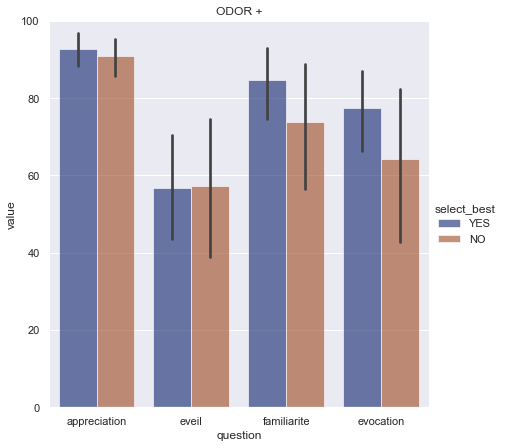

In [ ]:
sns.catplot(data=df_odor_profile_filtered.query("odor == '+' and question != 'intensite'"), kind="bar", x="question", y="value", hue="select_best", palette="dark", alpha=.6, height=6)
plt.ylim(0,100)
plt.title('ODOR +')

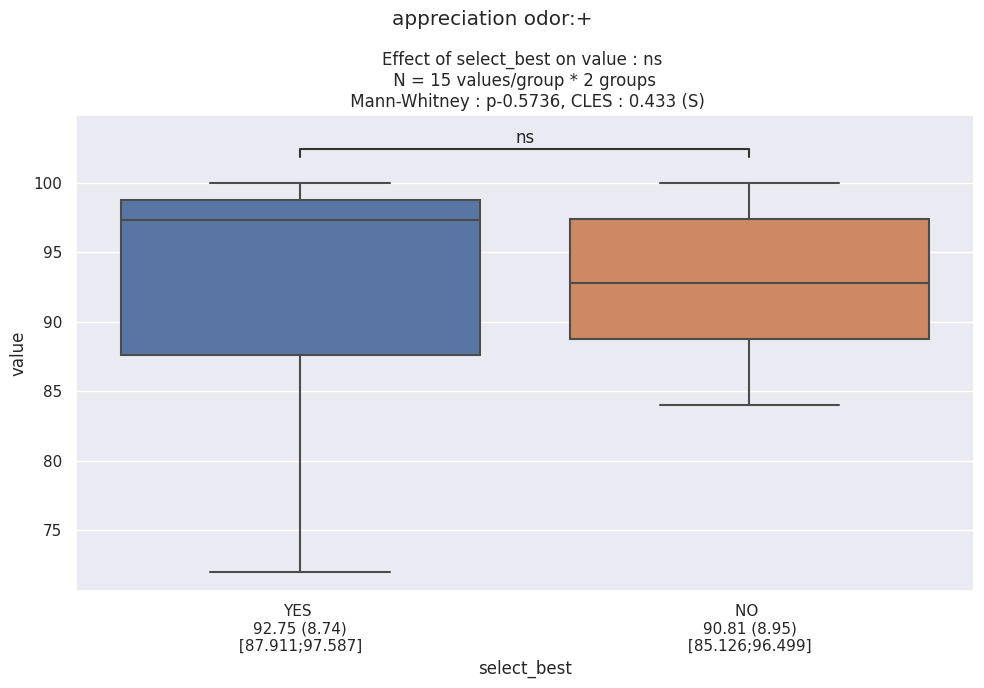

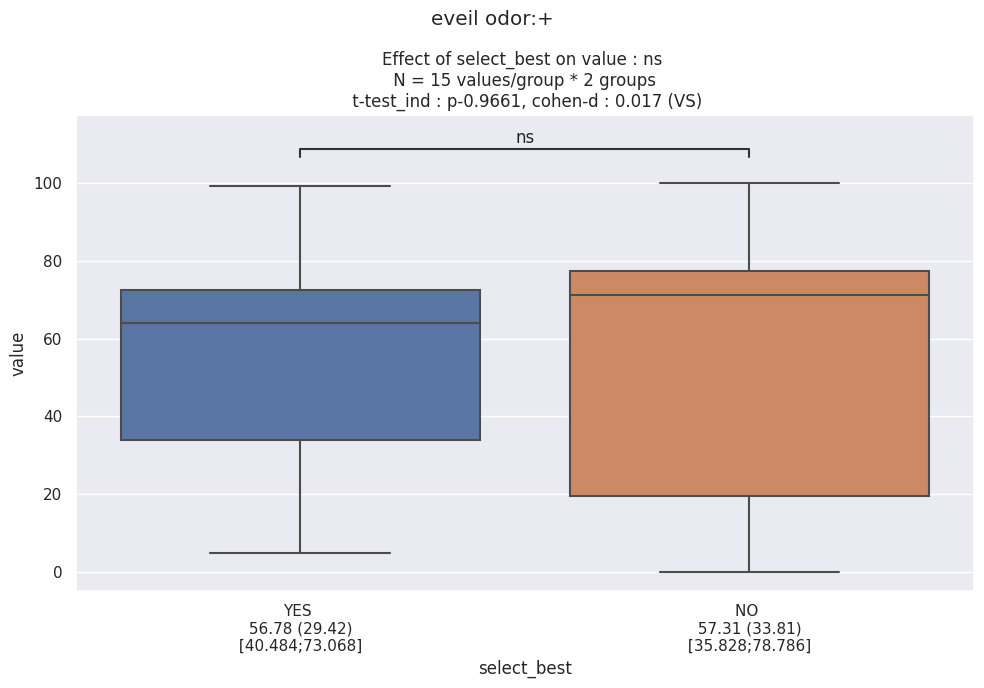

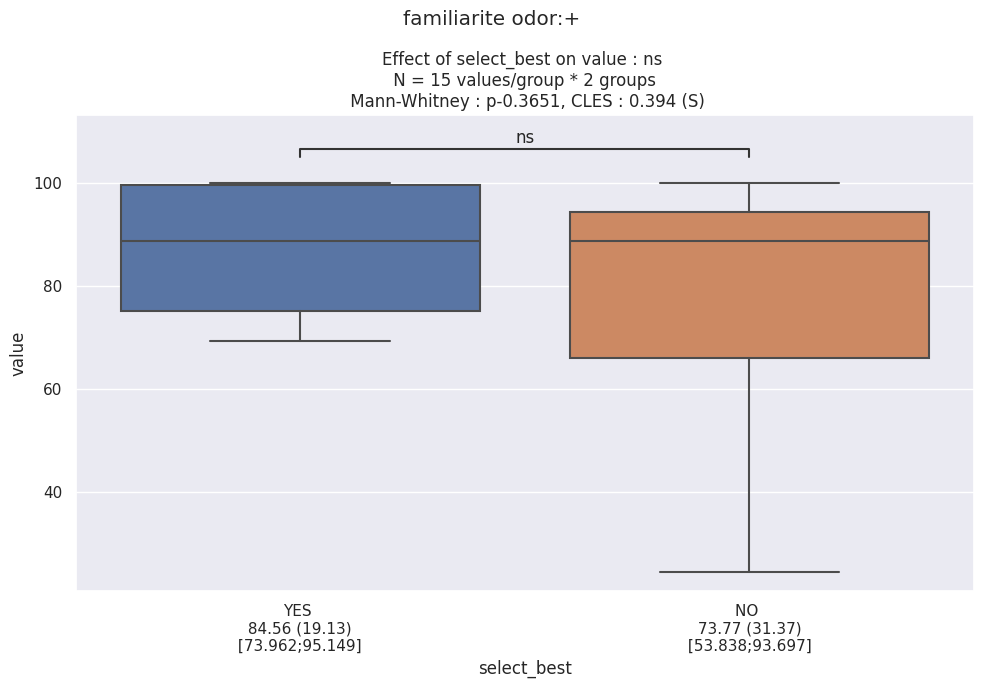

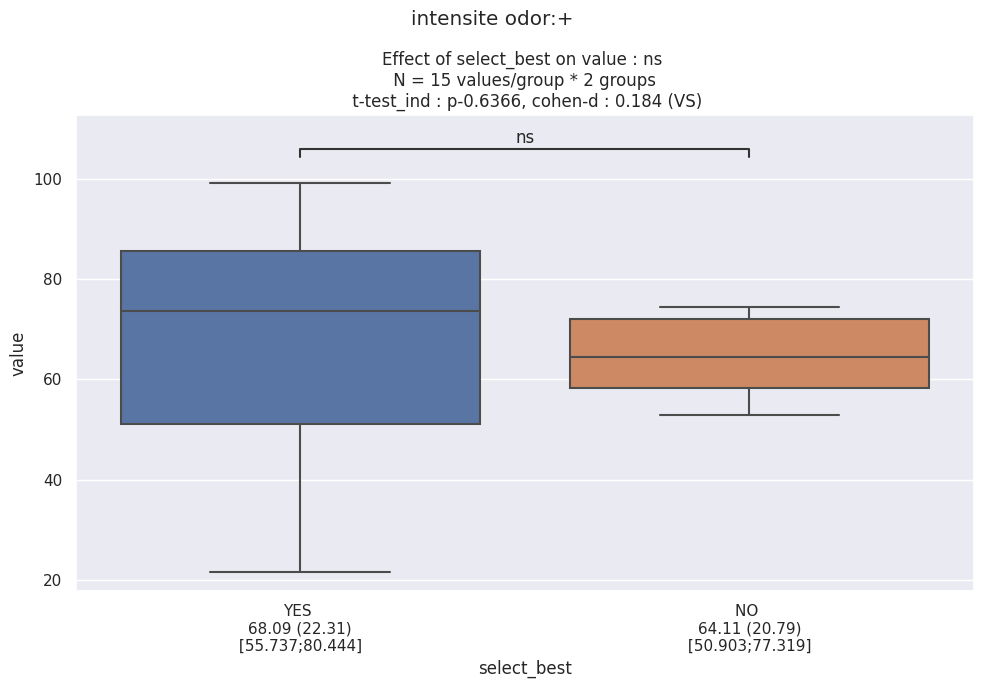

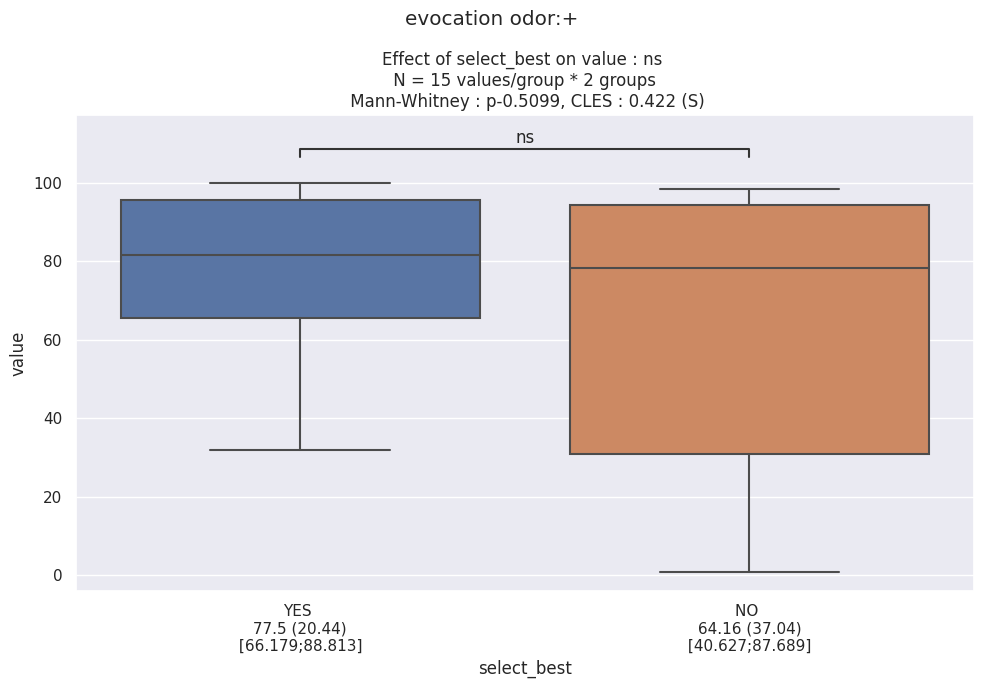

In [ ]:
predictor = 'select_best' 
outcome = 'value'
for question in question_list:
    df_stats = df_odor_profile_filtered.query(f"question == '{question}' and odor == '+'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{question} odor:+")
    plt.tight_layout()

Text(0.5, 1.0, 'ODOR -')

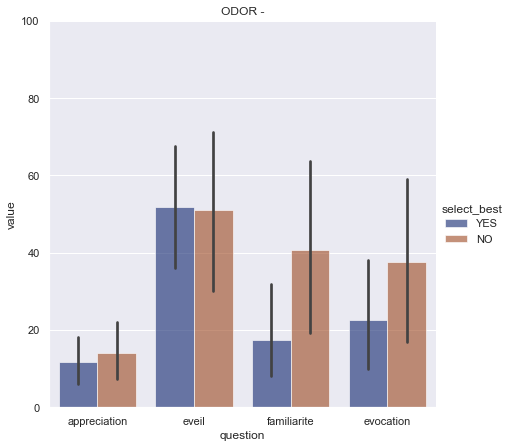

In [ ]:
sns.catplot(data=df_odor_profile_filtered.query("odor == '-' and question != 'intensite'"), kind="bar", x="question", y="value", hue="select_best", palette="dark", alpha=.6, height=6)
plt.ylim(0,100)
plt.title('ODOR -')

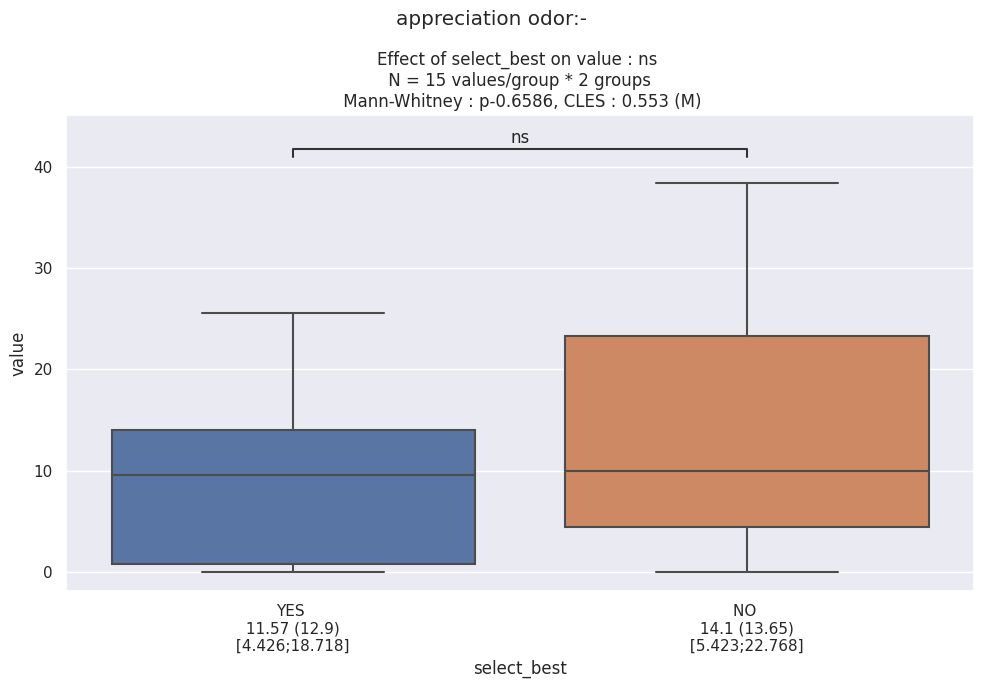

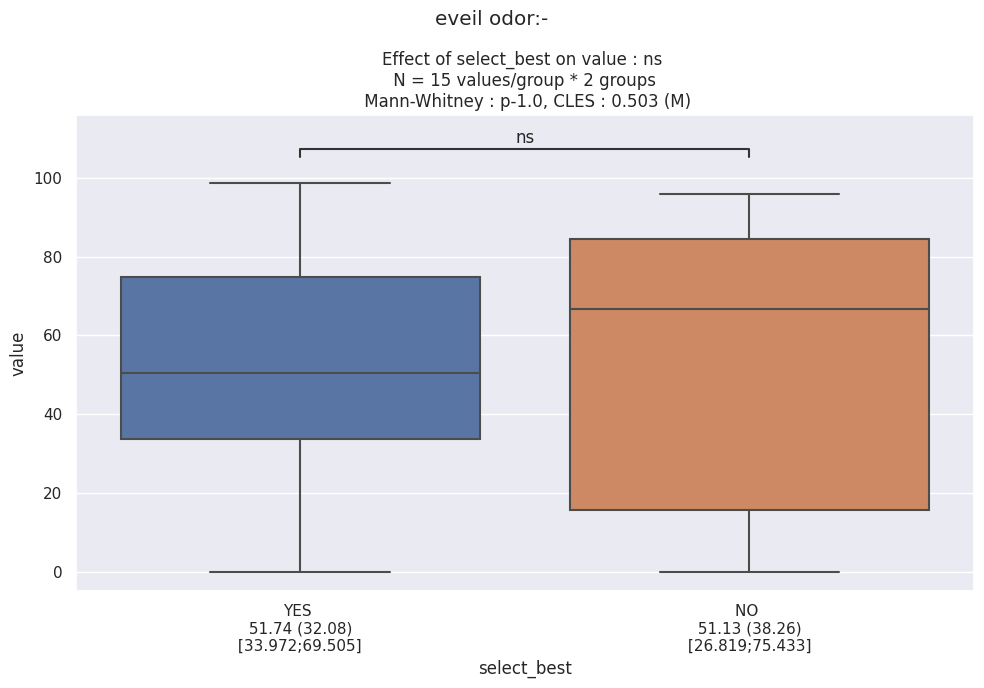

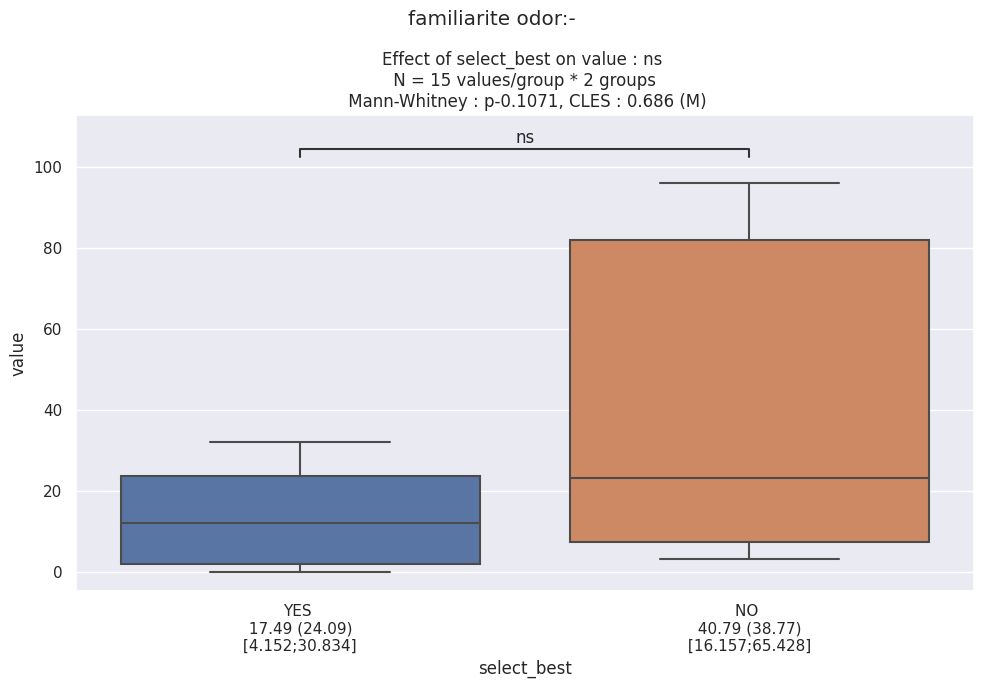

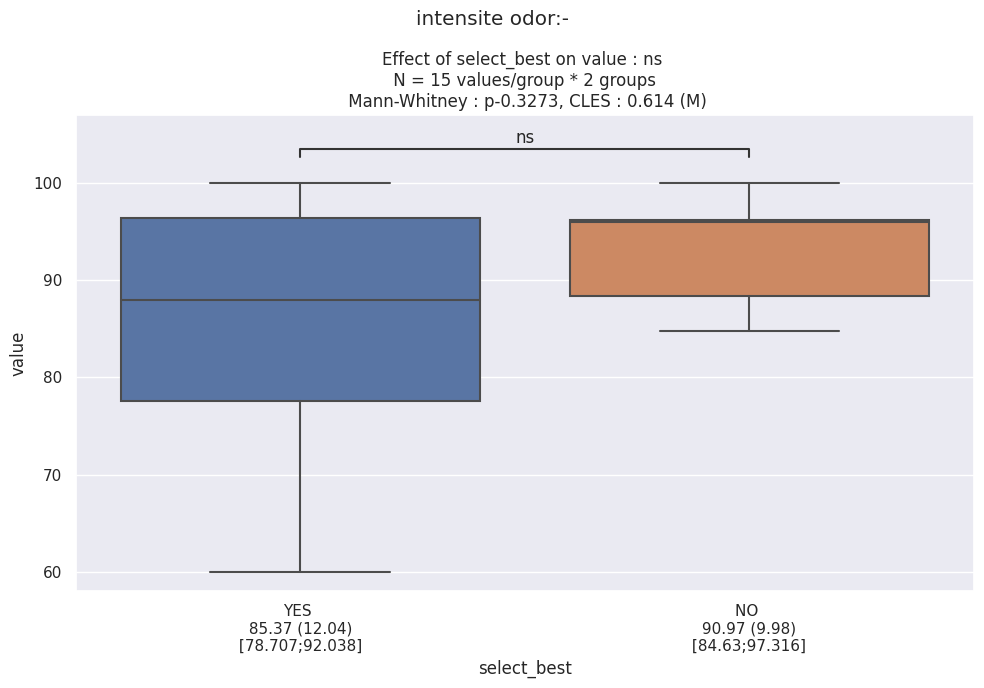

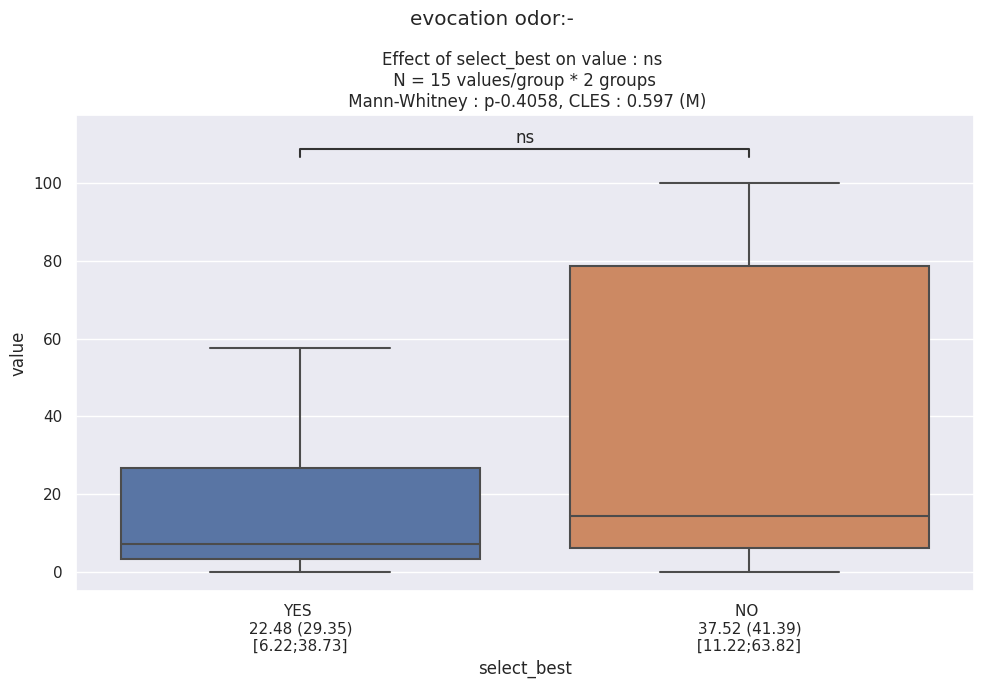

In [ ]:
predictor = 'select_best' 
outcome = 'value'
for question in question_list:
    df_stats = df_odor_profile_filtered.query(f"question == '{question}' and odor == '-'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{question} odor:-")
    plt.tight_layout()

### odor diff

In [ ]:
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
0,PD01,appreciation,-,0.0,15.0,0.000000,YES
5,PD01,appreciation,+,14.6,15.0,97.333333,YES
8,PD01,eveil,+,9.9,15.0,66.000000,YES
11,PD01,eveil,-,14.8,15.0,98.666667,YES
12,PD01,familiarite,-,4.7,15.0,31.333333,YES
...,...,...,...,...,...,...,...
976,MA33,familiarite,+,12.5,12.5,100.000000,YES
978,MA33,intensite,+,5.4,12.5,43.200000,YES
983,MA33,intensite,-,12.5,12.5,100.000000,YES
984,MA33,evocation,-,0.0,12.5,0.000000,YES


In [ ]:
data = {'sujet' : [], 'question' : [], 'value' : [], 'select_best' : []}

for sujet in sujet_list_rev:

    for question in question_list:
    
        data['sujet'].append(sujet)
        data['question'].append(question)
        data['value'].append(df_odor_profile_filtered.query(f"odor == '+' and sujet == '{sujet}' and question == '{question}'")['value'].values[0] - df_odor_profile_filtered.query(f"odor == '-' and sujet == '{sujet}' and question == '{question}'")['value'].values[0])
        
        if sujet in sujet_best_list:

            data['select_best'].append(True)

        else:

            data['select_best'].append(False)

df_diff_question = pd.DataFrame(data)
df_diff_question

,sujet,question,value,select_best
0,PD01,appreciation,97.333333,True
1,PD01,eveil,-32.666667,True
2,PD01,familiarite,63.333333,True
3,PD01,intensite,-48.666667,True
4,PD01,evocation,60.666667,True
...,...,...,...,...
130,MA33,appreciation,100.000000,True
131,MA33,eveil,12.000000,True
132,MA33,familiarite,100.000000,True
133,MA33,intensite,-56.800000,True


/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/tmp/ipykernel_31349/793368313.py:3: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


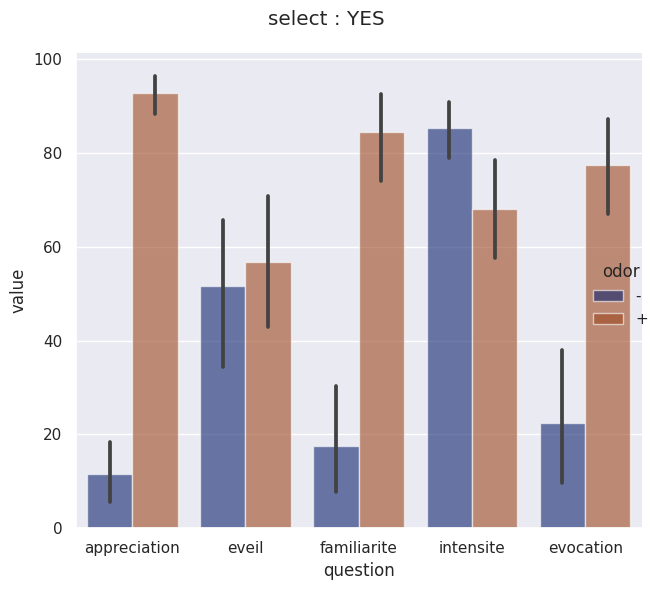

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/tmp/ipykernel_31349/793368313.py:8: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


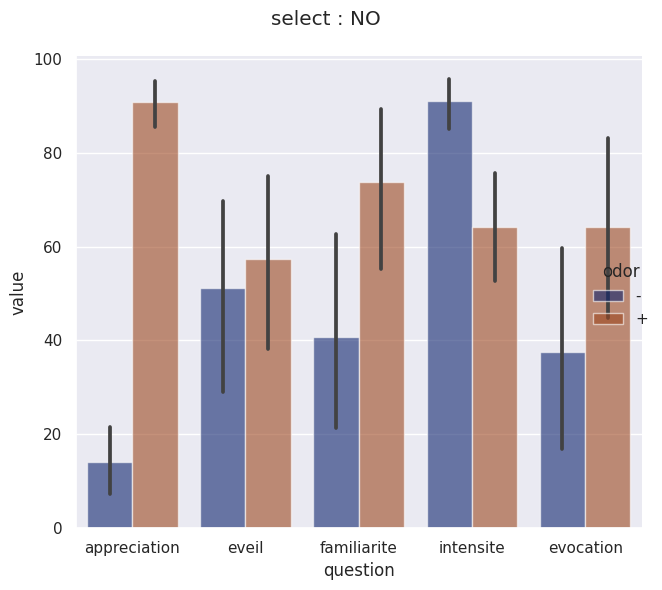

In [ ]:
sns.catplot(data=df_odor_profile_filtered.query("select_best == 'YES'"), kind="bar", x="question", y="value", hue="odor", palette="dark", alpha=.6, height=6)
plt.suptitle('select : YES')
plt.tight_layout()
plt.show()

sns.catplot(data=df_odor_profile_filtered.query("select_best == 'NO'"), kind="bar", x="question", y="value", hue="odor", palette="dark", alpha=.6, height=6)
plt.suptitle('select : NO')
plt.tight_layout()
plt.show()

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


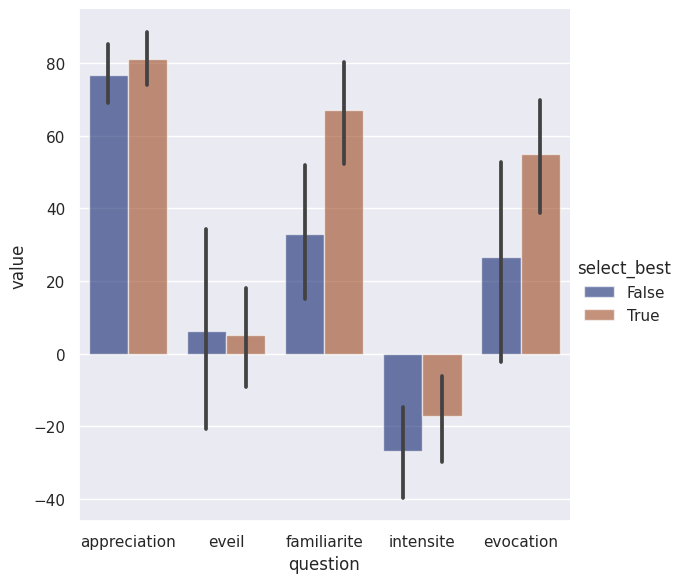

In [ ]:
sns.catplot(data=df_diff_question, kind="bar", x="question", y="value", hue="select_best", palette="dark", alpha=.6, height=6)

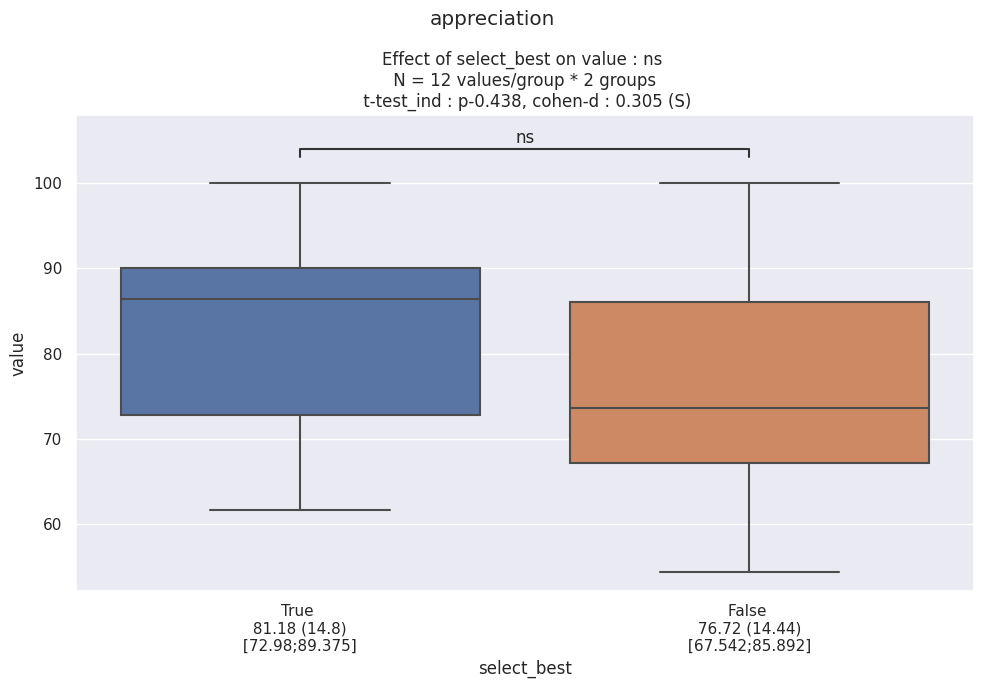

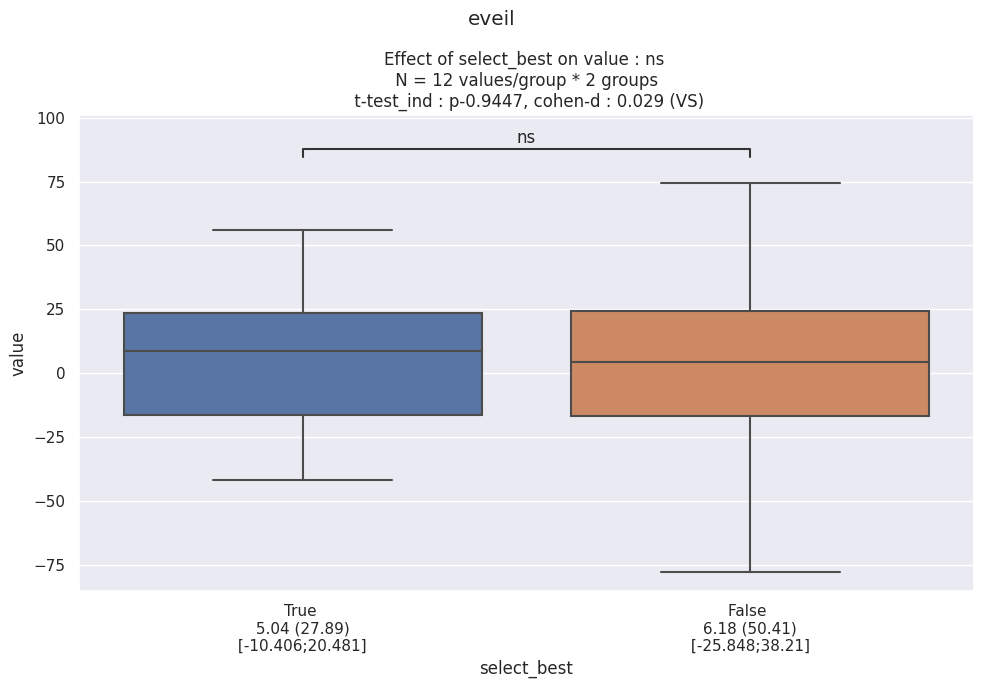

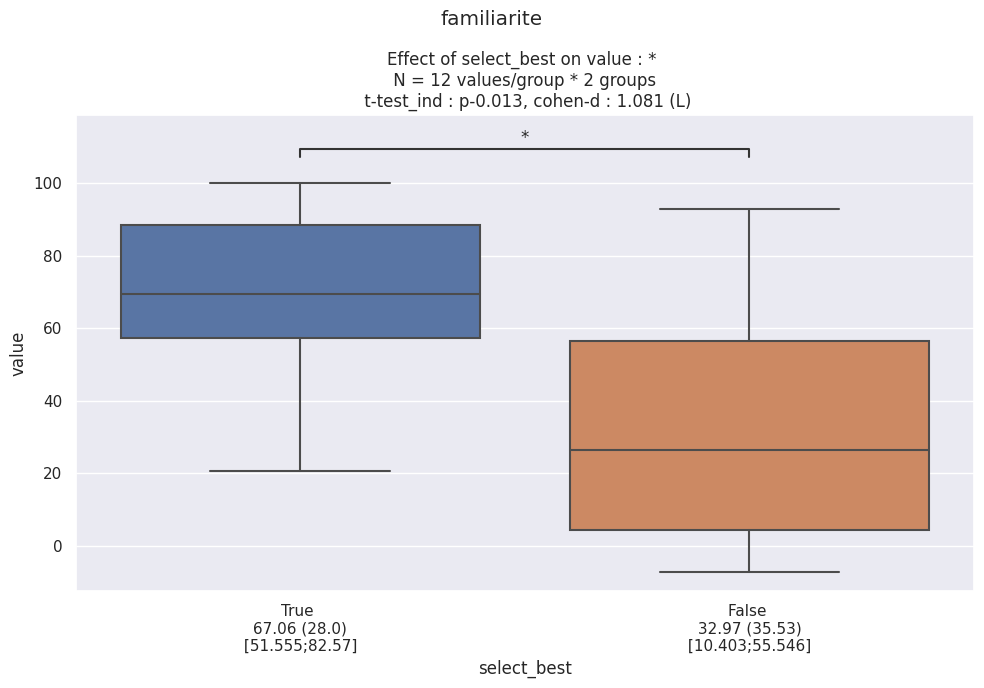

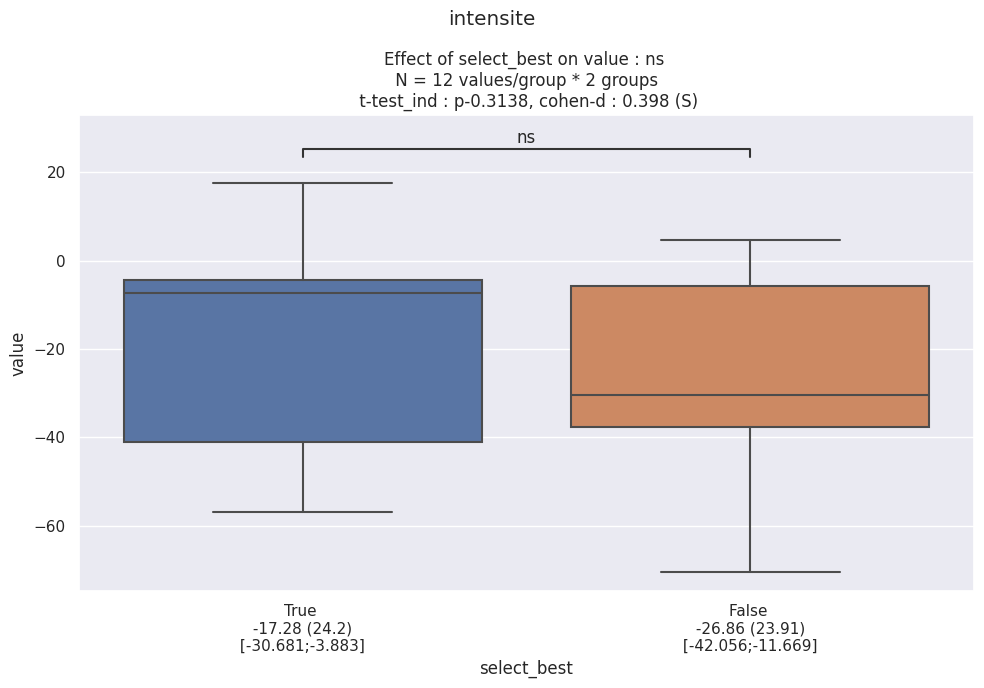

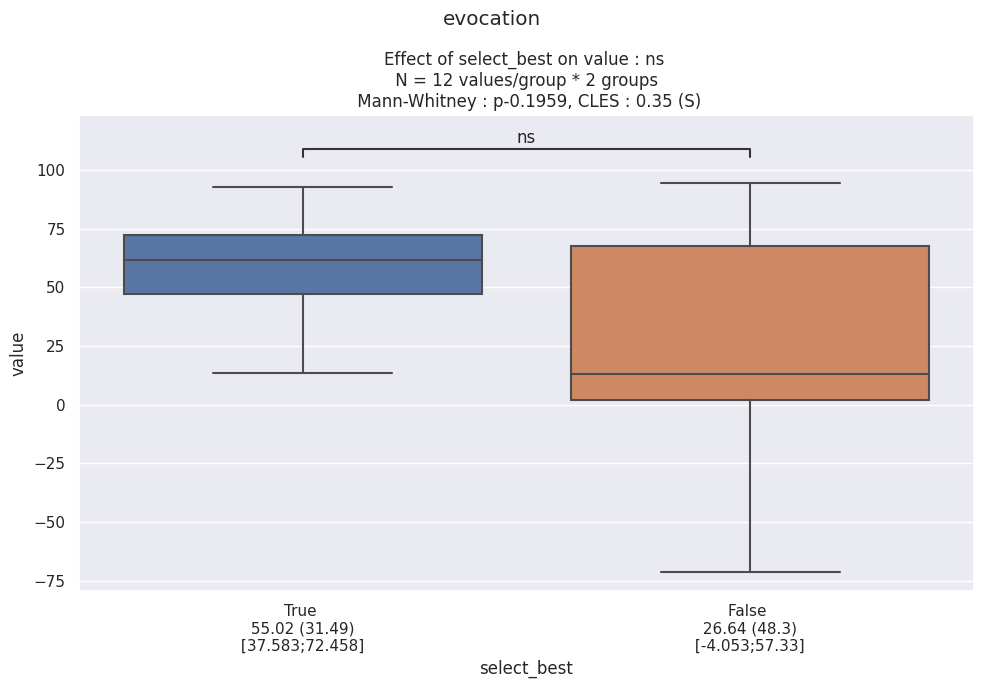

In [ ]:
predictor = 'select_best' 
outcome = 'value'
for question in question_list:
    df_stats = df_diff_question.query(f"question == '{question}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{question}")
    plt.tight_layout()

In [ ]:
df_q

,sujet,session,cond,question,raw_val,scale,val
0,PD01,o,FR_CV_1,1,6.9,15.9,43.396226
1,PD01,o,FR_CV_1,2,9.8,15.9,61.635220
2,PD01,o,FR_CV_1,3,9.3,15.9,58.490566
3,PD01,o,FR_CV_1,4,6.2,15.9,38.993711
4,PD01,o,FR_CV_1,5,7.9,15.9,49.685535
...,...,...,...,...,...,...,...
3163,MA33,-,FR_CV_2,4,7.5,15.6,48.076923
3164,MA33,-,FR_CV_2,5,0,15.6,0.000000
3165,MA33,-,FR_CV_2,6,2.7,15.6,17.307692
3166,MA33,-,FR_CV_2,7,7.2,15.6,46.153846


### intensity

(0.0, 100.0)

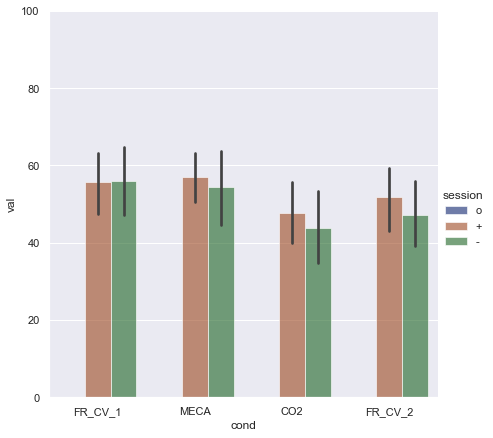

In [ ]:
sns.catplot(data=df_intensity, kind="bar", x="cond", y="val", hue="session", palette="dark", alpha=.6, height=6)
plt.ylim(0,100)

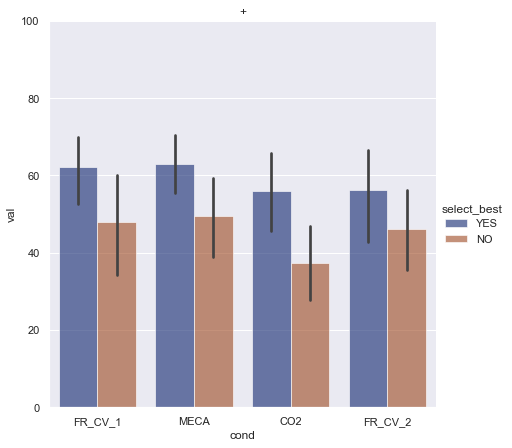

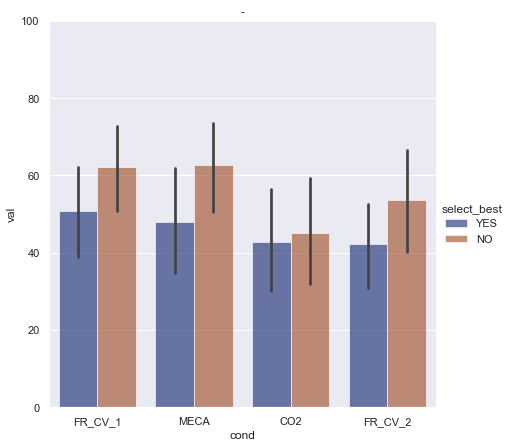

In [ ]:
for odor in ['+', '-']:
    sns.catplot(data=df_intensity.query(f"session == '{odor}'"), kind="bar", x="cond", y="val", hue="select_best", palette="dark", alpha=.6, height=6)
    plt.ylim(0,100)
    plt.title(f'{odor}')

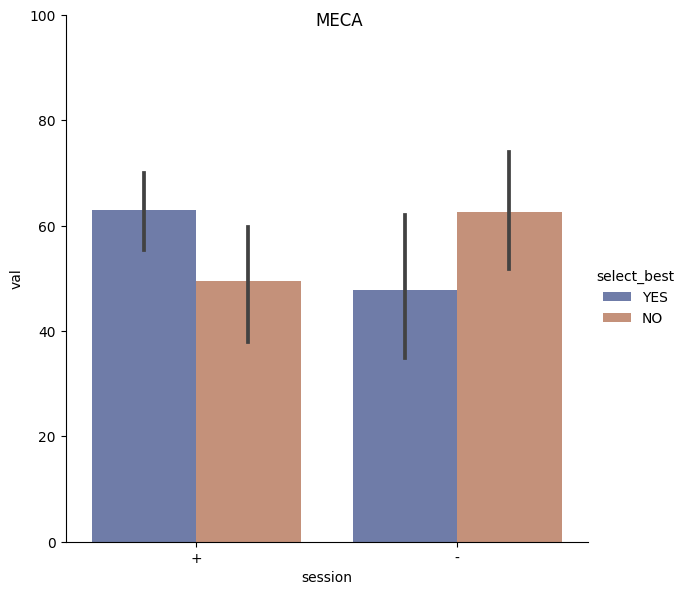

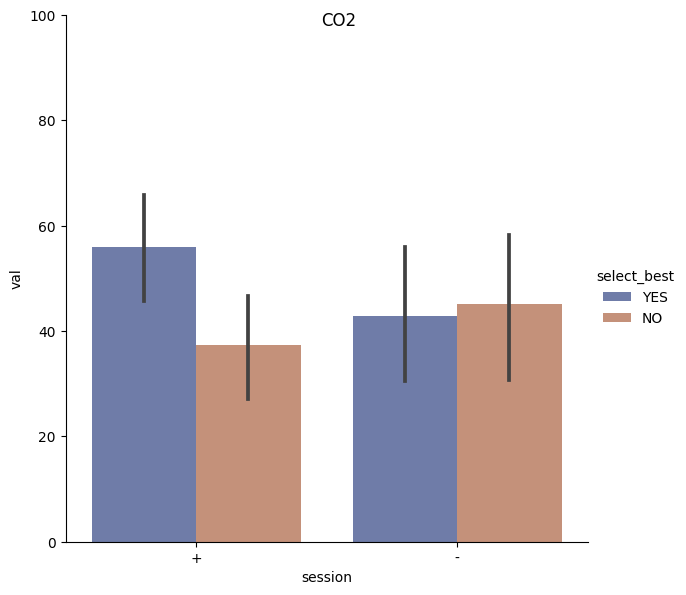

In [26]:
for cond in ['MECA', 'CO2']:
    sns.catplot(data=df_intensity.query(f"cond == '{cond}' and session != 'o'"), kind="bar", x="session", y="val", hue="select_best", palette="dark", alpha=.6, height=6)
    plt.ylim(0,100)
    plt.suptitle(f'{cond}')
    plt.show()

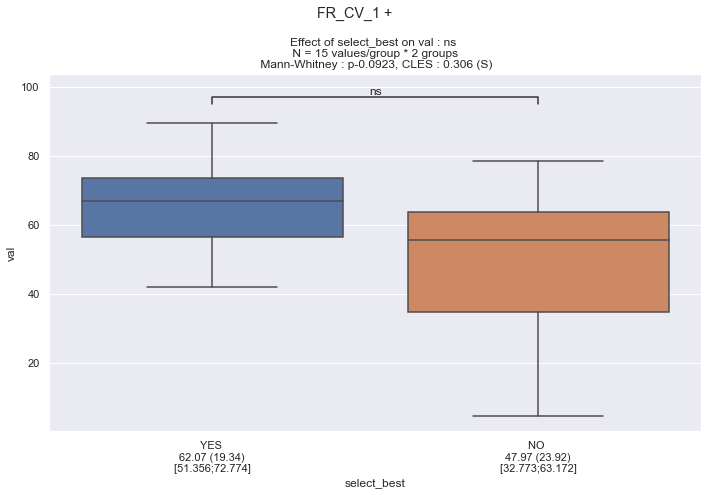

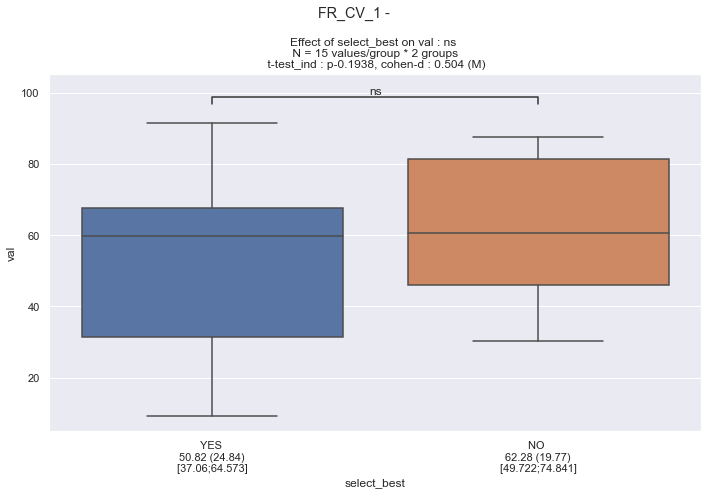

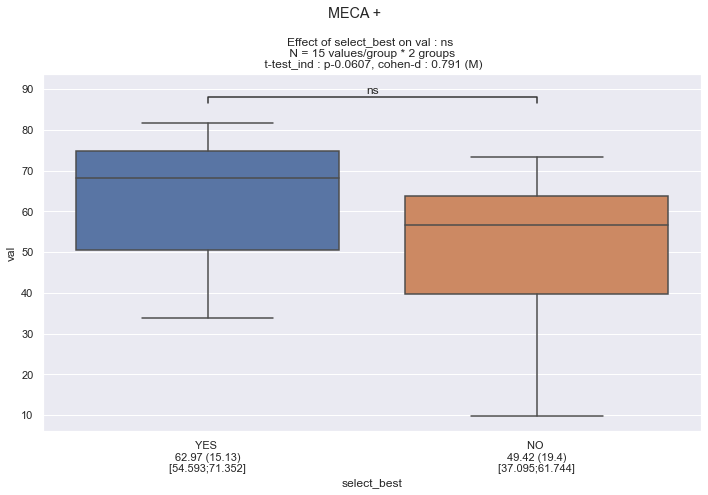

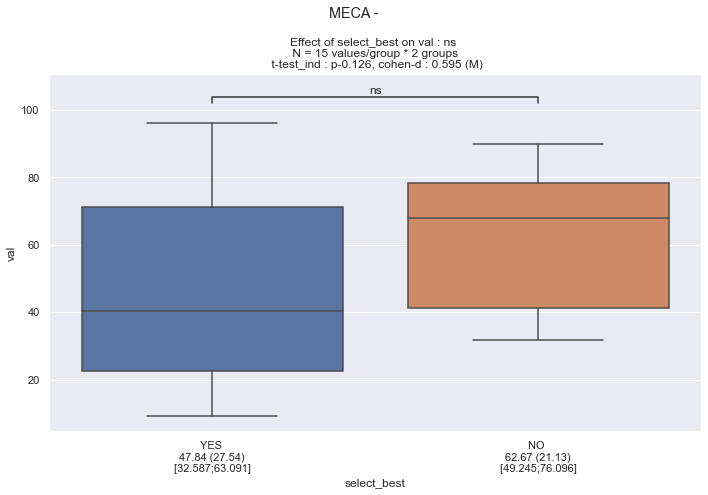

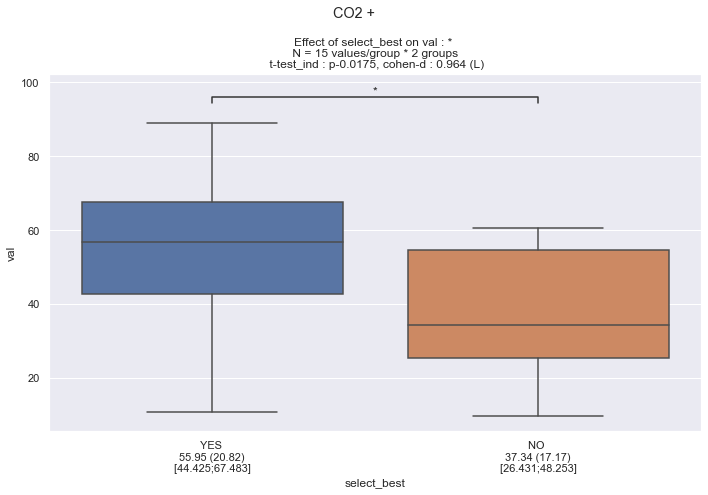

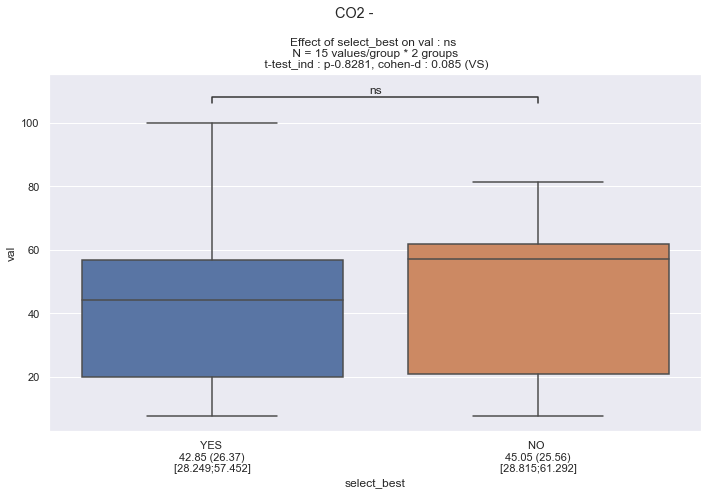

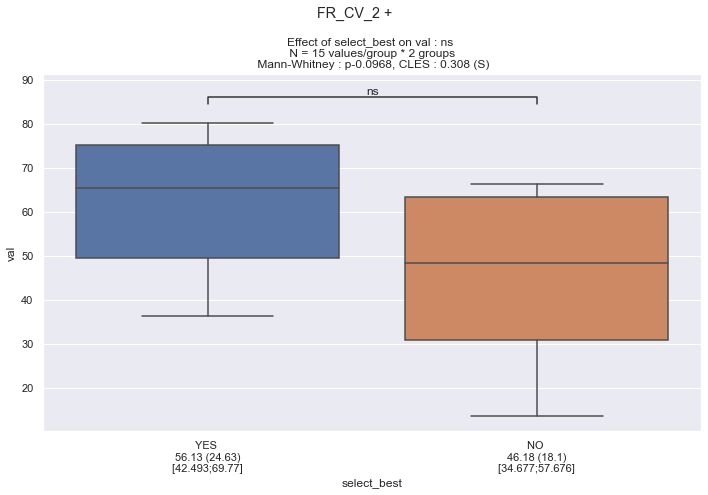

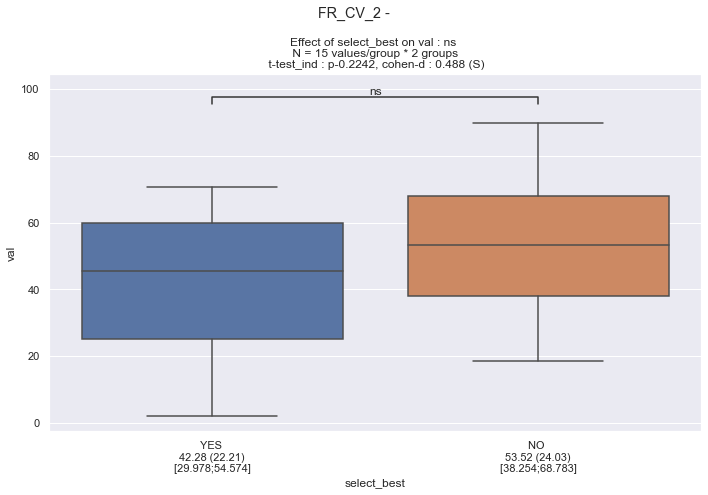

In [ ]:
predictor = 'select_best' 
outcome = 'val'
for cond in conditions:
    for odor in ['+', '-']:
        df_stats = df_intensity.query(f"cond == '{cond}' and session == '{odor}'")
        fig, ax = plt.subplots()
        ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)
        plt.suptitle(f"{cond} {odor}")
        plt.tight_layout()

In [33]:
predictor = 'select_best' 
outcome = 'val'
for cond in conditions:
    for odor in ['+', '-']:
        df_stats = df_intensity.query(f"cond == '{cond}' and session == '{odor}'")
        os.chdir(os.path.join(path_results, 'allplot', 'stats', 'psycho'))
        get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='between', transform=False, verbose=True).to_excel(f'ODOR_INTENSITY_repnorep_PRED_{predictor}_OUTCOME_{odor}{cond}.xlsx')


In [ ]:
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
0,PD01,appreciation,-,0.0,15.0,0.000000,YES
5,PD01,appreciation,+,14.6,15.0,97.333333,YES
8,PD01,eveil,+,9.9,15.0,66.000000,YES
11,PD01,eveil,-,14.8,15.0,98.666667,YES
12,PD01,familiarite,-,4.7,15.0,31.333333,YES
...,...,...,...,...,...,...,...
976,MA33,familiarite,+,12.5,12.5,100.000000,YES
978,MA33,intensite,+,5.4,12.5,43.200000,YES
983,MA33,intensite,-,12.5,12.5,100.000000,YES
984,MA33,evocation,-,0.0,12.5,0.000000,YES


In [ ]:
data = {'sujet' : [], 'question' : [], 'value' : [], 'select_best' : []}

for sujet in df_odor_profile_filtered['sujet'].unique():

    for question in df_odor_profile_filtered['question'].unique():

        data['sujet'].append(sujet)
        data['question'].append(question)
        data['value'].append(df_odor_profile_filtered.query(f"sujet == '{sujet}' and question == '{question}' and odor == '+'")['value'].values[0] - df_odor_profile_filtered.query(f"sujet == '{sujet}' and question == '{question}' and odor == '-'")['value'].values[0])
        data['select_best'].append(df_odor_profile_filtered.query(f"sujet == '{sujet}' and question == '{question}' and odor == '+'")['select_best'].values[0])

df_diff_odor_profile = pd.DataFrame(data)
df_diff_odor_profile

,sujet,question,value,select_best
0,PD01,appreciation,97.333333,YES
1,PD01,eveil,-32.666667,YES
2,PD01,familiarite,63.333333,YES
3,PD01,intensite,-48.666667,YES
4,PD01,evocation,60.666667,YES
...,...,...,...,...
130,MA33,appreciation,100.000000,YES
131,MA33,eveil,12.000000,YES
132,MA33,familiarite,100.000000,YES
133,MA33,intensite,-56.800000,YES


In [ ]:
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
0,PD01,appreciation,-,0.0,15.0,0.000000,YES
5,PD01,appreciation,+,14.6,15.0,97.333333,YES
8,PD01,eveil,+,9.9,15.0,66.000000,YES
11,PD01,eveil,-,14.8,15.0,98.666667,YES
12,PD01,familiarite,-,4.7,15.0,31.333333,YES
...,...,...,...,...,...,...,...
976,MA33,familiarite,+,12.5,12.5,100.000000,YES
978,MA33,intensite,+,5.4,12.5,43.200000,YES
983,MA33,intensite,-,12.5,12.5,100.000000,YES
984,MA33,evocation,-,0.0,12.5,0.000000,YES


<Axes: xlabel='odor', ylabel='value'>

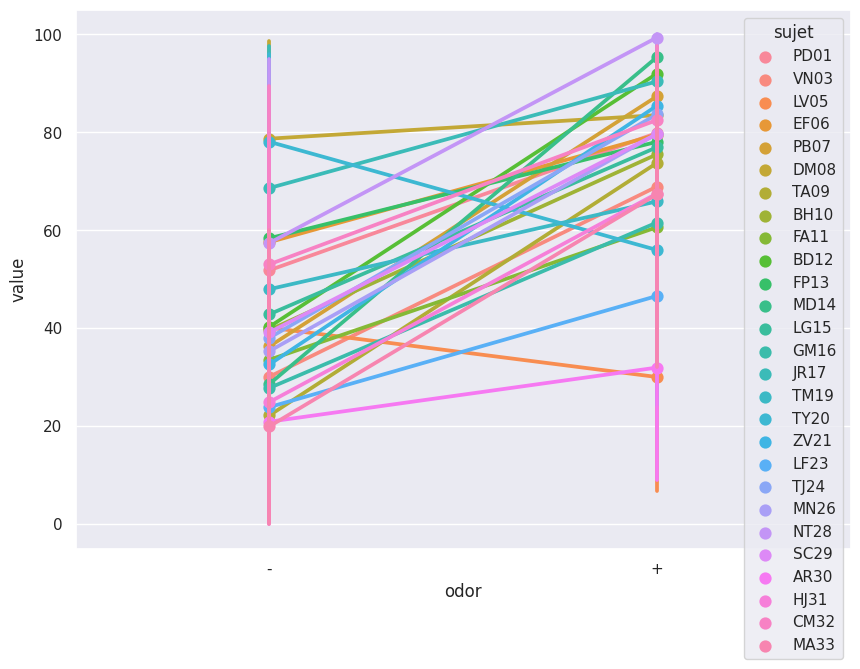

In [ ]:
df_plot = df_odor_profile_filtered.query(f"question == 'familiarite'")
sns.pointplot(data=df_odor_profile_filtered, x="odor", y="value", hue="sujet", order=None)

### PCA

In [ ]:
data = {'sujet' : [], 'odor' : [], 'select' : [], 'appreciation' : [], 'eveil' : [], 'familiarite' : [], 'intensite' : [], 'evocation' : []}

for odor in ['+', '-']:

    for sujet in df_odor_profile_filtered['sujet'].unique():
        
        data['sujet'].append(sujet)

        for question in df_odor_profile['question'].unique():

            data[question].append(df_odor_profile_filtered.query(f"sujet == '{sujet}' and question == '{question}' and odor == '{odor}'")['value'].values[0])

        data['odor'].append(odor)

        if sujet in sujet_best_list:
            data['select'].append('select')
        else:
            data['select'].append('non_select')

df_pca = pd.DataFrame(data)
df_pca


,sujet,odor,select,appreciation,eveil,familiarite,intensite,evocation
0,PD01,+,select,97.333333,66.000000,94.666667,47.333333,94.000000
1,VN03,+,select,78.666667,72.000000,69.333333,54.666667,70.000000
2,LV05,+,non_select,99.200000,18.400000,6.400000,25.600000,0.800000
3,EF06,+,non_select,90.400000,72.000000,86.400000,74.400000,74.400000
4,PB07,+,non_select,96.800000,81.600000,98.400000,62.400000,97.600000
5,DM08,+,non_select,84.000000,76.000000,92.800000,71.200000,93.600000
6,TA09,+,select,86.400000,64.000000,87.200000,67.200000,64.000000
7,BH10,+,non_select,74.400000,70.400000,91.200000,61.600000,80.000000
8,FA11,+,select,96.000000,4.800000,88.800000,21.600000,92.000000
9,BD12,+,select,99.200000,99.200000,99.200000,99.200000,63.200000


In [ ]:


X = df_pca.query(f"odor == '+'")[['appreciation', 'eveil', 'familiarite', 'intensite', 'evocation']].values
X = StandardScaler().fit_transform(X)
pca = PCA(n_components=2).fit_transform(X)
df_pca_fit = pd.DataFrame(data = pca, columns = ['principal component 1', 'principal component 2'])



<Figure size 1000x700 with 0 Axes>

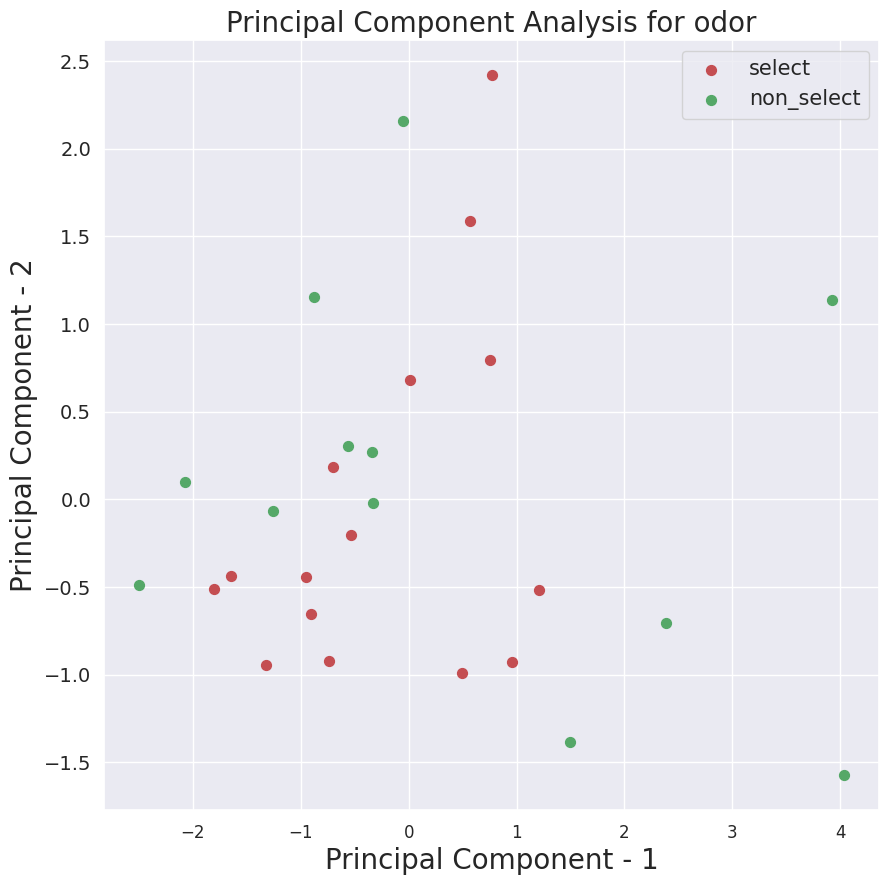

In [ ]:
plt.figure()
plt.figure(figsize=(10,10))
plt.xticks(fontsize=12)
plt.yticks(fontsize=14)
plt.xlabel('Principal Component - 1',fontsize=20)
plt.ylabel('Principal Component - 2',fontsize=20)
plt.title("Principal Component Analysis for odor",fontsize=20)
targets = ['select', 'non_select']
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = df_pca['select'] == target
    plt.scatter(df_pca_fit.loc[indicesToKeep, 'principal component 1']
               , df_pca_fit.loc[indicesToKeep, 'principal component 2'], c = color, s = 50)

plt.legend(targets,prop={'size': 15})

In [ ]:
df_diff_question

,sujet,question,value,select_best
0,PD01,appreciation,97.333333,True
1,PD01,eveil,-32.666667,True
2,PD01,familiarite,63.333333,True
3,PD01,intensite,-48.666667,True
4,PD01,evocation,60.666667,True
...,...,...,...,...
130,MA33,appreciation,100.000000,True
131,MA33,eveil,12.000000,True
132,MA33,familiarite,100.000000,True
133,MA33,intensite,-56.800000,True


In [ ]:
data = {'sujet' : [], 'select' : [], 'appreciation' : [], 'eveil' : [], 'familiarite' : [], 'intensite' : [], 'evocation' : []}

for sujet in df_diff_question['sujet'].unique():
    
    data['sujet'].append(sujet)

    for question in df_odor_profile['question'].unique():

        data[question].append(df_diff_question.query(f"sujet == '{sujet}' and question == '{question}'")['value'].values[0])

    if sujet in sujet_best_list:
        data['select'].append('select')
    else:
        data['select'].append('non_select')

df_pca = pd.DataFrame(data)
df_pca

,sujet,select,appreciation,eveil,familiarite,intensite,evocation
0,PD01,select,97.333333,-32.666667,63.333333,-48.666667,60.666667
1,VN03,select,74.666667,14.666667,69.333333,-34.666667,70.000000
2,LV05,non_select,96.000000,-77.600000,3.200000,-70.400000,-1.600000
3,EF06,non_select,54.400000,-11.200000,33.600000,-10.400000,43.200000
4,PB07,non_select,92.000000,9.600000,92.800000,-33.600000,94.400000
5,DM08,non_select,72.800000,-12.000000,-3.200000,-27.200000,-6.400000
6,TA09,select,70.400000,56.000000,75.200000,-4.800000,60.800000
7,BH10,non_select,68.800000,8.800000,69.600000,-34.400000,66.400000
8,FA11,select,86.400000,-30.400000,56.800000,-49.600000,72.000000
9,BD12,select,87.200000,8.800000,84.800000,17.600000,60.000000


In [ ]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

X = df_pca[['appreciation', 'eveil', 'familiarite', 'intensite', 'evocation']].values
X = StandardScaler().fit_transform(X)
pca = PCA(n_components=2).fit_transform(X)
df_pca_fit = pd.DataFrame(data = pca, columns = ['principal component 1', 'principal component 2'])

<Figure size 1000x700 with 0 Axes>

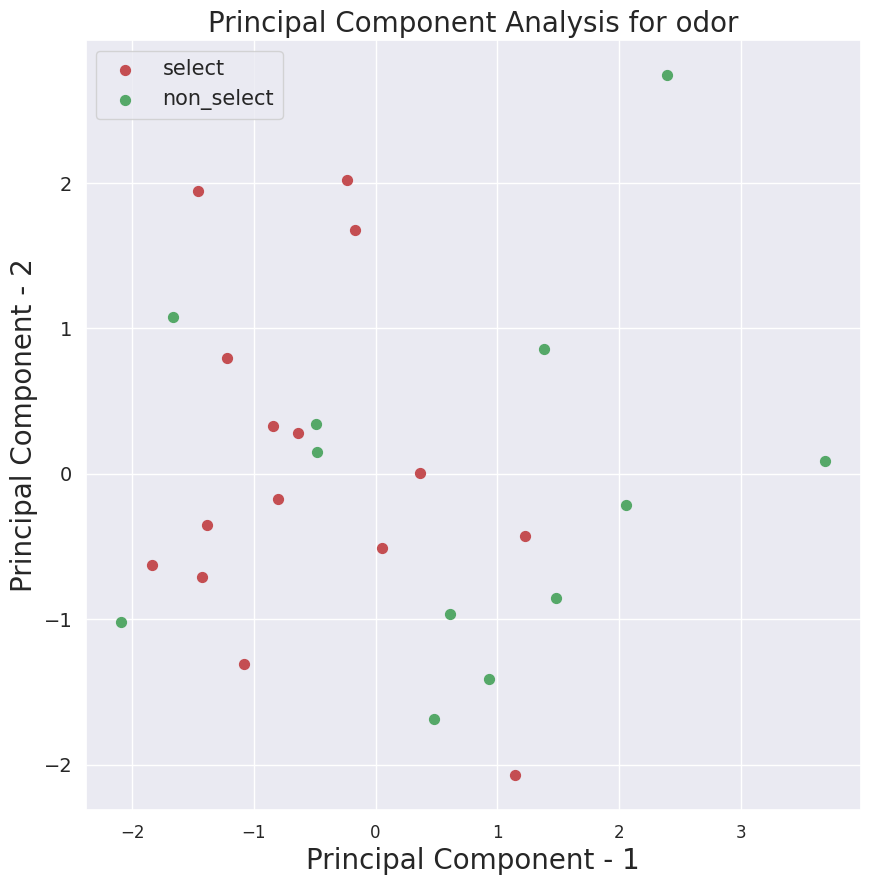

In [ ]:
plt.figure()
plt.figure(figsize=(10,10))
plt.xticks(fontsize=12)
plt.yticks(fontsize=14)
plt.xlabel('Principal Component - 1',fontsize=20)
plt.ylabel('Principal Component - 2',fontsize=20)
plt.title("Principal Component Analysis for odor",fontsize=20)
targets = ['select', 'non_select']
colors = ['r', 'g']
for target, color in zip(targets,colors):
    indicesToKeep = df_pca['select'] == target
    plt.scatter(df_pca_fit.loc[indicesToKeep, 'principal component 1']
               , df_pca_fit.loc[indicesToKeep, 'principal component 2'], c = color, s = 50)

plt.legend(targets,prop={'size': 15})

In [ ]:
data = {'sujet' : [], 'odor' : [], 'cond' : [], 'select' : [], 'RELAX' : [], 'A2' : [], 'STAI' : []}

for sujet in df_diff_question['sujet'].unique():

    for odor in odor_list:

        for cond in ['MECA', 'CO2']:
        
            data['sujet'].append(sujet)
            data['odor'].append(odor)
            data['cond'].append(cond)

            data['RELAX'].append(df_relax.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['val'].values[0])
            data['A2'].append(df_A2.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['value'].values[0])
            data['STAI'].append(df_stai.query(f"sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['val'].values[0])

            if sujet in sujet_best_list:
                data['select'].append('select')
            else:
                data['select'].append('non_select')

df_pca_allpsycho = pd.DataFrame(data)
df_pca_allpsycho

,sujet,odor,cond,select,RELAX,A2,STAI
0,PD01,o,MECA,select,16.981132,5.2,69.287212
1,PD01,o,CO2,select,13.207547,6.8,77.044025
2,PD01,+,MECA,select,29.936306,8.0,71.337580
3,PD01,+,CO2,select,12.738854,6.4,78.025478
4,PD01,-,MECA,select,35.031847,5.4,67.834395
...,...,...,...,...,...,...,...
157,MA33,o,CO2,select,0.000000,4.2,85.064935
158,MA33,+,MECA,select,89.542484,0.4,19.063181
159,MA33,+,CO2,select,89.032258,1.4,34.623656
160,MA33,-,MECA,select,32.258065,0.2,66.774194


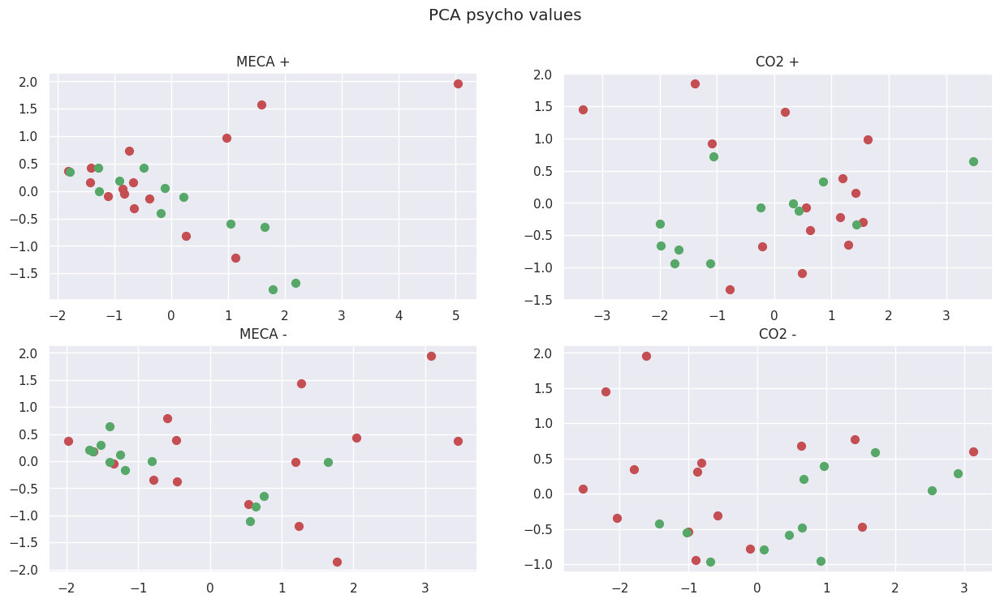

In [ ]:
fig, axs = plt.subplots(ncols=len(['MECA', 'CO2']), nrows=len(['+', '-']))

for cond_i, cond in enumerate(['MECA', 'CO2']):

    for odor_i, odor in enumerate(['+', '-']):

        ax = axs[odor_i, cond_i]

        df_pca = df_pca_allpsycho.query(f"cond == '{cond}' and odor == '{odor}'")
        X = df_pca[['RELAX', 'A2', 'STAI']].values
        X = StandardScaler().fit_transform(X)
        pca = PCA(n_components=2).fit_transform(X)
        df_pca_fit = pd.DataFrame(data = pca, columns = ['principal component 1', 'principal component 2'])

        ax.set_title(f"{cond} {odor}")
        targets = ['select', 'non_select']
        colors = ['r', 'g']
        for target, color in zip(targets,colors):
            indicesToKeep = df_pca['select'] == target
            ax.scatter(df_pca_fit.loc[indicesToKeep.values, 'principal component 1']
                    , df_pca_fit.loc[indicesToKeep.values, 'principal component 2'], c = color, s = 50)

plt.suptitle('PCA psycho values')
fig.set_figheight(8)
fig.set_figwidth(15)

# ODOR ANALYSIS

## choice

In [ ]:
df_odor_choice

,sujet,session,odor,raw_val,scale,value
0,PD01,odor_+,6,10.1,12.7,79.527559
1,PD01,odor_-,11,4.2,12.7,33.070866
4,VN03,odor_+,13,7.5,12.7,59.055118
5,VN03,odor_-,11,4.0,12.7,31.496063
8,LV05,odor_+,10,11.3,12.7,88.976378
9,LV05,odor_-,11,7.0,12.7,55.118110
10,EF06,odor_+,2,12.7,12.7,100.000000
11,EF06,odor_-,11,4.8,12.7,37.795276
12,PB07,odor_+,3,10.6,12.7,83.464567
13,PB07,odor_-,11,0.4,12.7,3.149606


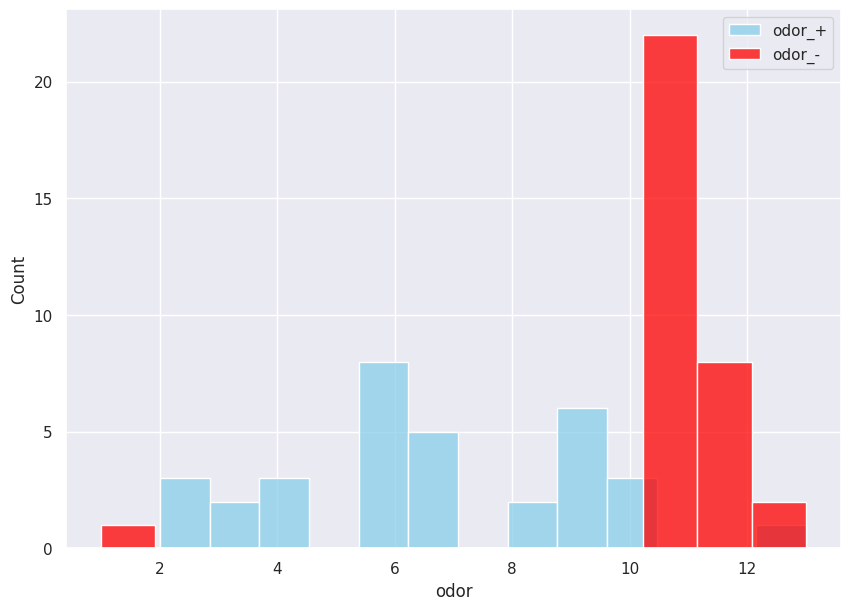

In [ ]:
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_+').values]
sns.histplot(data=df_plot, x="odor", label='odor_+', color="skyblue", bins=13)
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_-').values]
sns.histplot(data=df_plot, x="odor", label='odor_-', color="red", bins=13)

plt.legend()

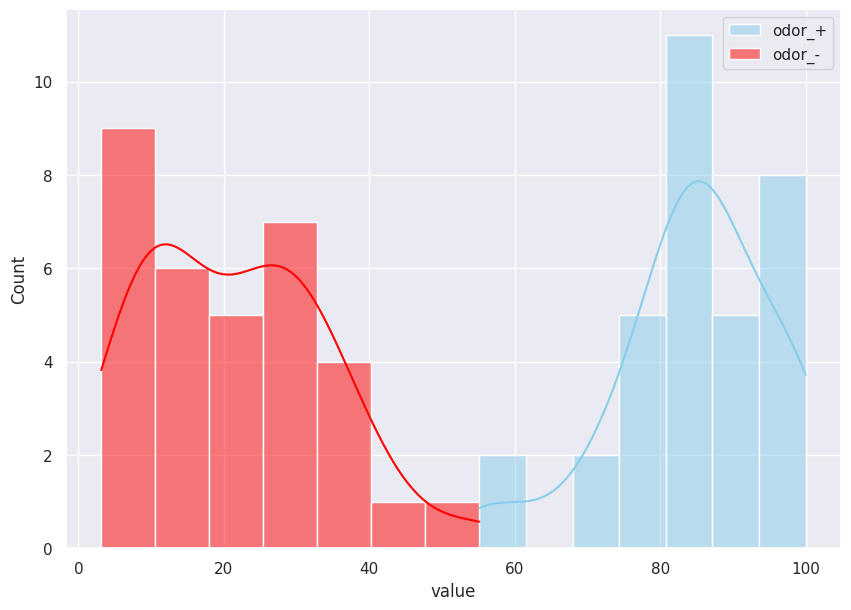

In [ ]:
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_+').values]
sns.histplot(data=df_plot, x="value", label='odor_+', color="skyblue", kde=True)
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_-').values]
sns.histplot(data=df_plot, x="value", label='odor_-', color="red", kde=True)

plt.legend()


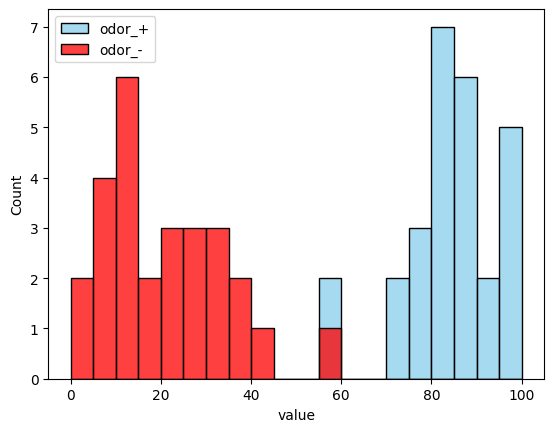

In [ ]:
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_+').values]
sns.histplot(data=df_plot, x="value", label='odor_+', color="skyblue", kde=False, bins=20, binrange=(0,100))
df_plot = df_odor_choice[(df_odor_choice['session'] == 'odor_-').values]
sns.histplot(data=df_plot, x="value", label='odor_-', color="red", kde=False, bins=20, binrange=(0,100))

plt.legend()

In [ ]:
val = np.zeros((df_odor_choice['sujet'].unique().shape[0], 2), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_odor_choice['sujet'].unique()):
    df_i = df_odor_choice.query(f"sujet == '{sujet}'")
    diff_i = df_i[df_i['session'] == 'odor_+']['value'].values[0] - df_i[df_i['session'] == 'odor_-']['value'].values[0]
    val[i, :] = np.array([sujet, diff_i])
    i += 1

In [ ]:
df_diff = pd.DataFrame(val, columns=['sujet', 'value'])
df_diff['value'] = df_diff['value'].astype(np.float64) 

sel_list_to_add = []
for sujet in df_diff['sujet'].unique():
    if sujet in sujet_best_list:
        sel_list_to_add.append('YES')
    else:
        sel_list_to_add.append('NO')

df_diff['select_best'] = sel_list_to_add
df_diff

,sujet,value,select_best
0,PD01,46.456693,YES
1,VN03,27.559055,YES
2,LV05,33.858268,NO
3,EF06,62.204724,NO
4,PB07,80.314961,NO
5,DM08,78.571429,NO
6,TA09,75.396825,YES
7,BH10,41.269841,NO
8,FA11,76.190476,YES
9,BD12,62.698413,YES


<Axes: xlabel='value', ylabel='Count'>

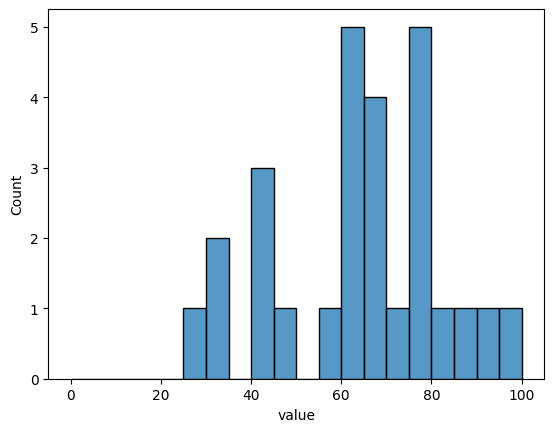

In [ ]:
sns.histplot(data=df_diff, x="value", bins=20, binrange=(0,100))

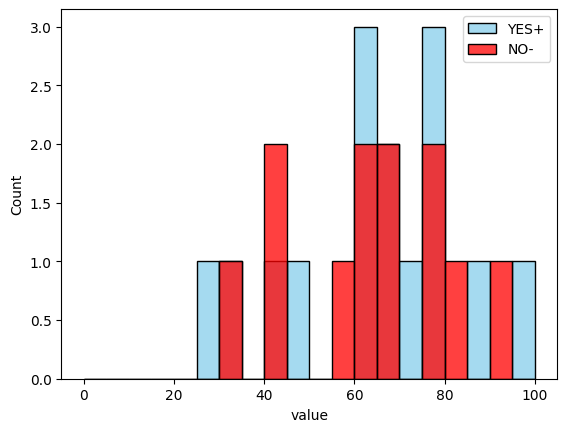

In [ ]:
df_plot = df_diff.query("select_best == 'YES'")
sns.histplot(data=df_plot, x="value", label='YES+', color="skyblue", kde=False, bins=20, binrange=(0,100))
df_plot = df_diff.query("select_best == 'NO'")
sns.histplot(data=df_plot, x="value", label='NO-', color="red", kde=False, bins=20, binrange=(0,100))

plt.legend()

## profile

(0.0, 100.0)

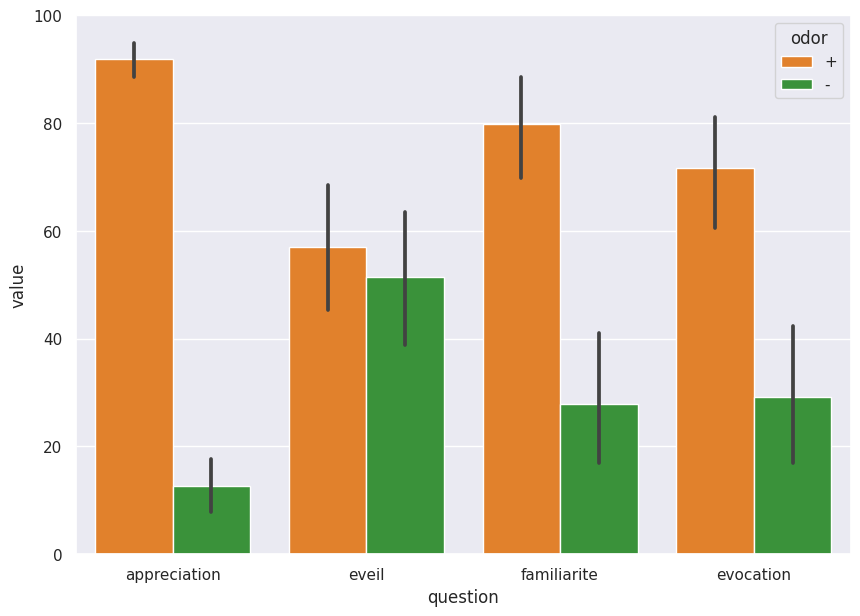

In [109]:
sns.barplot(data=df_odor_profile_filtered.query(f"question != 'intensite'"), x="question", y="value", hue="odor", palette=['tab:orange', 'tab:green'], hue_order=['+', '-'])
plt.ylim(0,100)

C:\Users\jules\AppData\Roaming\Python\Python38\site-packages\scipy\stats\_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
C:\Users\jules\AppData\Roaming\Python\Python38\site-packages\scipy\stats\_morestats.py:3414: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


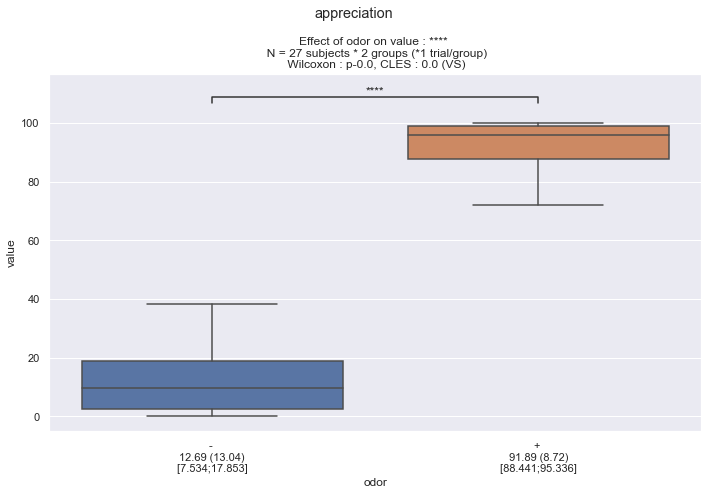

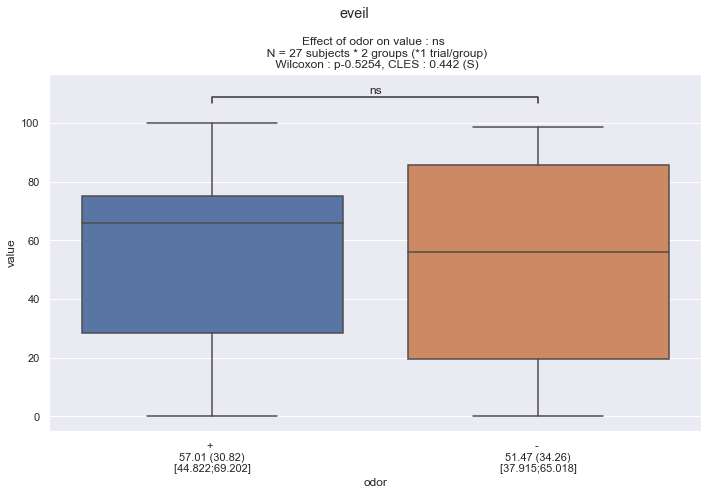

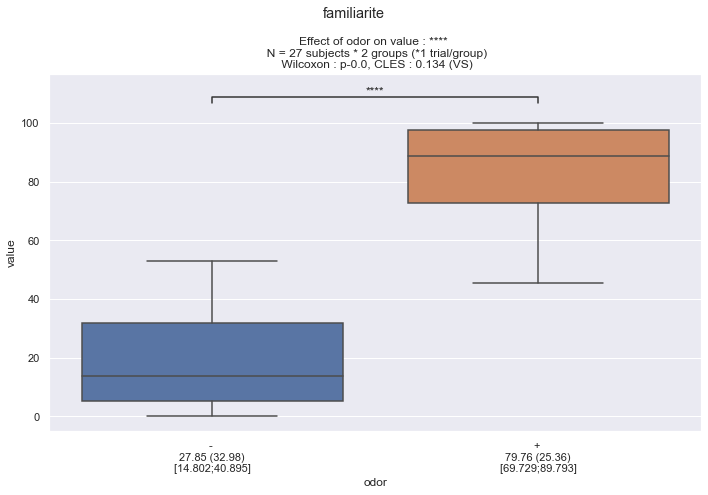

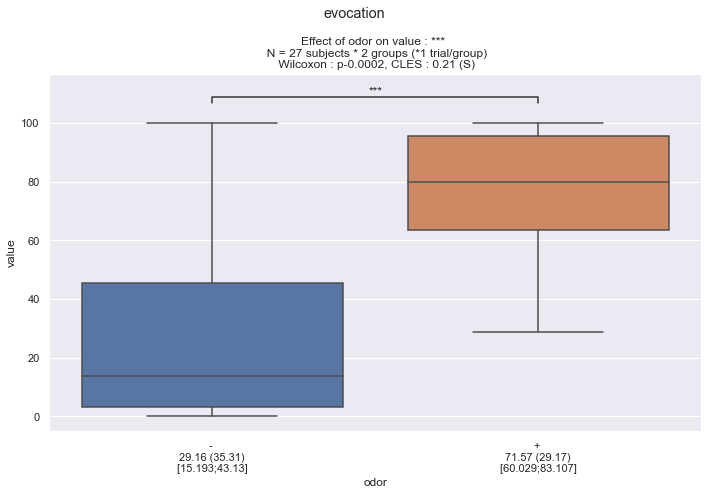

In [ ]:
predictor = 'odor' 
outcome = 'value'

for question in ['appreciation', 'eveil', 'familiarite', 'evocation']:
    df_stats = df_odor_profile_filtered.query(f"question == '{question}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{question}")
    plt.tight_layout()    

In [38]:
predictor = 'odor' 
outcome = 'value'

for question in ['appreciation', 'eveil', 'familiarite', 'evocation']:
    df_stats = df_odor_profile_filtered.query(f"question == '{question}'")
    os.chdir(os.path.join(path_results, 'allplot', 'stats', 'psycho'))
    get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='within', transform=False, verbose=True).to_excel(f'ODOR_PROFILE_allsujet_PRED_{predictor}_OUTCOME_{question}.xlsx')


/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


c:\Users\jules\Documents\myenvs\py311\Lib\site-packages\scipy\stats\_morestats.py:1879: UserWarning: Input data for shapiro has range zero. The results may not be accurate.
  warnings.warn("Input data for shapiro has range zero. The results "
z:\Projets\Olfadys\NBuonviso2022_jules_olfadys\EEG_Paris_J\Script_Python_EEG_Paris_git\n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
z:\Projets\Olfadys\NBuonviso2022_jules_olfadys\EEG_Paris_J\Script_Python_EEG_Paris_git\n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, num

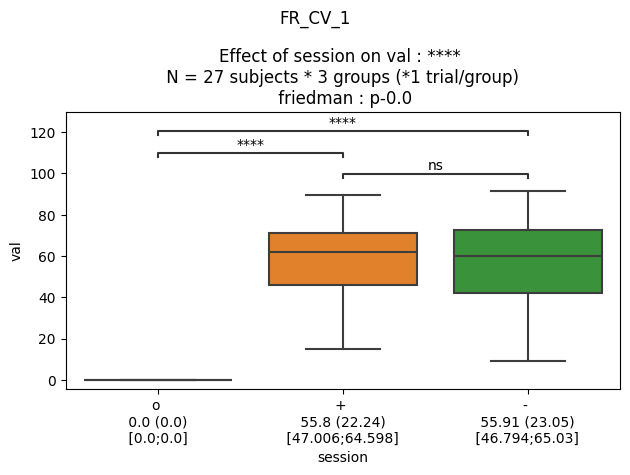

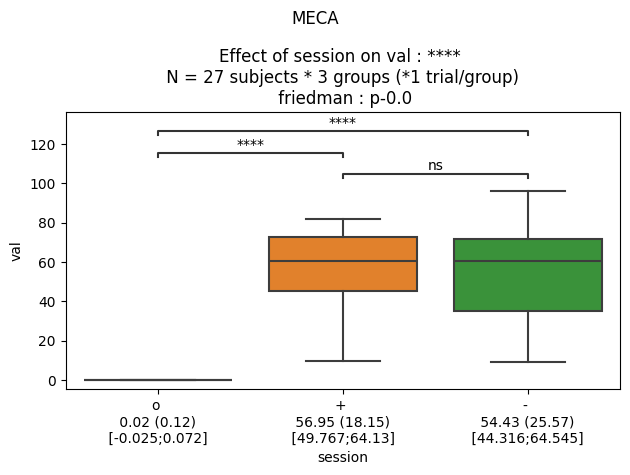

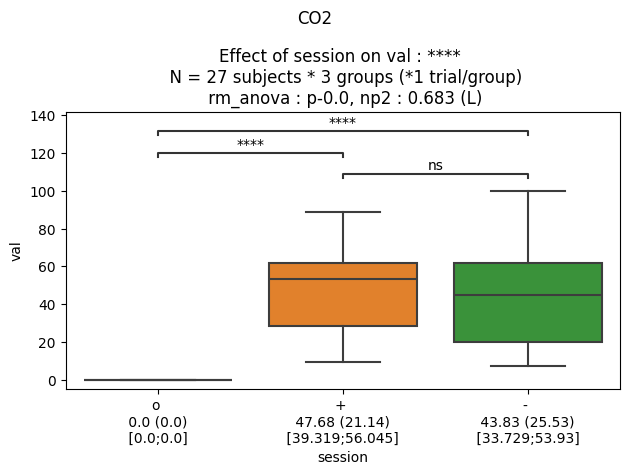

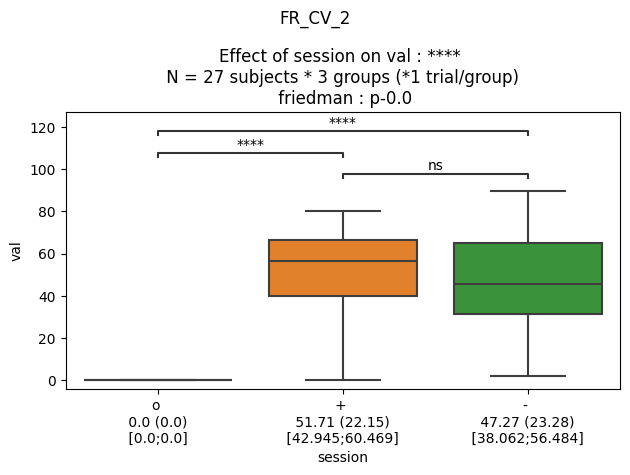

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_intensity.query(f"cond == '{cond}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{cond}")
    plt.tight_layout()

In [ ]:
df_intensity

,sujet,session,question,cond,val,select_best
7,PD01,o,8,FR_CV_1,0.000000,YES
15,PD01,o,8,MECA,0.000000,YES
23,PD01,o,8,CO2,0.000000,YES
31,PD01,o,8,FR_CV_2,0.000000,YES
39,PD01,+,8,FR_CV_1,61.783439,YES
...,...,...,...,...,...,...
3135,MA33,+,8,FR_CV_2,0.000000,YES
3143,MA33,-,8,FR_CV_1,60.000000,YES
3151,MA33,-,8,MECA,70.967742,YES
3159,MA33,-,8,CO2,62.820513,YES


/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:383: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:383: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

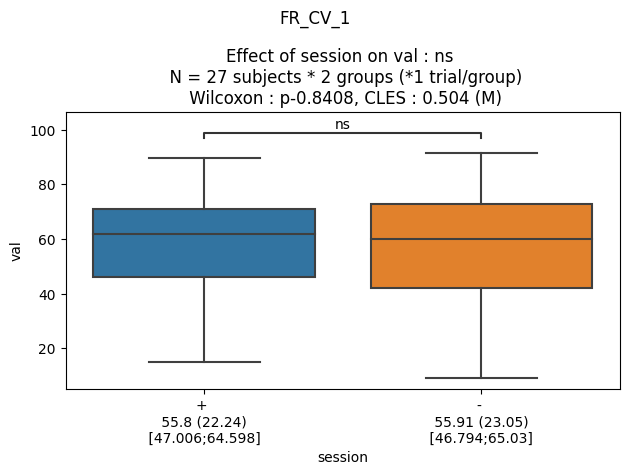

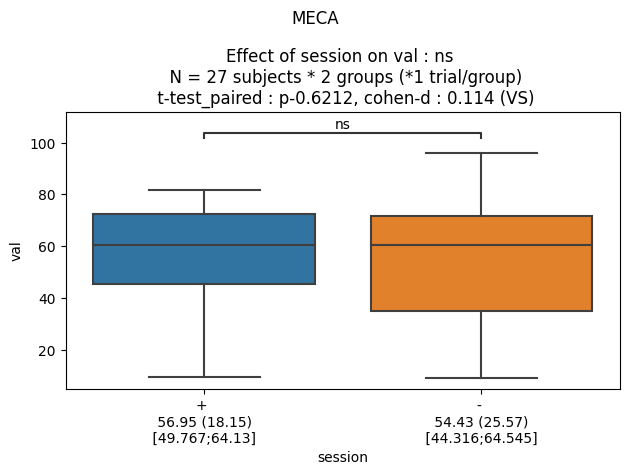

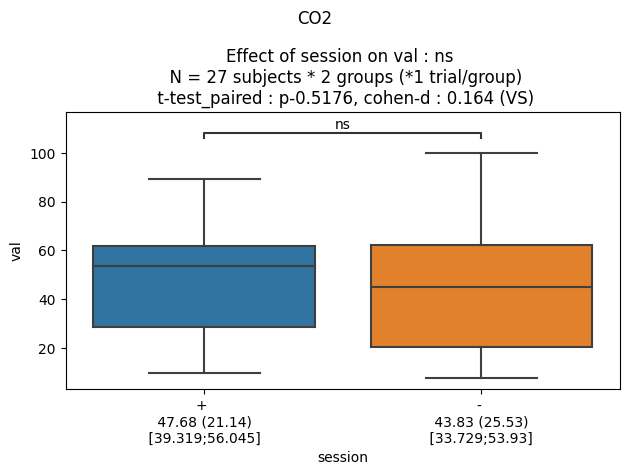

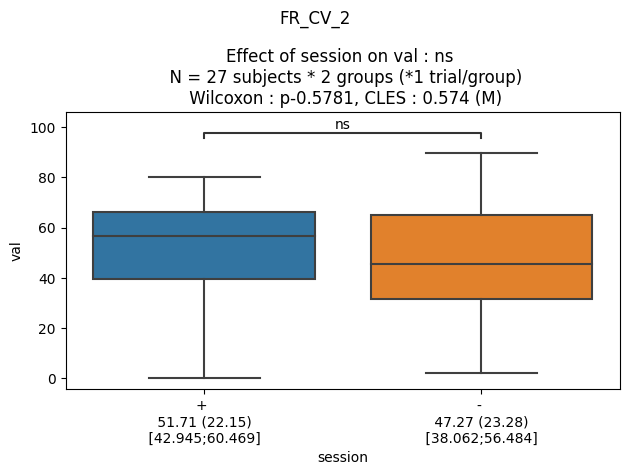

In [40]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_intensity.query(f"cond == '{cond}' and session != 'o'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{cond}")
    plt.tight_layout()

z:\Projets\Olfadys\NBuonviso2022_jules_olfadys\EEG_Paris_J\Script_Python_EEG_Paris_git\n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
z:\Projets\Olfadys\NBuonviso2022_jules_olfadys\EEG_Paris_J\Script_Python_EEG_Paris_git\n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].res

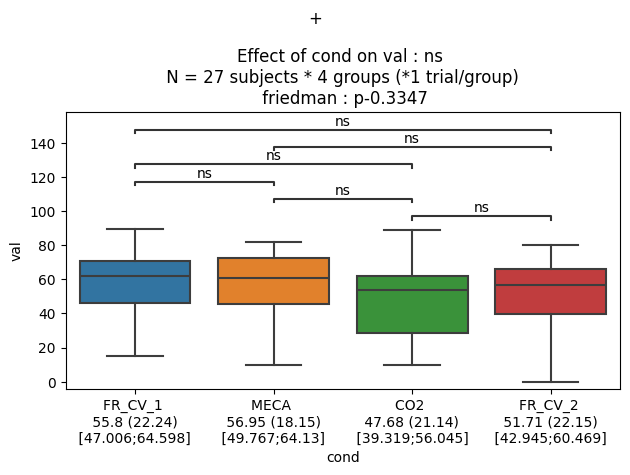

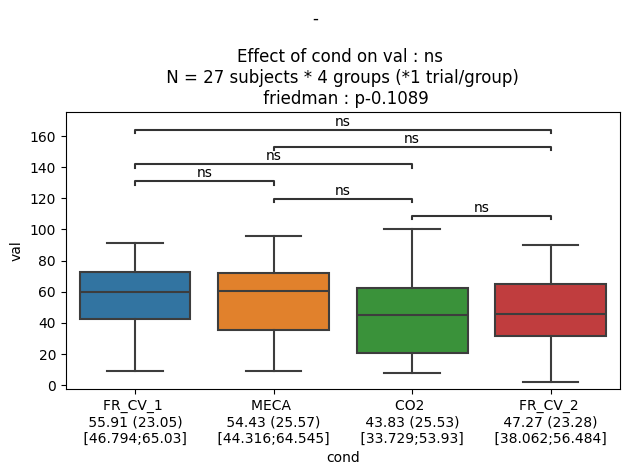

In [ ]:
predictor = 'cond' 
outcome = 'val'
for odor in odor_list:
    if odor == 'o':
        continue
    df_stats = df_intensity.query(f"session == '{odor}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(f"{odor}")
    plt.tight_layout()

In [42]:
predictor = 'cond'
outcome = 'val'
for odor in odor_list:
    if odor == 'o':
        continue
    df_stats = df_intensity.query(f"session == '{odor}'")
    os.chdir(os.path.join(path_results, 'allplot', 'stats', 'psycho'))
    get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='within', transform=False, verbose=True).to_excel(f'ODOR_INTENSITY_allsujet_PRED_{predictor}_OUTCOME_{odor}.xlsx')



/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switchi

In [ ]:
sujet_sel_diff = df_diff.query("value >= 60")['sujet'].values
sujet_sel_diff

array(['GB04', 'EF06', 'PB07', 'DM08', 'TA09', 'FA11', 'BD12', 'FP13',
       'MD14', 'LG15', 'GM16', 'JR17', 'SE18', 'TY20', 'ZV21', 'TJ24',
       'MN26', 'NT28', 'SC29', 'HJ31', 'MA33'], dtype=object)

In [ ]:
df_odor_profile

,sujet,question,odor,raw_val,scale,value,select_best
0,PD01,appreciation,11,0.0,15.0,0.000000,YES
1,PD01,appreciation,13,7.3,15.0,48.666667,YES
2,PD01,appreciation,12,8.0,15.0,53.333333,YES
3,PD01,appreciation,4,11.0,15.0,73.333333,YES
4,PD01,appreciation,5,13.1,15.0,87.333333,YES
...,...,...,...,...,...,...,...
985,MA33,evocation,13,0.0,12.5,0.000000,YES
986,MA33,evocation,6,10.2,12.5,81.600000,YES
987,MA33,evocation,12,11.3,12.5,90.400000,YES
988,MA33,evocation,7,12.5,12.5,100.000000,YES


In [ ]:
for sujet_i, sujet in enumerate(df_odor_profile['sujet'].unique()):
    odor_p = df_odor_choice.query(f"sujet == '{sujet}' & session == 'odor_+'")['odor'].values[0]
    odor_n = df_odor_choice.query(f"sujet == '{sujet}' & session == 'odor_-'")['odor'].values[0]
    odor_sel = [odor_p, odor_n]
    if sujet_i == 0:
        df_odor_profile_filtered = df_odor_profile.query(f"sujet == '{sujet}' & odor in {odor_sel}")
        df_odor_profile_filtered_p = df_odor_profile.query(f"sujet == '{sujet}' & odor == {odor_p}")
    else:
        df_i = df_odor_profile.query(f"sujet == '{sujet}' & odor in {odor_sel}")    
        df_i_p = df_odor_profile.query(f"sujet == '{sujet}' & odor == {odor_p}")    
        df_odor_profile_filtered = pd.concat([df_odor_profile_filtered, df_i], axis=0)
        df_odor_profile_filtered_p = pd.concat([df_odor_profile_filtered_p, df_i_p], axis=0)
df_odor_profile_filtered

,sujet,question,odor,raw_val,scale,value,select_best
0,PD01,appreciation,11,0.0,15.0,0.000000,YES
5,PD01,appreciation,6,14.6,15.0,97.333333,YES
8,PD01,eveil,6,9.9,15.0,66.000000,YES
11,PD01,eveil,11,14.8,15.0,98.666667,YES
12,PD01,familiarite,11,4.7,15.0,31.333333,YES
...,...,...,...,...,...,...,...
976,MA33,familiarite,6,12.5,12.5,100.000000,YES
978,MA33,intensite,6,5.4,12.5,43.200000,YES
983,MA33,intensite,11,12.5,12.5,100.000000,YES
984,MA33,evocation,11,0.0,12.5,0.000000,YES


(0.0, 100.0)

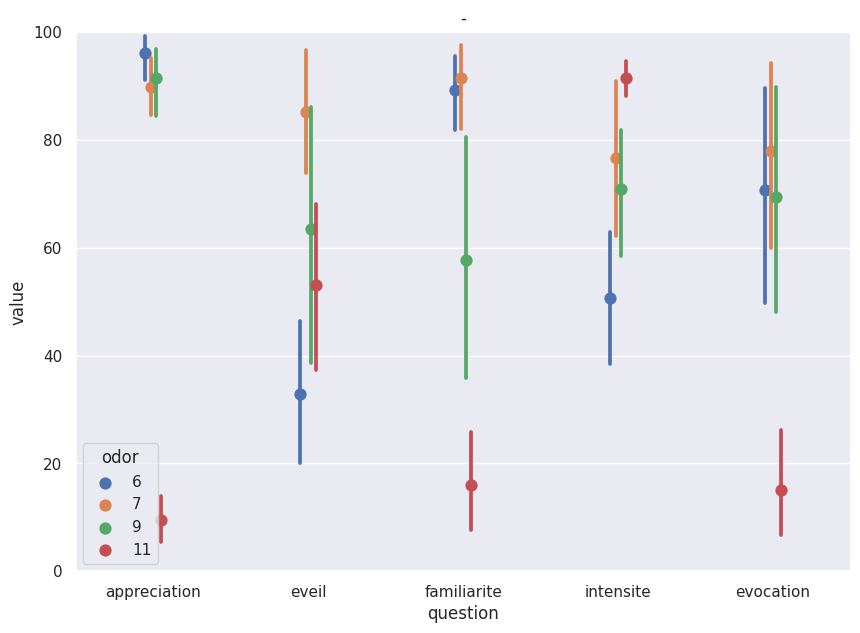

In [ ]:
odor_sel = [6, 7, 9, 11]
df_plot = df_odor_profile_filtered.query(f"odor in {odor_sel}")
sns.pointplot(data=df_plot, x="question", y="value", hue="odor", errorbar='sd', linestyles='none', dodge=True).set(title=odor)
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

In [ ]:
df_odor_profile_filtered_p

,sujet,question,odor,raw_val,scale,value,select_best
5,PD01,appreciation,6,14.6,15.0,97.333333,YES
8,PD01,eveil,6,9.9,15.0,66.000000,YES
17,PD01,familiarite,6,14.2,15.0,94.666667,YES
18,PD01,intensite,6,7.1,15.0,47.333333,YES
29,PD01,evocation,6,14.1,15.0,94.000000,YES
...,...,...,...,...,...,...,...
965,MA33,appreciation,6,12.5,12.5,100.000000,YES
967,MA33,eveil,6,1.5,12.5,12.000000,YES
976,MA33,familiarite,6,12.5,12.5,100.000000,YES
978,MA33,intensite,6,5.4,12.5,43.200000,YES


<Axes: xlabel='value', ylabel='Count'>

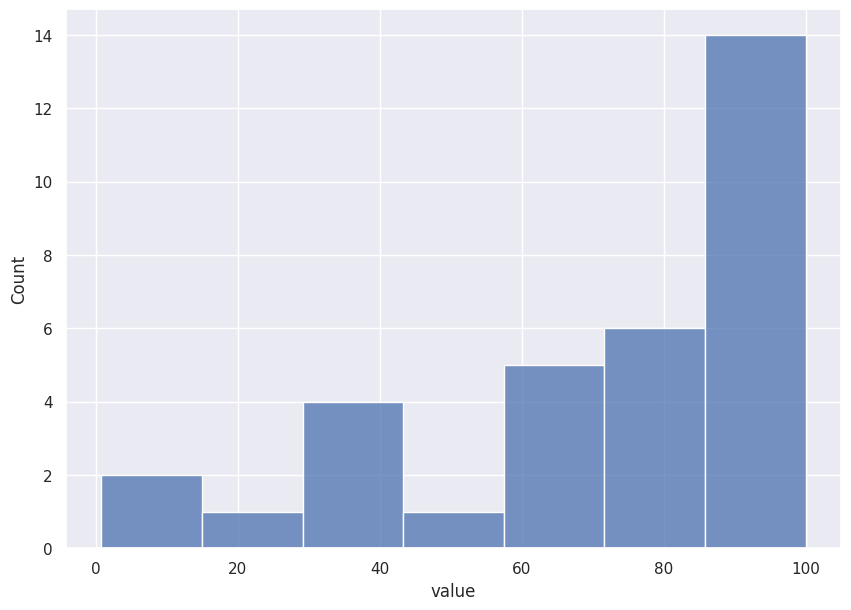

In [ ]:
df_plot = df_odor_profile_filtered_p.query(f"question == 'evocation'")
sns.histplot(data=df_plot, x="value")

In [ ]:
sujet_sel_evoc = df_odor_profile_filtered_p.query(f"question == 'evocation' & value >= 60")['sujet'].unique()

# MDP ANALYSIS

## experimental discomfort

In [29]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S,group,A1
0,01PD,o,49.315507,7.241427,7.188733,REP,9
1,03VN,o,54.132044,7.243436,6.856938,REP,7
2,05LV,o,68.663220,6.411272,6.203500,NO_REP,8
3,06EF,o,47.157457,6.038375,4.894141,NO_REP,7
4,07PB,o,65.216693,5.947063,3.555419,NO_REP,8
...,...,...,...,...,...,...,...
76,29SC,-,59.775720,6.322902,6.956098,REP,9
77,30AR,-,59.686274,7.858206,7.906425,NO_REP,9
78,31HJ,-,43.976907,6.370555,6.291526,REP,8
79,32CM,-,61.331429,5.377888,6.603407,REP,8


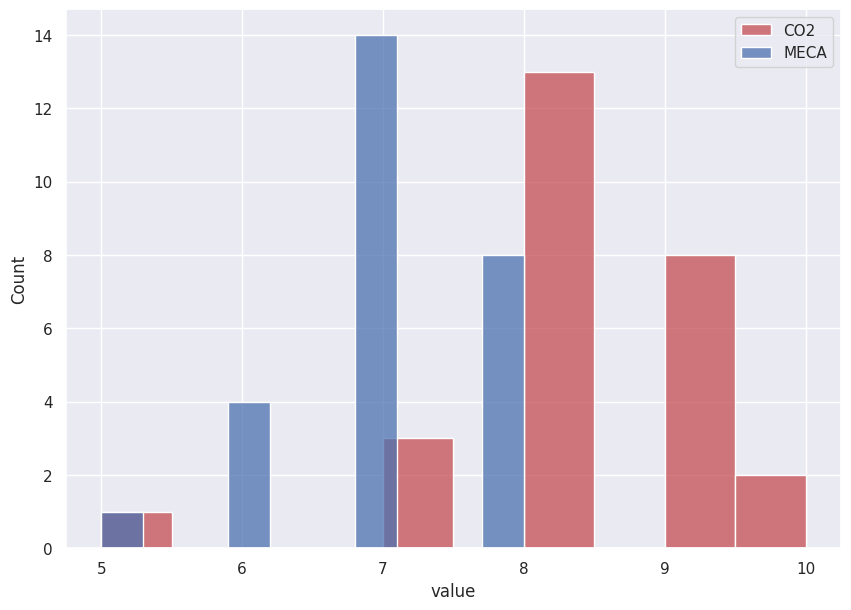

In [ ]:
df_plot = df_mdp.query(f"question == 'A1' and session == 'o' and cond == 'CO2'")
sns.histplot(data=df_plot, x='value', label='CO2', color='r', bins=10)

df_plot = df_mdp.query(f"question == 'A1' and session == 'o' and cond == 'MECA'")
sns.histplot(data=df_plot, x='value', label='MECA', color='b', bins=10)

plt.legend()

(0.0, 10.5)

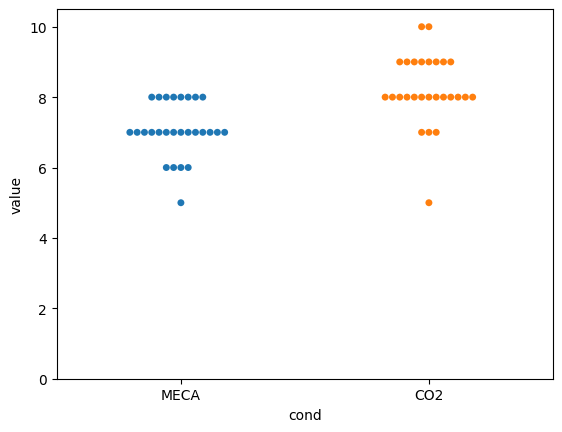

In [26]:
df_plot = df_mdp.query(f"question == 'A1' and session == 'o'")
sns.swarmplot(data=df_plot, x='cond', y='value')
plt.ylim(0,10.5)

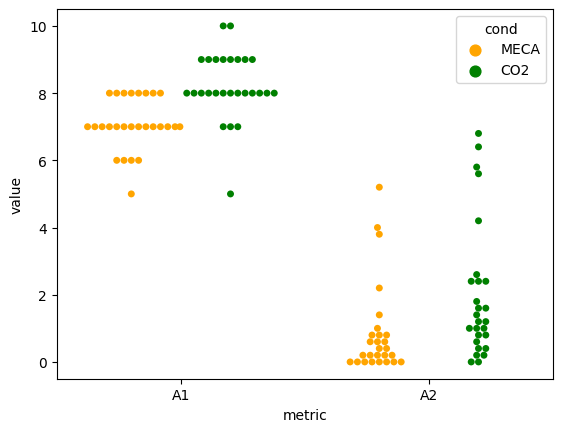

In [25]:
df_plot = pd.melt(df_mdp_A1A2, id_vars=['sujet', 'session', 'cond'], value_vars=['A1', 'A2'], var_name='metric', value_name='value')
df_plot = df_plot.query(f"session == 'o'")
sns.swarmplot(data=df_plot, x='metric', y='value', hue='cond', dodge=True, hue_order=['MECA', 'CO2'], palette=['orange', 'green'])
plt.show()

In [34]:
print('MECA')
print(df_mdp.query(f"question == 'A1' and session == 'o' and cond == 'MECA'")['value'].mean(), df_mdp.query(f"question == 'A1' and session == 'o' and cond == 'MECA'")['value'].std()) 
print('CO2')
print(df_mdp.query(f"question == 'A1' and session == 'o' and cond == 'CO2'")['value'].mean(), df_mdp.query(f"question == 'A1' and session == 'o' and cond == 'CO2'")['value'].std()) 

MECA
7.074074074074074 0.7808243142260682
CO2
8.222222222222221 1.0127393670836666


In [28]:
predictor = 'cond' 

for outcome_i in ['value']:

    df_stats = df_mdp.query(f"question == 'A1' and session == 'o'")
    os.chdir(os.path.join(path_results, 'allplot', 'stats', 'psycho'))
    get_auto_stats_df_allvalues(df_stats, predictor, outcome_i, subject='sujet', design='within', transform=False, verbose=True).to_excel(f'MDP_ANALYSIS_A2cond_PRED_{predictor}_OUTCOME_{outcome_i}.xlsx')


/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFr

<AxesSubplot: title={'center': 'Effect of cond on value : *** \n  N = 27 subjects * 2 groups (*1 trial/group) \n Wilcoxon : p-0.0005, CLES : 0.169 (VS)'}, xlabel='cond', ylabel='value'>

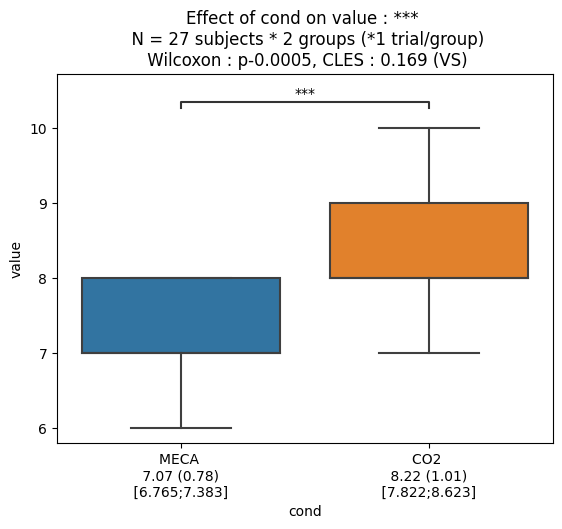

In [ ]:
predictor, outcome = 'cond', 'value'
df_stats = df_mdp.query(f"question == 'A1' and session == 'o'")
auto_stats(df_stats, predictor, outcome, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFr

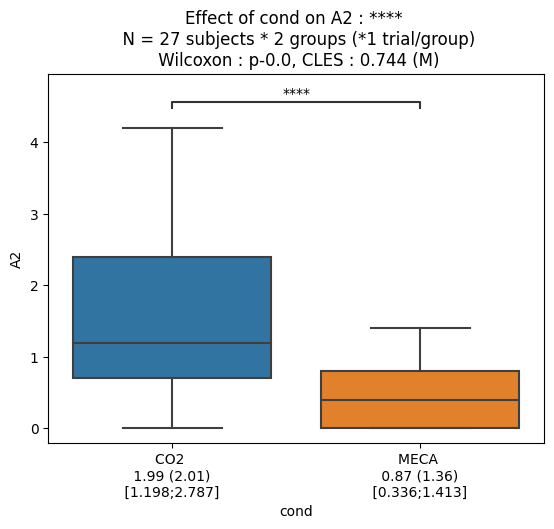

In [53]:
predictor, outcome = 'cond', 'A2'
df_stats = df_mdp_A1A2.query(f"session == 'o'")
auto_stats(df_stats, predictor, outcome, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
plt.show()

In [ ]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S,A1
0,01PD,o,49.315507,7.241427,7.188733,9
1,03VN,o,54.132044,7.243436,6.856938,7
2,05LV,o,68.663220,6.411272,6.203500,8
3,06EF,o,47.157457,6.038375,4.894141,7
4,07PB,o,65.216693,5.947063,3.555419,8
...,...,...,...,...,...,...
76,29SC,-,59.775720,6.322902,6.956098,9
77,30AR,-,59.686274,7.858206,7.906425,9
78,31HJ,-,43.976907,6.370555,6.291526,8
79,32CM,-,61.331429,5.377888,6.603407,8


<Axes: xlabel='PetCO2', ylabel='Count'>

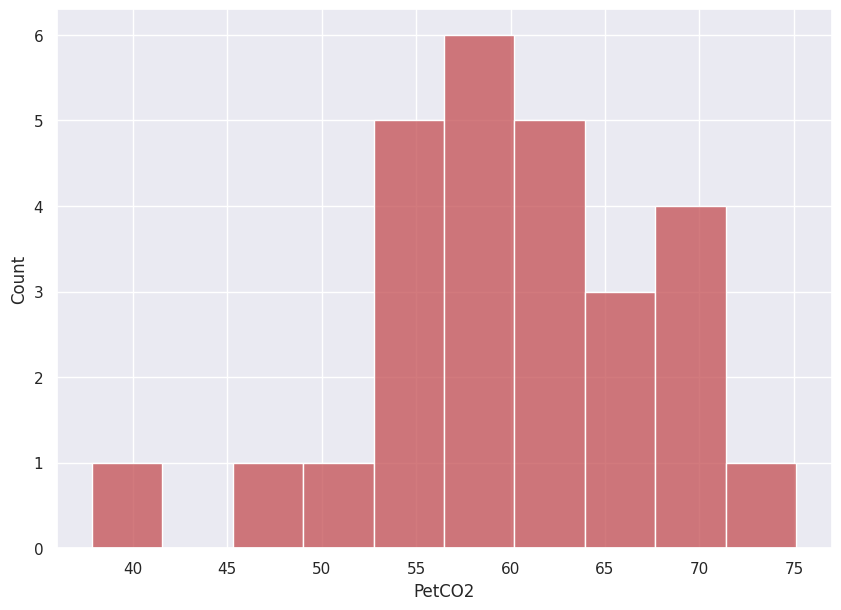

In [ ]:
df_plot = df_CO2.query(f"odor == 'o'")
sns.histplot(data=df_plot, x='PetCO2', label='CO2', color='r', bins=10)

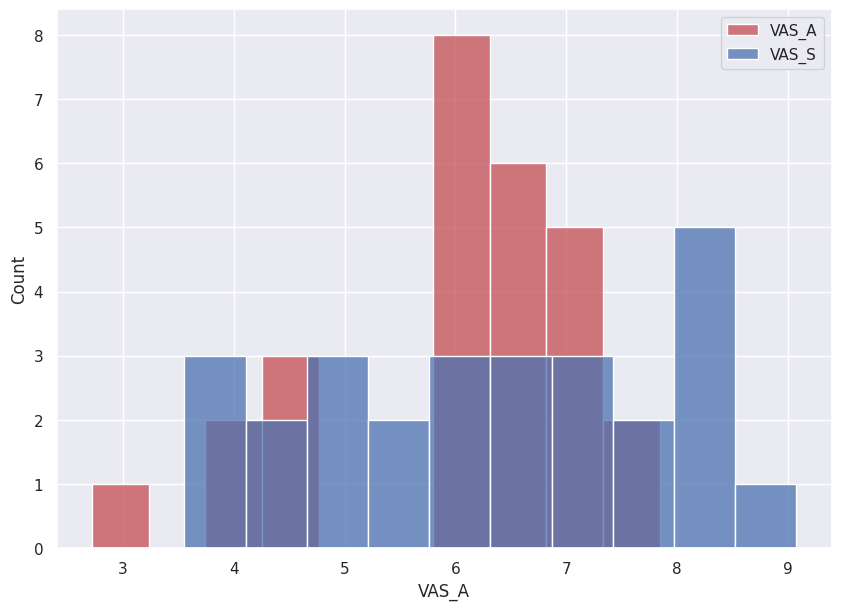

In [ ]:
df_plot = df_CO2.query(f"odor == 'o'")
sns.histplot(data=df_plot, x='VAS_A', label='VAS_A', color='r', bins=10)
sns.histplot(data=df_plot, x='VAS_S', label='VAS_S', color='b', bins=10)
plt.legend()

In [ ]:
df_CO2.query(f"odor == 'o'").sort_values(by=['VAS_A'])

,sujet,odor,PetCO2,VAS_A,VAS_S,A1
11,14MD,o,65.298323,2.719711,4.138997,8
18,23LF,o,70.145070,3.789622,4.786719,8
5,08DM,o,75.125578,3.819823,3.789791,7
16,20TY,o,67.856116,4.623040,8.092091,8
17,21ZV,o,61.550712,4.657067,6.370881,8
8,11FA,o,55.457999,4.751648,5.753333,8
6,09TA,o,58.082566,5.803949,5.581536,9
15,19TM,o,62.891516,5.862157,8.091534,9
21,28NT,o,52.816515,5.874702,4.328411,10
4,07PB,o,65.216693,5.947063,3.555419,8


In [ ]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S,A1
0,01PD,o,49.315507,7.241427,7.188733,9
1,03VN,o,54.132044,7.243436,6.856938,7
2,05LV,o,68.663220,6.411272,6.203500,8
3,06EF,o,47.157457,6.038375,4.894141,7
4,07PB,o,65.216693,5.947063,3.555419,8
...,...,...,...,...,...,...
76,29SC,-,59.775720,6.322902,6.956098,9
77,30AR,-,59.686274,7.858206,7.906425,9
78,31HJ,-,43.976907,6.370555,6.291526,8
79,32CM,-,61.331429,5.377888,6.603407,8


In [ ]:
dict = {'sujet' : [], 'odor' : [], 'metric' : [], 'val' : []}

for sujet in df_CO2['sujet']:

    for odor in odor_list:

        for metric_i in ['PetCO2', 'VAS_A', 'VAS_S']:

            val = df_CO2.query(f"sujet == '{sujet}' and odor == '{odor}'")[metric_i].values[0]

            if metric_i == 'PetCO2':

                val = (val - df_CO2.query(f"odor == '{odor}'")['PetCO2'].min()) * 10 / (df_CO2.query(f"odor == '{odor}'")['PetCO2'].max() - df_CO2.query(f"odor == '{odor}'")['PetCO2'].min())

            dict['sujet'].append(sujet)
            dict['odor'].append(odor)
            dict['metric'].append(metric_i)
            dict['val'].append(val)

df_CO2_tidy = pd.DataFrame(dict)
df_CO2_tidy

,sujet,odor,metric,val
0,01PD,o,PetCO2,3.079725
1,01PD,o,VAS_A,7.241427
2,01PD,o,VAS_S,7.188733
3,01PD,+,PetCO2,2.015881
4,01PD,+,VAS_A,5.125228
...,...,...,...,...
724,33MA,+,VAS_A,5.009362
725,33MA,+,VAS_S,3.502957
726,33MA,-,PetCO2,4.533859
727,33MA,-,VAS_A,5.009362


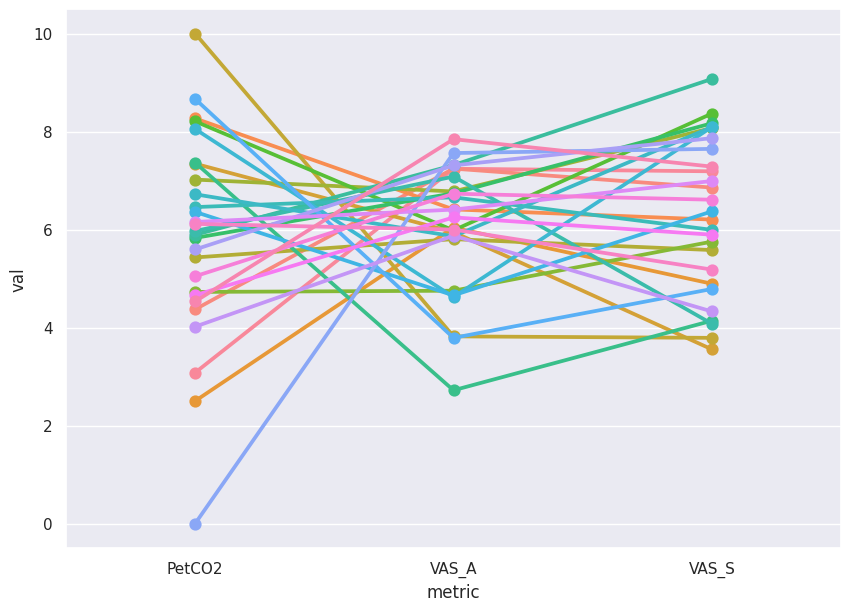

In [ ]:
fig, ax = plt.subplots()
df_plot = df_CO2_tidy.query(f"odor == 'o'")
sns.pointplot(data=df_plot, x="metric", y="val", hue="sujet", ax=ax)
plt.legend([],[], frameon=False)
sns.set(rc={'figure.figsize':(10,7)})

In [ ]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S,A1
0,01PD,o,49.315507,7.241427,7.188733,9
1,03VN,o,54.132044,7.243436,6.856938,7
2,05LV,o,68.663220,6.411272,6.203500,8
3,06EF,o,47.157457,6.038375,4.894141,7
4,07PB,o,65.216693,5.947063,3.555419,8
...,...,...,...,...,...,...
76,29SC,-,59.775720,6.322902,6.956098,9
77,30AR,-,59.686274,7.858206,7.906425,9
78,31HJ,-,43.976907,6.370555,6.291526,8
79,32CM,-,61.331429,5.377888,6.603407,8


/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


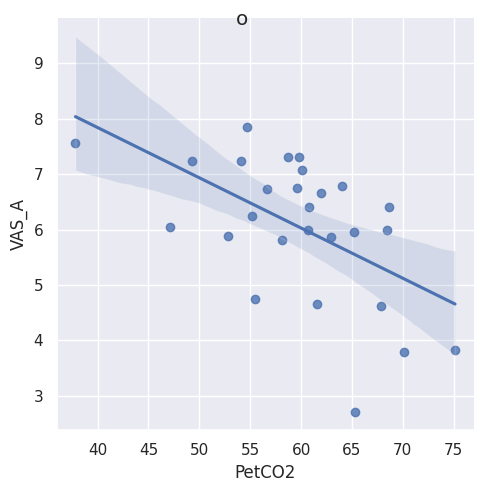

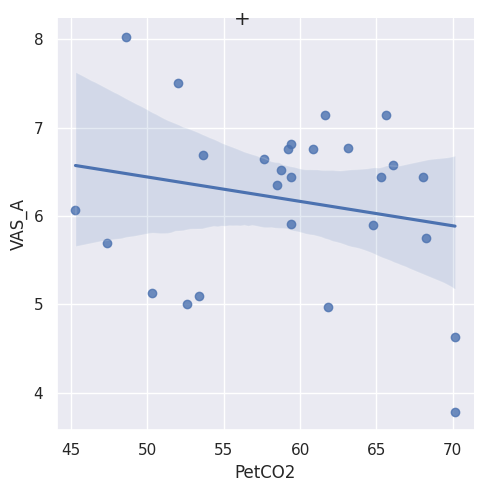

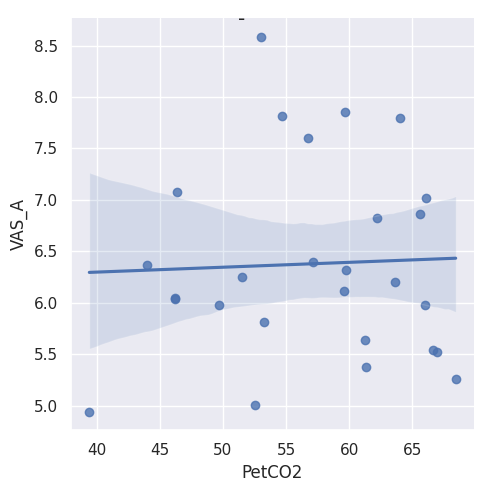

In [ ]:
for odor in odor_list:
    df_plot = df_CO2.query(f"odor == '{odor}'")
    sns.lmplot(data=df_plot, x="PetCO2", y="VAS_A")
    plt.suptitle(odor)

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


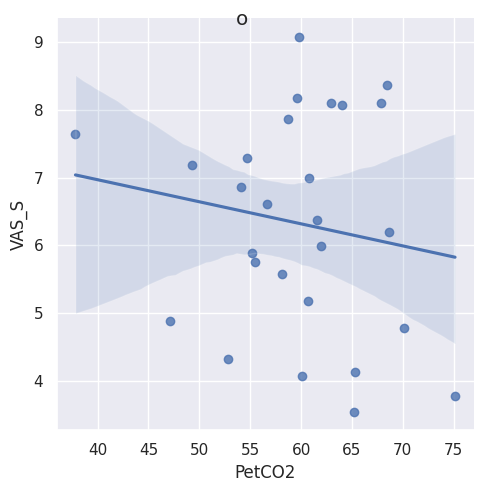

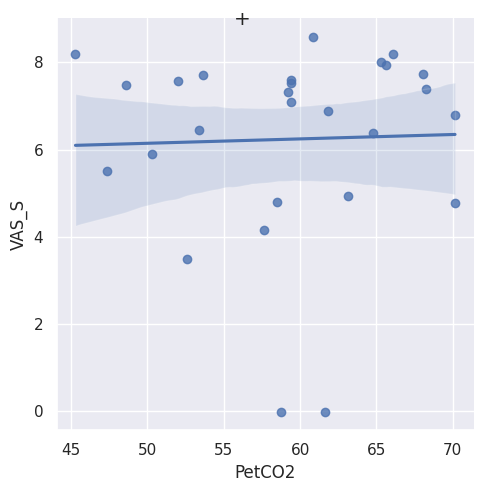

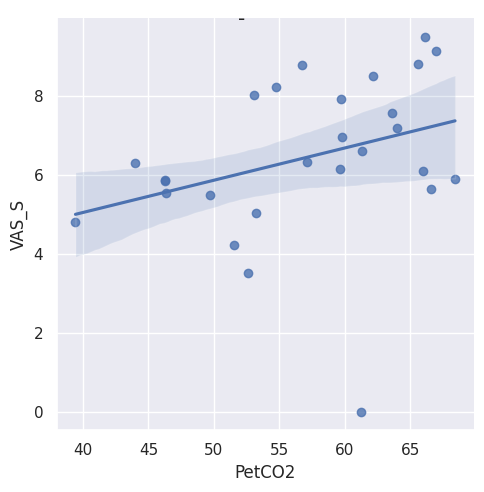

In [ ]:
for odor in odor_list:
    df_plot = df_CO2.query(f"odor == '{odor}'")
    sns.lmplot(data=df_plot, x="PetCO2", y="VAS_S")
    plt.suptitle(odor)

In [30]:
df_CO2

,sujet,odor,PetCO2,VAS_A,VAS_S,group,A1
0,01PD,o,49.315507,7.241427,7.188733,REP,9
1,03VN,o,54.132044,7.243436,6.856938,REP,7
2,05LV,o,68.663220,6.411272,6.203500,NO_REP,8
3,06EF,o,47.157457,6.038375,4.894141,NO_REP,7
4,07PB,o,65.216693,5.947063,3.555419,NO_REP,8
...,...,...,...,...,...,...,...
76,29SC,-,59.775720,6.322902,6.956098,REP,9
77,30AR,-,59.686274,7.858206,7.906425,NO_REP,9
78,31HJ,-,43.976907,6.370555,6.291526,REP,8
79,32CM,-,61.331429,5.377888,6.603407,REP,8


In [35]:
pd.melt(df_CO2, id_vars=['sujet', 'odor', 'group'], value_vars=['VAS_A', 'VAS_S', 'A1'], var_name='metric', value_name='value')

,sujet,odor,group,metric,value
0,01PD,o,REP,VAS_A,7.241427
1,03VN,o,REP,VAS_A,7.243436
2,05LV,o,NO_REP,VAS_A,6.411272
3,06EF,o,NO_REP,VAS_A,6.038375
4,07PB,o,NO_REP,VAS_A,5.947063
...,...,...,...,...,...
238,29SC,-,REP,A1,9.000000
239,30AR,-,NO_REP,A1,9.000000
240,31HJ,-,REP,A1,8.000000
241,32CM,-,REP,A1,8.000000


In [42]:
pd.melt(df_CO2, id_vars=['sujet', 'odor', 'group'], value_vars=['PetCO2'], var_name='metric', value_name='value')

,sujet,odor,group,metric,value
0,01PD,o,REP,PetCO2,49.315507
1,03VN,o,REP,PetCO2,54.132044
2,05LV,o,NO_REP,PetCO2,68.663220
3,06EF,o,NO_REP,PetCO2,47.157457
4,07PB,o,NO_REP,PetCO2,65.216693
...,...,...,...,...,...
76,29SC,-,REP,PetCO2,59.775720
77,30AR,-,NO_REP,PetCO2,59.686274
78,31HJ,-,REP,PetCO2,43.976907
79,32CM,-,REP,PetCO2,61.331429


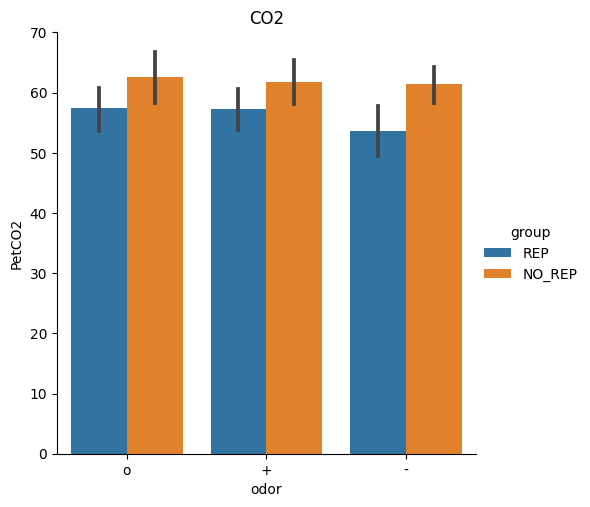

In [55]:
df_plot = df_CO2
sns.catplot(data=df_plot, kind='bar', x="odor", y="PetCO2", hue="group")
plt.legend([],[], frameon=False)
plt.title(cond)
plt.show()

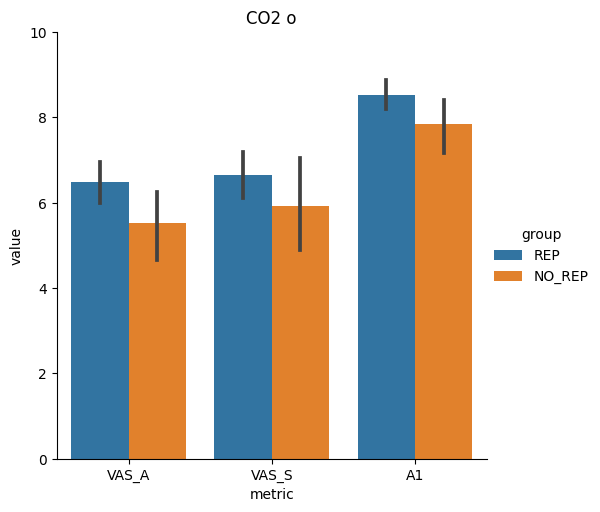

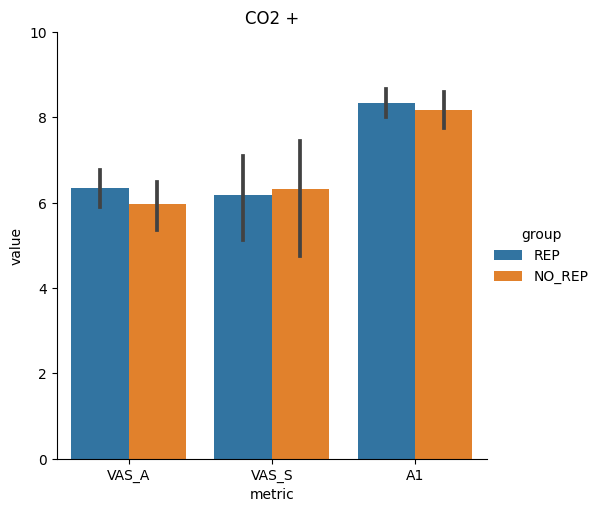

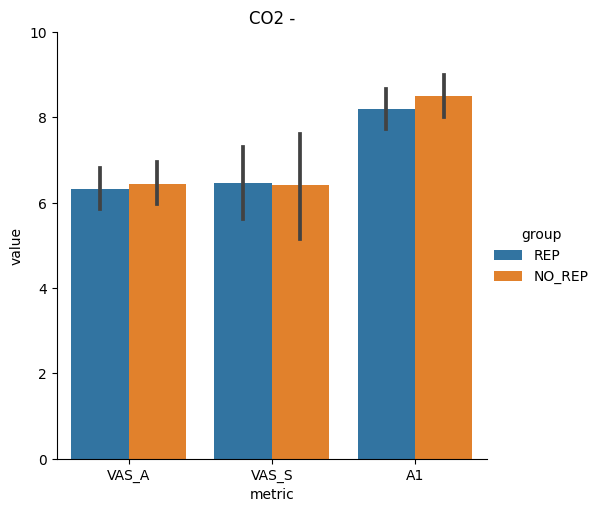

In [56]:
for odor in odor_list:
    df_plot = pd.melt(df_CO2.query(f"odor == '{odor}'"), id_vars=['sujet', 'odor', 'group'], value_vars=['VAS_A', 'VAS_S', 'A1'], var_name='metric', value_name='value')
    sns.catplot(data=df_plot, kind='bar', x="metric", y="value", hue="group")
    plt.legend([],[], frameon=False)
    plt.title(f"{cond} {odor}")
    plt.ylim(0,10)
    plt.show()

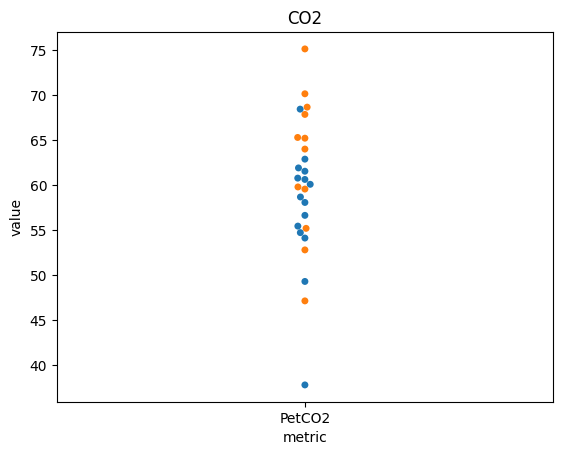

In [48]:
df_plot = pd.melt(df_CO2.query(f"odor == 'o'"), id_vars=['sujet', 'odor', 'group'], value_vars=['PetCO2'], var_name='metric', value_name='value')
sns.swarmplot(data=df_plot, x="metric", y="value", hue="group")
plt.legend([],[], frameon=False)
plt.title(cond)
plt.show()

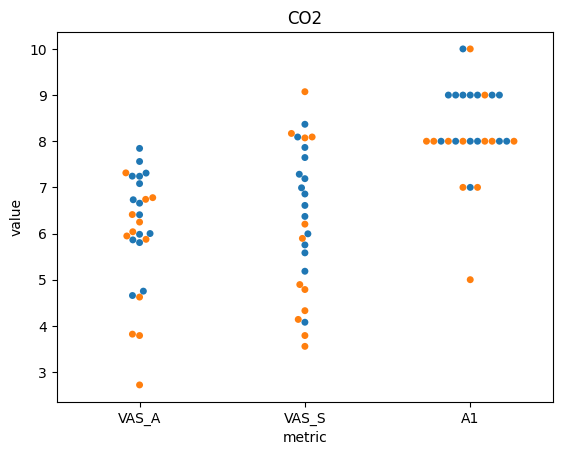

In [49]:
df_plot = pd.melt(df_CO2.query(f"odor == 'o'"), id_vars=['sujet', 'odor', 'group'], value_vars=['VAS_A', 'VAS_S', 'A1'], var_name='metric', value_name='value')
sns.swarmplot(data=df_plot, x="metric", y="value", hue="group")
plt.legend([],[], frameon=False)
plt.title(cond)
plt.show()

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

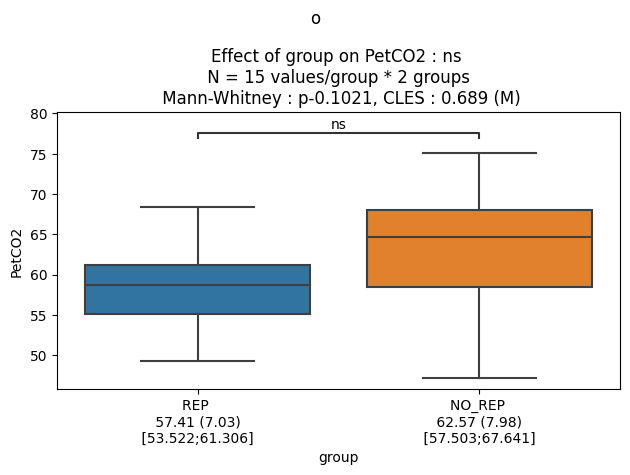

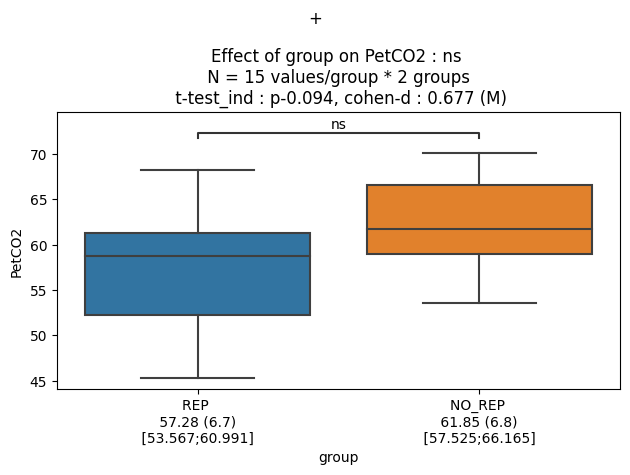

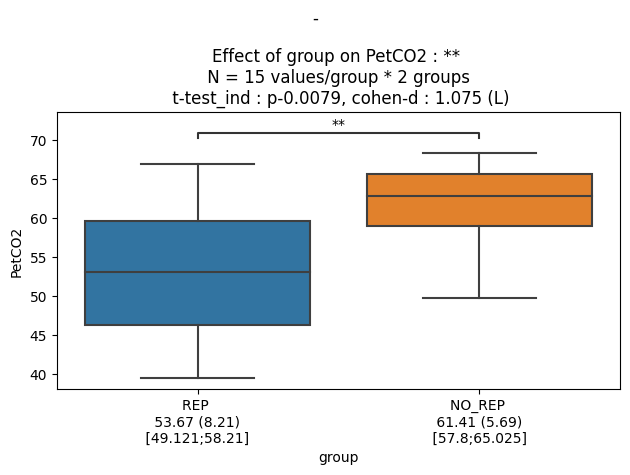

In [59]:
for odor in odor_list:
    predictor = 'group' 
    outcome = 'PetCO2'
    df_stats = df_CO2.query(f"odor == '{odor}'")
    fig, ax = plt.subplots()
    plt.suptitle(odor)
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)
    plt.tight_layout()

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

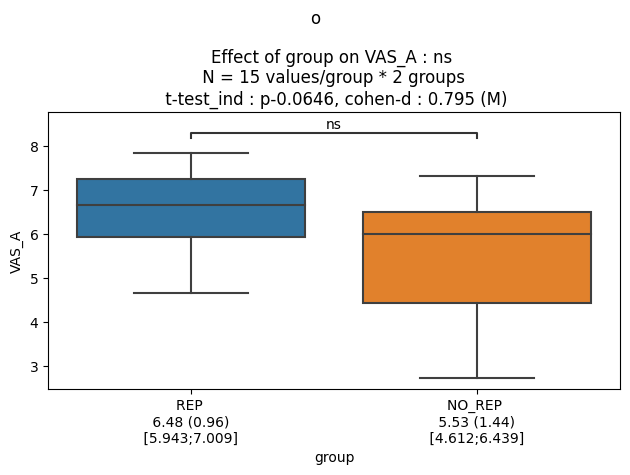

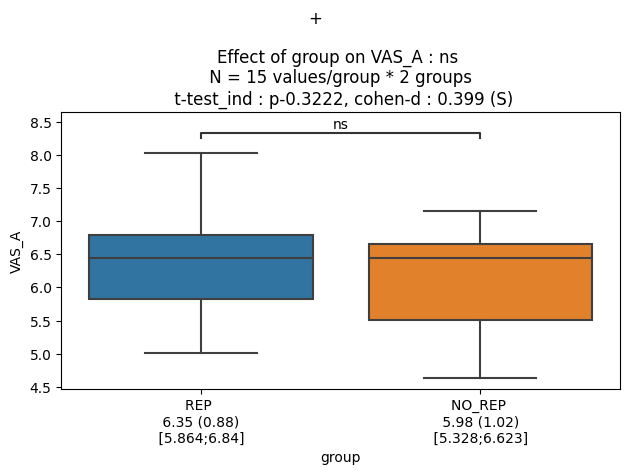

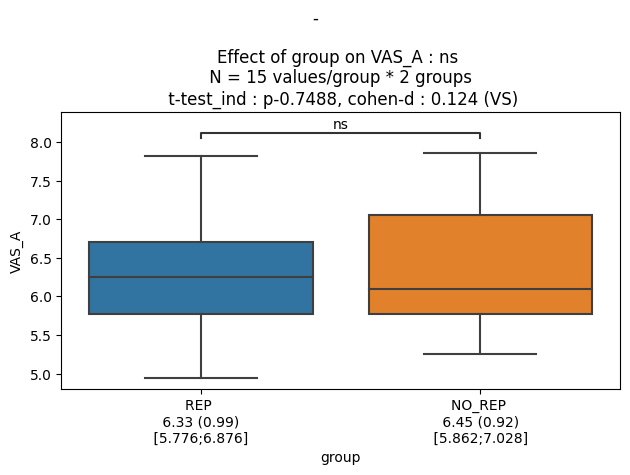

In [63]:
for odor in odor_list:
    predictor = 'group' 
    outcome = 'VAS_A'
    df_stats = df_CO2.query(f"odor == '{odor}'")
    fig, ax = plt.subplots()
    plt.suptitle(odor)
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)
    plt.tight_layout()

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

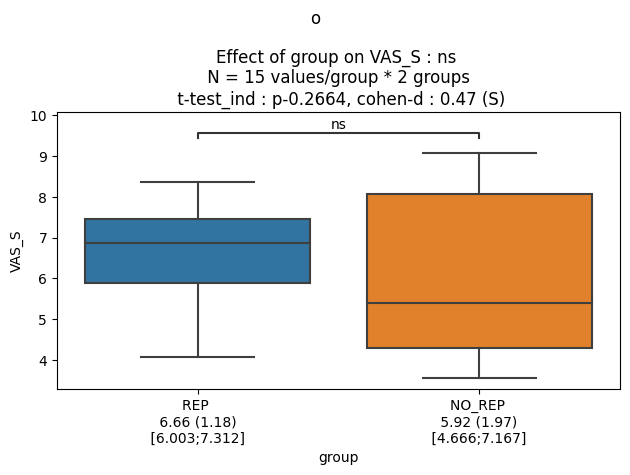

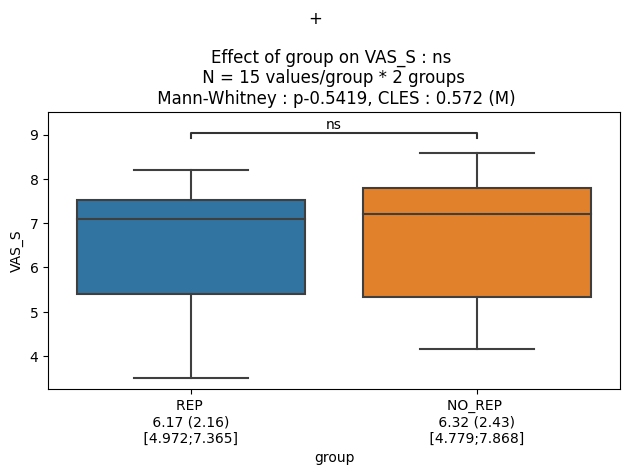

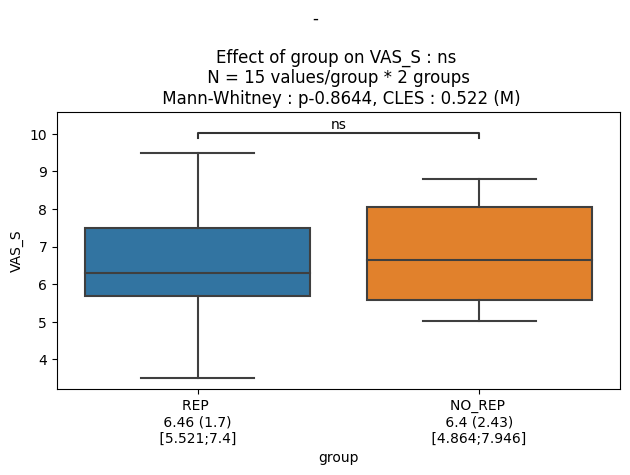

In [61]:
for odor in odor_list:
    predictor = 'group' 
    outcome = 'VAS_S'
    df_stats = df_CO2.query(f"odor == '{odor}'")
    fig, ax = plt.subplots()
    plt.suptitle(odor)
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)
    plt.tight_layout()

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

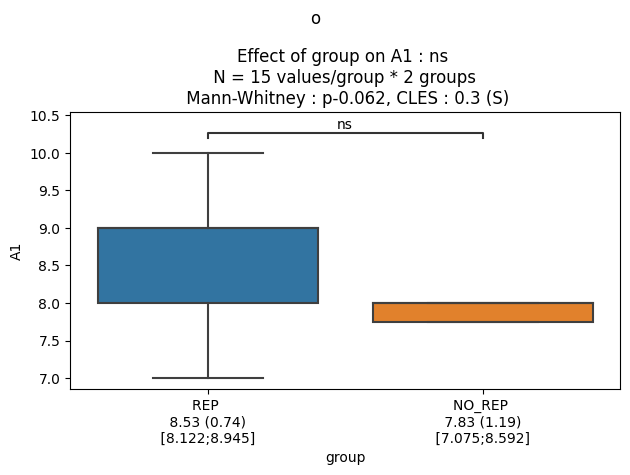

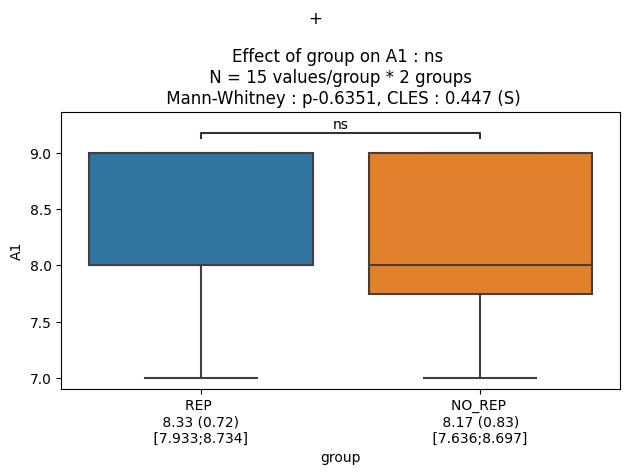

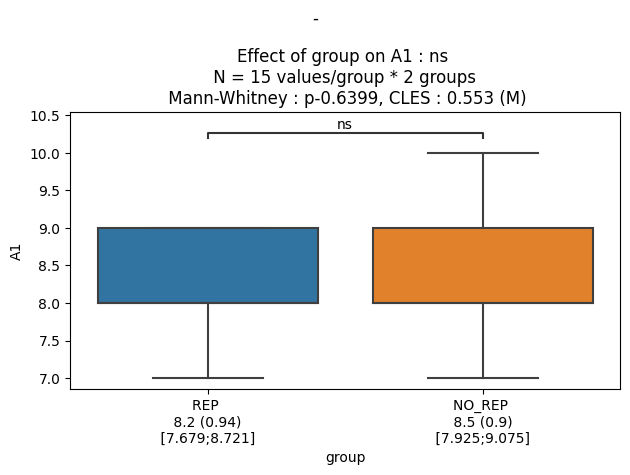

In [64]:
for odor in odor_list:
    predictor = 'group' 
    outcome = 'A1'
    df_stats = df_CO2.query(f"odor == '{odor}'")
    fig, ax = plt.subplots()
    plt.suptitle(odor)
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)
    plt.tight_layout()

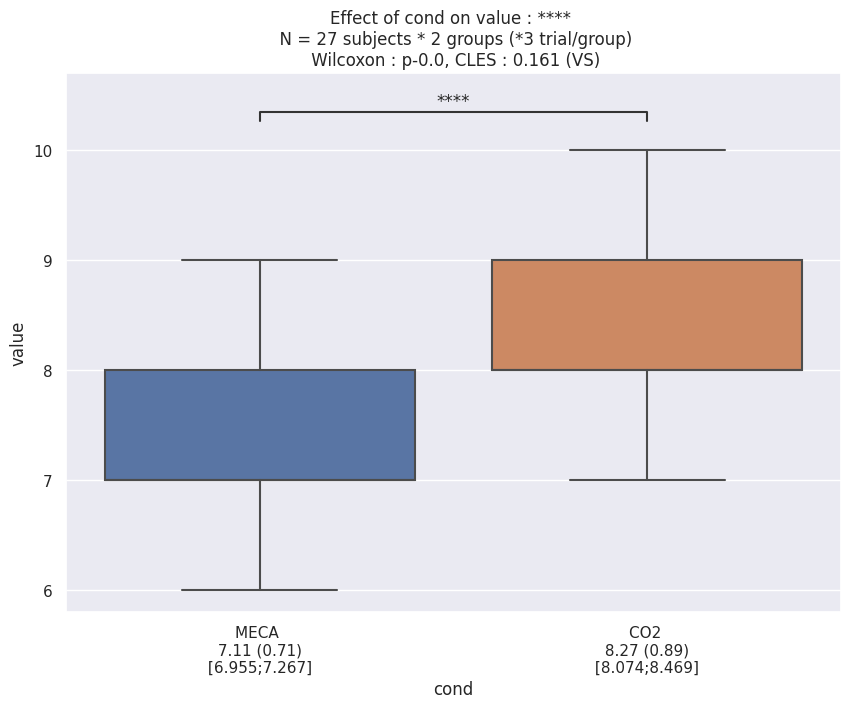

In [ ]:
predictor = 'cond' 
outcome = 'value'
df_stats = df_mdp.query(f"question == 'A1'")
fig, ax = plt.subplots()
ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

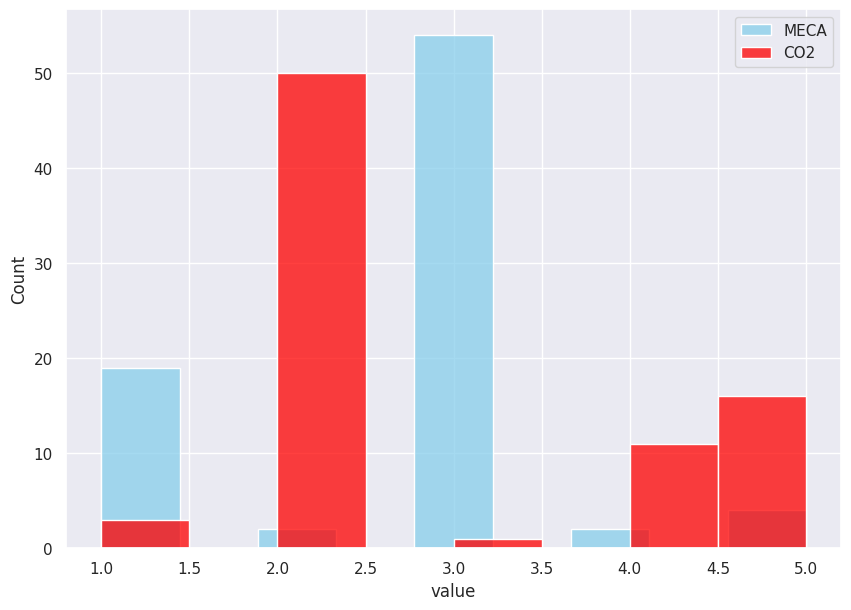

In [ ]:
df_plot = df_mdp[(df_mdp['cond'] == 'MECA').values & (df_mdp['question'] == 'QS_P').values]
sns.histplot(data=df_plot, x="value", label='MECA', color="skyblue")
df_plot = df_mdp[(df_mdp['cond'] == 'CO2').values & (df_mdp['question'] == 'QS_P').values]
sns.histplot(data=df_plot, x="value", label='CO2', color="red")

plt.legend()


## ODOR

In [30]:
df_mdp_A1A2


,sujet,session,cond,A1,A2
0,AR30,+,CO2,7.0,1.6
1,AR30,+,MECA,8.0,0.0
2,AR30,-,CO2,9.0,0.2
3,AR30,-,MECA,7.0,0.0
4,AR30,o,CO2,5.0,0.0
...,...,...,...,...,...
157,ZV21,+,MECA,7.0,0.0
158,ZV21,-,CO2,9.0,2.2
159,ZV21,-,MECA,8.0,0.0
160,ZV21,o,CO2,8.0,2.4


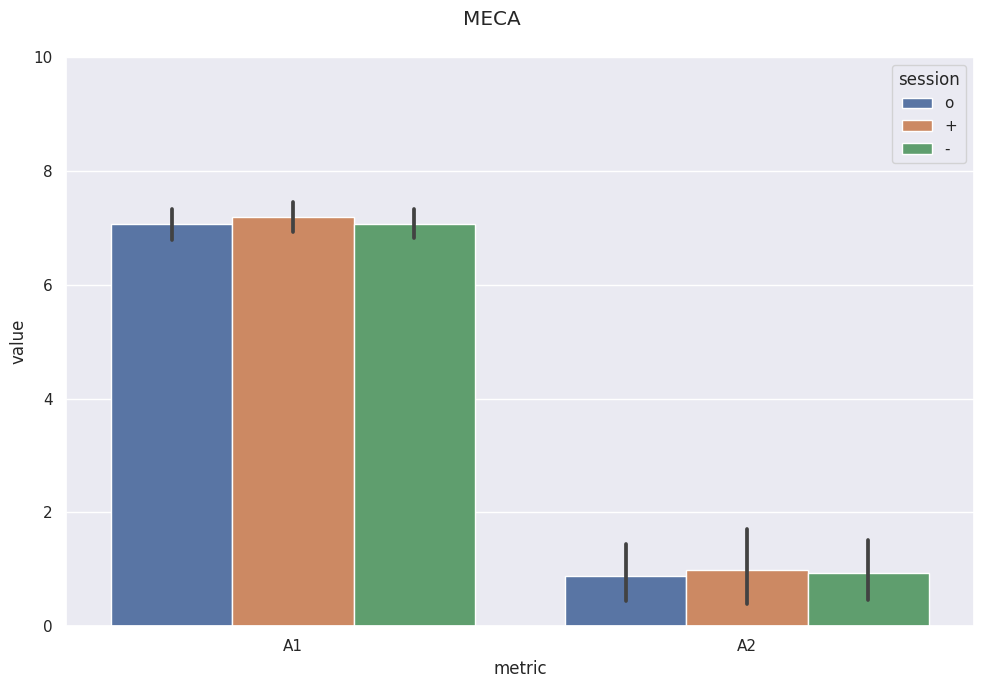

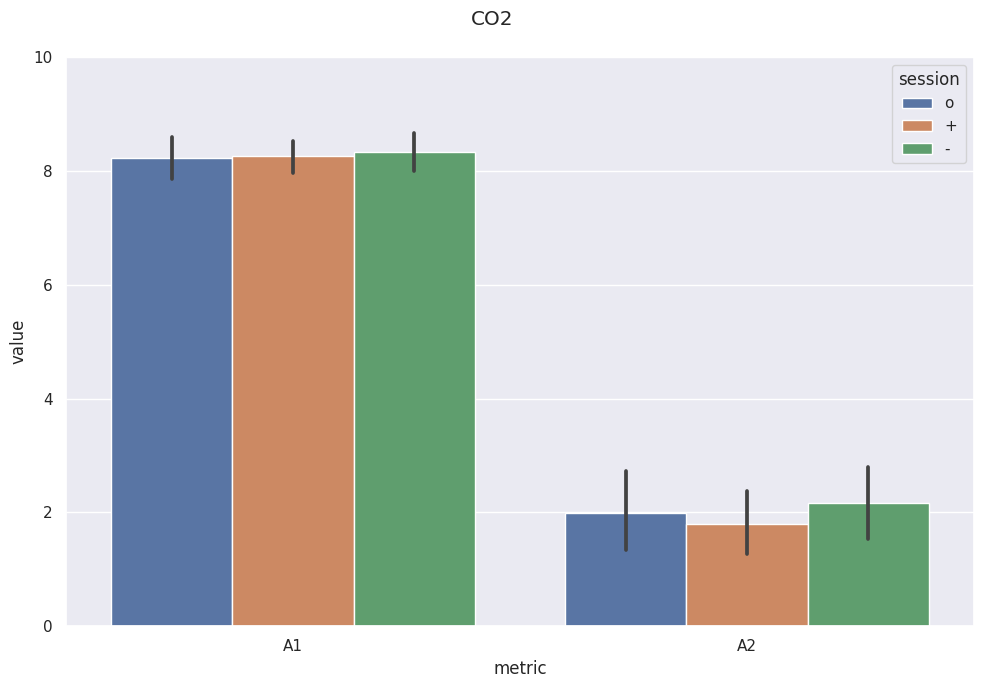

In [101]:
for cond in ['MECA', 'CO2']:
    df_plot = pd.melt(df_mdp_A1A2, id_vars=['sujet', 'session', 'cond'], value_vars=['A1', 'A2'], var_name='metric', value_name='value')
    df_plot = df_plot.query(f"cond == '{cond}'")
    sns.barplot(data=df_plot, x='metric', y='value', hue='session', hue_order=['o', '+', '-'], dodge=True)
    plt.suptitle(cond)
    plt.ylim(0, 10)
    plt.tight_layout()
    plt.show()

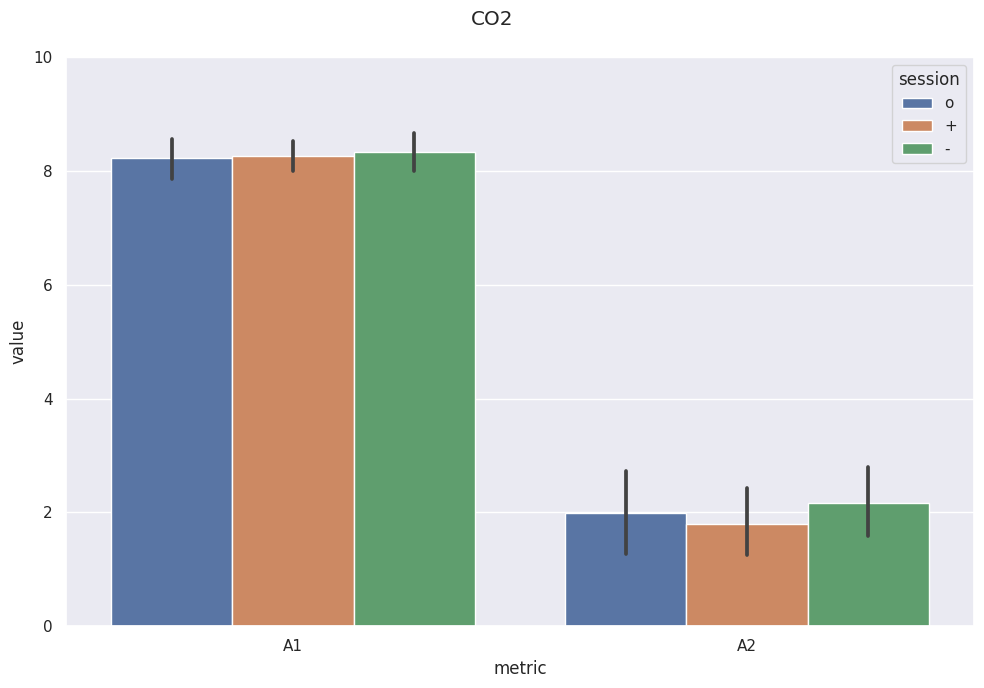

In [104]:
df_plot = pd.melt(df_mdp_A1A2, id_vars=['sujet', 'session', 'cond'], value_vars=['A1', 'A2'], var_name='metric', value_name='value')
df_plot = df_plot.query(f"cond == 'CO2'")
sns.barplot(data=df_plot, x='metric', y='value', hue='session', hue_order=['o', '+', '-'], dodge=True)
plt.suptitle('CO2')
plt.ylim(0, 10)
plt.tight_layout()
plt.show()

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

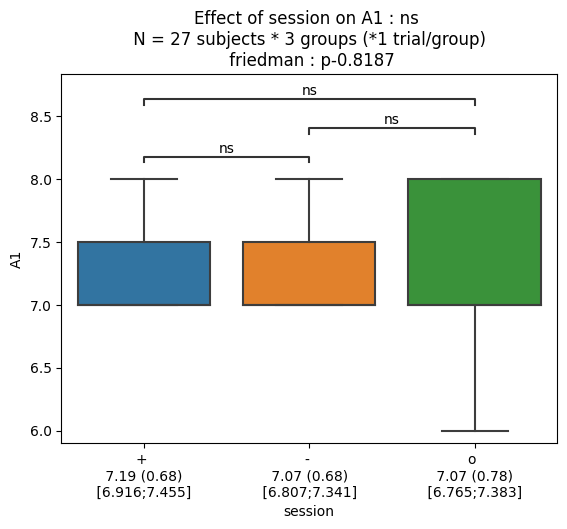

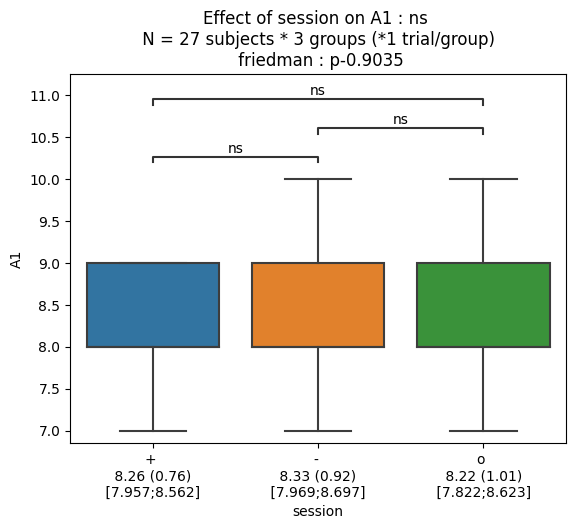

In [52]:
metric = 'A1'
for cond in ['MECA', 'CO2']:
    predictor, outcome = 'session', metric
    df_stats = df_mdp_A1A2.query(f"cond == '{cond}'")
    auto_stats(df_stats, predictor, outcome, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

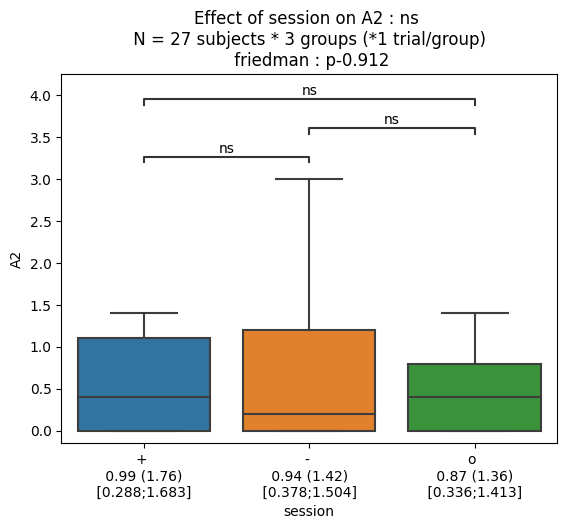

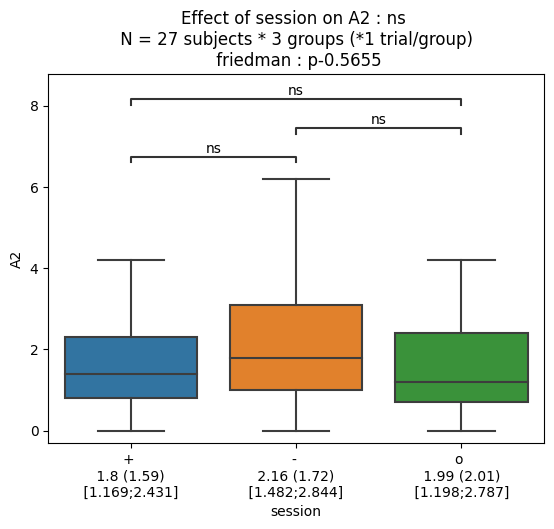

In [53]:
metric = 'A2'
for cond in ['MECA', 'CO2']:
    predictor, outcome = 'session', metric
    df_stats = df_mdp_A1A2.query(f"cond == '{cond}'")
    auto_stats(df_stats, predictor, outcome, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tigh

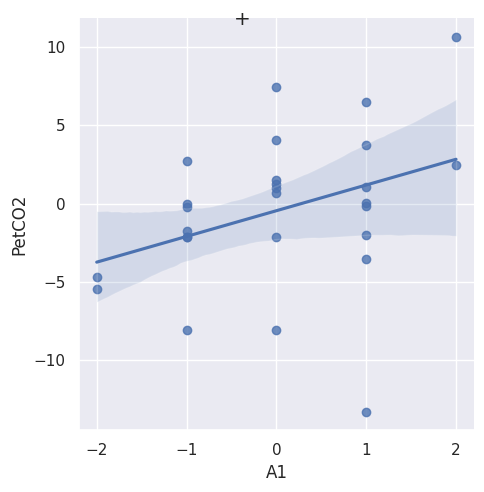

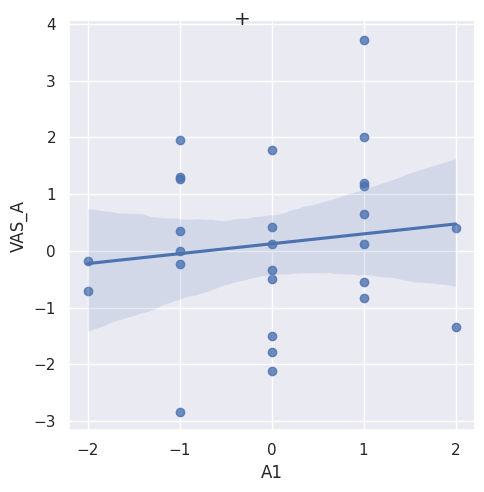

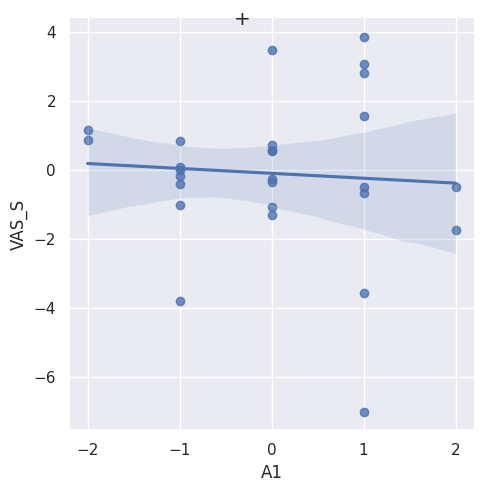

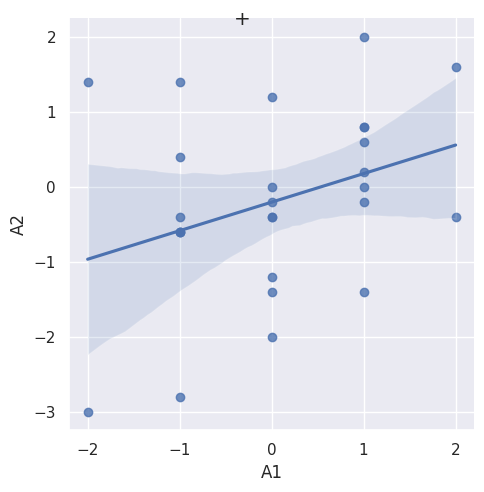

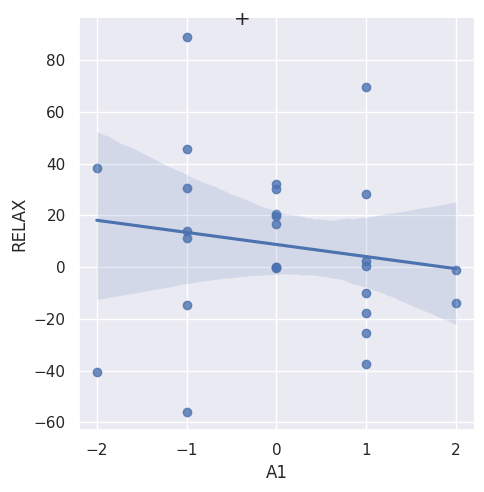

...

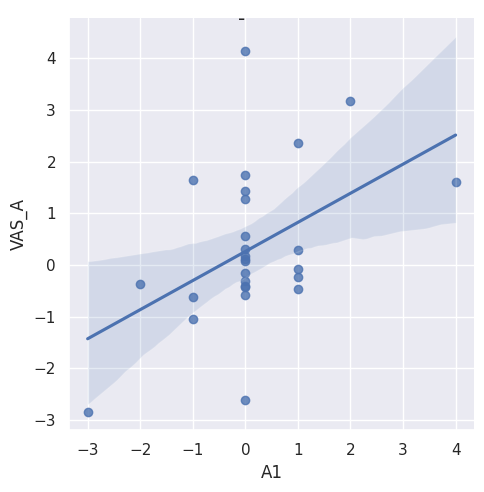

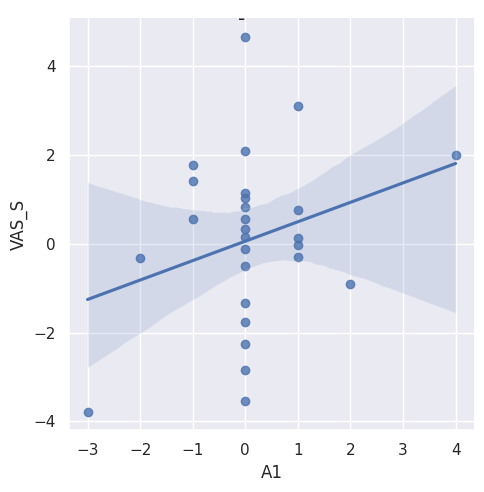

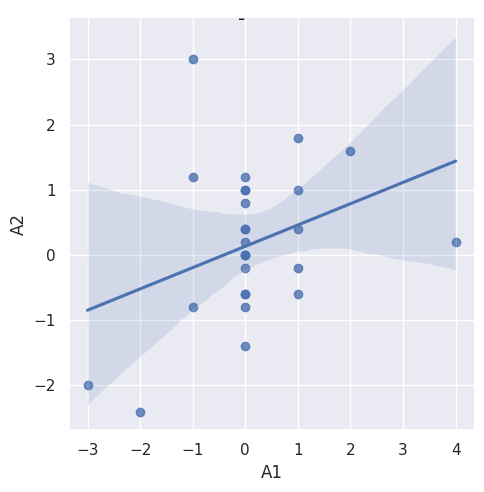

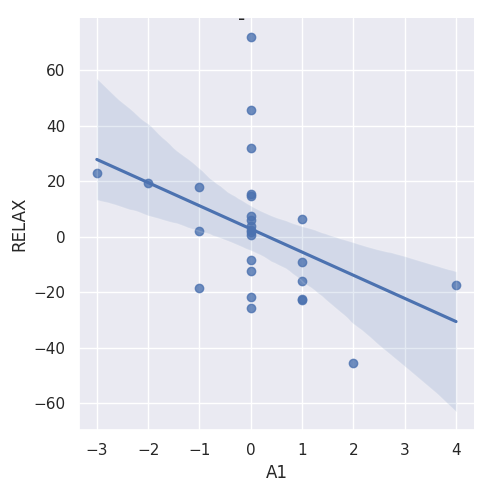

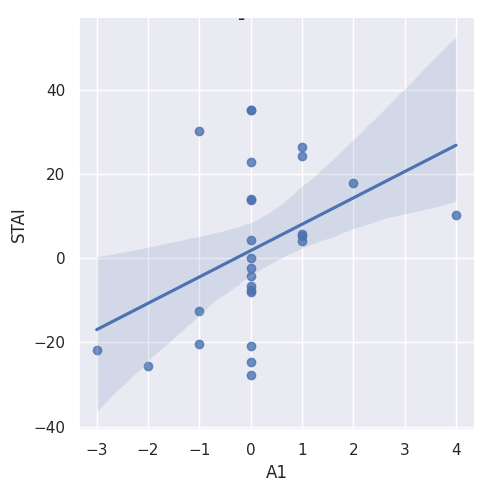

In [ ]:
for odor in ['+', '-']:
    for metric in ['PetCO2', 'VAS_A', 'VAS_S', 'A2', 'RELAX', 'STAI']:
        df_plot = df_diff_CO2.query(f"odor == '{odor}'")
        sns.lmplot(data=df_plot, x="A1", y=metric)
        plt.suptitle(odor)

In [ ]:
df_diff_CO2.query("odor == '-'").sort_values(by='A1')

,sujet,odor,PetCO2,VAS_A,VAS_S,A1,A2,RELAX,STAI
53,MA33,-,-2.159641,-2.835284,-3.781536,-3,-2.0,23.076923,-21.817072
49,HJ31,-,-12.674257,-0.361220,-0.317507,-2,-2.4,19.230769,-25.747863
51,CM32,-,0.694079,-0.621929,1.420566,-1,3.0,-18.589744,30.235043
17,FA11,-,1.677171,1.649087,0.567115,-1,-0.8,2.172861,-12.519149
27,GM16,-,-13.866407,-1.036064,1.773131,-1,1.2,17.989548,-20.337933
11,DM08,-,-6.707150,1.435969,2.102841,0,0.2,1.636701,-7.533124
3,VN03,-,-7.796824,-0.163153,-1.329320,0,0.4,3.821656,35.244161
43,NT28,-,-3.112392,0.107871,1.146990,0,1.0,-25.641026,4.273504
41,MN26,-,-5.659183,1.277053,0.143017,0,1.0,15.384615,-24.679487
39,TJ24,-,1.601735,-2.619088,-2.836249,0,-1.4,2.564103,-4.273504


In [ ]:
df_mdp.query("question == 'A1'")

data = {'sujet' : [], 'session' : [], 'cond' : [], 'value' : [], 'select_best' : []}

for sujet in sujet_list_rev:

    for cond in ['MECA', 'CO2']:

        for odor in ['+', '-']:

            _diff = df_mdp.query(f"question == 'A1' and sujet == '{sujet}' and cond == '{cond}' and session == '{odor}'")['value'].values[0] - df_mdp.query(f"question == 'A1' and sujet == '{sujet}' and cond == '{cond}' and session == 'o'")['value'].values[0]

            data['sujet'].append(sujet)
            data['session'].append(odor)
            data['cond'].append(cond)
            data['value'].append(_diff)

            if sujet in sujet_best_list:
                data['select_best'].append('YES')
            else:
                data['select_best'].append('NO')

df_A1_diff = pd.DataFrame(data)
df_A1_diff


,sujet,session,cond,value,select_best
0,PD01,+,MECA,0,YES
1,PD01,-,MECA,0,YES
2,PD01,+,CO2,0,YES
3,PD01,-,CO2,0,YES
4,VN03,+,MECA,0,YES
...,...,...,...,...,...
103,CM32,-,CO2,-1,YES
104,MA33,+,MECA,0,YES
105,MA33,-,MECA,0,YES
106,MA33,+,CO2,-1,YES


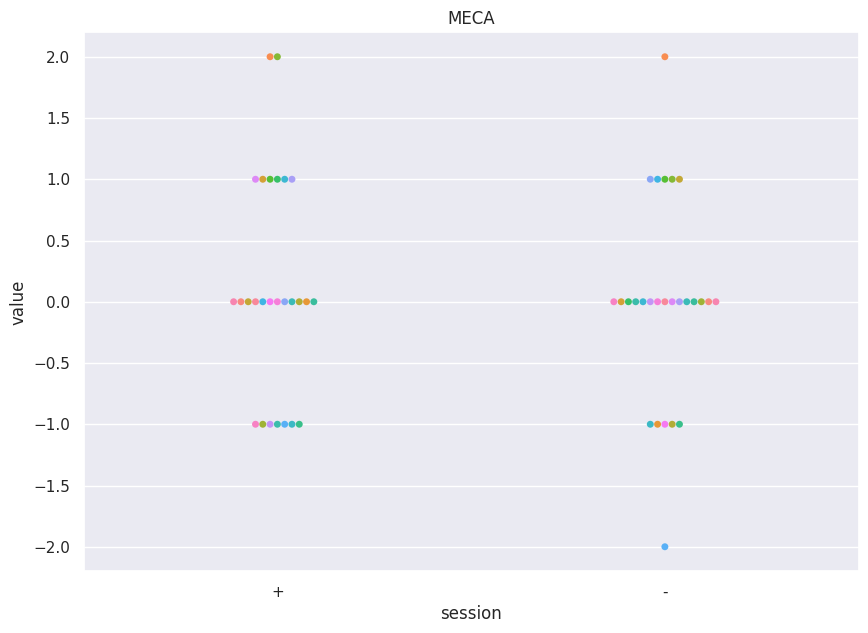

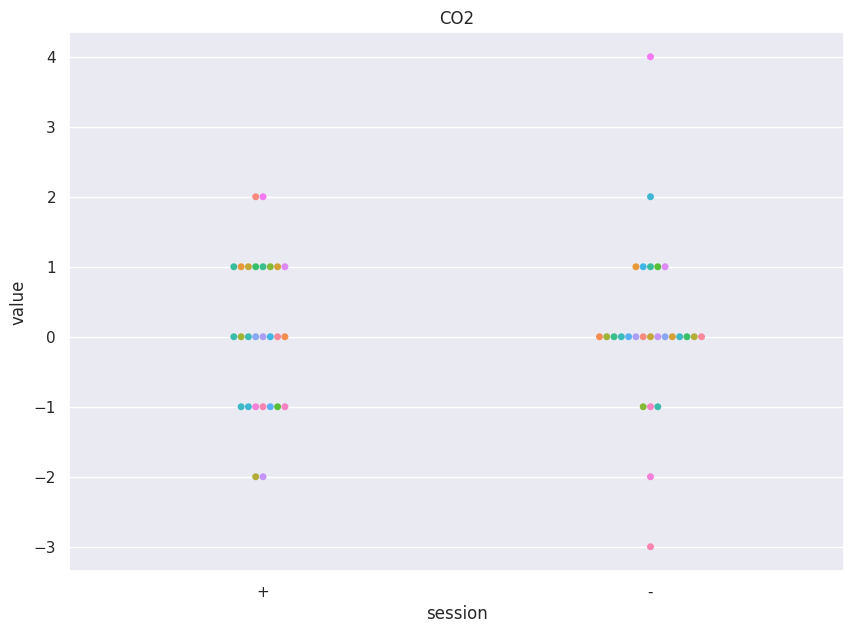

In [ ]:
for cond in ['MECA', 'CO2']:
    df_plot = df_A1_diff.query(f"cond == '{cond}'")
    sns.swarmplot(data=df_plot, x="session", y="value", hue="sujet")
    plt.legend([],[], frameon=False)
    plt.title(cond)
    plt.show()

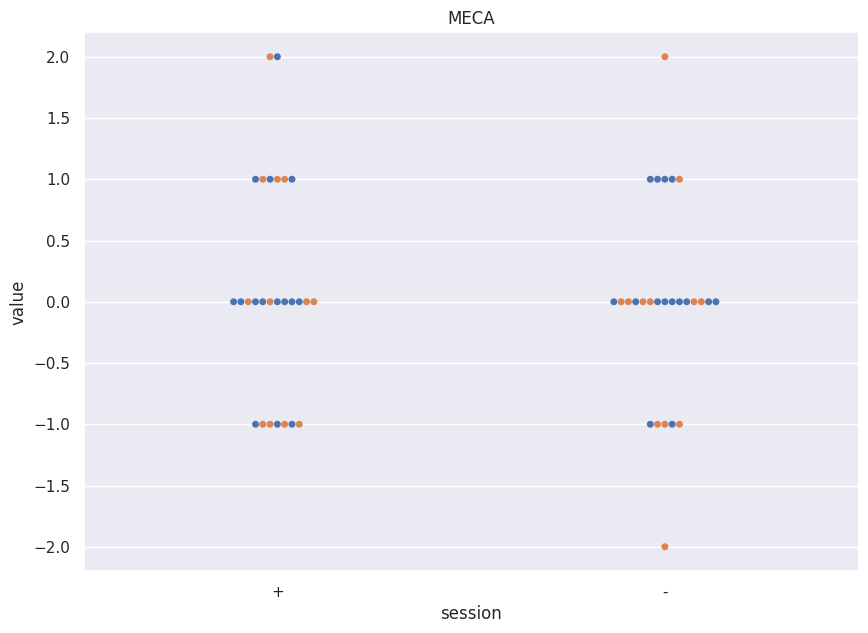

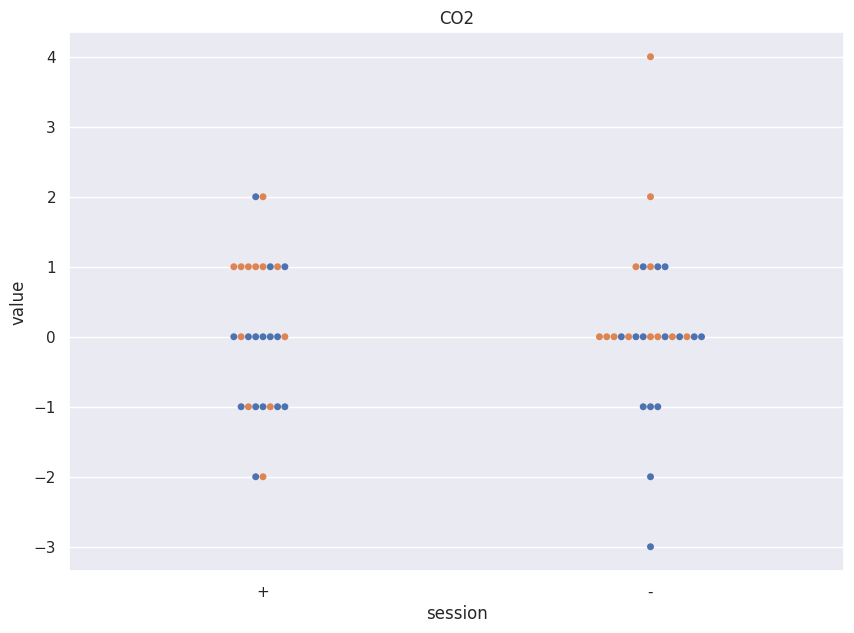

In [ ]:
for cond in ['MECA', 'CO2']:
    df_plot = df_A1_diff.query(f"cond == '{cond}'")
    sns.swarmplot(data=df_plot, x="session", y="value", hue="select_best")
    plt.legend([],[], frameon=False)
    plt.title(cond)
    plt.show()

(0.0, 10.0)

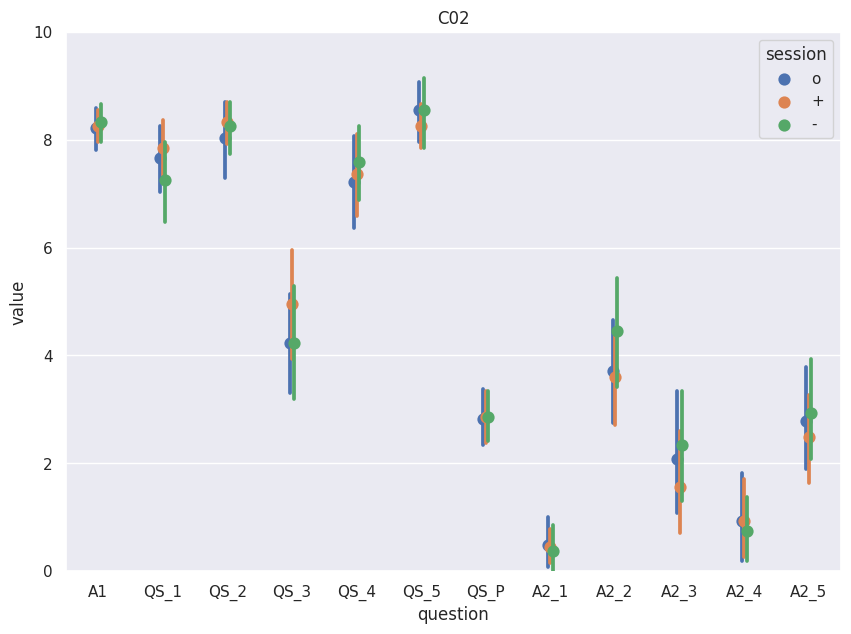

In [ ]:
df_plot = df_mdp[df_mdp['cond'] == 'CO2']
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='C02')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

(0.0, 10.0)

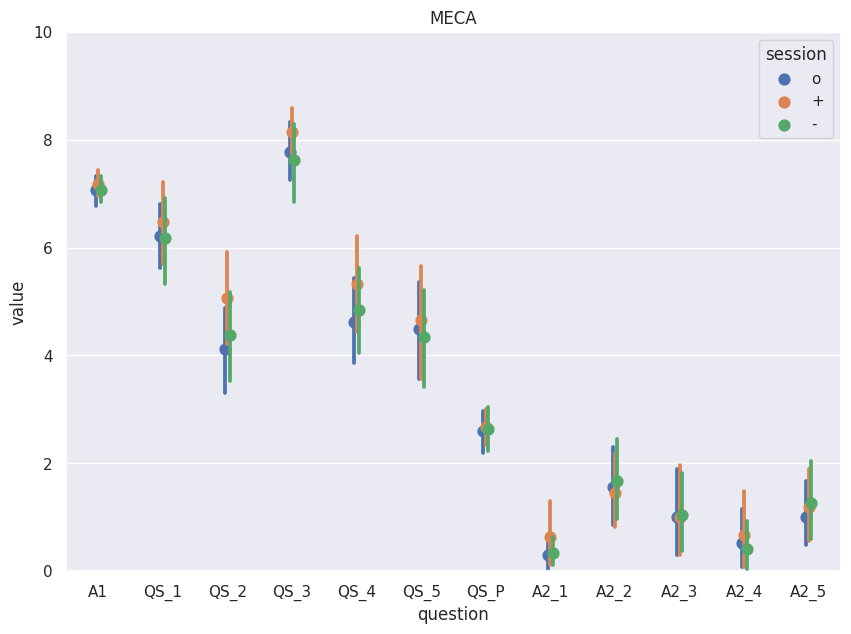

In [ ]:
df_plot = df_mdp[df_mdp['cond'] == 'MECA']
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

In [ ]:
val = np.zeros((df_mdp['sujet'].unique().shape[0]*df_mdp['session'].unique().shape[0]*df_mdp['cond'].unique().shape[0], 4), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_mdp['sujet'].unique()):
    for session_i, session in enumerate(df_mdp['session'].unique()):
        for cond_i, cond in enumerate(df_mdp['cond'].unique()):
            df_i = df_mdp.query(f"sujet == '{sujet}' & session == '{session}' & cond == '{cond}'")
            val_A2 = df_i[df_i['question'].isin(['A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5'])]['value'].sum()
            val[i, :] = np.array([sujet, session, cond, val_A2])
            i += 1

In [ ]:
df_A2 = pd.DataFrame(val, columns=['sujet', 'session', 'cond', 'value'])
df_A2['value'] = df_A2['value'].astype(np.float64) 
df_A2

,sujet,session,cond,value
0,PD01,o,MECA,26.0
1,PD01,o,CO2,34.0
2,PD01,+,MECA,40.0
3,PD01,+,CO2,32.0
4,PD01,-,MECA,27.0
...,...,...,...,...
157,MA33,o,CO2,21.0
158,MA33,+,MECA,2.0
159,MA33,+,CO2,7.0
160,MA33,-,MECA,1.0


(0.0, 50.0)

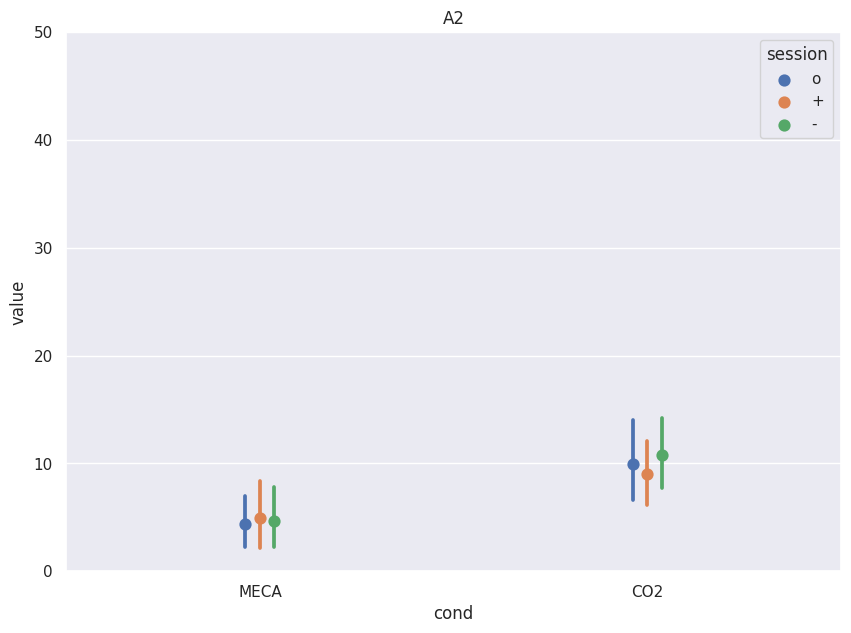

In [ ]:
df_plot = df_A2[df_A2['cond'] == 'CO2']
sns.pointplot(data=df_A2, x="cond", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='A2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 50)

In [ ]:
df_A2

,sujet,session,cond,value
0,PD01,o,MECA,26.0
1,PD01,o,CO2,34.0
2,PD01,+,MECA,40.0
3,PD01,+,CO2,32.0
4,PD01,-,MECA,27.0
...,...,...,...,...
157,MA33,o,CO2,21.0
158,MA33,+,MECA,2.0
159,MA33,+,CO2,7.0
160,MA33,-,MECA,1.0


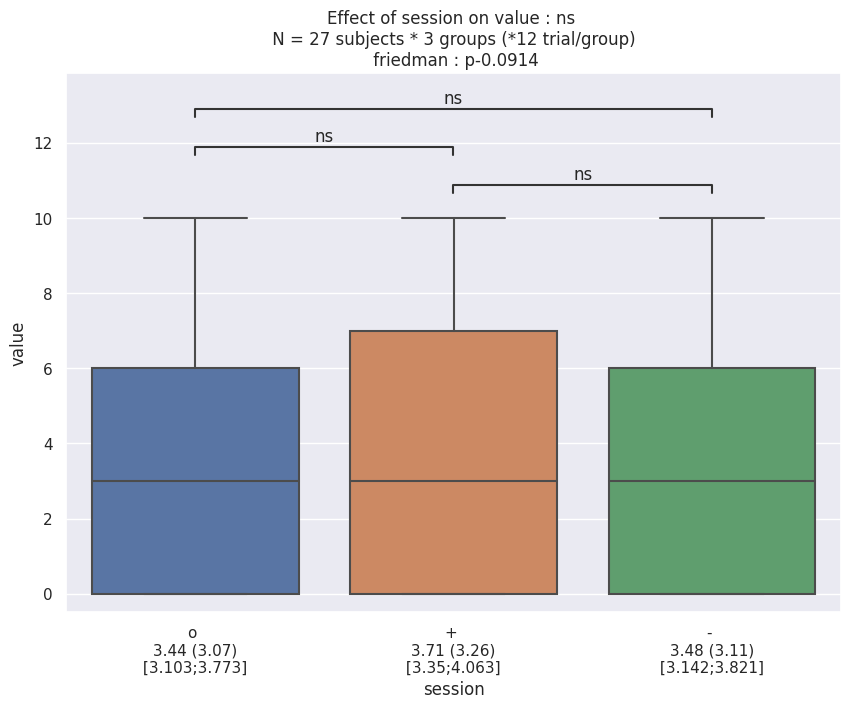

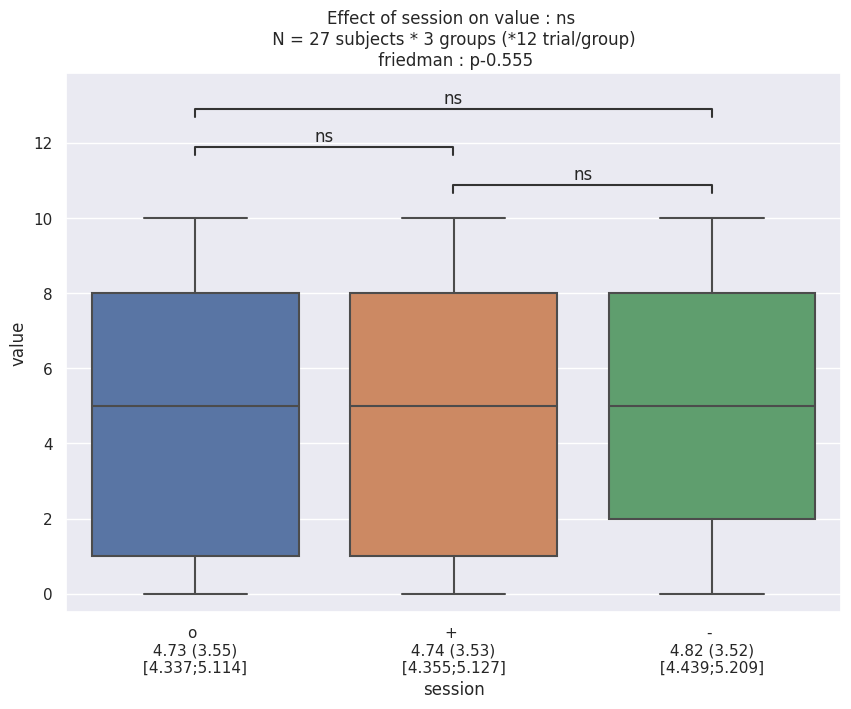

In [ ]:
predictor = 'session' 
outcome = 'value'
for cond in ['MECA', 'CO2']:
    df_stats = df_mdp.query(f"cond == '{cond}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

# QUESTIONNAIRE ANALYSIS

In [ ]:
df_q

,sujet,session,cond,question,raw_val,scale,val,select_best
0,PD01,o,FR_CV_1,1,6.9,15.9,43.396226,YES
1,PD01,o,FR_CV_1,2,9.8,15.9,61.635220,YES
2,PD01,o,FR_CV_1,3,9.3,15.9,58.490566,YES
3,PD01,o,FR_CV_1,4,6.2,15.9,38.993711,YES
4,PD01,o,FR_CV_1,5,7.9,15.9,49.685535,YES
...,...,...,...,...,...,...,...,...
3163,MA33,-,FR_CV_2,4,7.5,15.6,48.076923,YES
3164,MA33,-,FR_CV_2,5,0,15.6,0.000000,YES
3165,MA33,-,FR_CV_2,6,2.7,15.6,17.307692,YES
3166,MA33,-,FR_CV_2,7,7.2,15.6,46.153846,YES


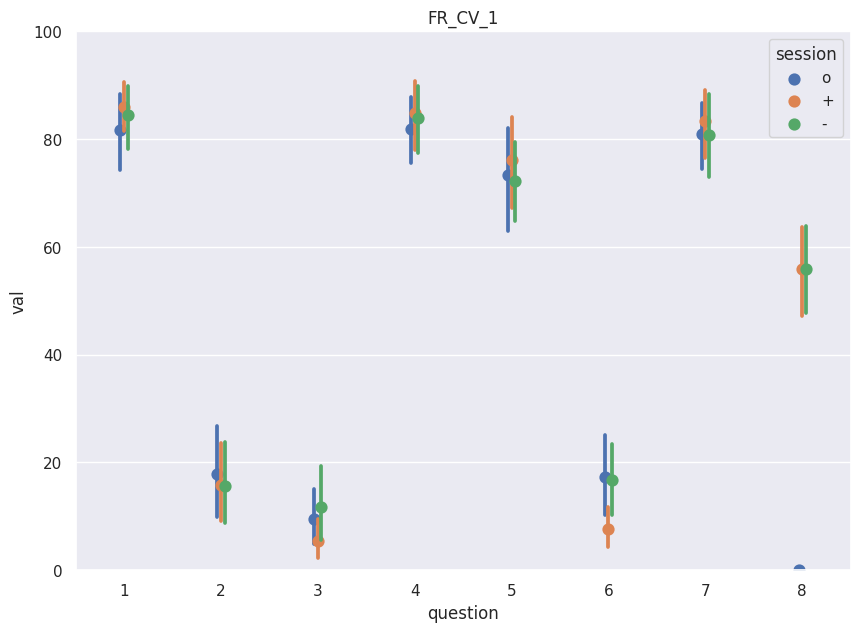

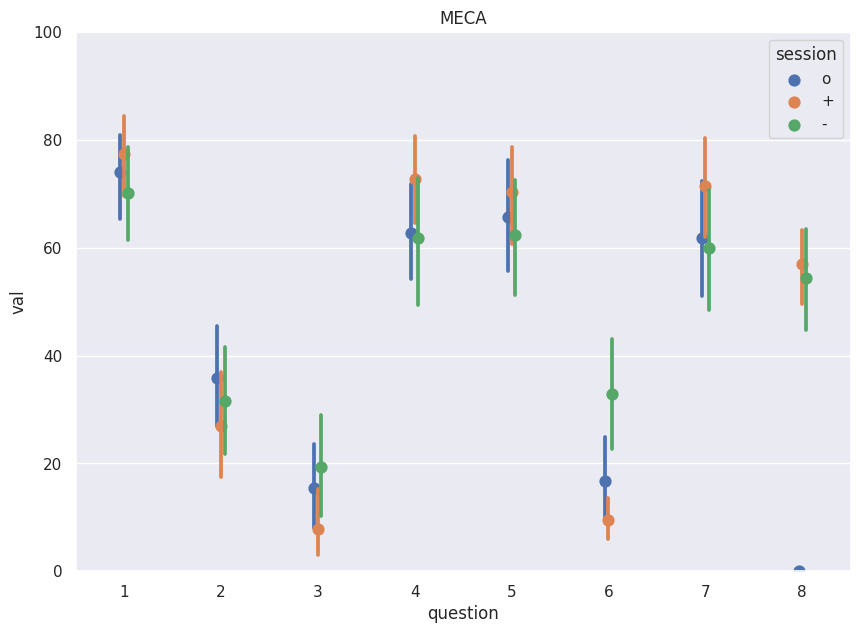

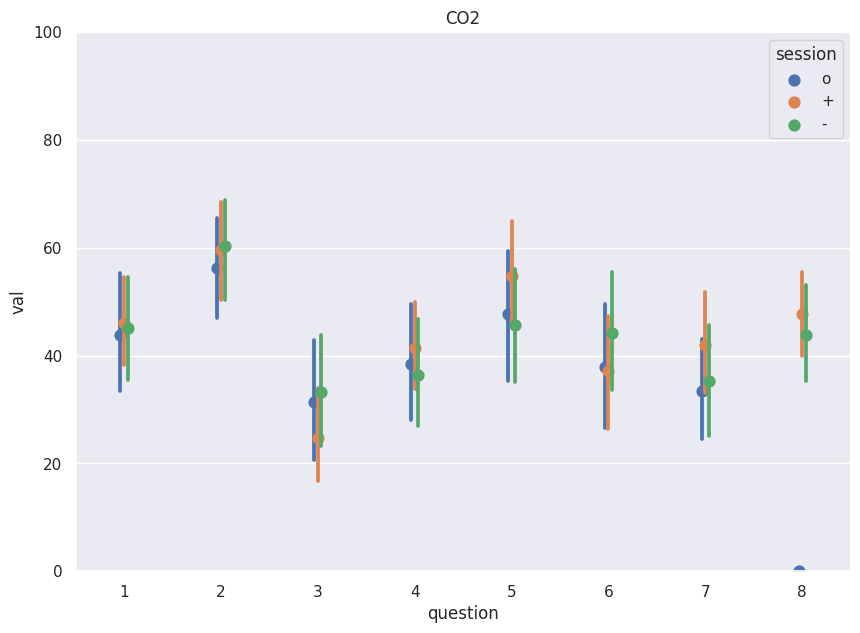

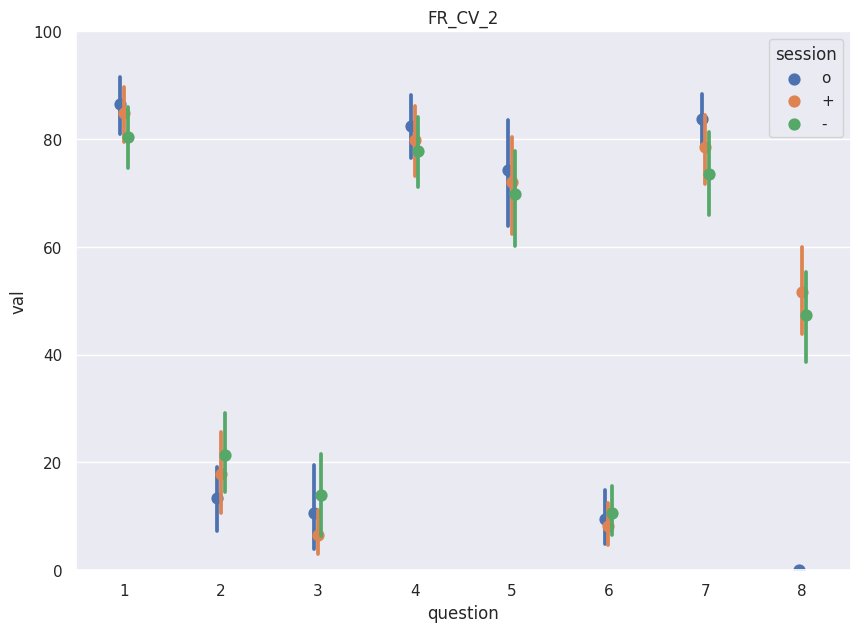

In [ ]:
for cond in conditions:
    df_plot = df_q[df_q['cond'] == cond]
    sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title=cond)
    sns.set(rc={'figure.figsize':(10,7)})
    plt.ylim(0, 100)
    plt.show()

## COND

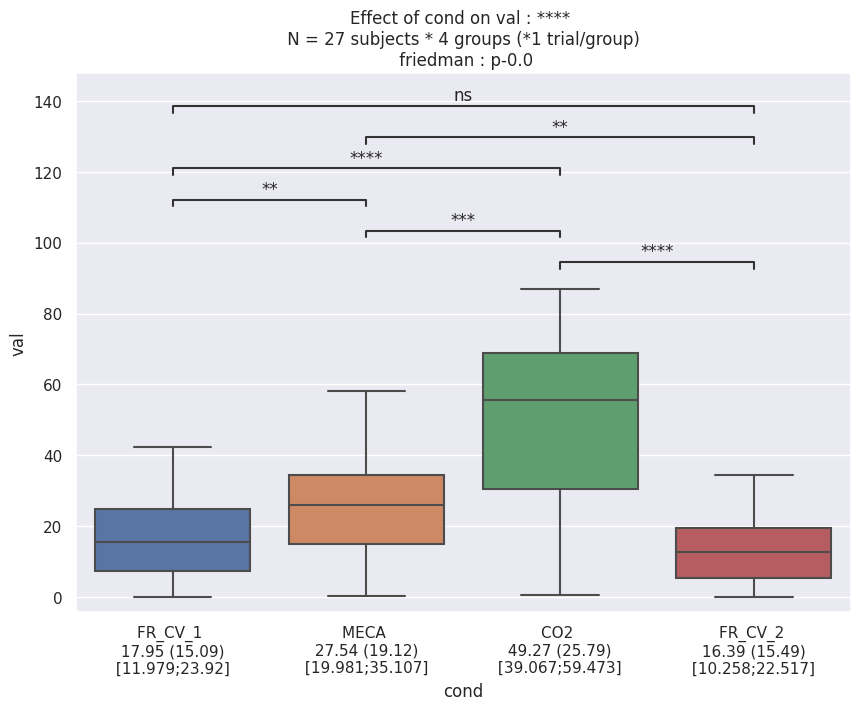

In [ ]:
predictor = 'cond' 
outcome = 'val'
df_stats = df_stai.query(f"session == 'o'")
fig, ax = plt.subplots()
ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

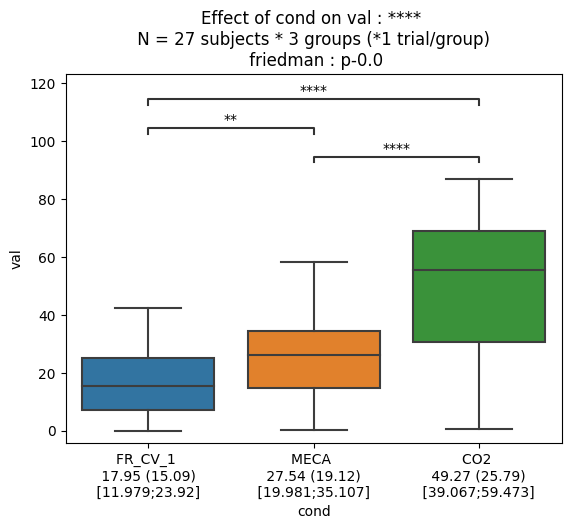

In [26]:
predictor = 'cond' 
outcome = 'val'
df_stats = df_stai.query(f"session == 'o' and cond != 'FR_CV_2'")
fig, ax = plt.subplots()
ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

In [35]:
predictor = 'cond' 

for outcome_i in ['val']:

    df_stats = df_stai.query(f"session == 'o'")
    os.chdir(os.path.join(path_results, 'allplot', 'stats', 'psycho'))
    get_auto_stats_df_allvalues(df_stats, predictor, outcome_i, subject='sujet', design='within', transform=False, verbose=True).to_excel(f'STAI_ANALYSIS_allsujet_PRED_{predictor}_OUTCOME_{outcome_i}.xlsx')


/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "


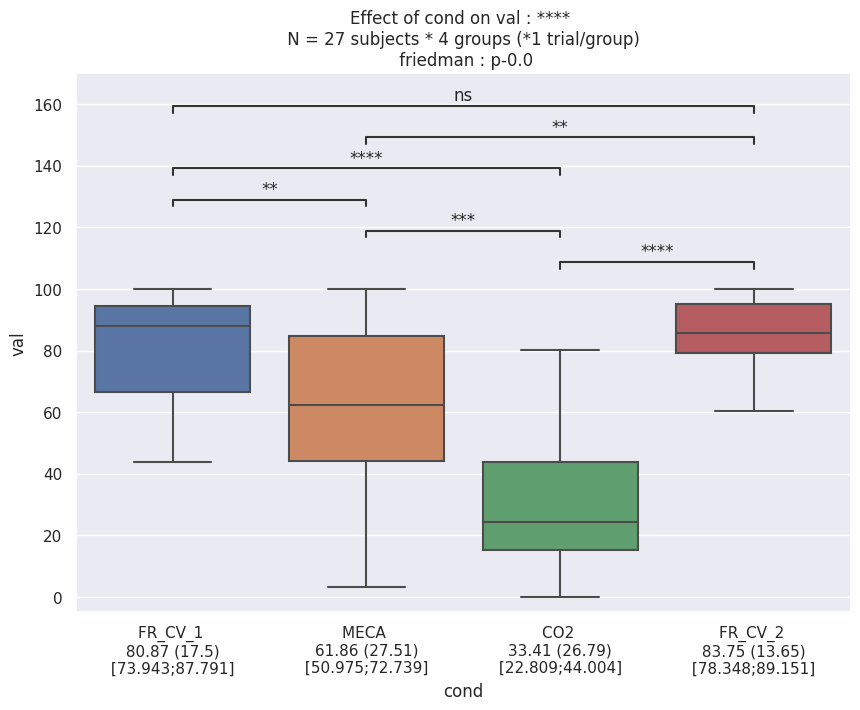

In [ ]:
predictor = 'cond' 
outcome = 'val'
df_stats = df_relax.query(f"session == 'o'")
fig, ax = plt.subplots()
ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

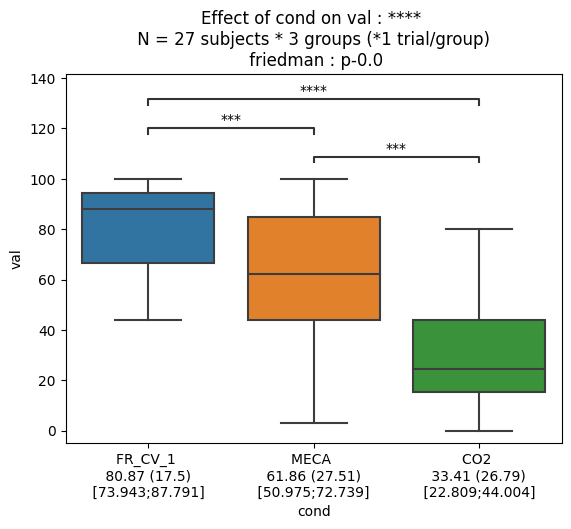

In [27]:
predictor = 'cond' 
outcome = 'val'
df_stats = df_relax.query(f"session == 'o' and cond != 'FR_CV_2'")
fig, ax = plt.subplots()
ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

In [77]:
df_plot

,sujet,session,cond,variable,value
0,PD01,o,FR_CV_1,sSTAI,55.765199
1,PD01,o,MECA,sSTAI,69.287212
2,PD01,o,CO2,sSTAI,77.044025
3,PD01,o,FR_CV_2,sSTAI,45.702306
4,VN03,o,FR_CV_1,sSTAI,19.002123
...,...,...,...,...,...
211,CM32,o,FR_CV_2,RELAX,87.820513
212,MA33,o,FR_CV_1,RELAX,90.909091
213,MA33,o,MECA,RELAX,15.584416
214,MA33,o,CO2,RELAX,0.000000


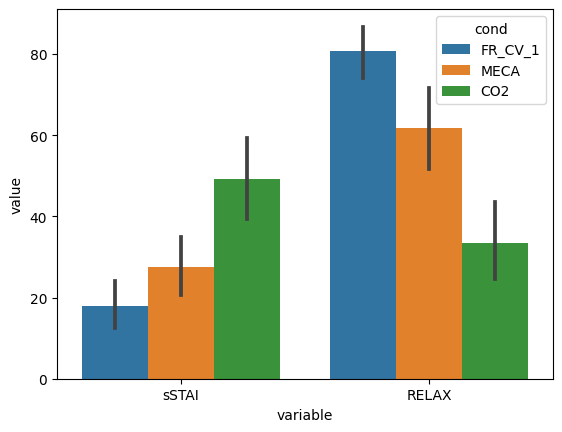

In [79]:
df_STAI_RELAX = df_stai.query(f"session == 'o'").rename(columns={'val' : 'sSTAI'}).reset_index(drop=True)
df_STAI_RELAX['RELAX'] = df_relax.query(f"session == 'o'").rename(columns={'val' : 'RELAX'}).reset_index(drop=True)['RELAX']
df_STAI_RELAX = df_STAI_RELAX.query(f"cond != 'FR_CV_2'")
df_plot = pd.melt(df_STAI_RELAX, id_vars=['sujet', 'session', 'cond'], value_vars=['sSTAI', 'RELAX'])
sns.barplot(data=df_plot, x='variable', y='value', hue='cond', dodge=True)
plt.show()

## ODOR

(0.0, 100.0)

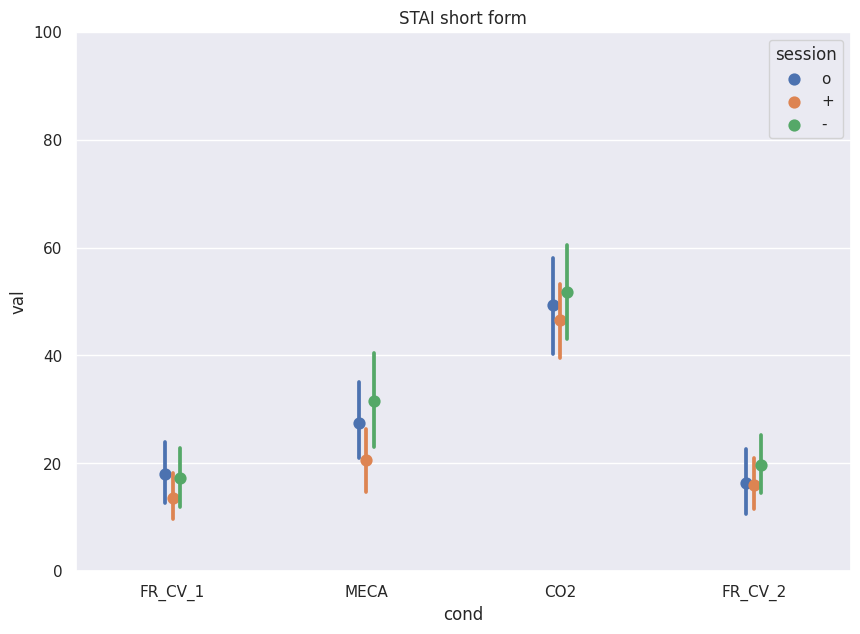

In [ ]:
sns.pointplot(data=df_stai, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='STAI short form')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

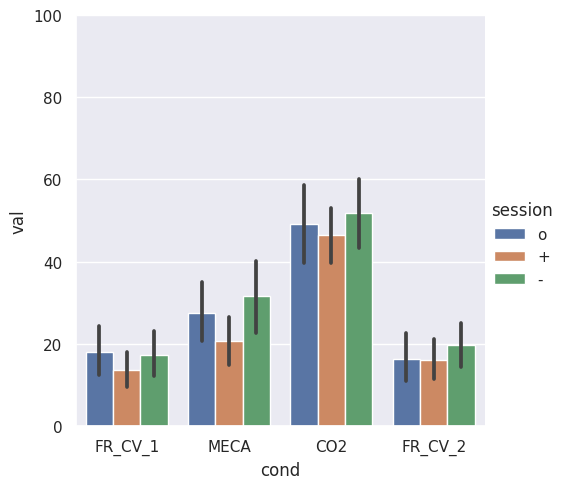

In [26]:
sns.catplot(data=df_stai, kind='bar', x="cond", y="val", hue="session")
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)
plt.show()

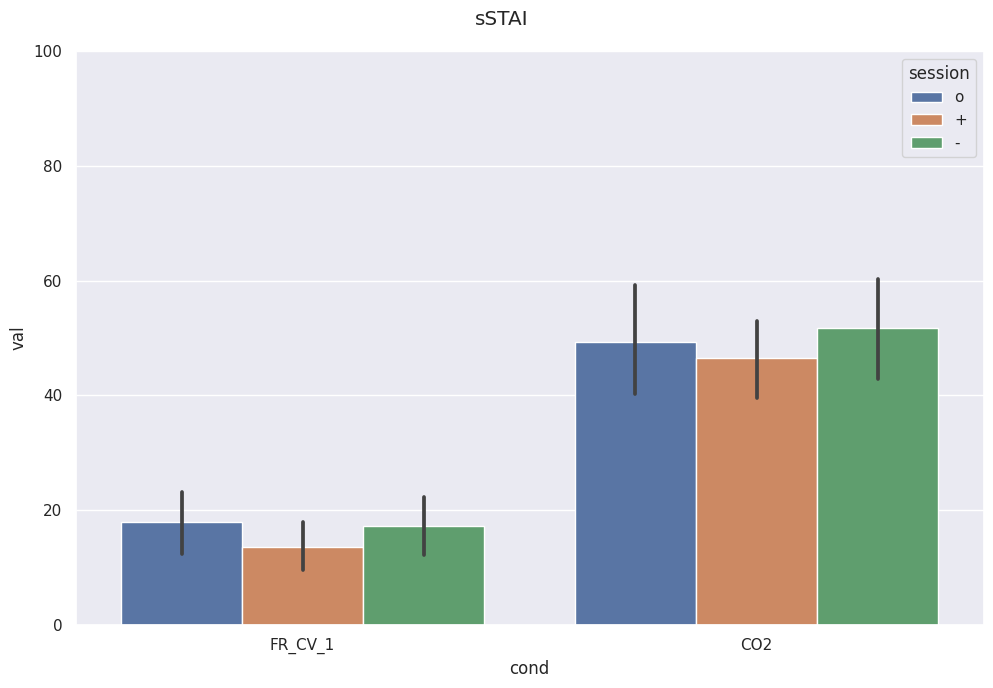

In [25]:
sns.barplot(data=df_stai.query(f"cond not in ['MECA', 'FR_CV_2']"), x="cond", y="val", hue="session")
sns.set(rc={'figure.figsize':(10,7)})
plt.suptitle('sSTAI')
plt.tight_layout()
plt.ylim(0, 100)
plt.show()

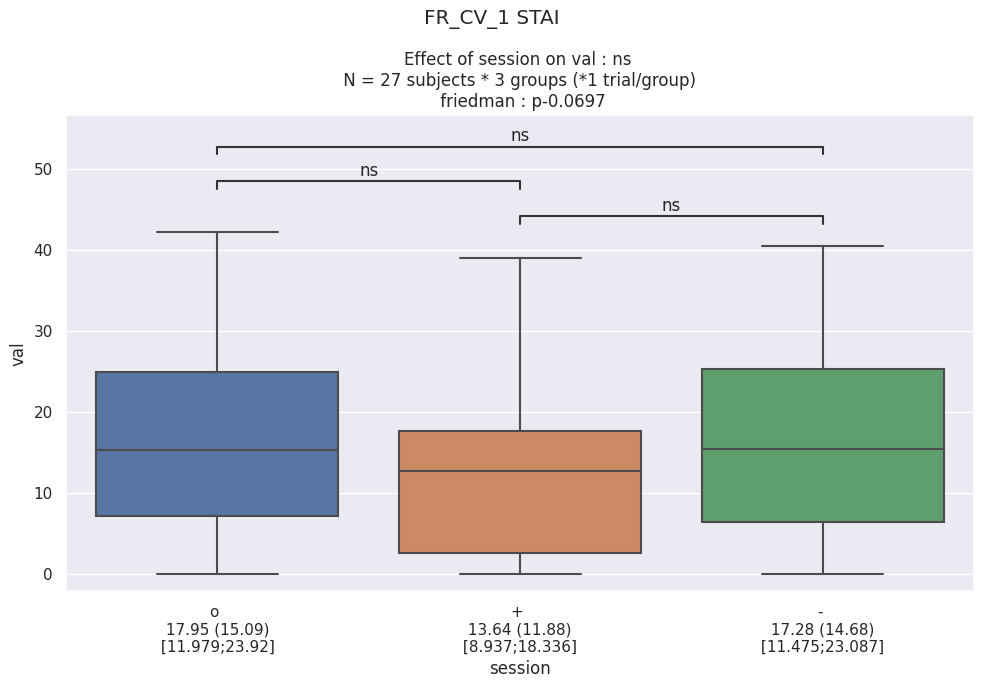

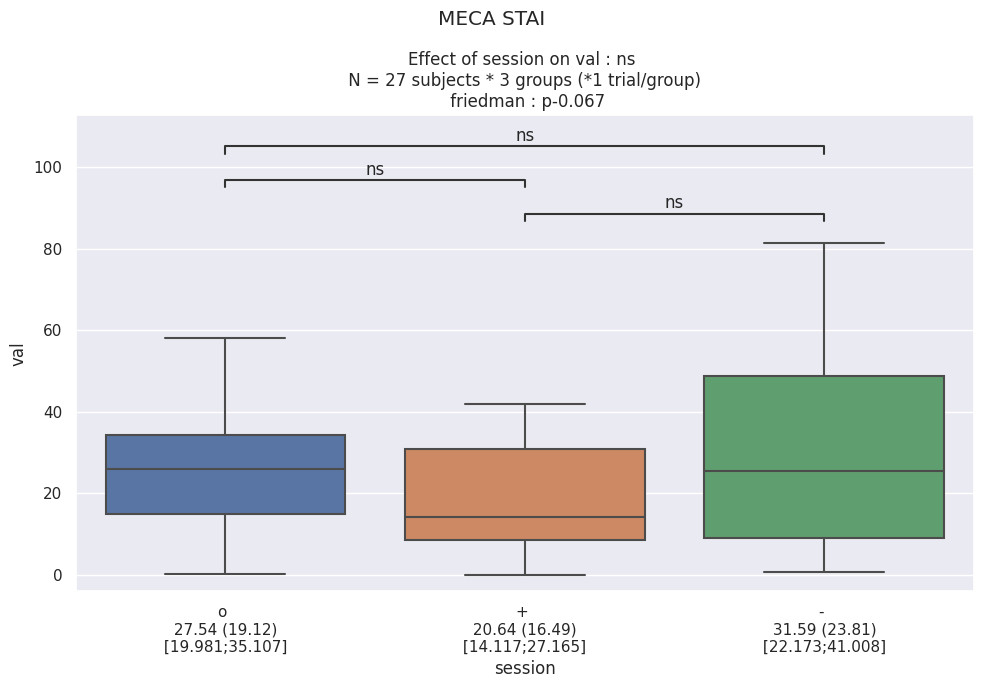

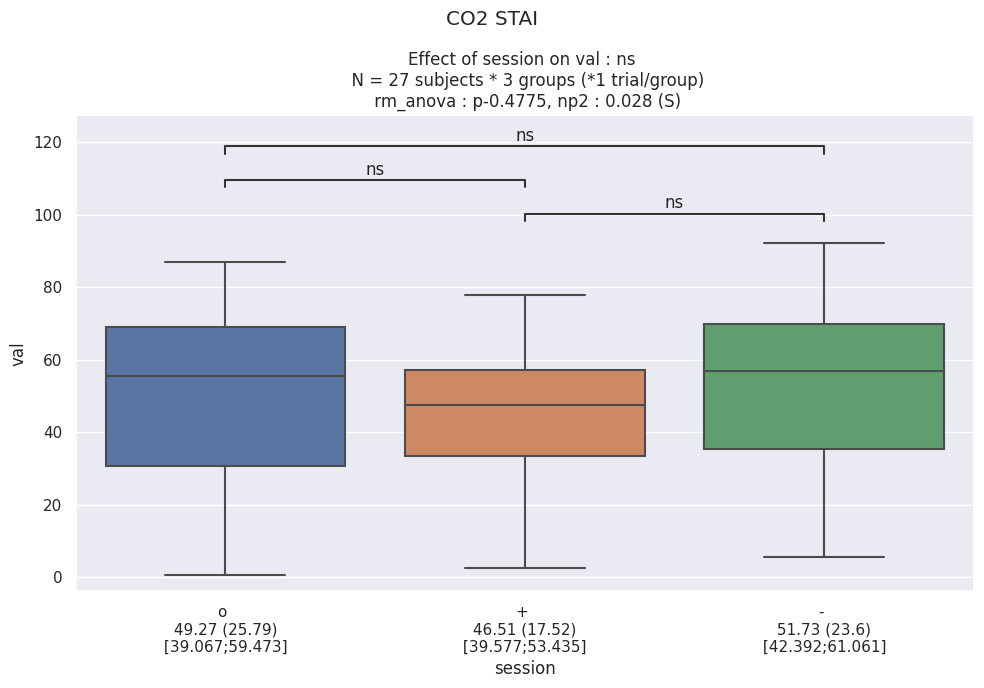

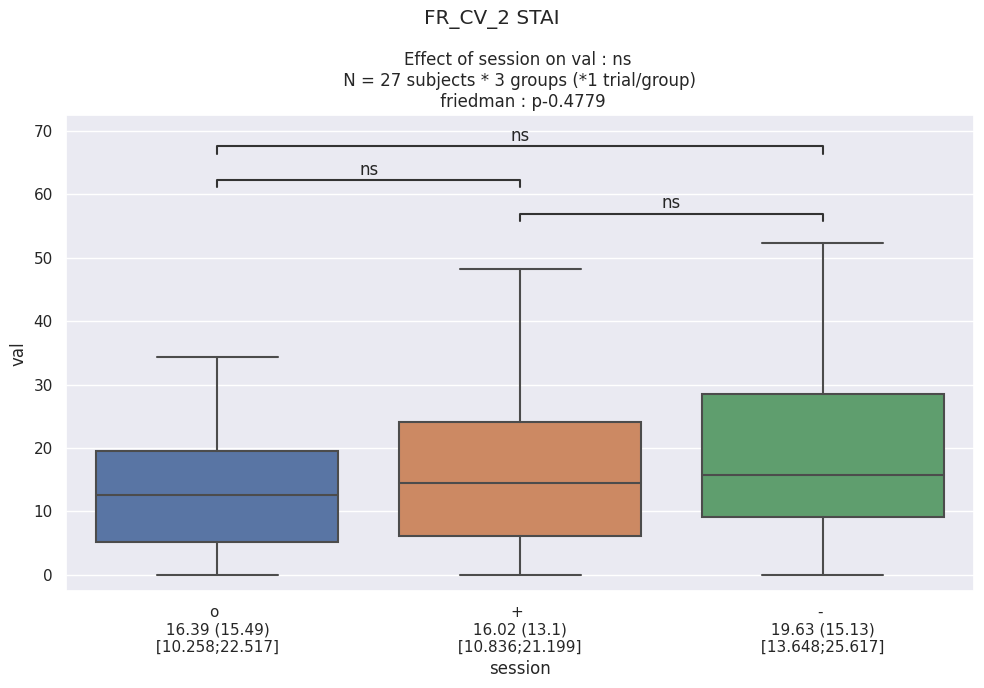

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_stai.query(f"cond == '{cond}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    
    plt.suptitle(f"{cond} STAI")
    plt.tight_layout()

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

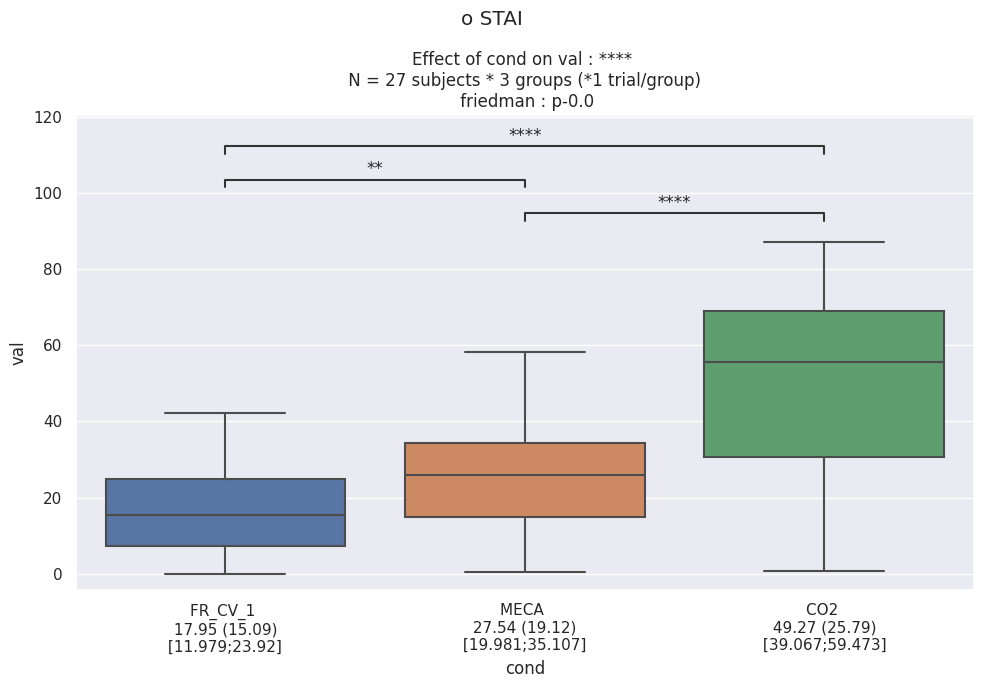

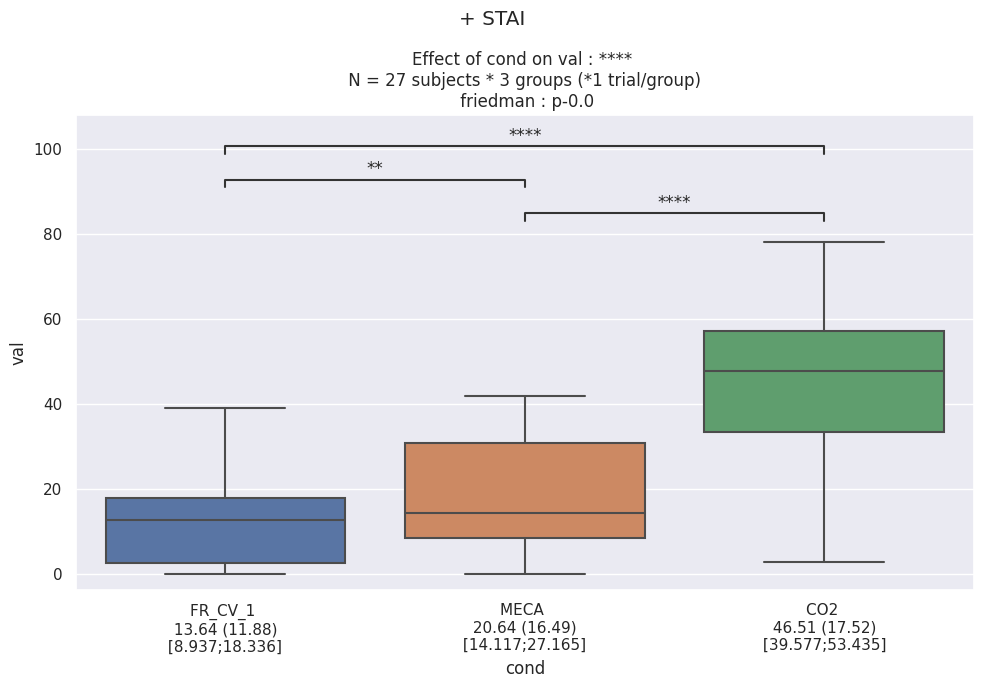

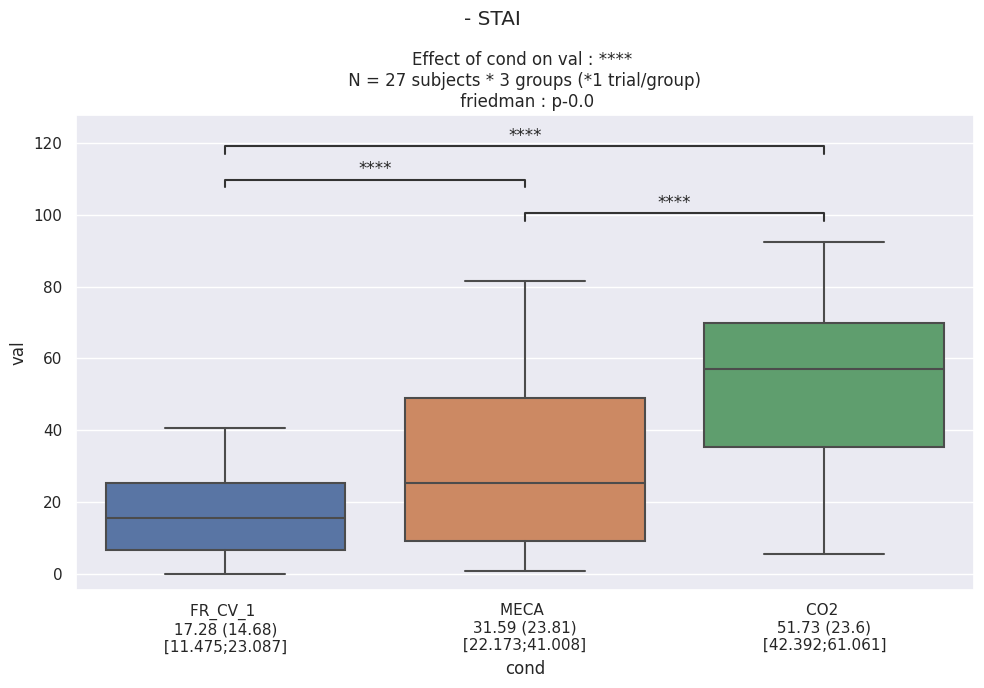

In [110]:
predictor = 'cond' 
outcome = 'val'
for odor in odor_list:
    df_stats = df_stai.query(f"session == '{odor}' and cond != 'FR_CV_2'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    
    plt.suptitle(f"{odor} STAI")
    plt.tight_layout()

z:\Projets\Olfadys\NBuonviso2022_jules_olfadys\EEG_Paris_J\Script_Python_EEG_Paris_git\n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
z:\Projets\Olfadys\NBuonviso2022_jules_olfadys\EEG_Paris_J\Script_Python_EEG_Paris_git\n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].res

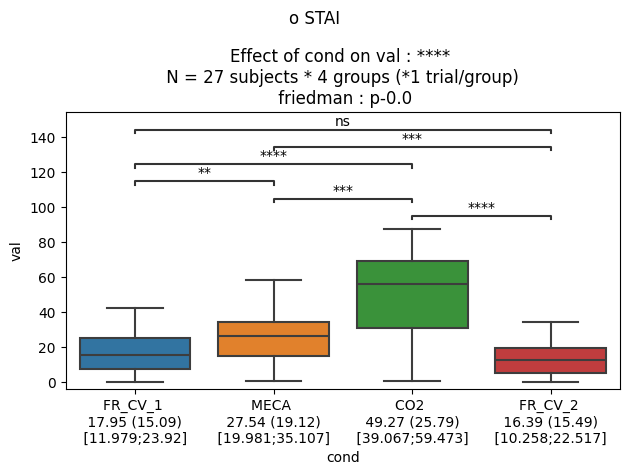

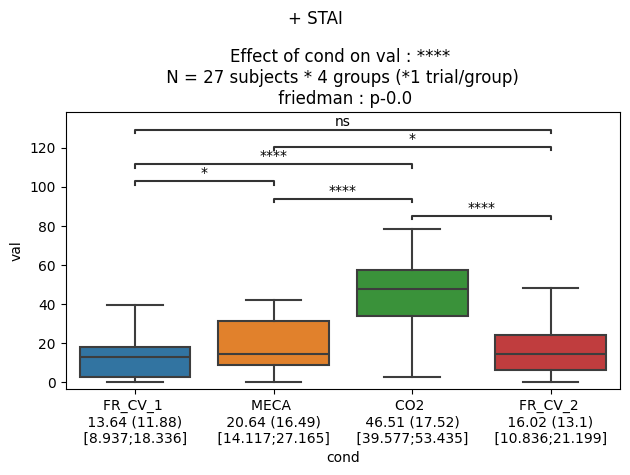

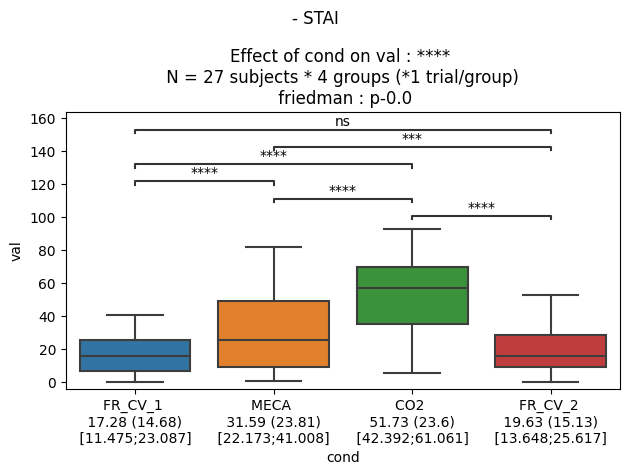

In [ ]:
predictor = 'cond' 
outcome = 'val'
for odor in odor_list:
    df_stats = df_stai.query(f"session == '{odor}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)
    
    plt.suptitle(f"{odor} STAI")
    plt.tight_layout()

In [80]:
predictor = ['cond', 'session']
outcome = 'val'
df_stats = df_stai.query(f"cond != 'FR_CV_2'")
get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='within', transform=False, verbose=True)



/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(


,test_name,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,np2,eps
0,two_way_rm_anova,cond,45813.503,2,52,22906.751,101.405,0.000,0.000,0.796,0.899
1,two_way_rm_anova,session,1866.329,2,52,933.165,3.521,0.037,0.047,0.119,0.825
2,two_way_rm_anova,cond * session,448.274,4,104,112.068,1.042,0.389,0.358,0.039,0.482


(0.0, 100.0)

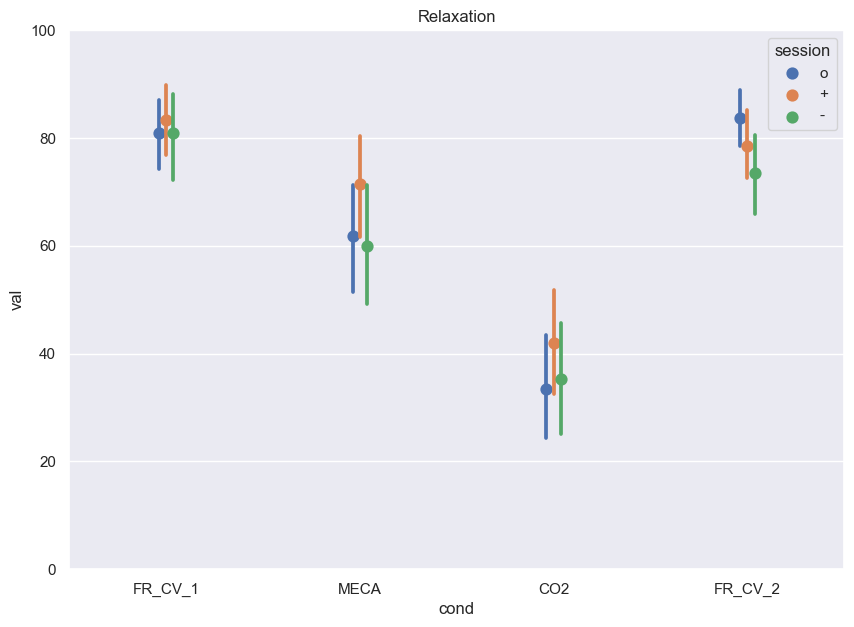

In [ ]:
sns.pointplot(data=df_relax, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

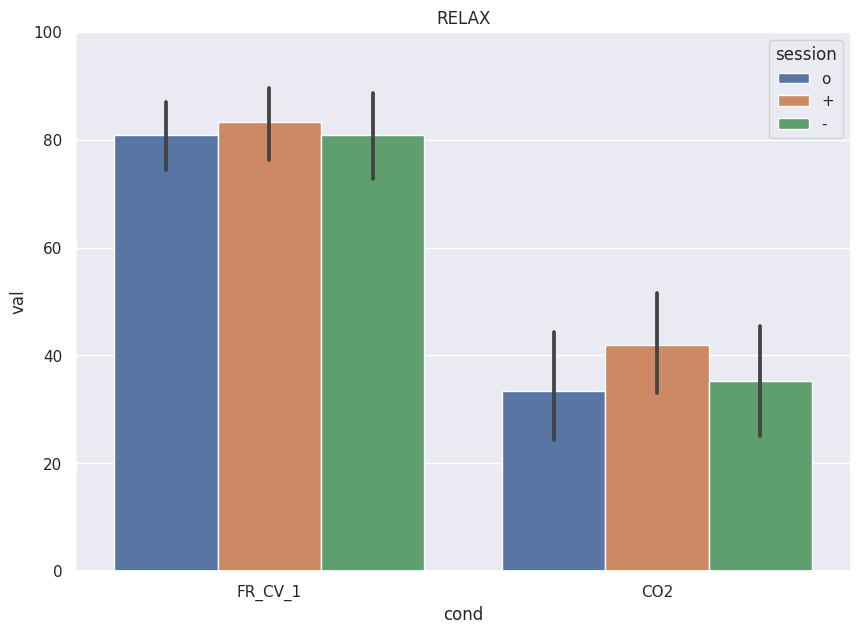

In [27]:
sns.barplot(data=df_relax.query(f"cond not in ['MECA', 'FR_CV_2']"), x="cond", y="val", hue="session").set(title='RELAX')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)



In [87]:
predictor = ['cond', 'session']
outcome = 'val'
df_stats = df_relax.query(f"cond != 'FR_CV_2'")
get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='within', transform=False, verbose=True)




/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(


,test_name,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,np2,eps
0,two_way_rm_anova,cond,82713.370,2,52,41356.685,113.963,0.000,0.000,0.814,0.921
1,two_way_rm_anova,session,2594.985,2,52,1297.492,2.365,0.104,0.118,0.083,0.778
2,two_way_rm_anova,cond * session,700.025,4,104,175.006,0.607,0.659,0.580,0.023,0.611


z:\Projets\Olfadys\NBuonviso2022_jules_olfadys\EEG_Paris_J\Script_Python_EEG_Paris_git\n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
z:\Projets\Olfadys\NBuonviso2022_jules_olfadys\EEG_Paris_J\Script_Python_EEG_Paris_git\n0ter_stats.py:382: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].res

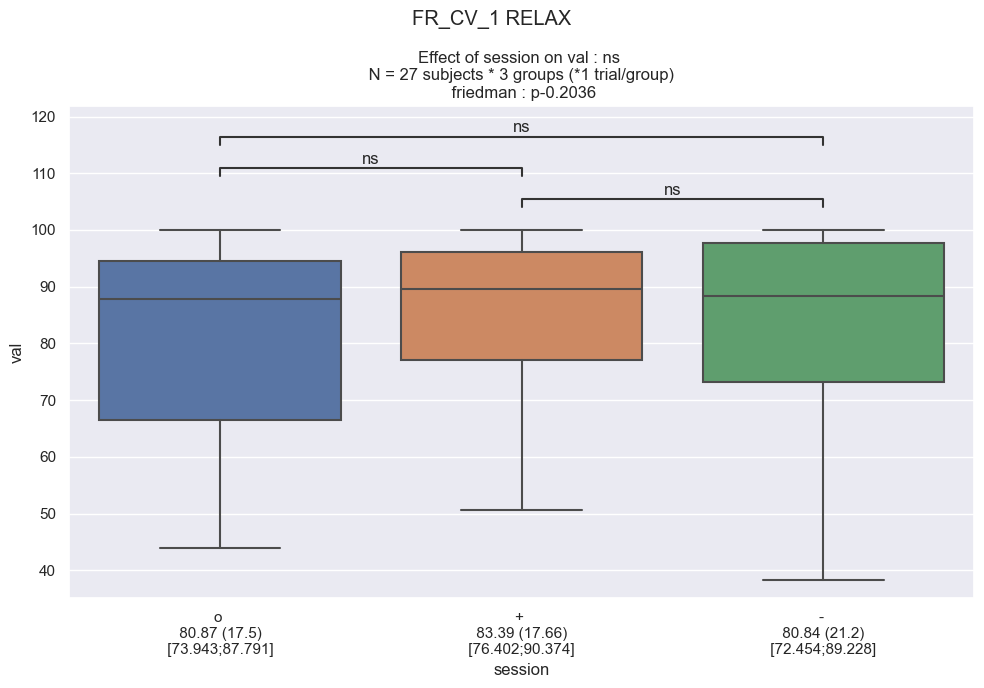

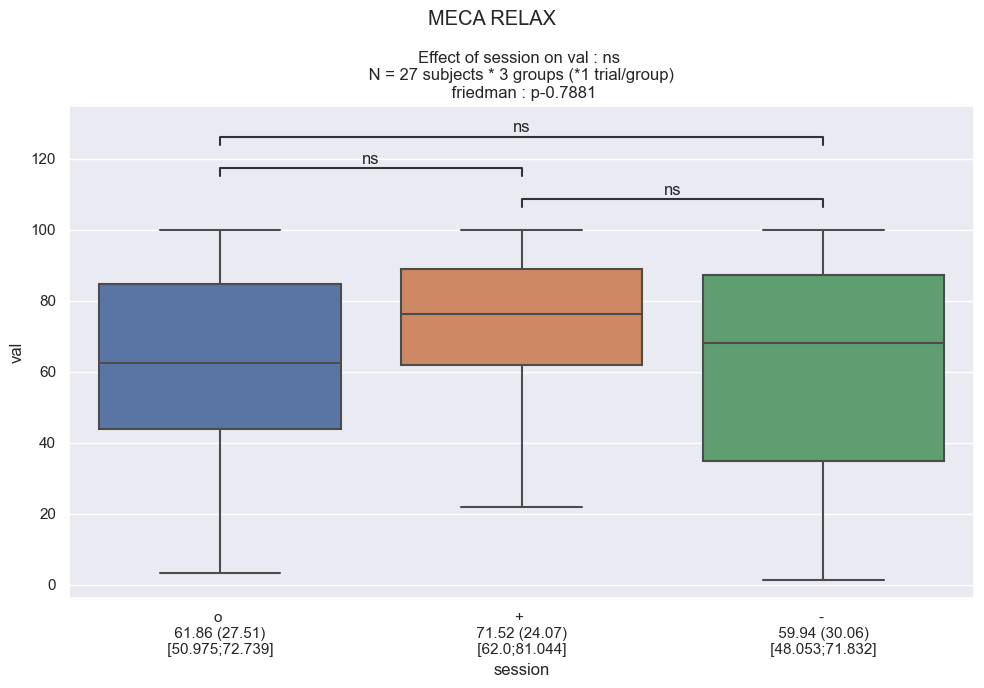

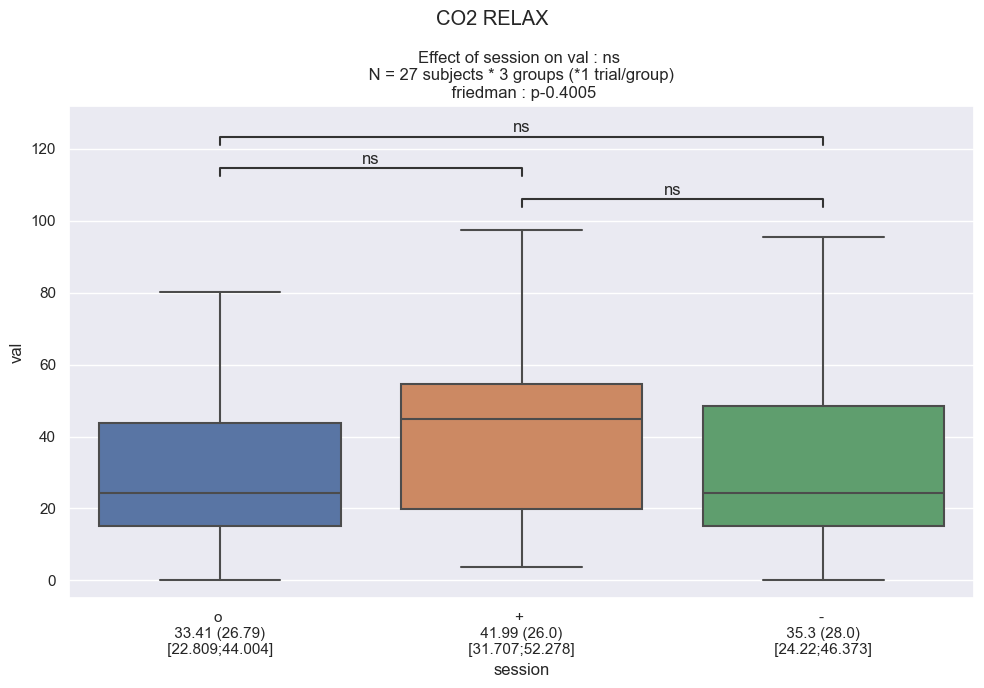

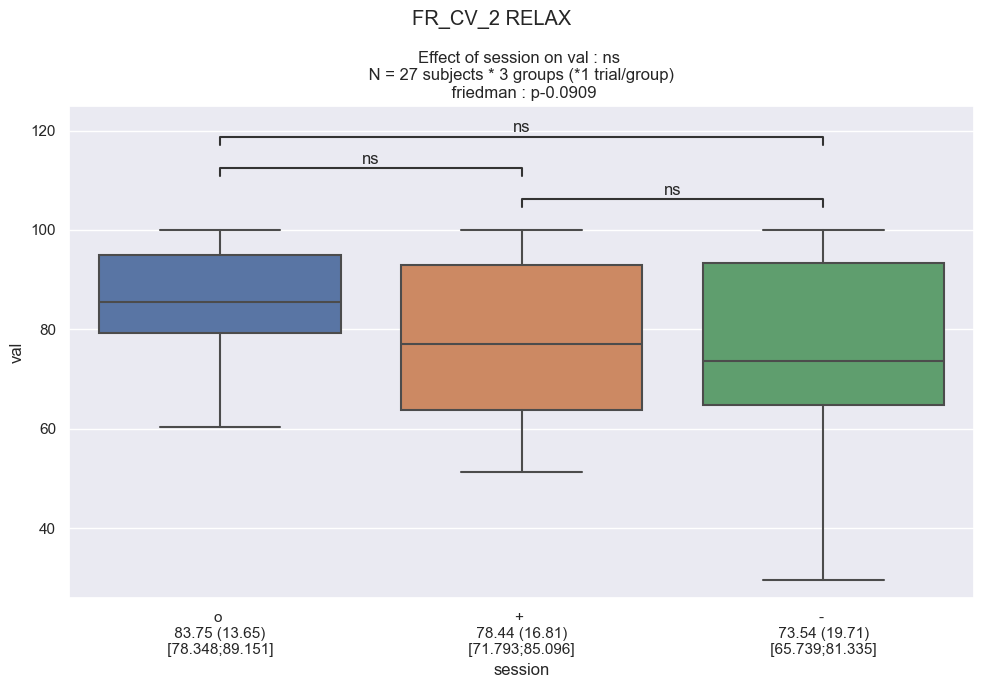

In [ ]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_relax.query(f"cond == '{cond}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

    plt.suptitle(f"{cond} RELAX")
    plt.tight_layout()


/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

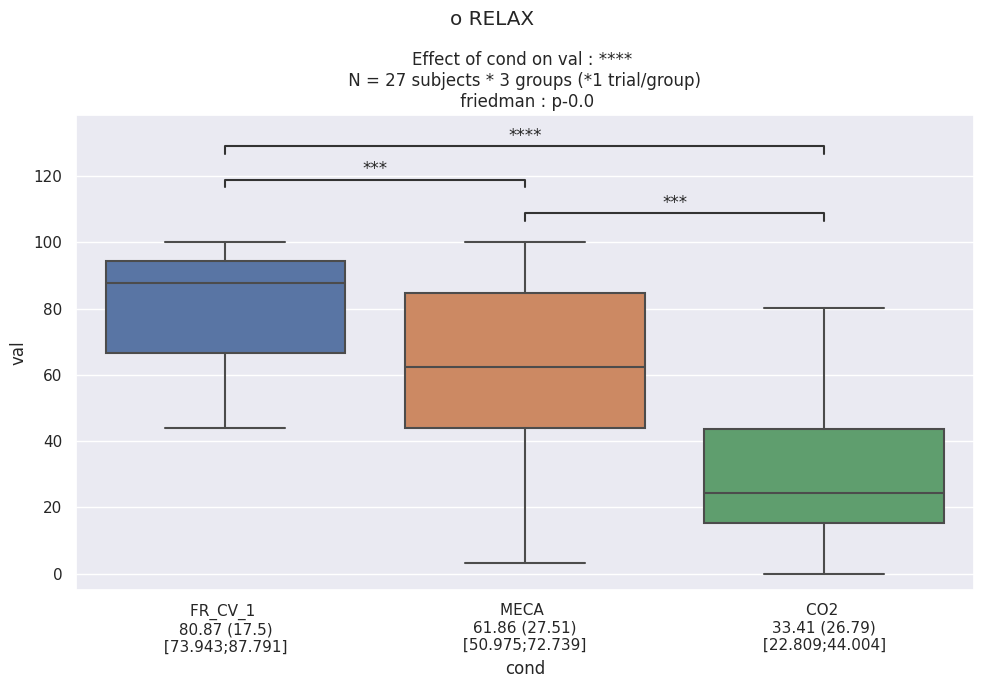

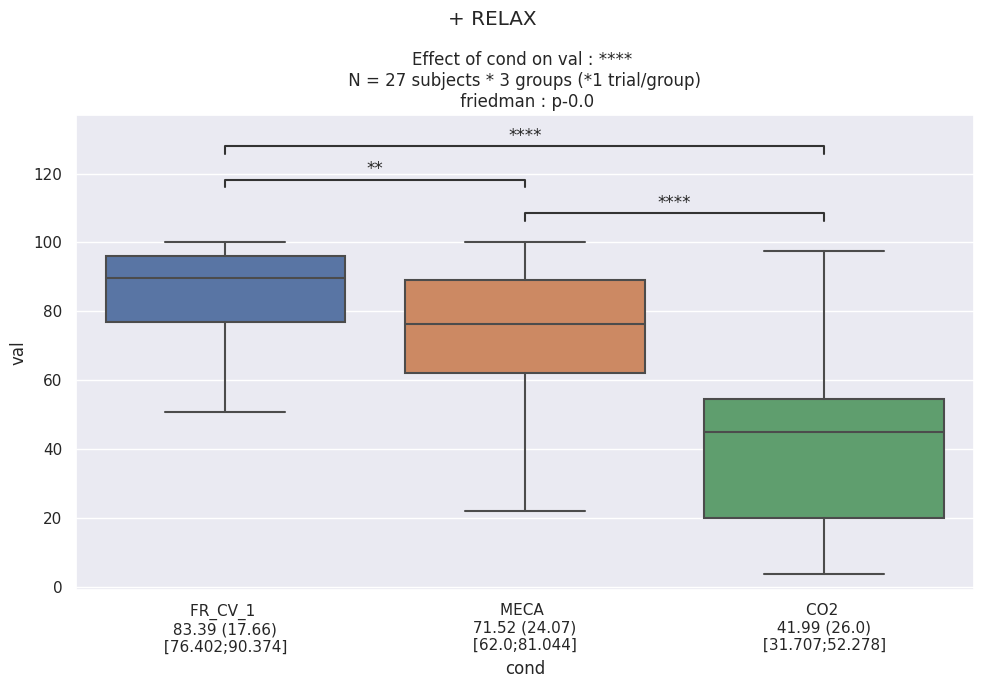

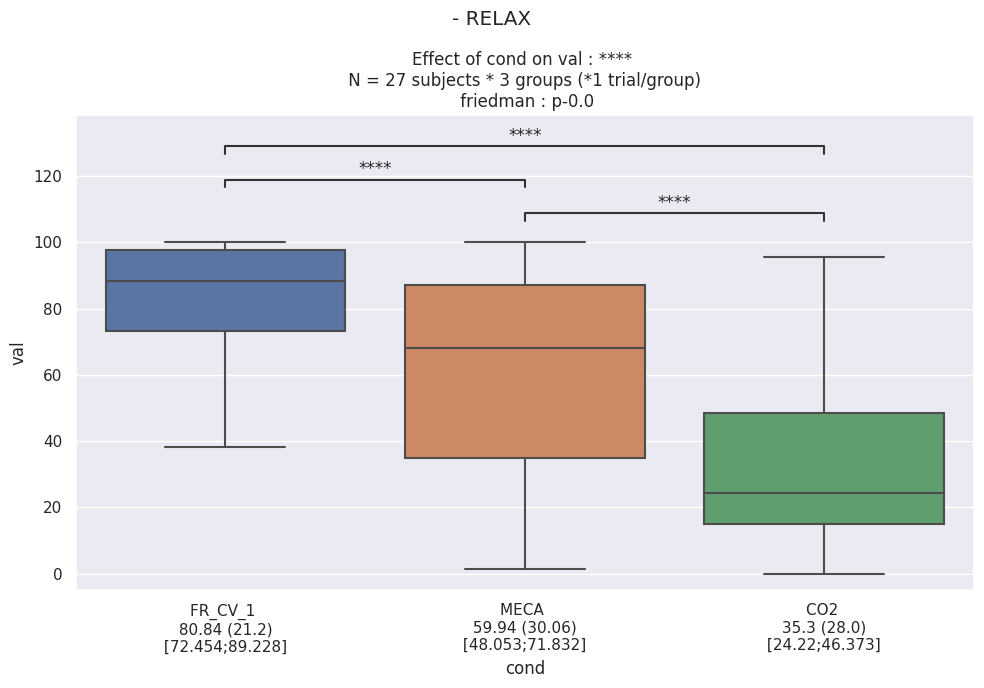

In [111]:
predictor = 'cond' 
outcome = 'val'
for odor in odor_list:
    df_stats = df_relax.query(f"session == '{odor}' and cond != 'FR_CV_2'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

    plt.suptitle(f"{odor} RELAX")
    plt.tight_layout()

In [86]:
predictor = 'session'
outcome = 'val'
for cond in conditions:
    df_stats = df_relax.query(f"cond == '{cond}'")
    os.chdir(os.path.join(path_results, 'allplot', 'stats', 'psycho'))
    get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='within', transform=False, verbose=True).to_excel(f'ODOR_RELAX_allsujet_PRED_{predictor}_OUTCOME_{cond}.xlsx')

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switching to normal approximation.
  warnings.warn("Exact p-value calculation does not work if there are "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_morestats.py:3337: UserWarning: Exact p-value calculation does not work if there are zeros. Switchi

In [90]:
df_intensity

,sujet,session,question,cond,val,select_best
7,PD01,o,8,FR_CV_1,0.000000,YES
15,PD01,o,8,MECA,0.000000,YES
23,PD01,o,8,CO2,0.000000,YES
31,PD01,o,8,FR_CV_2,0.000000,YES
39,PD01,+,8,FR_CV_1,61.783439,YES
...,...,...,...,...,...,...
3135,MA33,+,8,FR_CV_2,0.000000,YES
3143,MA33,-,8,FR_CV_1,60.000000,YES
3151,MA33,-,8,MECA,70.967742,YES
3159,MA33,-,8,CO2,62.820513,YES


(0.0, 100.0)

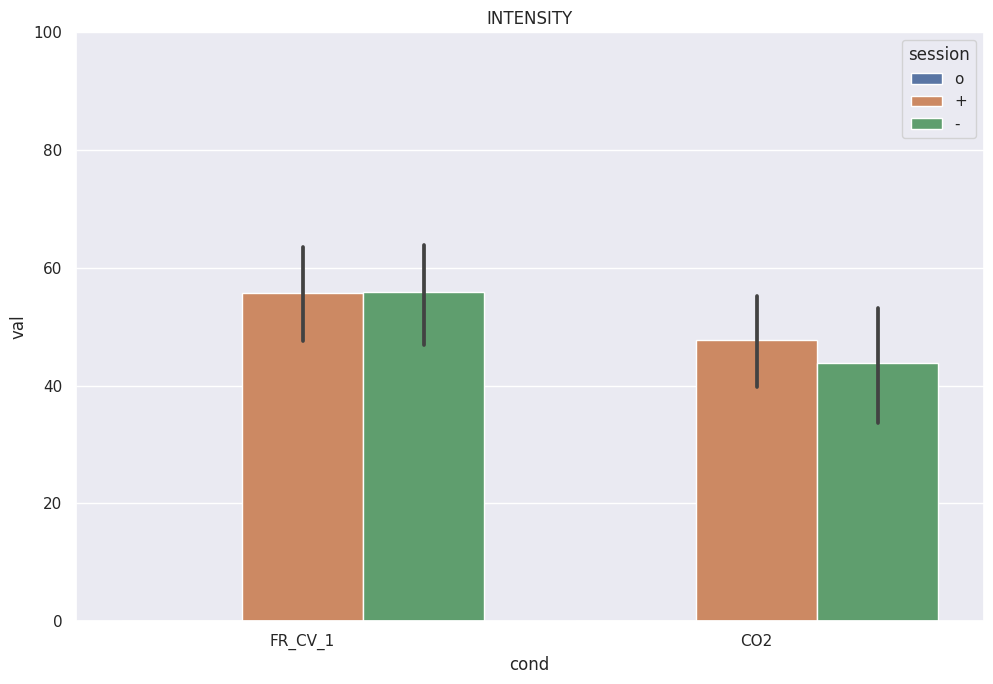

In [26]:
sns.barplot(data=df_intensity.query(f"cond not in ['MECA', 'FR_CV_2']"), x="cond", y="val", hue="session").set(title='INTENSITY')
sns.set(rc={'figure.figsize':(10,7)})
plt.tight_layout()
plt.ylim(0, 100)

In [92]:
predictor = ['cond', 'session']
outcome = 'val'
df_stats = df_intensity.query(f"cond != 'FR_CV_2'")
get_auto_stats_df_allvalues(df_stats, predictor, outcome, subject='sujet', design='within', transform=False, verbose=True)



/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(


,test_name,Source,SS,ddof1,ddof2,MS,F,p-unc,p-GG-corr,np2,eps
0,two_way_rm_anova,cond,2411.641,2,52,1205.820,6.609,0.003,0.007,0.203,0.730
1,two_way_rm_anova,session,148596.757,2,52,74298.379,113.121,0.000,0.000,0.813,0.900
2,two_way_rm_anova,cond * session,1311.412,4,104,327.853,2.931,0.024,0.071,0.101,0.431


/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

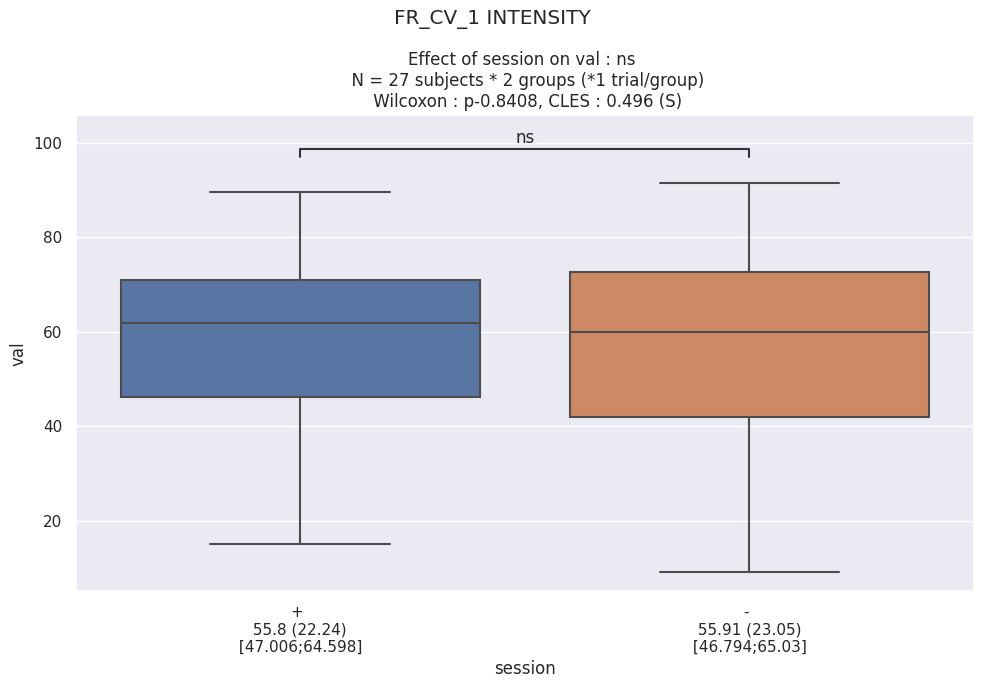

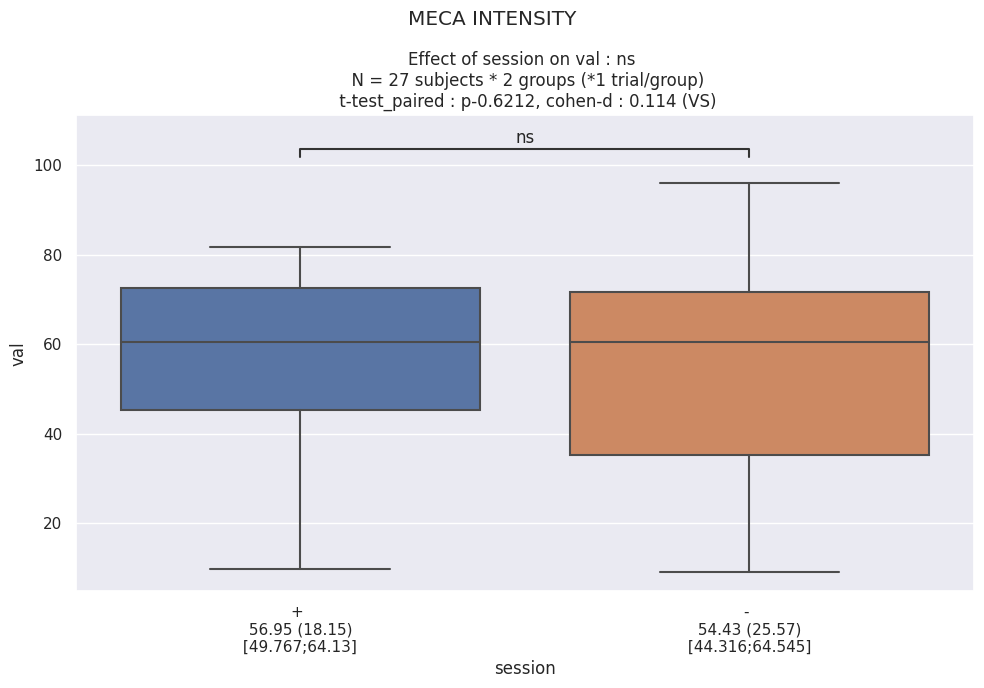

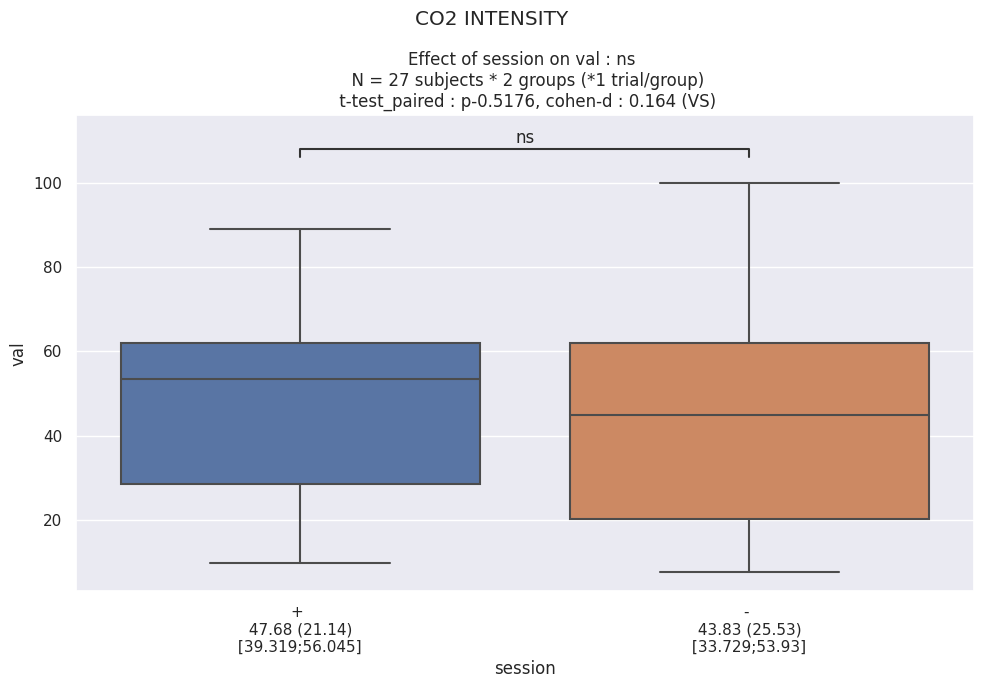

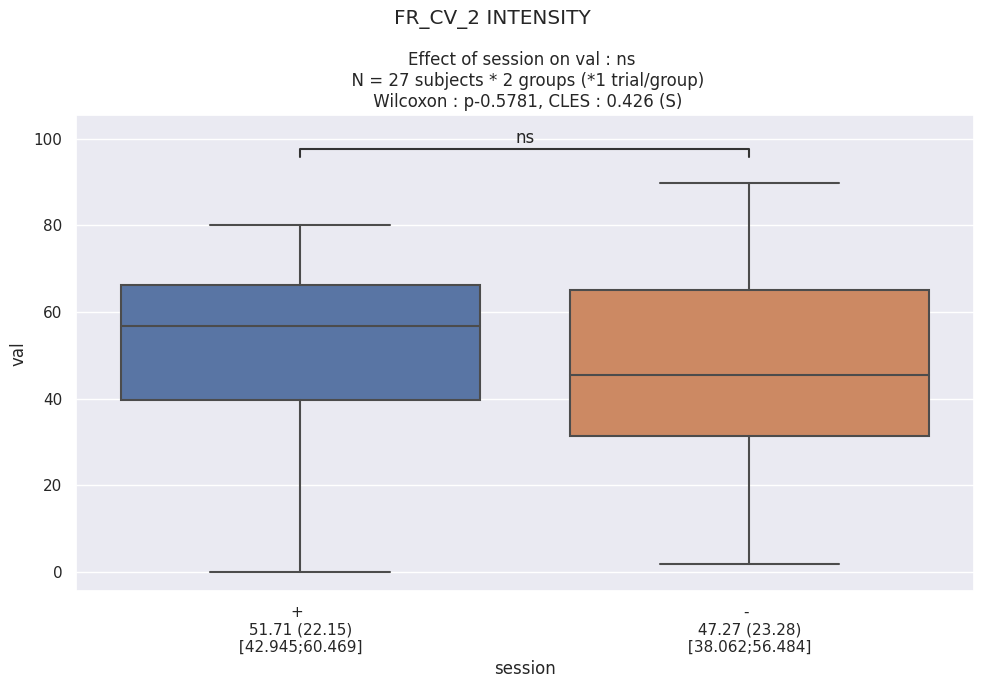

In [99]:
predictor = 'session' 
outcome = 'val'
for cond in conditions:
    df_stats = df_intensity.query(f"cond == '{cond}' and session != 'o'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

    plt.suptitle(f"{cond} INTENSITY")
    plt.tight_layout()



/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

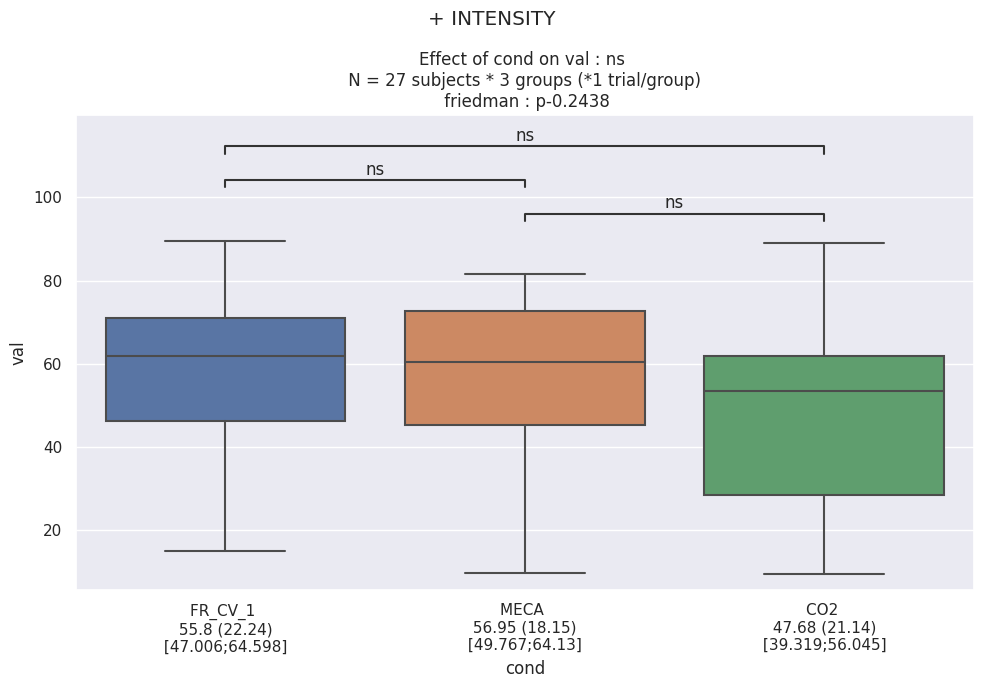

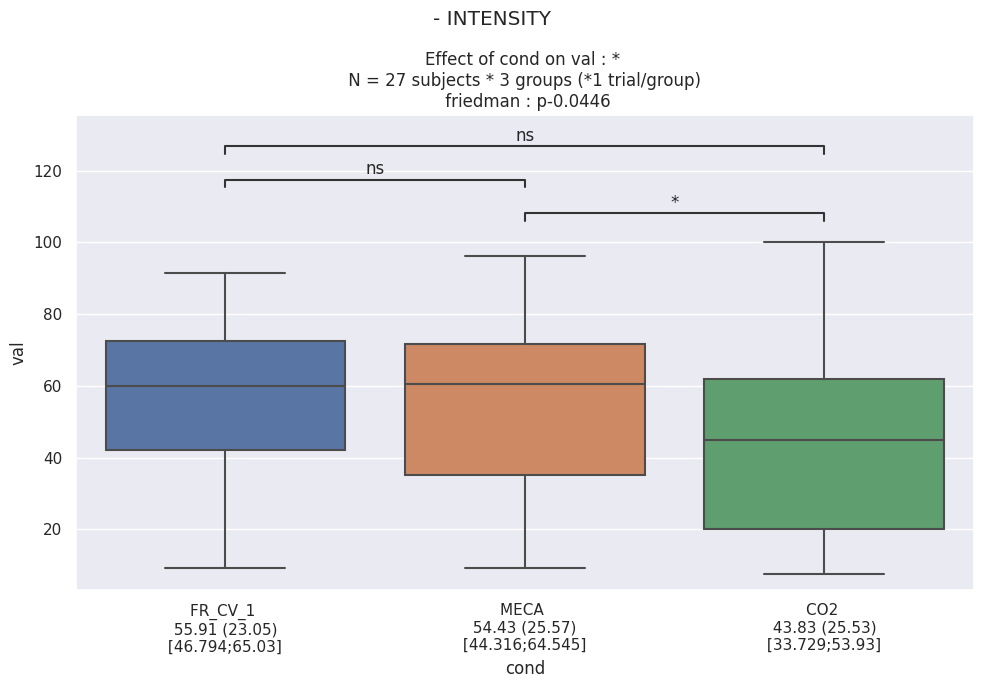

In [98]:
predictor = 'cond' 
outcome = 'val'
for odor in ['+', '-']:
    df_stats = df_intensity.query(f"session == '{odor}' and cond != 'FR_CV_2'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=True, order=None)

    plt.suptitle(f"{odor} INTENSITY")
    plt.tight_layout()

## REP no REP

In [35]:
df_stai

,sujet,session,cond,val,group
0,PD01,o,FR_CV_1,55.765199,REP
1,PD01,o,MECA,69.287212,REP
2,PD01,o,CO2,77.044025,REP
3,PD01,o,FR_CV_2,45.702306,REP
4,PD01,+,FR_CV_1,44.055202,REP
...,...,...,...,...,...
319,MA33,+,FR_CV_2,17.634409,REP
320,MA33,-,FR_CV_1,8.279570,REP
321,MA33,-,MECA,66.774194,REP
322,MA33,-,CO2,63.247863,REP


(0.0, 100.0)

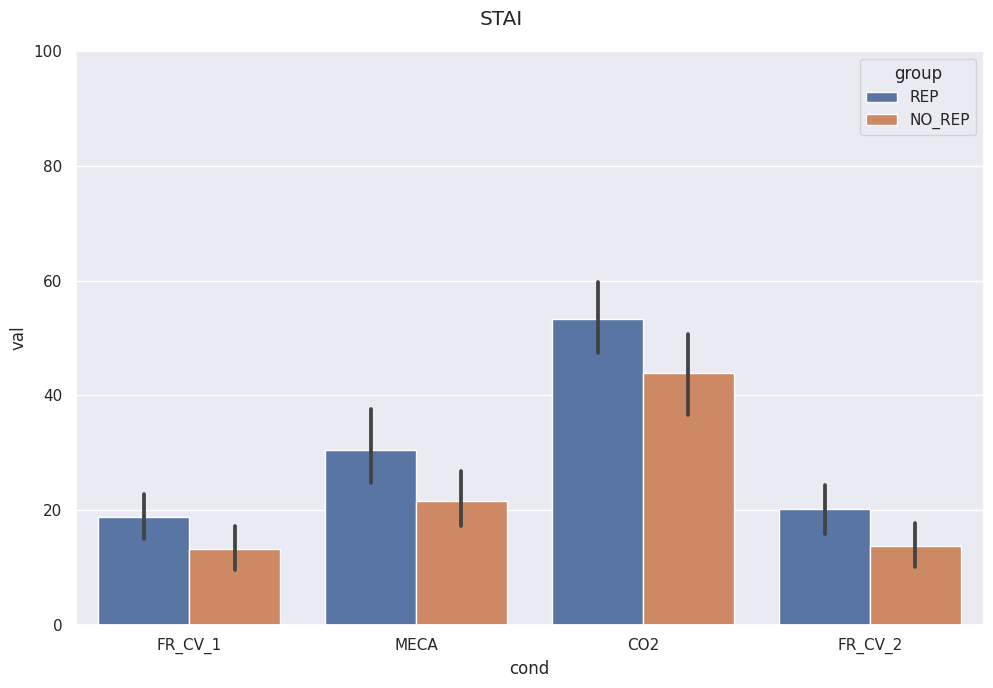

In [34]:
sns.barplot(data=df_stai, x="cond", y="val", hue="group")
sns.set(rc={'figure.figsize':(10,7)})
plt.suptitle('STAI')
plt.tight_layout()
plt.ylim(0, 100)

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

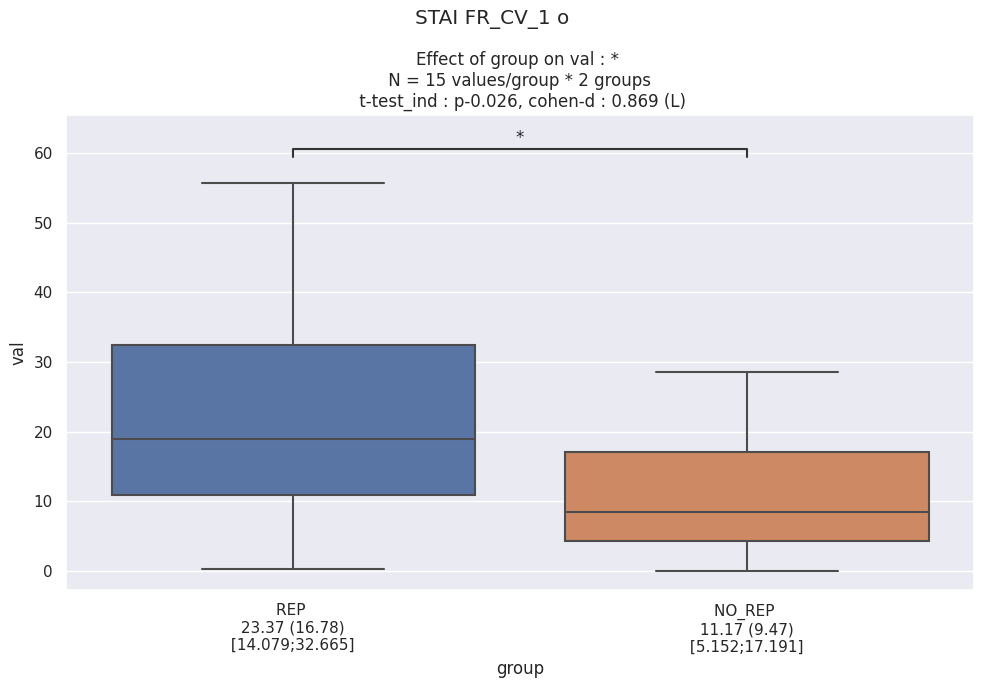

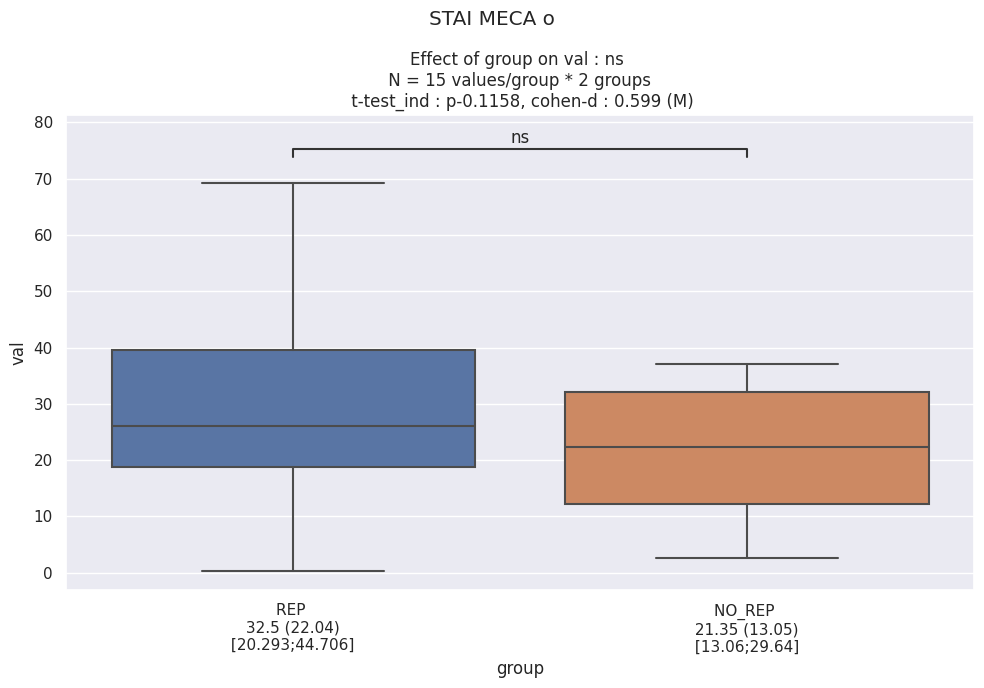

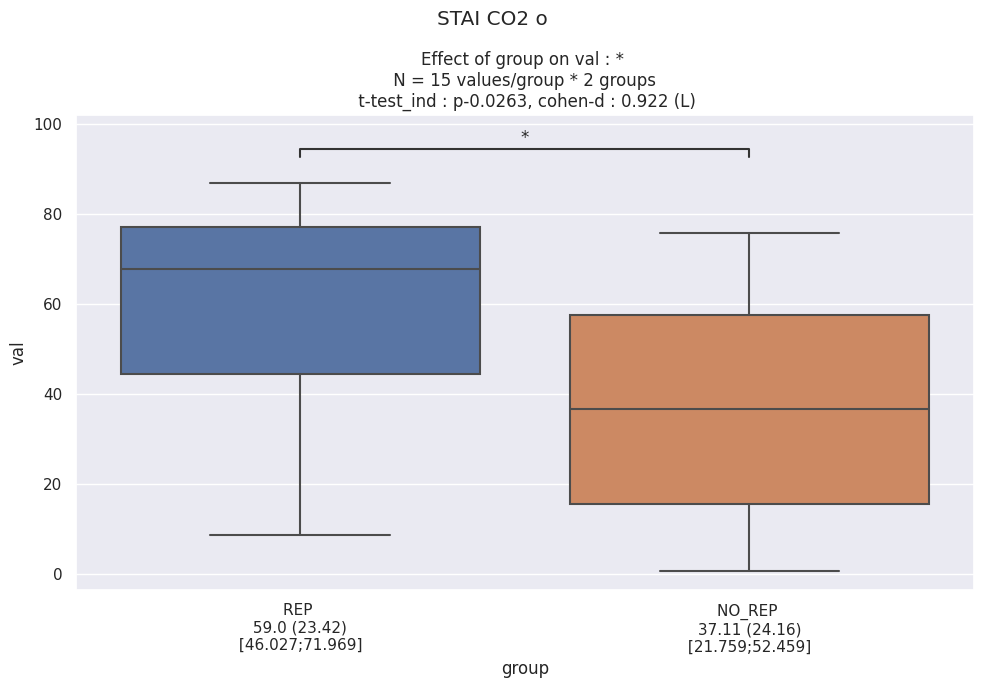

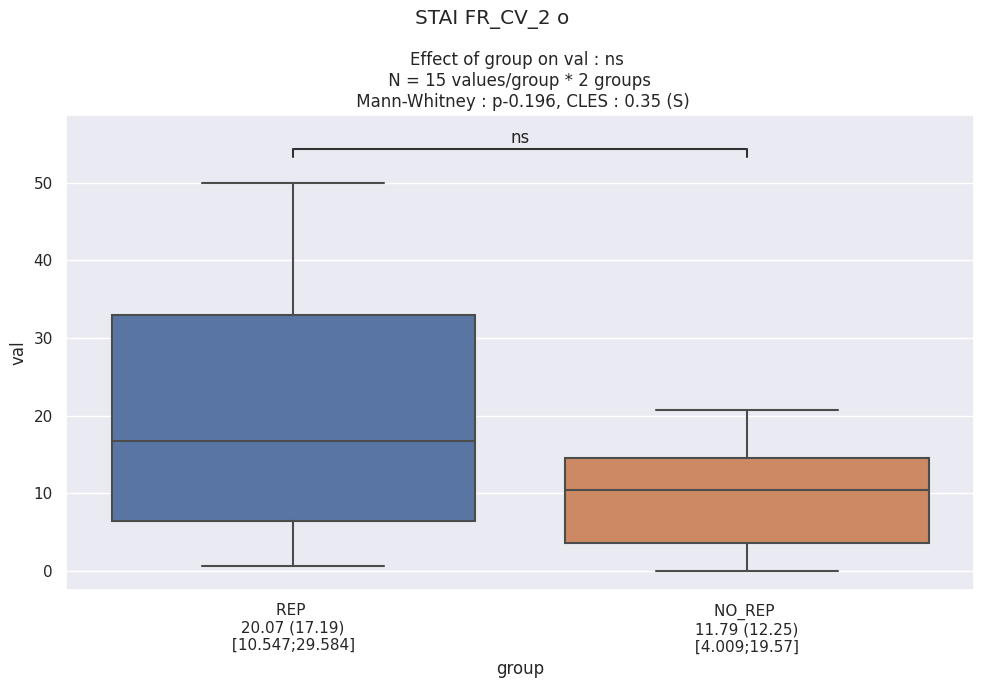

In [47]:
predictor = 'group' 
outcome = 'val'
odor = 'o'
for cond in conditions:
    df_stats = df_stai.query(f"cond == '{cond}' and session == '{odor}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)

    plt.suptitle(f"STAI {cond} {odor}")
    plt.tight_layout()

In [43]:
df_relax

,sujet,session,cond,val,select_best
6,PD01,o,FR_CV_1,45.283019,YES
14,PD01,o,MECA,16.981132,YES
22,PD01,o,CO2,13.207547,YES
30,PD01,o,FR_CV_2,60.377358,YES
38,PD01,+,FR_CV_1,53.503185,YES
...,...,...,...,...,...
3134,MA33,+,FR_CV_2,90.322581,YES
3142,MA33,-,FR_CV_1,100.000000,YES
3150,MA33,-,MECA,32.258065,YES
3158,MA33,-,CO2,23.076923,YES


(0.0, 100.0)

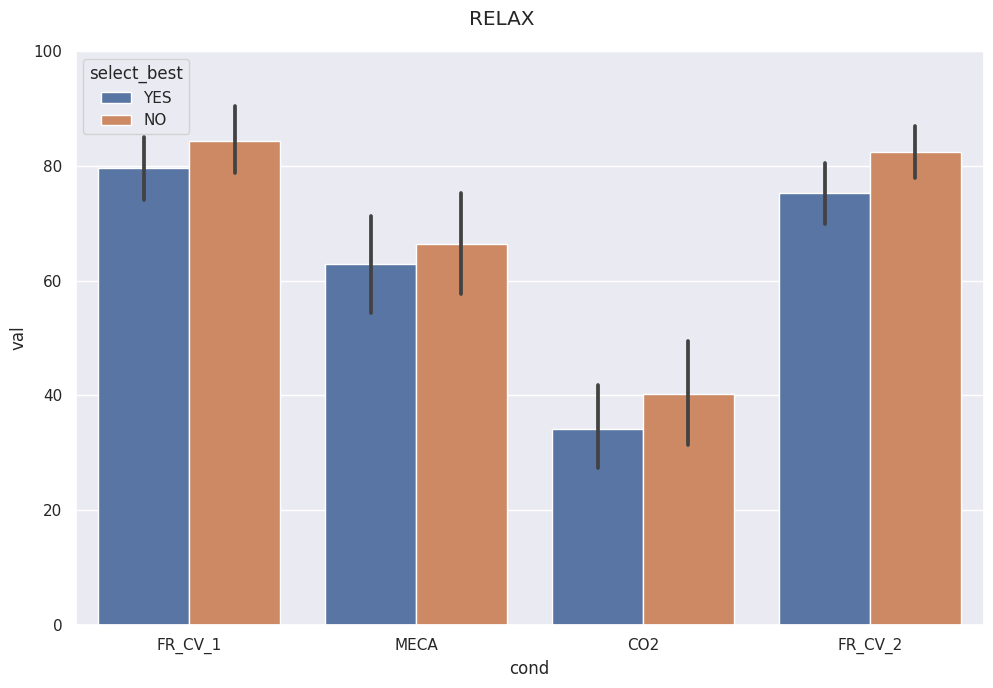

In [45]:
sns.barplot(data=df_relax, x="cond", y="val", hue="select_best")
sns.set(rc={'figure.figsize':(10,7)})
plt.suptitle('RELAX')
plt.tight_layout()
plt.ylim(0, 100)

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/Projets/Olfadys/NBuonviso2022_jules_olfadys/EEG_Paris_J/Script_Python_EEG_Paris_git/n0ter_stats.py:384: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predict

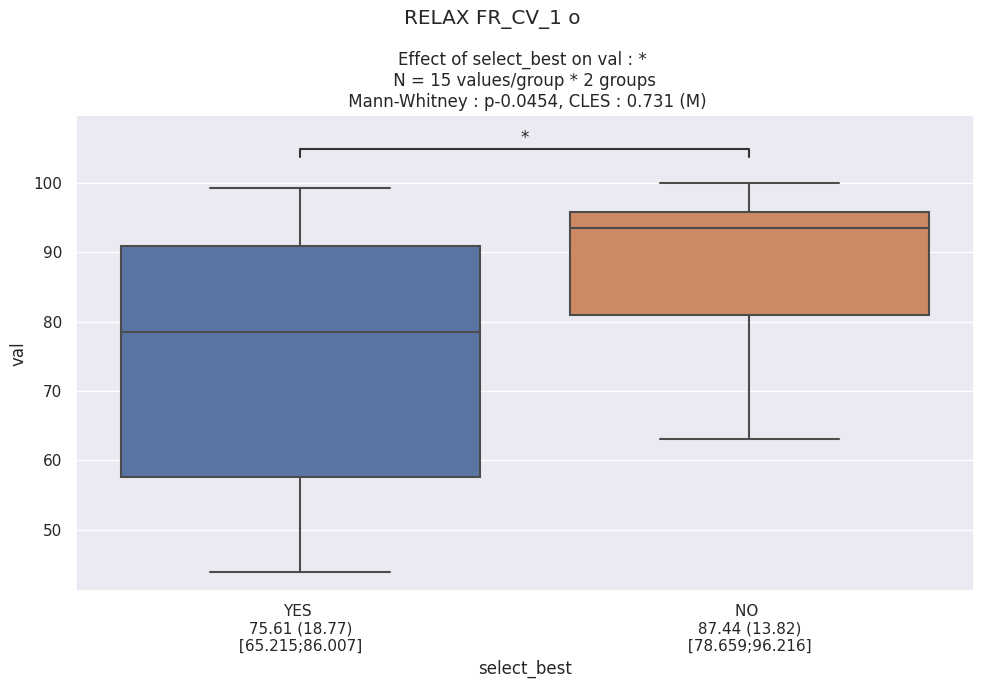

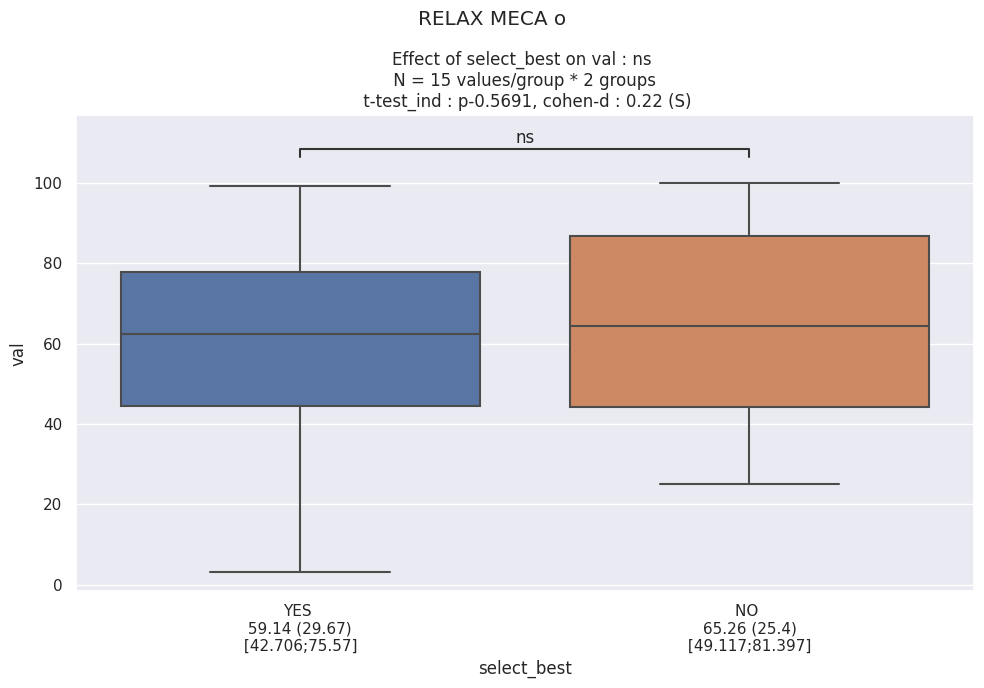

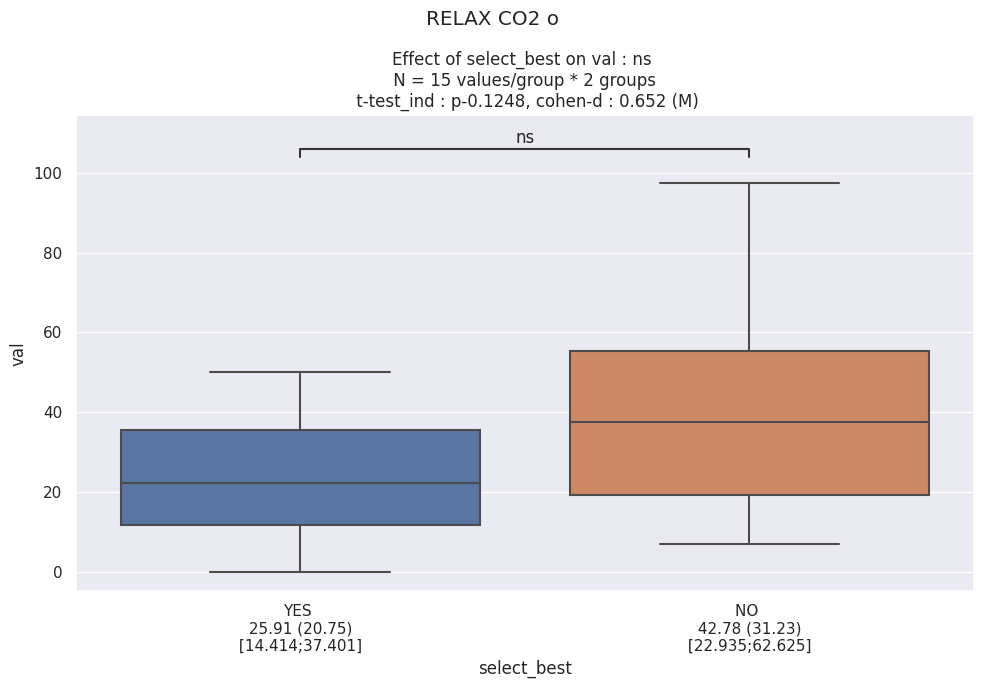

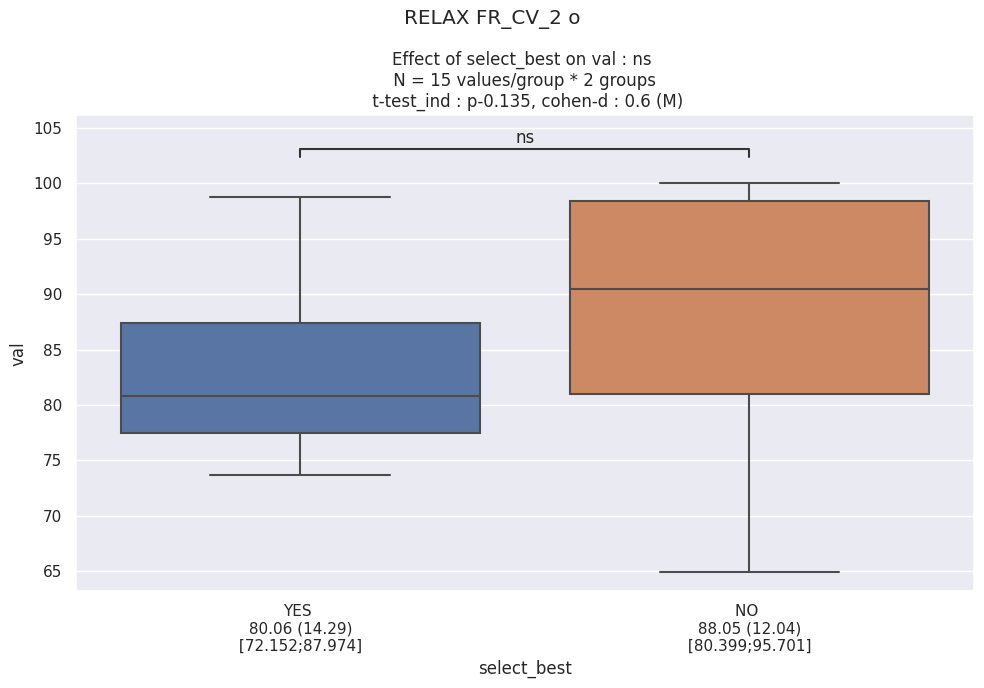

In [48]:
predictor = 'select_best' 
outcome = 'val'
odor = 'o'
for cond in conditions:
    df_stats = df_relax.query(f"cond == '{cond}' and session == '{odor}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)

    plt.suptitle(f"RELAX {cond} {odor}")
    plt.tight_layout()

# MAIA ANALYSIS

In [ ]:
df_MAIA

,sujet,aspect,value,rep
0,01PD,Noticing,3.250000,+
1,01PD,Not_Distracting,2.666667,+
2,01PD,Not_Worrying,1.666667,+
3,01PD,Attention_Regulation,2.857143,+
4,01PD,Emotional_Awareness,4.000000,+
...,...,...,...,...
211,33MA,Attention_Regulation,3.714286,+
212,33MA,Emotional_Awareness,3.000000,+
213,33MA,Self_Regulation,3.500000,+
214,33MA,Body_Listening,4.000000,+


/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


(array([0, 1, 2, 3, 4, 5, 6, 7]),
 [Text(0, 0, 'Noticing'),
  Text(1, 0, 'Not_Distracting'),
  Text(2, 0, 'Not_Worrying'),
  Text(3, 0, 'Attention_Regulation'),
  Text(4, 0, 'Emotional_Awareness'),
  Text(5, 0, 'Self_Regulation'),
  Text(6, 0, 'Body_Listening'),
  Text(7, 0, 'Trusting')])

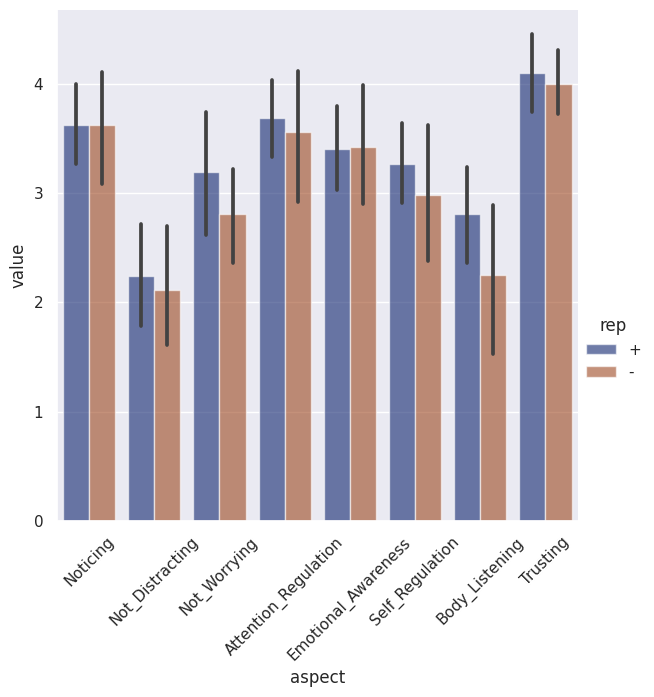

In [ ]:
sns.catplot(data=df_MAIA, kind="bar", x="aspect", y="value", hue="rep", palette="dark", alpha=.6, height=6)
plt.xticks(rotation=45)

In [ ]:
df_MAIA

,sujet,aspect,value,rep
0,01PD,Noticing,3.250000,+
1,01PD,Not_Distracting,2.666667,+
2,01PD,Not_Worrying,1.666667,+
3,01PD,Attention_Regulation,2.857143,+
4,01PD,Emotional_Awareness,4.000000,+
...,...,...,...,...
211,33MA,Attention_Regulation,3.714286,+
212,33MA,Emotional_Awareness,3.000000,+
213,33MA,Self_Regulation,3.500000,+
214,33MA,Body_Listening,4.000000,+


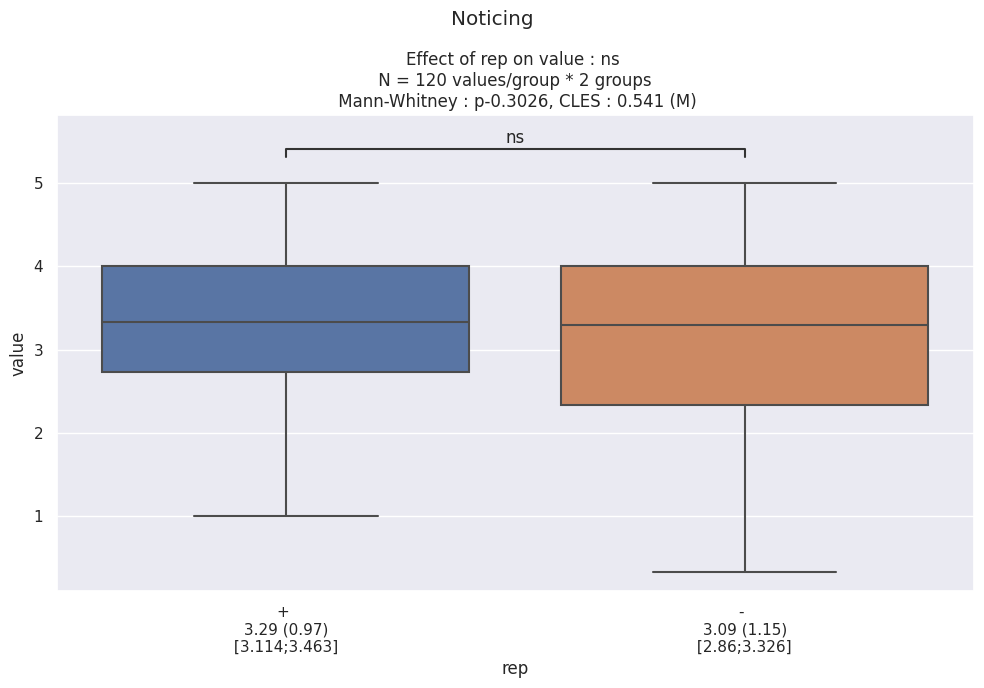

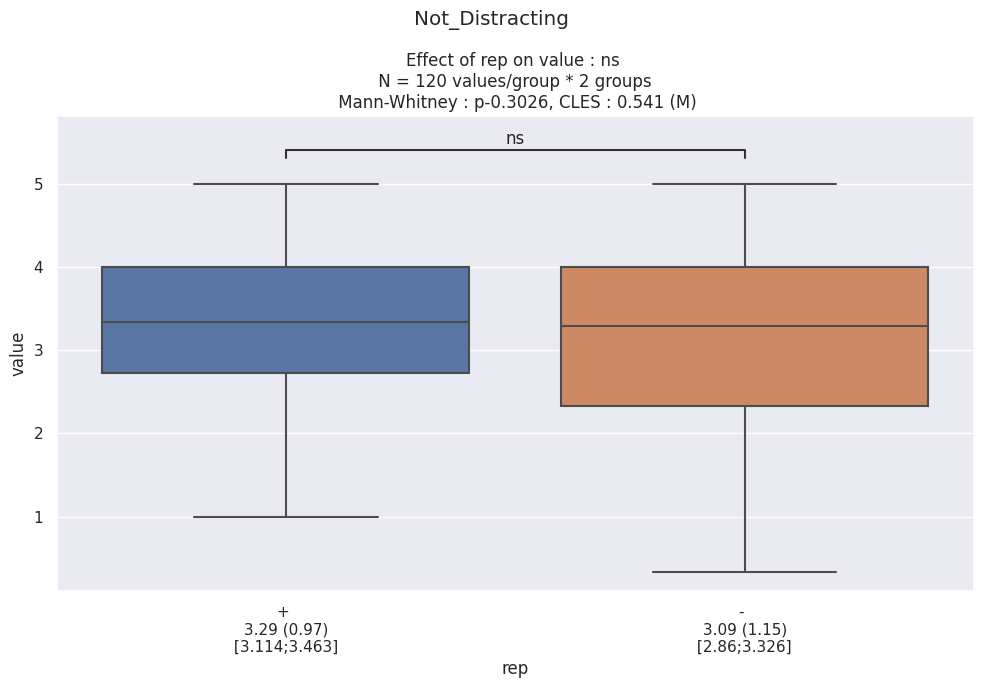

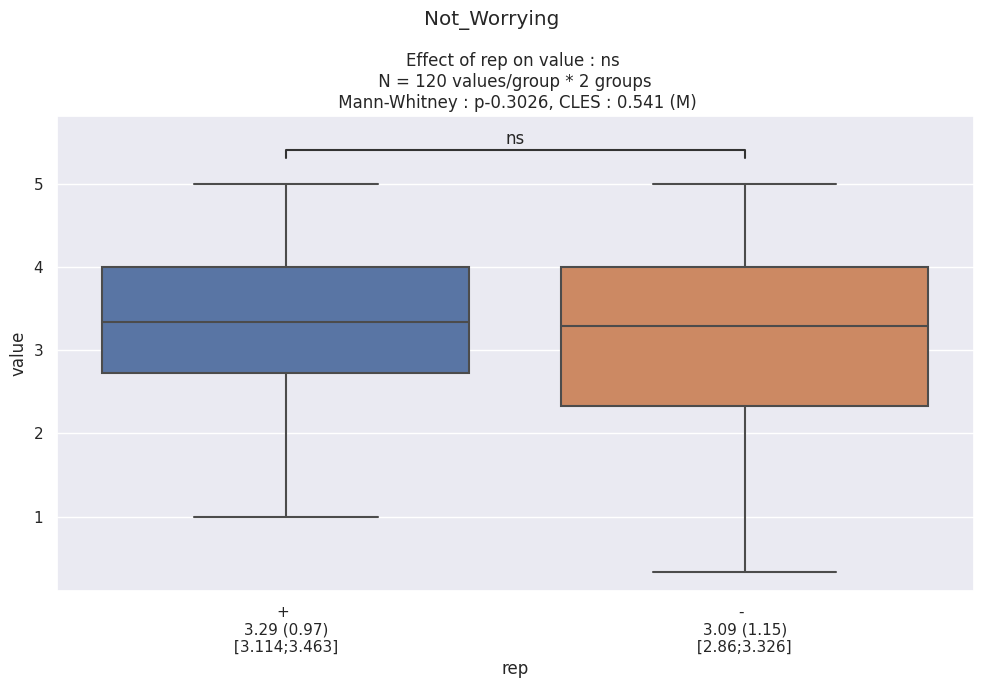

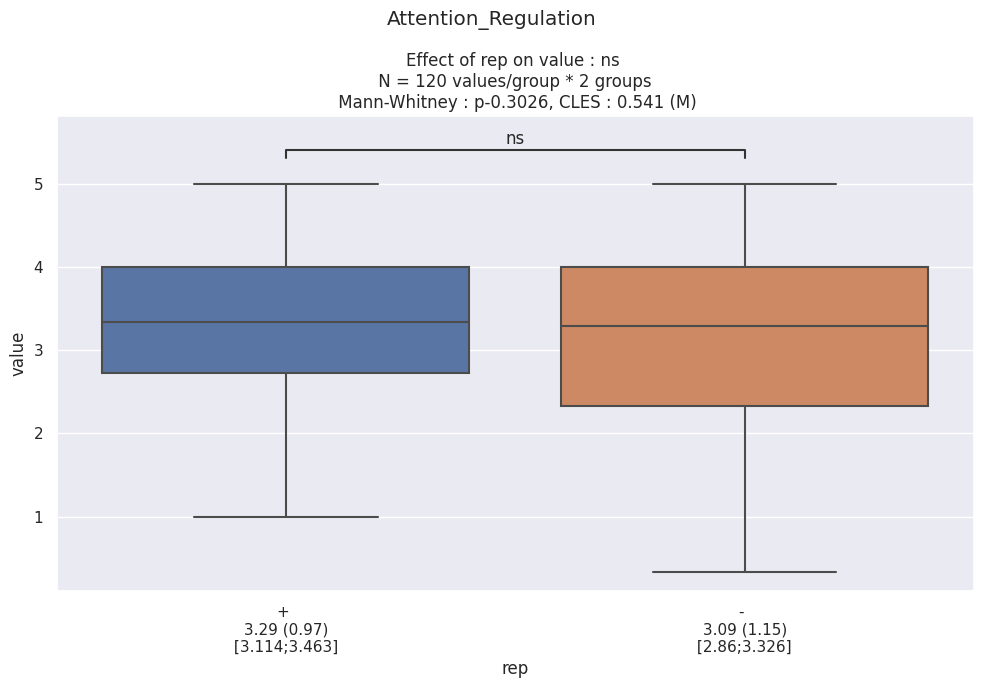

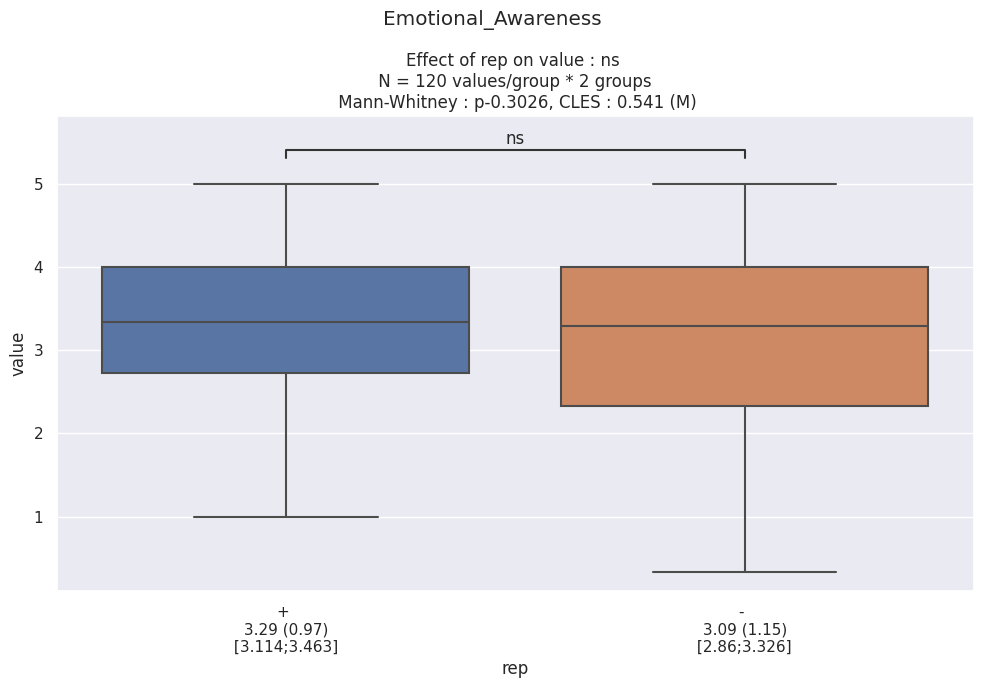

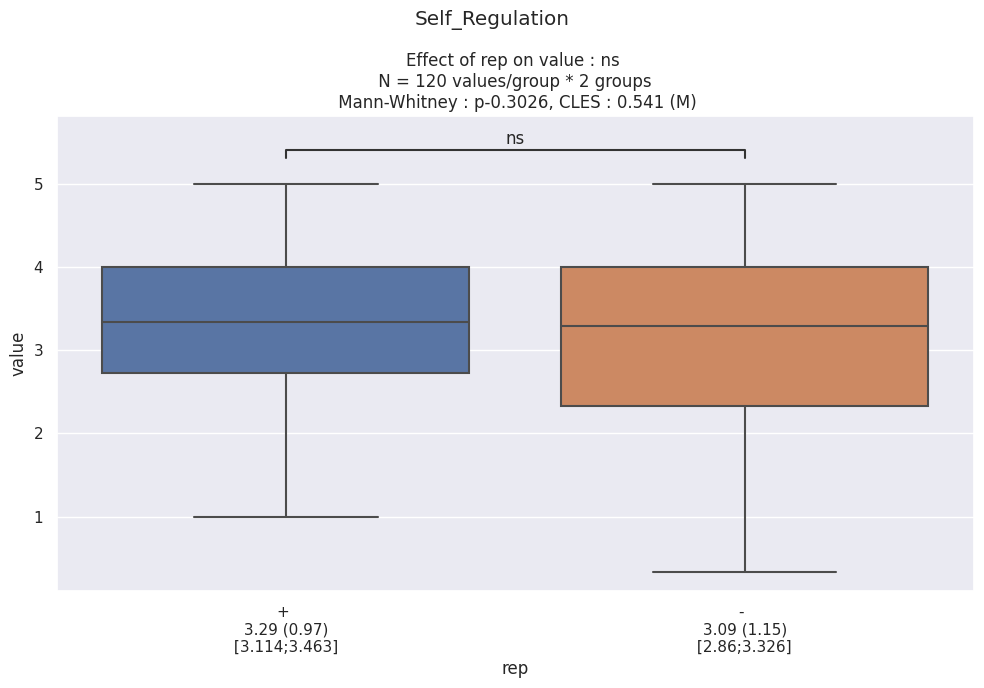

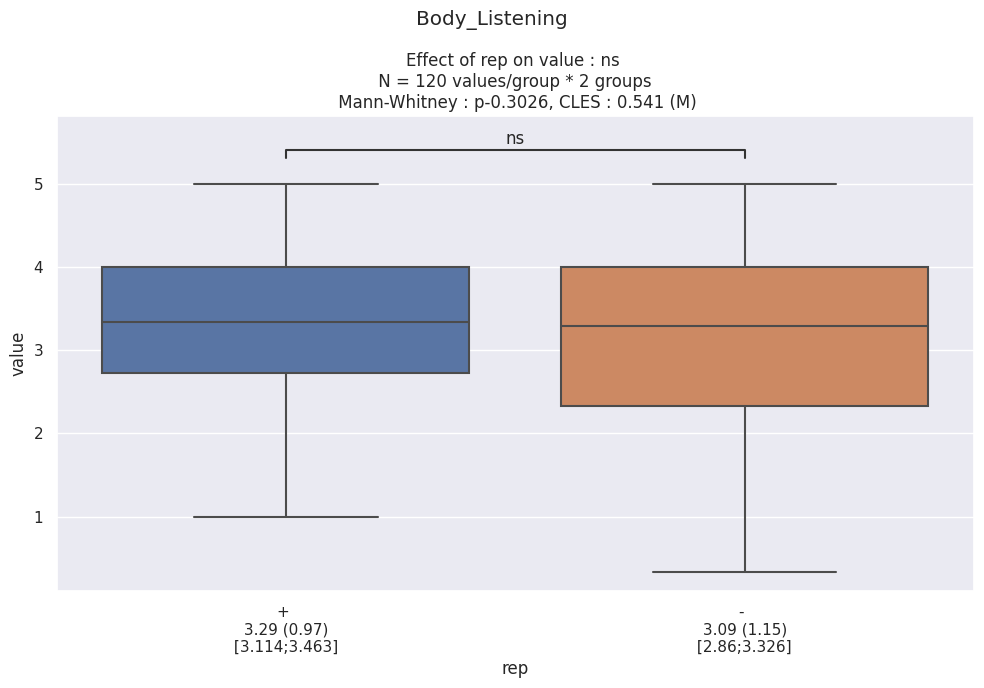

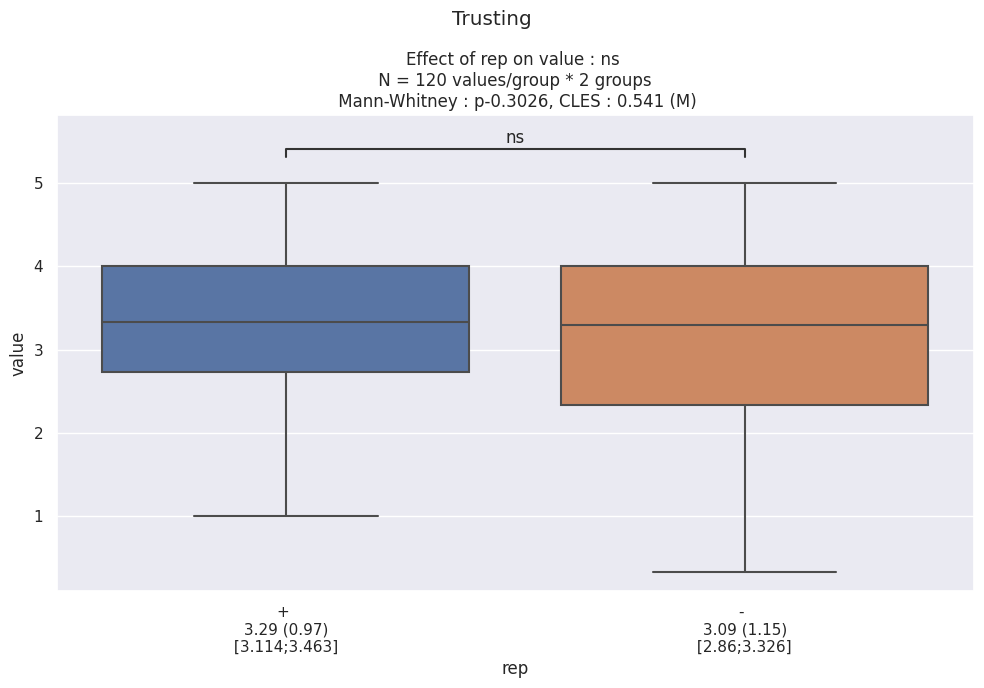

In [ ]:
predictor = 'rep' 
outcome = 'value'
for aspect in df_MAIA['aspect'].unique():
    df_stats = df_MAIA
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=True, order=None)
    plt.suptitle(aspect)
    plt.tight_layout()

# FILTER WITH INTENSITY

<Axes: xlabel='val', ylabel='Count'>

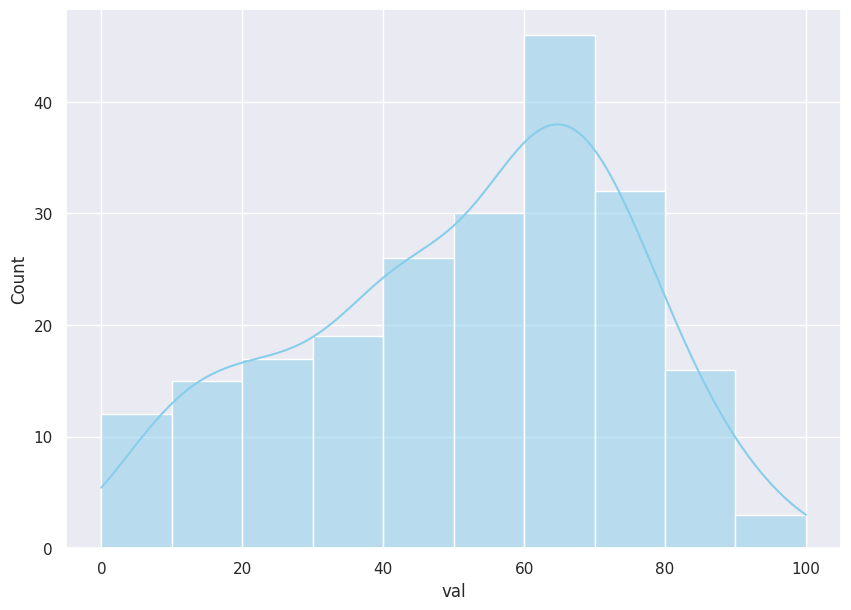

In [ ]:
df_plot = df_q.query("question == 8 & session in ['+', '-']")
sns.histplot(data=df_plot, x="val", label='MECA', color="skyblue", kde=True)

In [ ]:
seuil_odor_p = 30
seuil_odor_n = 50

sujet_p = []
for sujet in df_q['sujet'].unique():
    if (df_q.query(f"sujet == '{sujet}' & question == 8 & session in ['+', '-'] & cond in ['MECA', 'CO2']")['val'].values >= seuil_odor_p).all():
        sujet_p.append(sujet)

sujet_p = np.array(sujet_p)
print(sujet_p)

sujet_n = []
for sujet in df_q['sujet'].unique():
    if (df_q.query(f"sujet == '{sujet}' & question == 8 & session in ['+', '-'] & cond in ['MECA', 'CO2']")['val'].values < seuil_odor_n).all():
        sujet_n.append(sujet)

sujet_n = np.array(sujet_n)
print(sujet_n)

 

['PD01' 'TA09' 'BH10' 'MD14' 'LG15' 'GM16' 'TM19' 'TJ24' 'MN26' 'NT28'
 'AR30' 'MA33']
['LV05' 'FA11' 'ZV21' 'LF23']


## MDP

(0.0, 10.0)

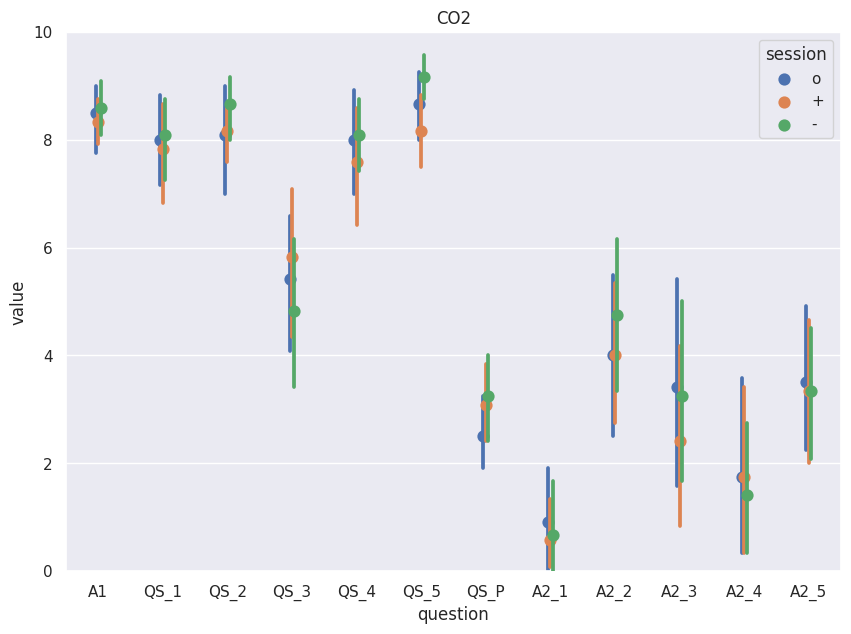

In [ ]:
df_plot = df_mdp.query(f"sujet in {sujet_p.tolist()} & cond == 'CO2'")
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='CO2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

(0.0, 10.0)

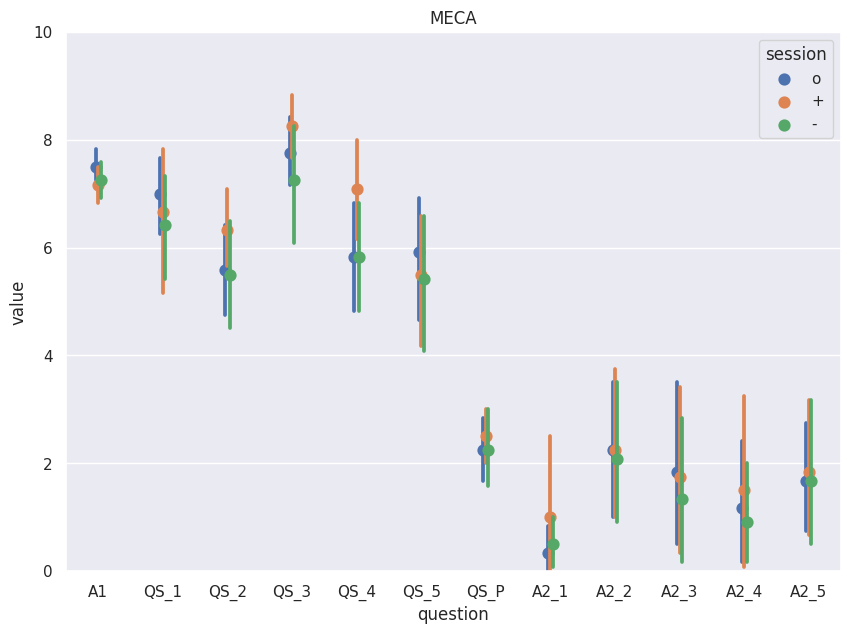

In [ ]:
df_plot = df_mdp.query(f"sujet in {sujet_p.tolist()} & cond == 'MECA'")
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

## Questionnaire

(0.0, 100.0)

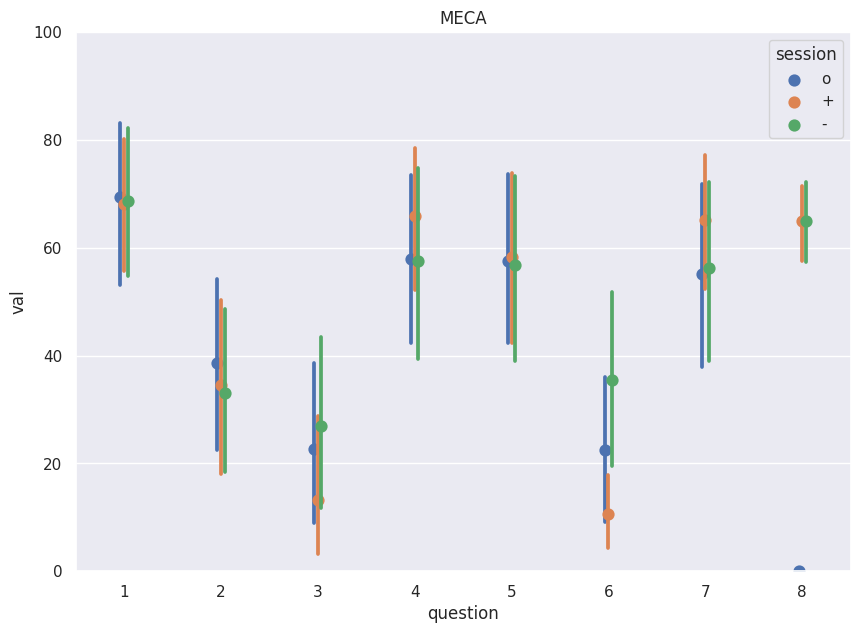

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_p.tolist()} & cond == 'MECA'")
sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

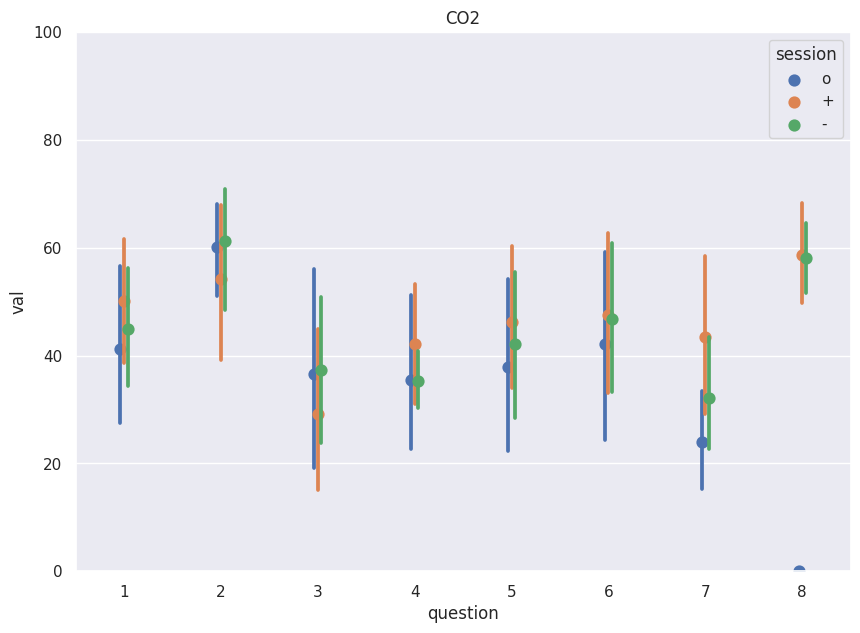

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_p.tolist()} & cond == 'CO2'")
sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='CO2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

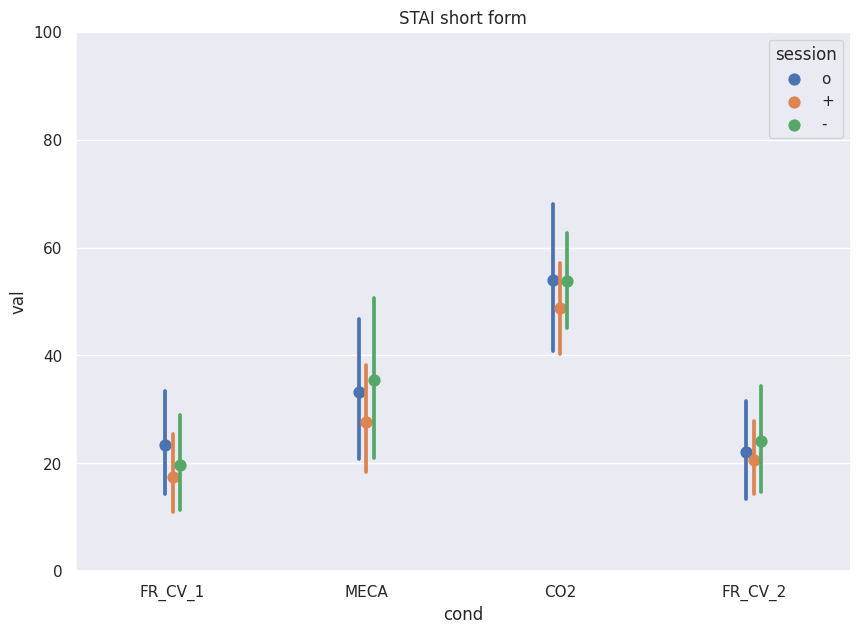

In [ ]:
df_plot = df_stai.query(f"sujet in {sujet_p.tolist()}")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='STAI short form')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

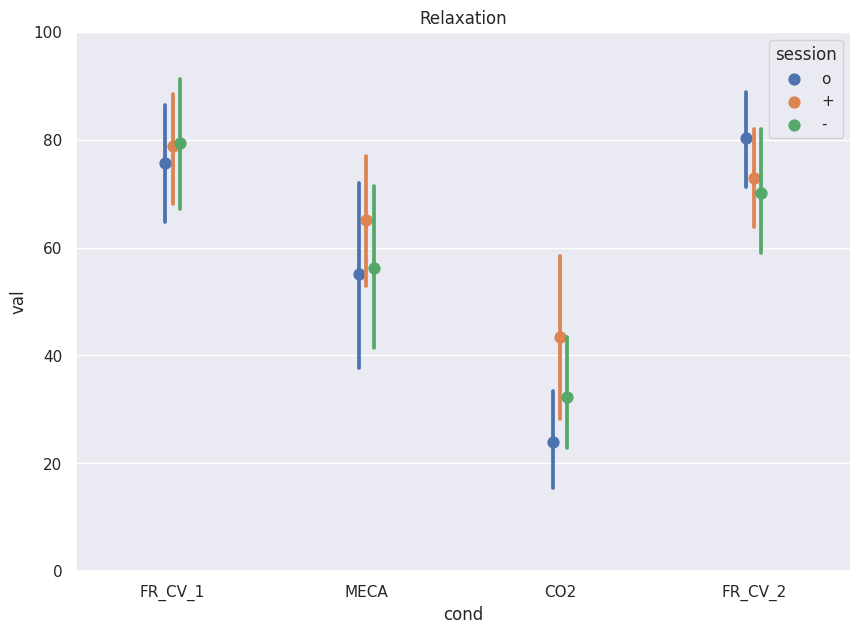

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_p.tolist()} & question == 7")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

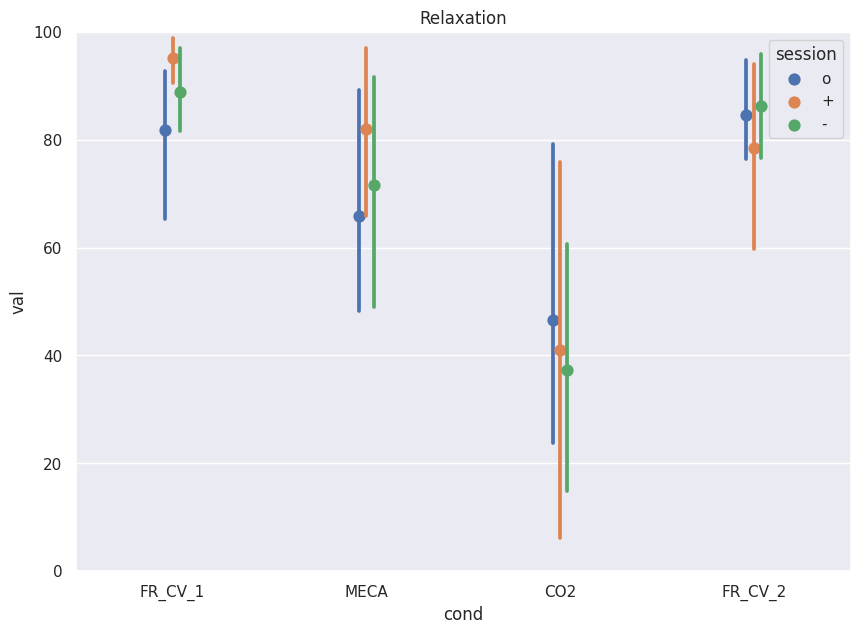

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_n.tolist()} & question == 7")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

## MDP

(0.0, 10.0)

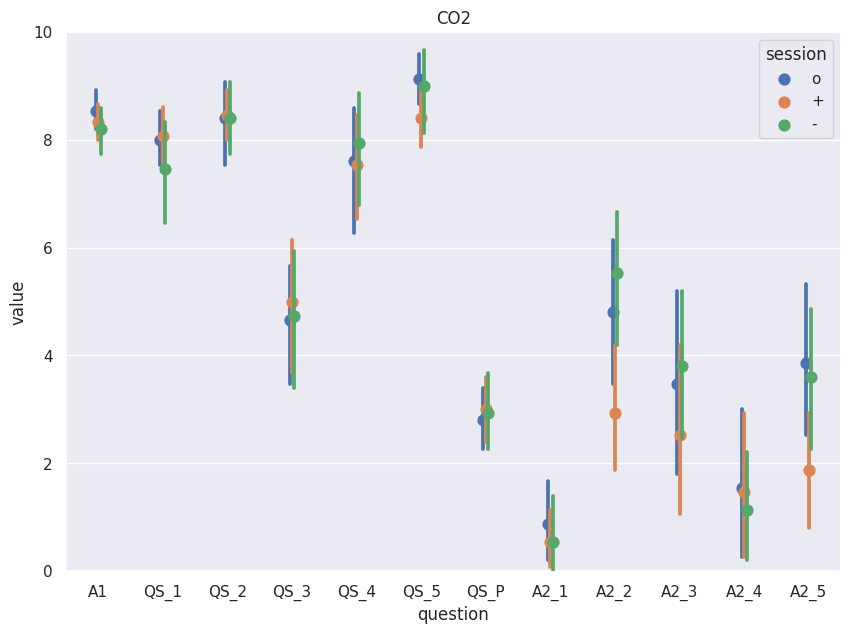

In [ ]:
df_plot = df_mdp.query(f"sujet in {sujet_best_list.tolist()} & cond == 'CO2'")
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='CO2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

(0.0, 10.0)

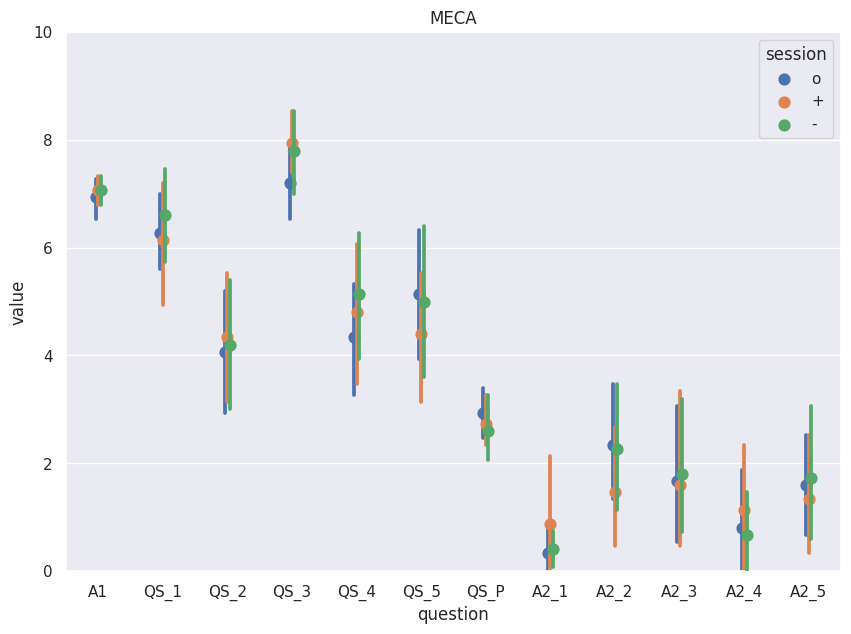

In [ ]:
df_plot = df_mdp.query(f"sujet in {sujet_best_list.tolist()} & cond == 'MECA'")
sns.pointplot(data=df_plot, x="question", y="value", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 10)

## Questionnaire

(0.0, 100.0)

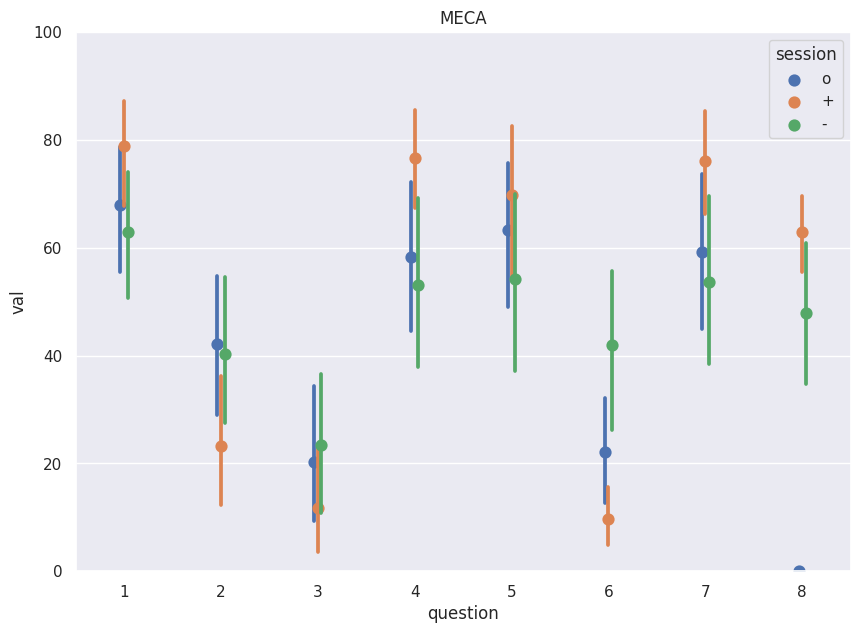

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_best_list.tolist()} & cond == 'MECA'")
sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='MECA')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

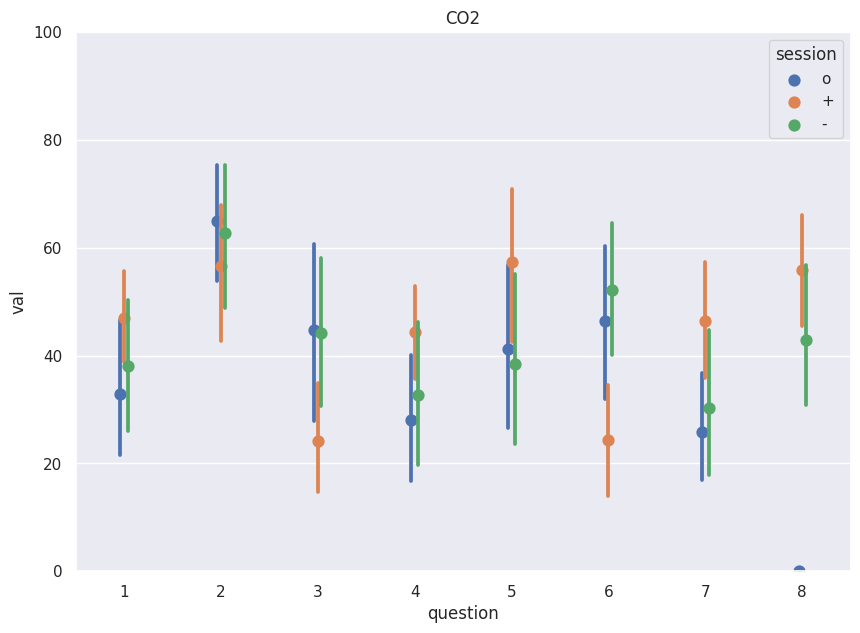

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_best_list.tolist()} & cond == 'CO2'")
sns.pointplot(data=df_plot, x="question", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='CO2')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

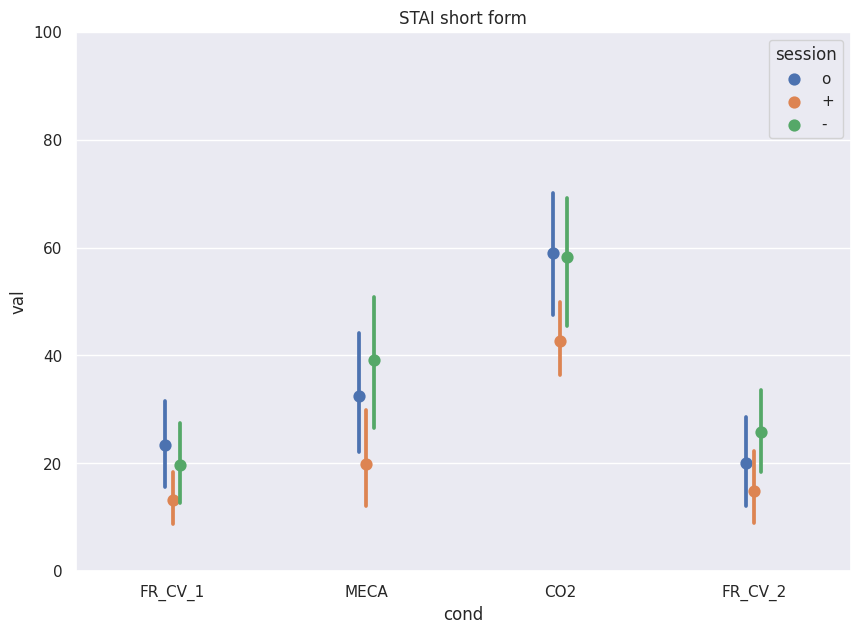

In [ ]:
df_plot = df_stai.query(f"sujet in {sujet_best_list.tolist()}")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='STAI short form')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

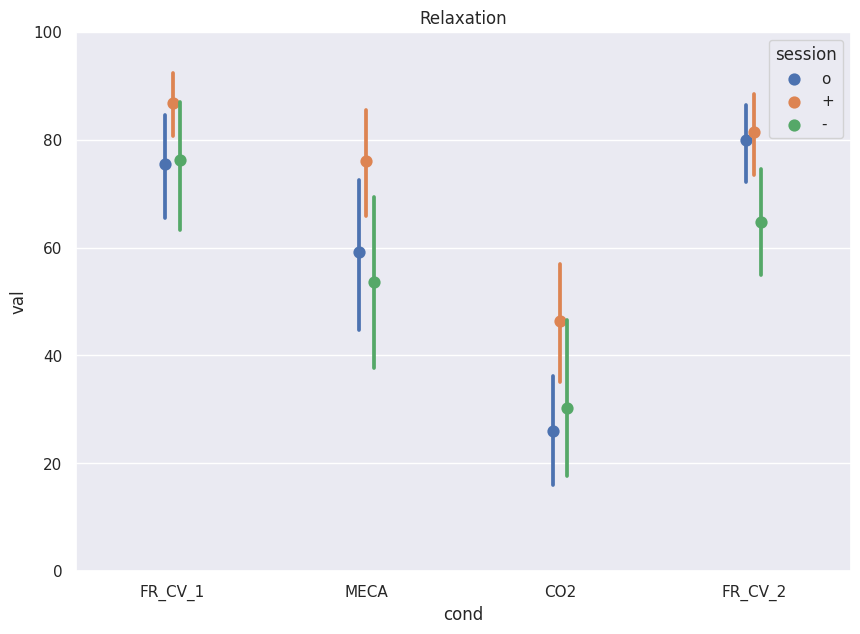

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_best_list.tolist()} & question == 7")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

(0.0, 100.0)

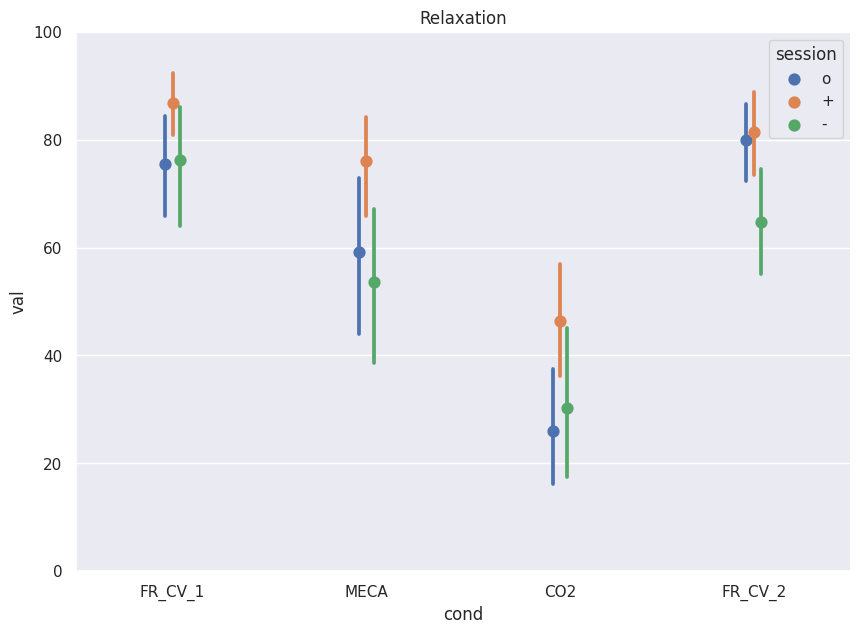

In [ ]:
df_plot = df_q.query(f"sujet in {sujet_best_list.tolist()} & question == 7")
sns.pointplot(data=df_plot, x="cond", y="val", hue="session", errorbar='sd', linestyles='none', dodge=True).set(title='Relaxation')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0, 100)

# CORELATION

## MAIA

In [ ]:
dict_regression_MAIA = {'sujet' : [], 'diff' : [], 'aspect' : [], 'value' : [], 'rep' : []}

for sujet in sujet_list:

    sujet_rev = f"{sujet[2:]}{sujet[:2]}"

    for aspect in MAIA_aspects_list:
        
        dict_regression_MAIA['sujet'].append(sujet)
        _diff = (df_A2.query(f"cond == 'CO2' and session == 'o' and sujet == '{sujet_rev}'")['value'].values - df_A2.query(f"cond == 'CO2' and session == '+' and sujet == '{sujet_rev}'")['value'].values)[0]
        dict_regression_MAIA['diff'].append(_diff)
        dict_regression_MAIA['aspect'].append(aspect)
        dict_regression_MAIA['value'].append(df_MAIA.query(f"aspect == '{aspect}' and sujet == '{sujet}'")['value'].values[0])
        
        if sujet_rev in sujet_best_list:
            dict_regression_MAIA['rep'].append('+')
        else:
            dict_regression_MAIA['rep'].append('-')
            
df_reg_MAIA = pd.DataFrame(dict_regression_MAIA)
df_reg_MAIA

,sujet,diff,aspect,value,rep
0,01PD,2.0,Noticing,3.250000,+
1,01PD,2.0,Not_Distracting,2.666667,+
2,01PD,2.0,Not_Worrying,1.666667,+
3,01PD,2.0,Attention_Regulation,2.857143,+
4,01PD,2.0,Emotional_Awareness,4.000000,+
...,...,...,...,...,...
211,33MA,14.0,Attention_Regulation,3.714286,+
212,33MA,14.0,Emotional_Awareness,3.000000,+
213,33MA,14.0,Self_Regulation,3.500000,+
214,33MA,14.0,Body_Listening,4.000000,+


/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)
/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tigh

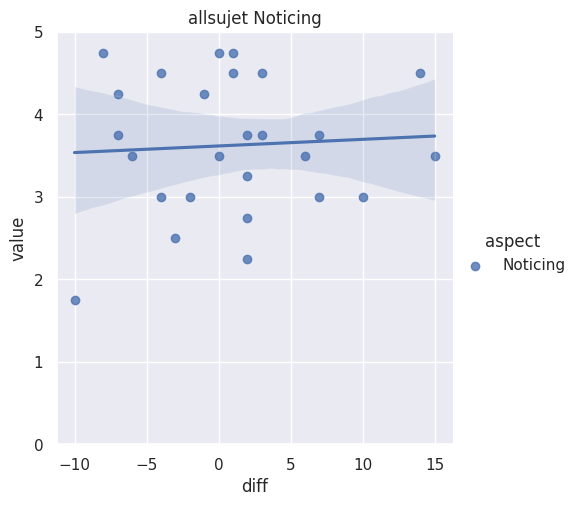

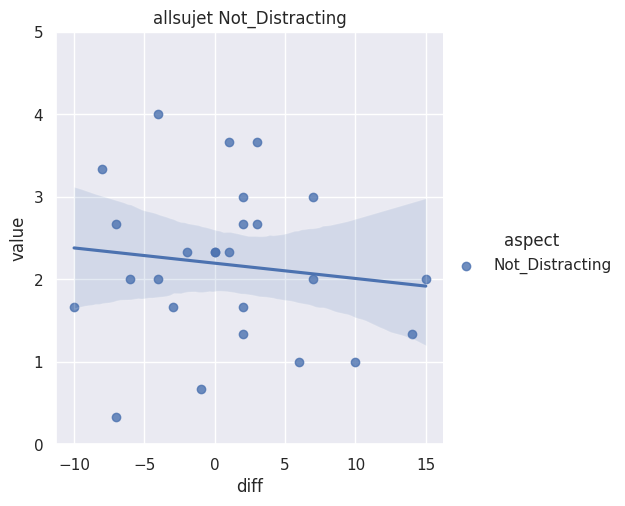

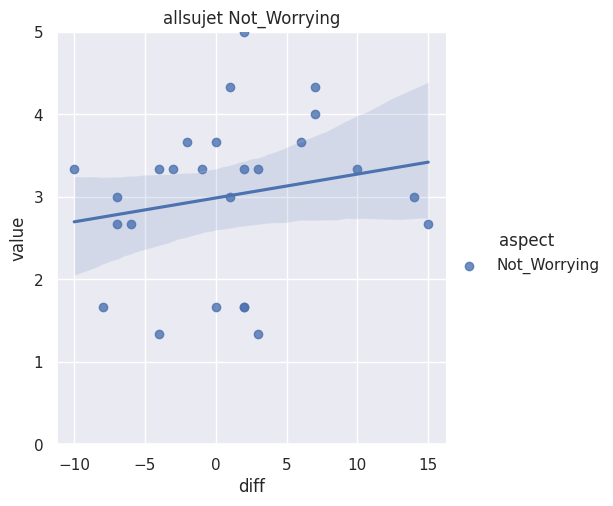

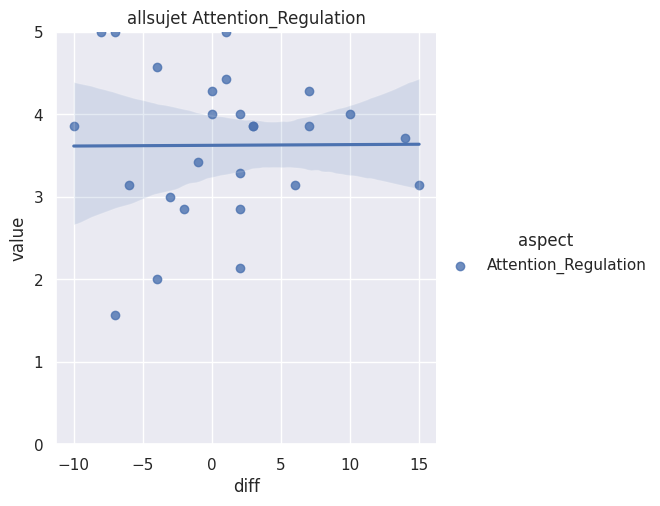

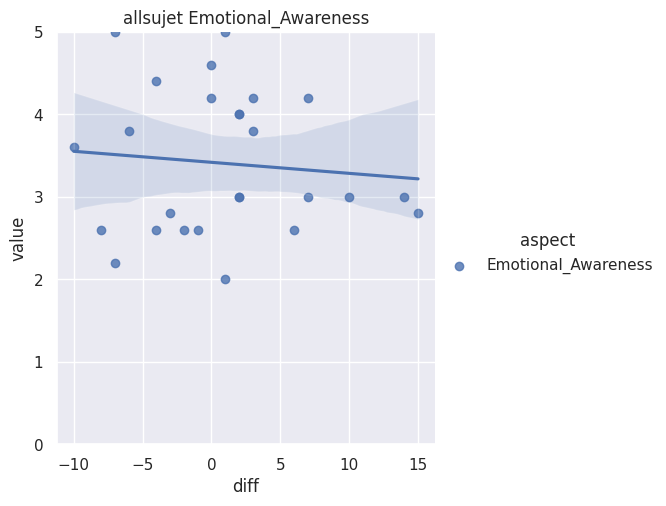

...

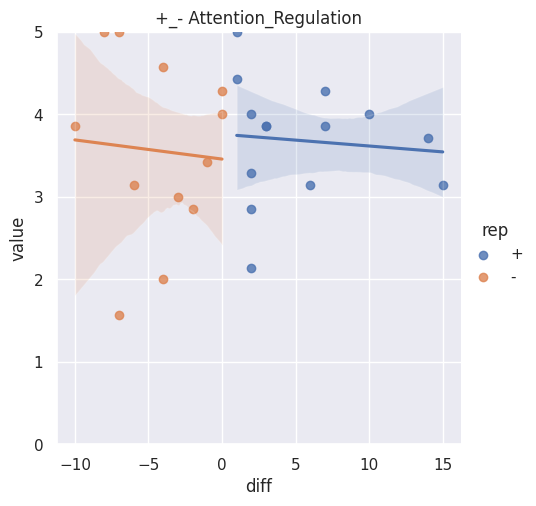

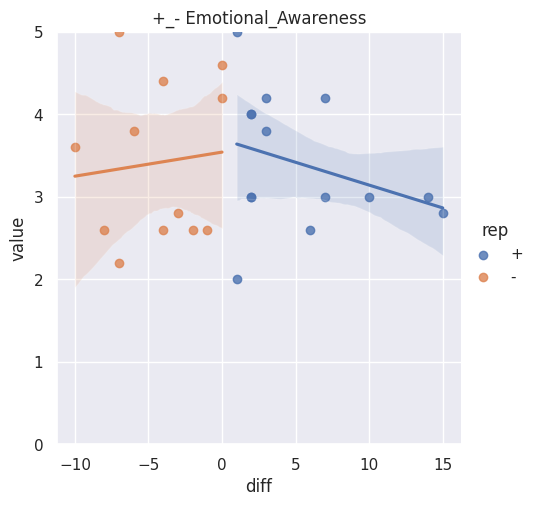

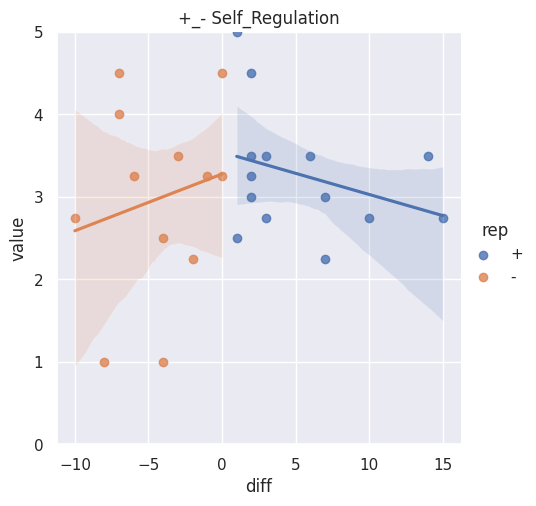

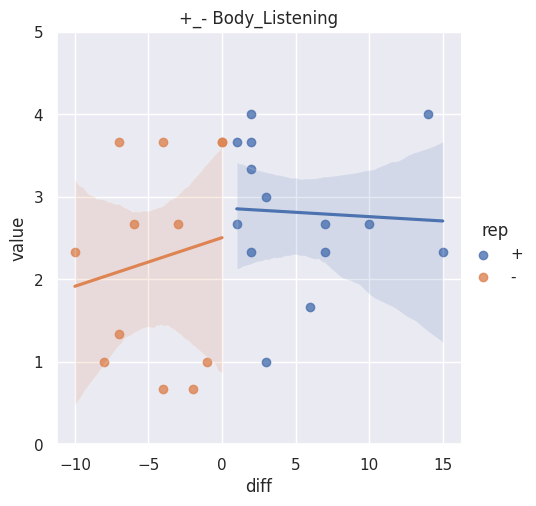

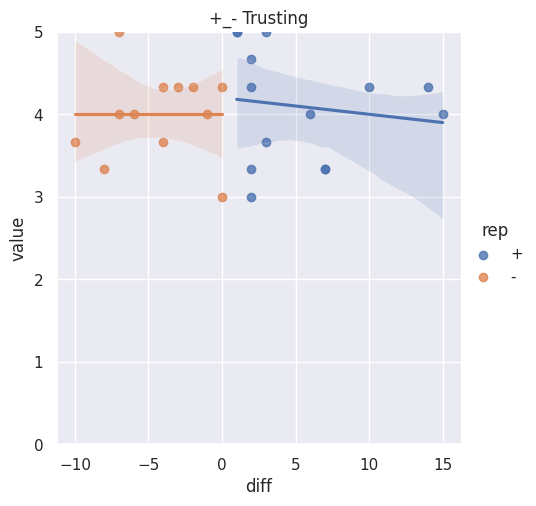

In [ ]:
for group_sel in ['allsujet', '+_-']:
    for aspect in MAIA_aspects_list:
        df_plot = df_reg_MAIA.query(f"aspect == '{aspect}'")
        if group_sel == 'allsujet':
            sns.lmplot(data=df_plot, x="diff", y="value", hue='aspect') 
        if group_sel == '+_-':
            sns.lmplot(data=df_plot, x="diff", y="value", hue='rep') 
        plt.title(f"{group_sel} {aspect}")
        plt.ylim(0,5)

## RELAX

In [ ]:
df_ri = df_q.query("question == 7 & cond in ['MECA', 'CO2'] & session in ['+', '-']")
df_ri['intensity'] = df_q.query("question == 8 & cond in ['MECA', 'CO2'] & session in ['+', '-']")['val'].values
df_ri

/tmp/ipykernel_15429/3049950964.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_ri['intensity'] = df_q.query("question == 8 & cond in ['MECA', 'CO2'] & session in ['+', '-']")['val'].values


,sujet,session,cond,question,raw_val,scale,val,select_best,intensity
46,PD01,+,MECA,7,4.7,15.7,29.936306,YES,68.152866
54,PD01,+,CO2,7,2,15.7,12.738854,YES,53.503185
78,PD01,-,MECA,7,5.5,15.7,35.031847,YES,82.165605
86,PD01,-,CO2,7,3,15.7,19.108280,YES,72.611465
238,VN03,+,MECA,7,12,15.7,76.433121,YES,50.318471
...,...,...,...,...,...,...,...,...,...
3062,CM32,-,CO2,7,0.1,15.6,0.641026,YES,20.512821
3118,MA33,+,MECA,7,13.7,15.3,89.542484,YES,81.699346
3126,MA33,+,CO2,7,13.8,15.5,89.032258,YES,38.064516
3150,MA33,-,MECA,7,5,15.5,32.258065,YES,70.967742


[Text(0.5, 1.0, 'MECA relaxation')]

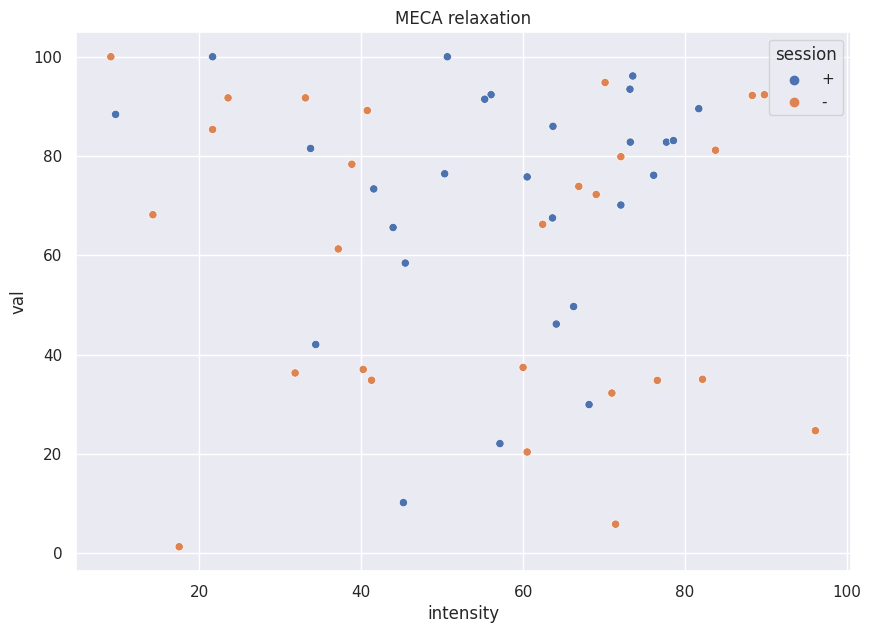

In [ ]:
df_plot = df_ri.query("cond == 'MECA'")
sns.scatterplot(data=df_plot, x='intensity', y='val', hue='session').set(title='MECA relaxation')


[Text(0.5, 1.0, 'CO2 relaxation')]

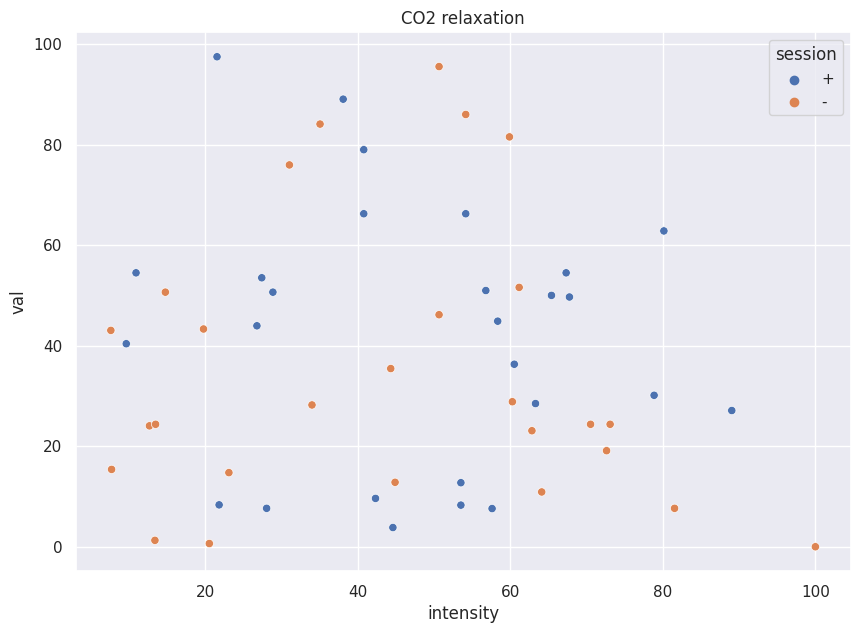

In [ ]:
df_plot = df_ri.query("cond == 'CO2'")
sns.scatterplot(data=df_plot, x='intensity', y='val', hue='session').set(title='CO2 relaxation')

In [ ]:
df_stats = df_ri.query("cond == 'CO2'")
Y = df_stats['val'].values.reshape(-1,1)
X = df_stats['intensity'].values.reshape(-1,1)

slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(X.reshape(-1), Y.reshape(-1))
slope, intercept, r_value, p_value, std_err

(-0.08768767943011525,
 42.65664281059613,
 -0.07573778624536963,
 0.5862234709953786,
 0.16009401978929905)

In [ ]:
df_stats = df_ri.query("cond == 'MECA'")
Y = df_stats['val'].values.reshape(-1,1)
X = df_stats['intensity'].values.reshape(-1,1)

slope, intercept, r_value, p_value, std_err = scipy.stats.linregress(X.reshape(-1), Y.reshape(-1))
slope, intercept, r_value, p_value, std_err

(-0.05608408361439735,
 68.85547088713611,
 -0.0447103453488361,
 0.7481911157216699,
 0.17377824896054217)

In [ ]:
df_stai['sujet'].unique()

array(['PD01', 'VN03', 'LV05', 'EF06', 'PB07', 'DM08', 'TA09', 'BH10',
       'FA11', 'BD12', 'FP13', 'MD14', 'LG15', 'GM16', 'JR17', 'TM19',
       'TY20', 'ZV21', 'LF23', 'TJ24', 'MN26', 'NT28', 'SC29', 'AR30',
       'HJ31', 'CM32', 'MA33'], dtype=object)

In [ ]:
df_q['sujet'].unique()

array(['PD01', 'VN03', 'LV05', 'EF06', 'PB07', 'DM08', 'TA09', 'BH10',
       'FA11', 'BD12', 'FP13', 'MD14', 'LG15', 'GM16', 'JR17', 'TM19',
       'TY20', 'ZV21', 'LF23', 'TJ24', 'MN26', 'NT28', 'SC29', 'AR30',
       'HJ31', 'CM32', 'MA33'], dtype=object)

In [ ]:
df_stai_ri = df_stai.query("cond in ['MECA', 'CO2'] & session in ['+', '-']")

In [ ]:
df_stai_ri['intensity'] = df_q.query("question == 8 & cond in ['MECA', 'CO2'] & session in ['+', '-']")['val'].values
df_stai_ri

/tmp/ipykernel_15429/2127589661.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_stai_ri['intensity'] = df_q.query("question == 8 & cond in ['MECA', 'CO2'] & session in ['+', '-']")['val'].values


,sujet,session,cond,val,intensity
5,PD01,+,MECA,71.337580,68.152866
6,PD01,+,CO2,78.025478,53.503185
9,PD01,-,MECA,67.834395,82.165605
10,PD01,-,CO2,74.628450,72.611465
29,VN03,+,MECA,18.259023,50.318471
...,...,...,...,...,...
382,CM32,-,CO2,85.897436,20.512821
389,MA33,+,MECA,19.063181,81.699346
390,MA33,+,CO2,34.623656,38.064516
393,MA33,-,MECA,66.774194,70.967742


[Text(0.5, 1.0, 'MECA STAI')]

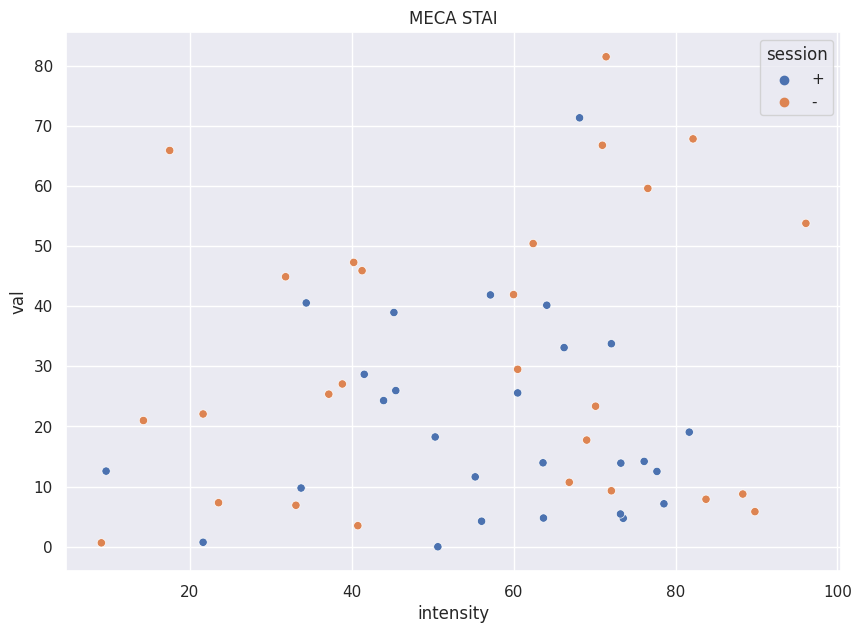

In [ ]:
df_plot = df_stai_ri.query("cond == 'MECA'")
sns.scatterplot(data=df_plot, x='intensity', y='val', hue='session').set(title='MECA STAI')


[Text(0.5, 1.0, 'CO2 STAI')]

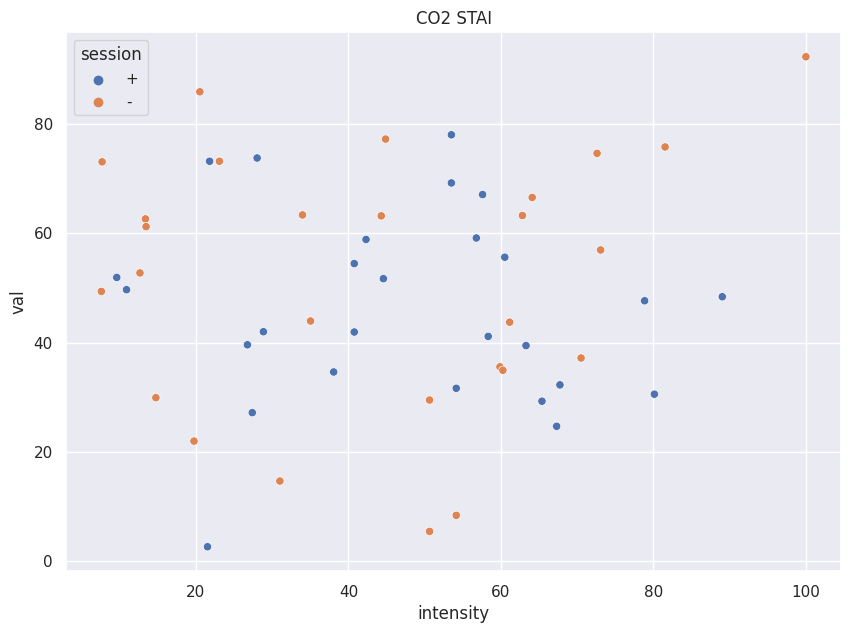

In [ ]:
df_plot = df_stai_ri.query("cond == 'CO2'")
sns.scatterplot(data=df_plot, x='intensity', y='val', hue='session').set(title='CO2 STAI')

# COMPUTE DIFF

In [ ]:
val = np.zeros((df_mdp['sujet'].unique().shape[0]*df_mdp['session'].unique().shape[0]*df_mdp['cond'].unique().shape[0], 4), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_mdp['sujet'].unique()):
    for session_i, session in enumerate(df_mdp['session'].unique()):
        for cond_i, cond in enumerate(df_mdp['cond'].unique()):
            df_i = df_mdp.query(f"sujet == '{sujet}' & session == '{session}' & cond == '{cond}'")
            val_A2 = df_i[df_i['question'].isin(['A2_1', 'A2_2', 'A2_3', 'A2_4', 'A2_5'])]['value'].sum()
            val[i, :] = np.array([sujet, session, cond, val_A2])
            i += 1

df_A2 = pd.DataFrame(val, columns=['sujet', 'session', 'cond', 'value'])
df_A2['value'] = df_A2['value'].astype(np.float64) 
df_A2

,sujet,session,cond,value
0,PD01,o,MECA,26.0
1,PD01,o,CO2,34.0
2,PD01,+,MECA,40.0
3,PD01,+,CO2,32.0
4,PD01,-,MECA,27.0
...,...,...,...,...
157,MA33,o,CO2,21.0
158,MA33,+,MECA,2.0
159,MA33,+,CO2,7.0
160,MA33,-,MECA,1.0


In [ ]:
val = np.zeros((df_q['sujet'].unique().shape[0]*df_q['session'].unique().shape[0]*df_q['cond'].unique().shape[0], 4), dtype='object')
i = 0
for sujet_i, sujet in enumerate(df_q['sujet'].unique()):
    for session_i, session in enumerate(df_q['session'].unique()):
        for cond_i, cond in enumerate(df_q['cond'].unique()):
            df_i = df_q.query(f"sujet == '{sujet}' & session == '{session}' & cond == '{cond}'")
            val_p = 300 - df_i[df_i['question'].isin([1, 4, 5])]['val'].sum()
            val_n = df_i[df_i['question'].isin([2, 3, 6])]['val'].sum()
            val_stai = ((val_n + val_p)/600)*100
            val[i, :] = np.array([sujet, session, cond, val_stai])
            i += 1
df_stai = pd.DataFrame(val, columns=['sujet', 'session', 'cond', 'val'])
df_stai['val'] = df_stai['val'].astype(np.float64) 
df_stai

,sujet,session,cond,val
0,PD01,o,FR_CV_1,55.765199
1,PD01,o,MECA,69.287212
2,PD01,o,CO2,77.044025
3,PD01,o,FR_CV_2,45.702306
4,PD01,+,FR_CV_1,44.055202
...,...,...,...,...
319,MA33,+,FR_CV_2,17.634409
320,MA33,-,FR_CV_1,8.279570
321,MA33,-,MECA,66.774194
322,MA33,-,CO2,63.247863


In [ ]:
df_rela = df_q.query(f"question == 7").drop(['question', 'raw_val', 'scale'], axis=1)
df_rela

,sujet,session,cond,val,select_best
6,PD01,o,FR_CV_1,45.283019,YES
14,PD01,o,MECA,16.981132,YES
22,PD01,o,CO2,13.207547,YES
30,PD01,o,FR_CV_2,60.377358,YES
38,PD01,+,FR_CV_1,53.503185,YES
...,...,...,...,...,...
3134,MA33,+,FR_CV_2,90.322581,YES
3142,MA33,-,FR_CV_1,100.000000,YES
3150,MA33,-,MECA,32.258065,YES
3158,MA33,-,CO2,23.076923,YES


In [ ]:
df_diff = {'sujet' : [], 'diff' : [], 'cond' : [], 'question' : [], 'val' : []}
for sujet in sujet_list_rev:
    for diff_cond in ['+/o', '-/o', '+/-']:
        for cond in ['FR_CV_1', 'MECA', 'CO2', 'FR_CV_2']:
            for question in ['A2', 'STAI', 'RELAX']:

                diff_cond_a, diff_cond_b = diff_cond.split('/')[0], diff_cond.split('/')[-1]
            
                if question == 'A2' and cond.find('FR_CV') == -1:
                    diff_i = df_A2.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_a}'")['value'].values[0] - df_A2.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_b}'")['value'].values[0]
                if question == 'STAI':
                    diff_i = df_stai.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_a}'")['val'].values[0] - df_stai.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_b}'")['val'].values[0]
                if question == 'RELAX':
                    diff_i = df_rela.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_a}'")['val'].values[0] - df_rela.query(f"sujet == '{sujet}' & cond == '{cond}' & session == '{diff_cond_b}'")['val'].values[0]

                df_diff['sujet'].append(sujet)
                df_diff['diff'].append(diff_cond)
                df_diff['cond'].append(cond)
                df_diff['question'].append(question)
                df_diff['val'].append(diff_i)

df_diff = pd.DataFrame(df_diff)
df_diff

,sujet,diff,cond,question,val
0,PD01,+/o,FR_CV_1,A2,2.000000
1,PD01,+/o,FR_CV_1,STAI,-11.709997
2,PD01,+/o,FR_CV_1,RELAX,8.220166
3,PD01,+/o,MECA,A2,14.000000
4,PD01,+/o,MECA,STAI,2.050368
...,...,...,...,...,...
967,MA33,+/-,CO2,STAI,-28.624207
968,MA33,+/-,CO2,RELAX,65.955335
969,MA33,+/-,FR_CV_2,A2,65.955335
970,MA33,+/-,FR_CV_2,STAI,-24.459608


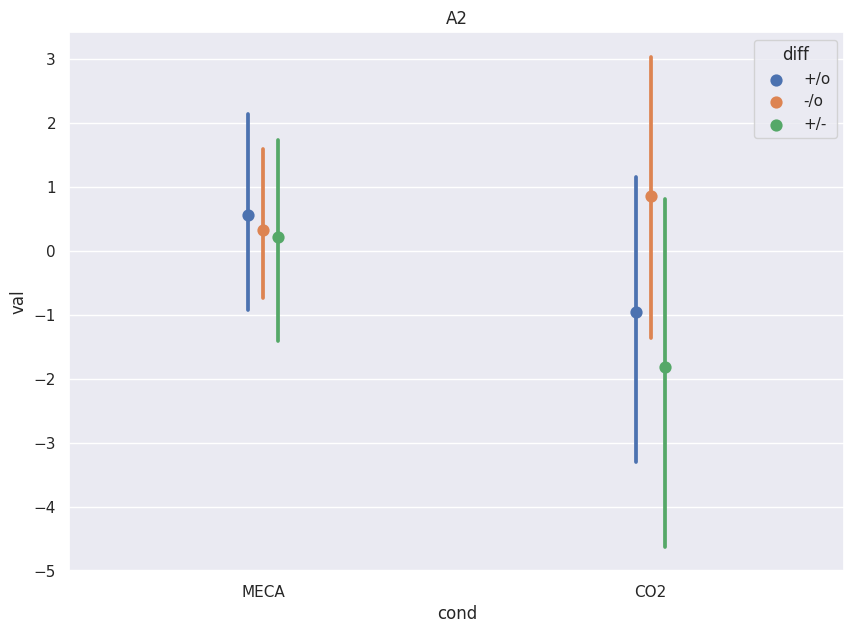

In [ ]:
df_plot = df_diff.query(f"question == 'A2' & cond in ['MECA', 'CO2']")
sns.pointplot(data=df_plot, x="cond", y="val", hue="diff", errorbar='sd', linestyles='none', dodge=True).set(title='A2')
sns.set(rc={'figure.figsize':(10,7)})


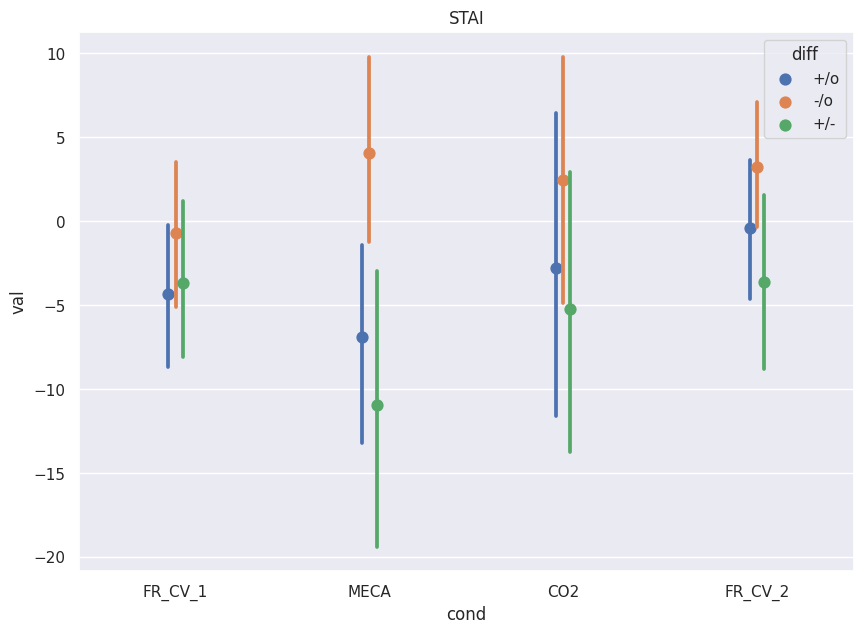

In [ ]:
df_plot = df_diff.query(f"question == 'STAI'")
sns.pointplot(data=df_plot, x="cond", y="val", hue="diff", errorbar='sd', linestyles='none', dodge=True).set(title='STAI')
sns.set(rc={'figure.figsize':(10,7)})

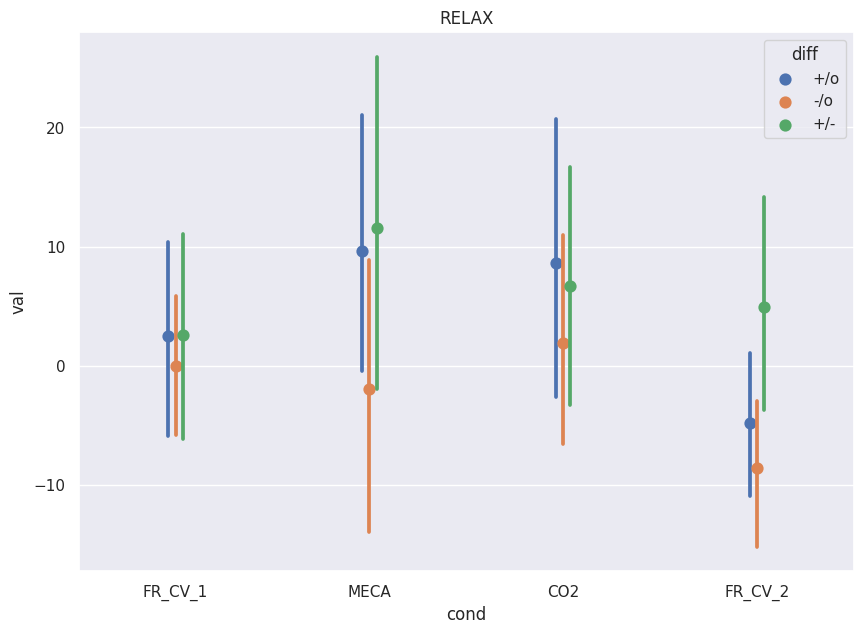

In [ ]:
df_plot = df_diff.query(f"question == 'RELAX'")
sns.pointplot(data=df_plot, x="cond", y="val", hue="diff", errorbar='sd', linestyles='none', dodge=True).set(title='RELAX')
sns.set(rc={'figure.figsize':(10,7)})

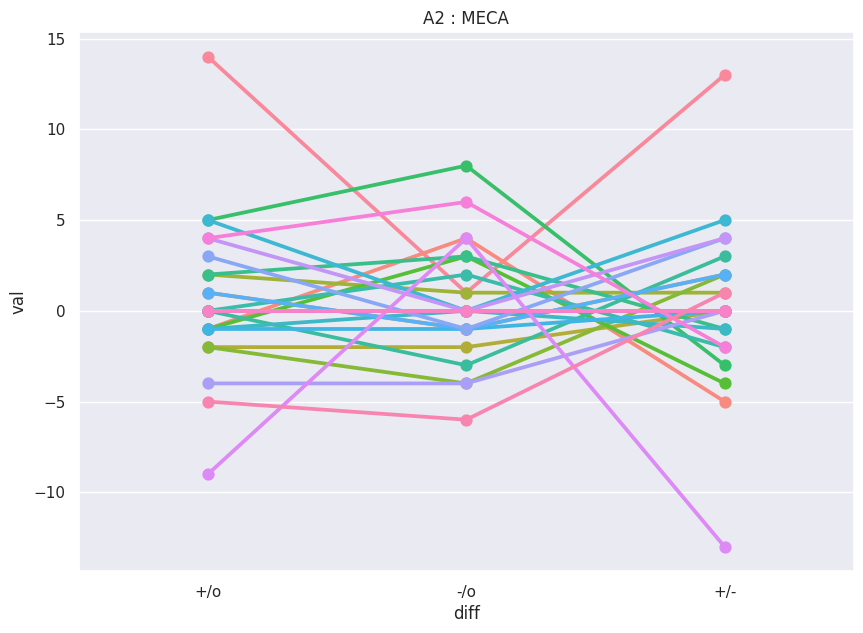

In [ ]:
cond = 'MECA'
df_plot = df_diff.query(f"question == 'A2' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'A2 : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

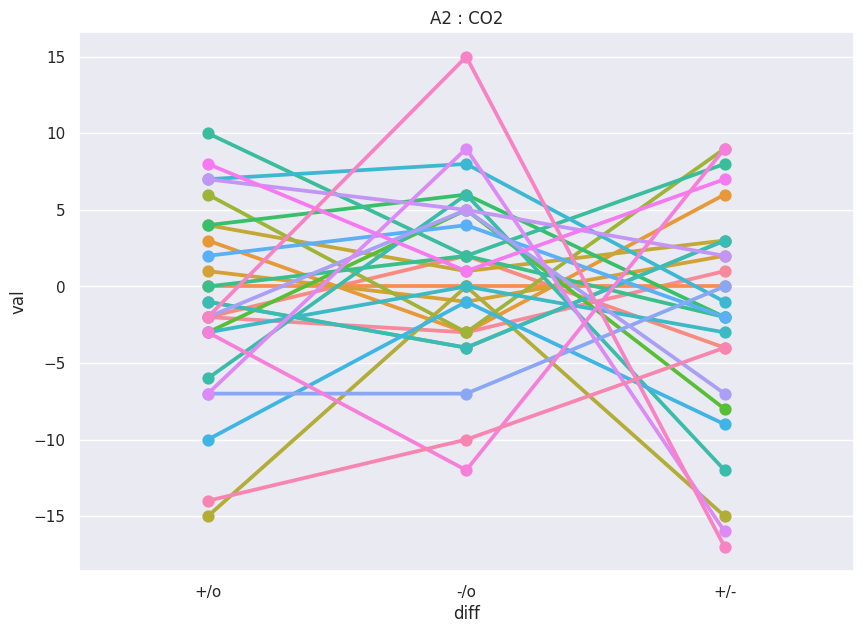

In [ ]:
cond = 'CO2'
df_plot = df_diff.query(f"question == 'A2' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'A2 : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

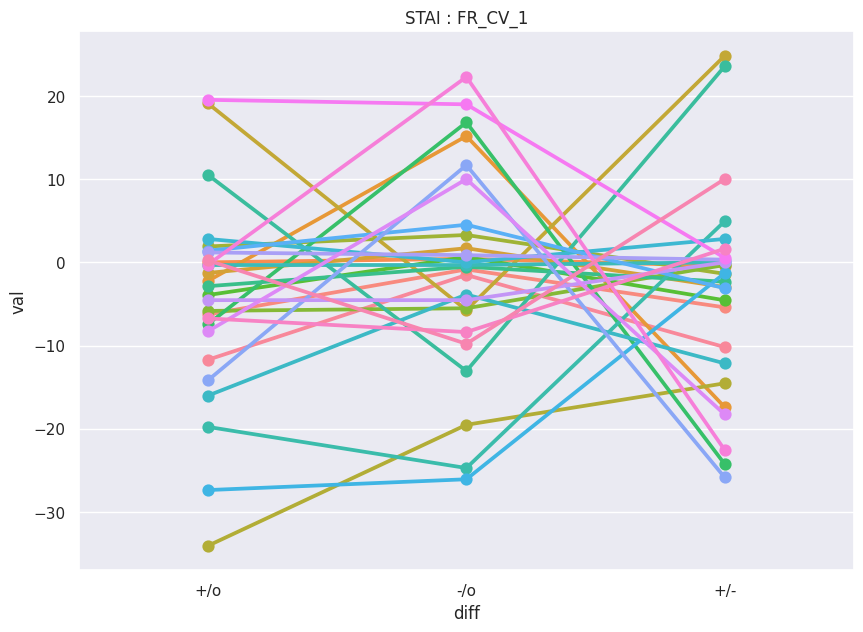

In [ ]:
cond = 'FR_CV_1'
df_plot = df_diff.query(f"question == 'STAI' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'STAI : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

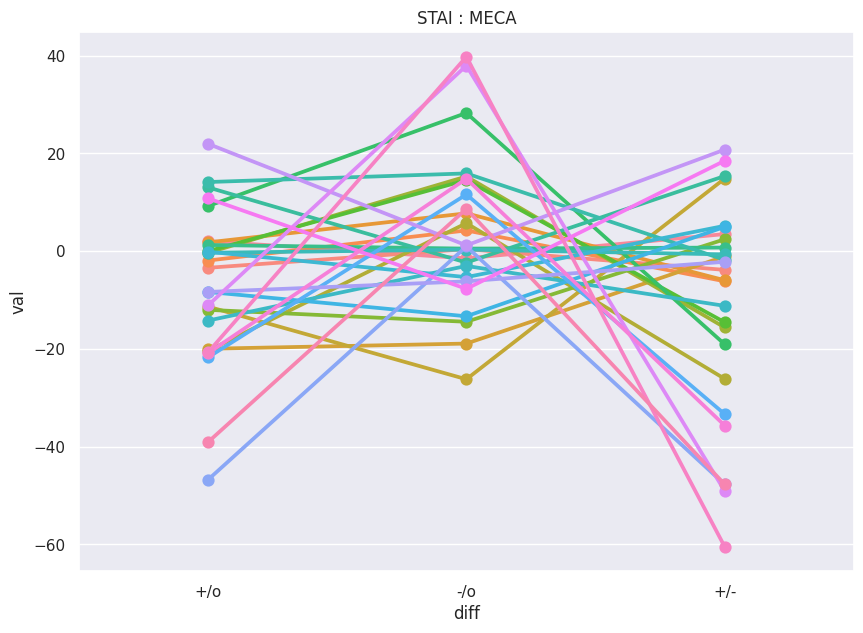

In [ ]:
cond = 'MECA'
df_plot = df_diff.query(f"question == 'STAI' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'STAI : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

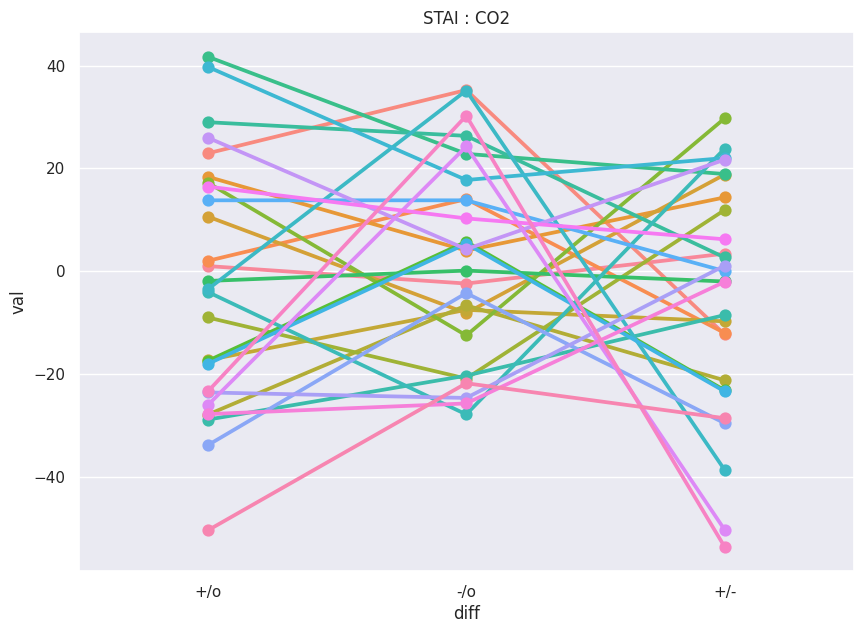

In [ ]:
cond = 'CO2'
df_plot = df_diff.query(f"question == 'STAI' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'STAI : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

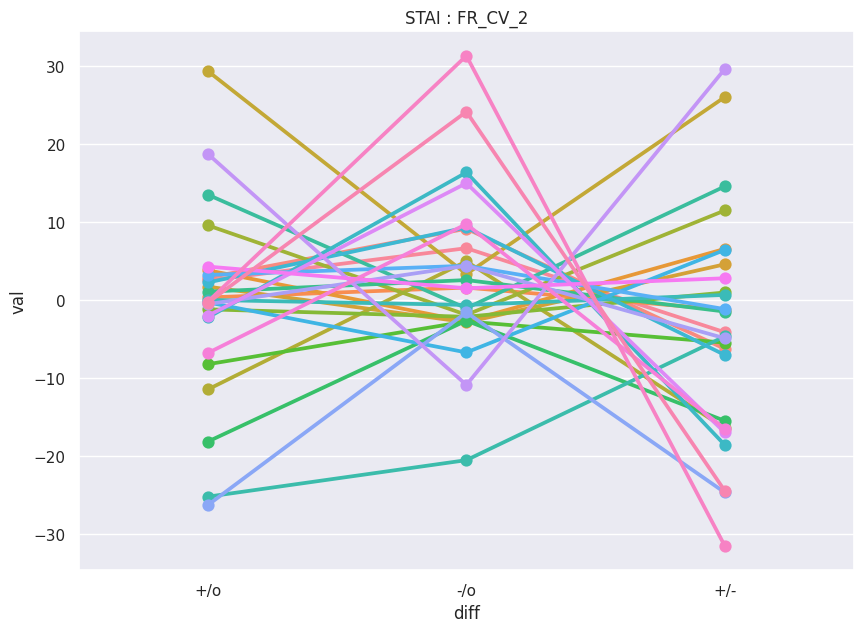

In [ ]:
cond = 'FR_CV_2'
df_plot = df_diff.query(f"question == 'STAI' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'STAI : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

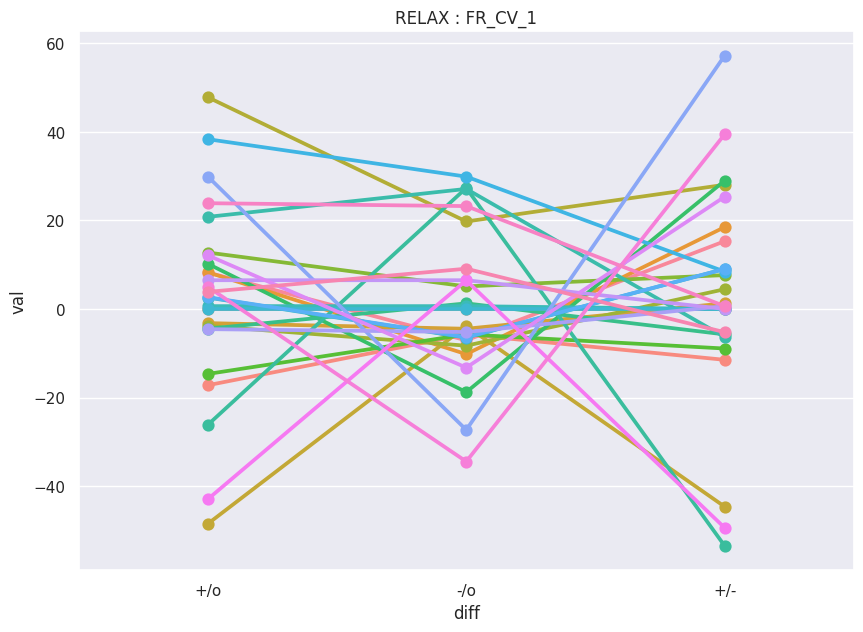

In [ ]:
cond = 'FR_CV_1'
df_plot = df_diff.query(f"question == 'RELAX' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'RELAX : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

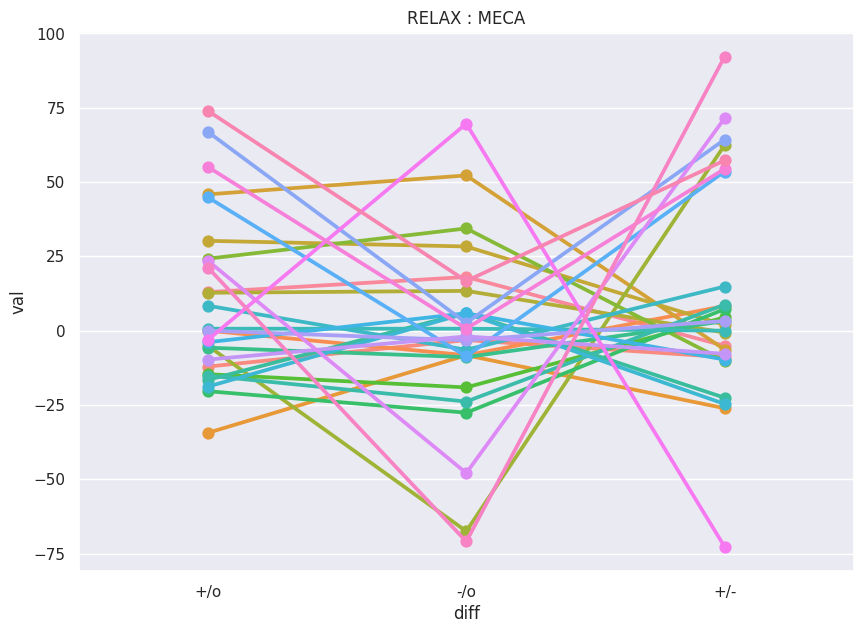

In [ ]:
cond = 'MECA'
df_plot = df_diff.query(f"question == 'RELAX' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'RELAX : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

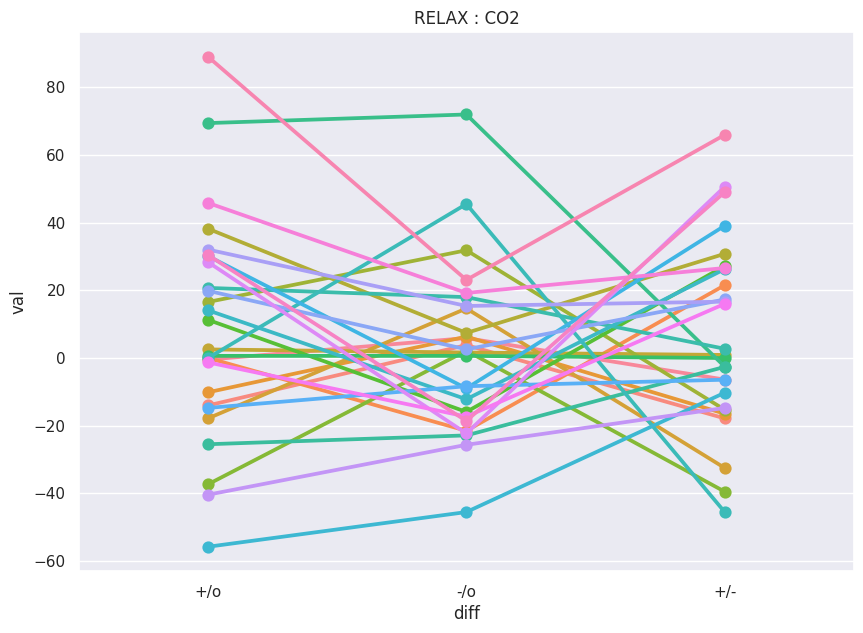

In [ ]:
cond = 'CO2'
df_plot = df_diff.query(f"question == 'RELAX' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'RELAX : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

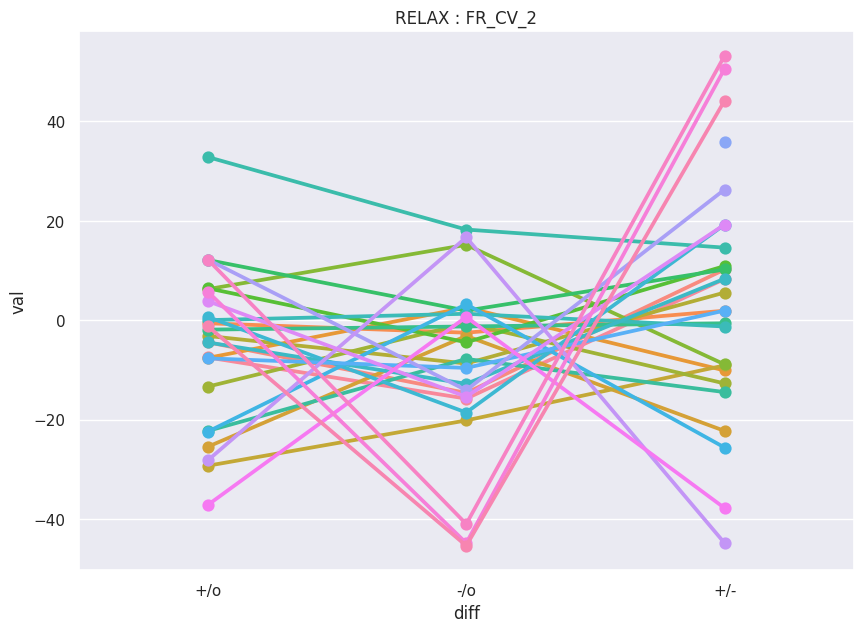

In [ ]:
cond = 'FR_CV_2'
df_plot = df_diff.query(f"question == 'RELAX' & cond == '{cond}'")
sns.pointplot(data=df_plot, x="diff", y="val", hue="sujet")
plt.legend([],[], frameon=False)
plt.title(f'RELAX : {cond}')
sns.set(rc={'figure.figsize':(10,7)})

# CO2 RESISTANCE

In [ ]:
os.chdir(os.path.join(path_data, 'respi_detection'))

In [ ]:
# CO2_data = {}

# for sujet in sujet_list:

#     if sujet in ['PB07']:
#         continue

#     CO2_data[sujet] = {}

#     for odor in odor_list_load:

#         CO2_data[sujet][odor_code[odor]] = {}

#         sujet_rev = f"{sujet[2:]}{sujet[:2]}"

#         file_load = f'ANA_{sujet[2:]}_{sujet}_{odor}.xlsx'
#         df_raw = pd.read_excel(file_load, sheet_name='Variables cycle T2')
        
#         time_vec = np.array([i for i in df_raw['Temps de début de cycle'].dropna().values[1:] if (type(i) == float) and (i > 0)]).astype(float)
        
#         mask = []
#         for val in df_raw['Temps de début de cycle'].values:
#             if val in time_vec:
#                 mask.append(True)
#             else:
#                 mask.append(False)
#         mask = np.array(mask)

#         CO2_vec = df_raw['PetCO2'][mask]
#         VAS_A = df_raw['VAS A'][mask]
#         VAS_S = df_raw['VAS S'][mask]

#         CO2_vec_sel = []
#         for val in CO2_vec:
#             if type(val) == float:
#                 CO2_vec_sel.append(True)
#             else:
#                 CO2_vec_sel.append(False)
#         CO2_vec_sel = np.array(CO2_vec_sel)

#         VAS_A_sel = []
#         for val in VAS_A:
#             if type(val) == float:
#                 VAS_A_sel.append(True)
#             else:
#                 VAS_A_sel.append(False)
#         VAS_A_sel = np.array(VAS_A_sel)

#         VAS_S_sel = []
#         for val in VAS_S:
#             if type(val) == float:
#                 VAS_S_sel.append(True)
#             else:
#                 VAS_S_sel.append(False)
#         VAS_S_sel = np.array(VAS_S_sel)

#         mask_global = np.logical_and(CO2_vec_sel, VAS_A_sel, VAS_S_sel)

#         CO2_vec = CO2_vec[mask_global].values.astype(float)
#         time_vec = time_vec[mask_global].astype(float)
#         VAS_A = VAS_A[mask_global].values.astype(float)
#         VAS_S = VAS_S[mask_global].values.astype(float)
        
#         CO2_data[sujet][odor_code[odor]]['time'] = time_vec
#         CO2_data[sujet][odor_code[odor]]['CO2'] = CO2_vec
#         CO2_data[sujet][odor_code[odor]]['VAS_A'] = VAS_A
#         CO2_data[sujet][odor_code[odor]]['VAS_S'] = VAS_S

In [ ]:
os.chdir(os.path.join(path_data, 'respi_detection'))
df_CO2 = pd.read_excel('OLFADYS_alldata_mean.xlsx')[['sujet', 'cond', 'odor', 'PetCO2', 'VAS_A', 'VAS_S']]

select_best = []
for row_i in range(df_CO2.shape[0]):
    if df_CO2['odor'][row_i] == 'p':
        df_CO2['odor'][row_i] = '+'
    if df_CO2['odor'][row_i] == 'n':
        df_CO2['odor'][row_i] = '-'
    if df_CO2['sujet'][row_i] in sujet_best_list_rev:
        select_best.append('YES')
    else:
        select_best.append('NO')
    
df_CO2['select_best'] = select_best
df_CO2 = df_CO2.query(f"sujet in {sujet_list.tolist()}").reset_index(drop=True)

/tmp/ipykernel_15429/850317318.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['odor'][row_i] = '+'
/tmp/ipykernel_15429/850317318.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['odor'][row_i] = '-'


In [ ]:
for nan_i in np.where(df_CO2['PetCO2'].isnull().values)[0]:
    cond, odor = df_CO2['cond'][nan_i], df_CO2['odor'][nan_i]
    nan_replace = df_CO2.query(f"cond == '{cond}' and odor == '{odor}'")['PetCO2'].median()
    df_CO2['PetCO2'][nan_i] = nan_replace 

/tmp/ipykernel_15429/2055424267.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['PetCO2'][nan_i] = nan_replace
/tmp/ipykernel_15429/2055424267.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['PetCO2'][nan_i] = nan_replace
/tmp/ipykernel_15429/2055424267.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_CO2['PetCO2'][nan_i] = nan_replace
/tmp/ipykernel_15429/2055424267.py:4: SettingWithCopyWarning: 
A value is

## ALLSUJET

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


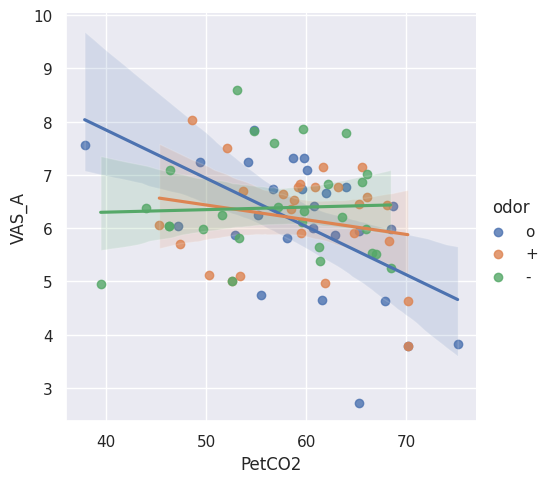

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


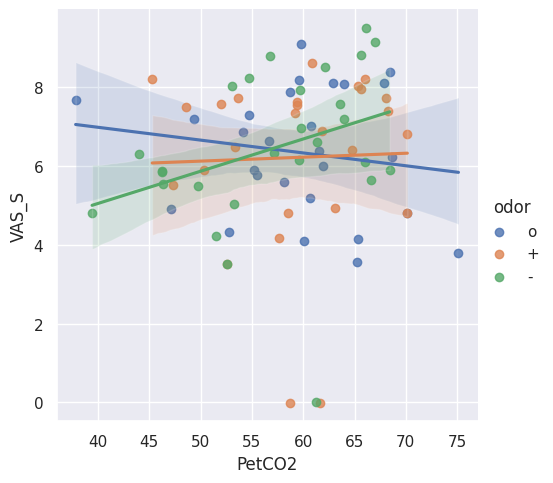

In [ ]:
df_plot = df_CO2
sns.lmplot(data=df_plot, x="PetCO2", y="VAS_A", hue="odor", height=5)
plt.show()
sns.lmplot(data=df_plot, x="PetCO2", y="VAS_S", hue="odor", height=5)
plt.show()

In [ ]:
xr_data = np.zeros((len(sujet_list), len(odor_list), 3))

for sujet_i, sujet in enumerate(sujet_list):

    for odor_i, odor in enumerate(odor_list):

        xr_data[sujet_i, odor_i, 0] = df_CO2.query(f"cond == 'CO2' and sujet == '{sujet}' and odor == '{odor}'")['PetCO2'].median()
        xr_data[sujet_i, odor_i, 1] = df_CO2.query(f"cond == 'CO2' and sujet == '{sujet}' and odor == '{odor}'")['VAS_A'].median()
        xr_data[sujet_i, odor_i, 2] = df_CO2.query(f"cond == 'CO2' and sujet == '{sujet}' and odor == '{odor}'")['VAS_S'].median()

xr_dict = {'sujet' : sujet_list, 'odor' : odor_list, 'metric' : ['CO2', 'VAS_A', 'VAS_S']}

xr_CO2 = xr.DataArray(xr_data, dims=xr_dict.keys(), coords=xr_dict.values())
df_CO2_allsujet = xr_CO2.to_dataframe('value').reset_index(drop=False)


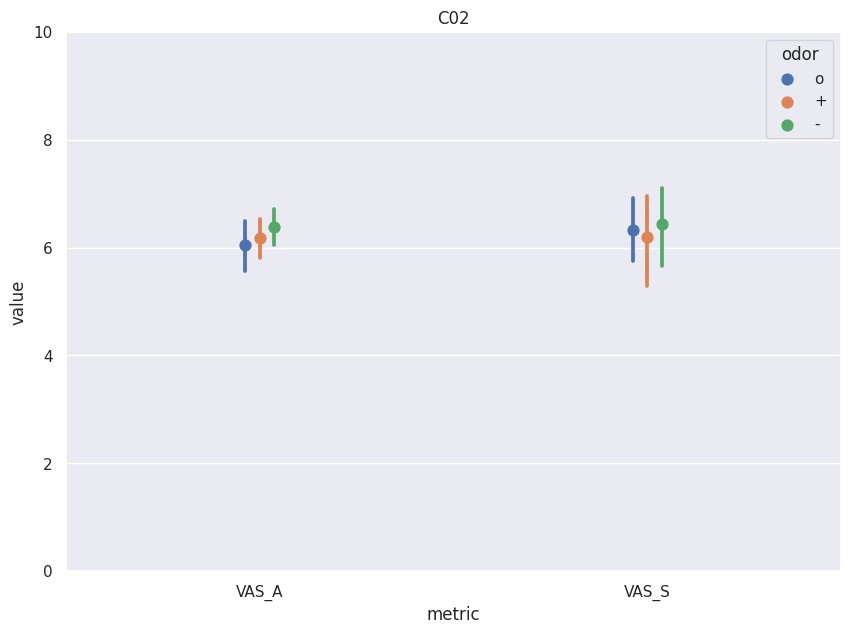

In [ ]:
df_plot = df_CO2_allsujet.query(f"metric in {['VAS_A', 'VAS_S']}")
sns.pointplot(data=df_plot, x="metric", y="value", hue="odor", errorbar='sd', linestyles='none', dodge=True).set(title='C02')
sns.set(rc={'figure.figsize':(10,7)})
plt.ylim(0,10)
plt.show()

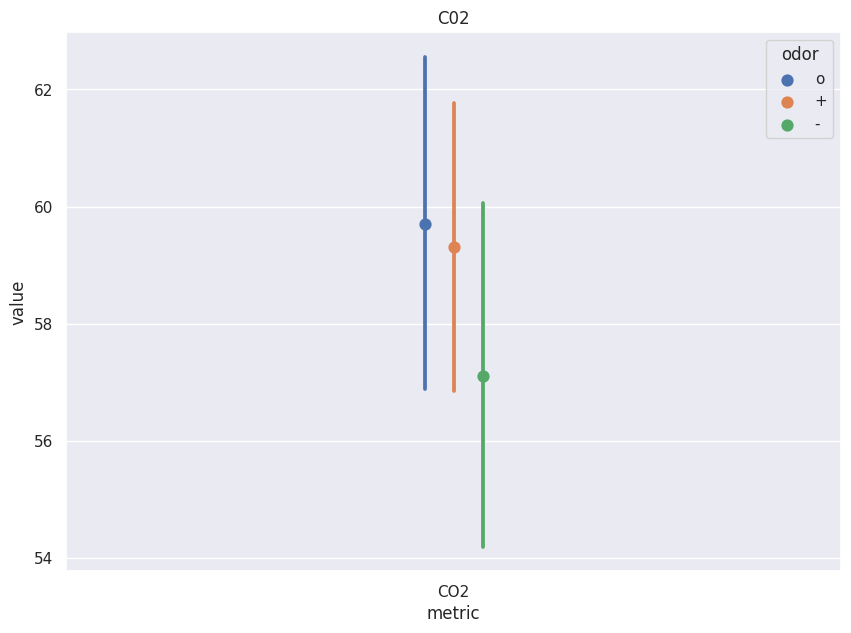

In [ ]:
df_plot = df_CO2_allsujet.query(f"metric in {['CO2']}")
sns.pointplot(data=df_plot, x="metric", y="value", hue="odor", errorbar='sd', linestyles='none', dodge=True).set(title='C02')
sns.set(rc={'figure.figsize':(10,7)})
plt.show()

## INTERSESSION

In [ ]:
sujet_list

array(['01PD', '03VN', '05LV', '06EF', '07PB', '08DM', '09TA', '10BH',
       '11FA', '12BD', '13FP', '14MD', '15LG', '16GM', '17JR', '19TM',
       '20TY', '21ZV', '23LF', '24TJ', '26MN', '28NT', '29SC', '30AR',
       '31HJ', '32CM', '33MA'], dtype='<U4')

In [ ]:
sujet_rev

'MA33'

In [ ]:
df_A2['sujet'].unique()

array(['PD01', 'VN03', 'LV05', 'EF06', 'PB07', 'DM08', 'TA09', 'BH10',
       'FA11', 'BD12', 'FP13', 'MD14', 'LG15', 'GM16', 'JR17', 'TM19',
       'TY20', 'ZV21', 'LF23', 'TJ24', 'MN26', 'NT28', 'SC29', 'AR30',
       'HJ31', 'CM32', 'MA33'], dtype=object)

In [ ]:
data = {'sujet' : [], 'odor' : [], 'PetCO2' : [], 'VAS_A' : [], 'VAS_S' : [], 'A2' : [], 'STAI' : [], 'RELAX' : [], 'select_best' : []}

df_only_CO2 = df_CO2.query(f"cond == 'CO2'").reset_index(drop=True)
for nan_i in np.where(df_only_CO2['VAS_A'].isnull().values)[0]:
    cond, odor = df_only_CO2['cond'][nan_i], df_only_CO2['odor'][nan_i]
    nan_replace = df_only_CO2.query(f"cond == '{cond}' and odor == '{odor}'")['VAS_A'].median()
    df_only_CO2['VAS_A'][nan_i] = nan_replace

for nan_i in np.where(df_only_CO2['VAS_S'].isnull().values)[0]:
    cond, odor = df_only_CO2['cond'][nan_i], df_only_CO2['odor'][nan_i]
    nan_replace = df_only_CO2.query(f"cond == '{cond}' and odor == '{odor}'")['VAS_S'].median()
    df_only_CO2['VAS_S'][nan_i] = nan_replace

for sujet in sujet_list:
    
    for odor in ['+', '-']:

        sujet_rev = f"{sujet[2:]}{sujet[:2]}"

        data['sujet'].append(sujet)
        data['odor'].append(odor)
        data['select_best'].append(df_only_CO2.query(f"sujet == '{sujet}' and odor == 'o'")['select_best'].values[0])

        diff_petco2 = df_only_CO2.query(f"sujet == '{sujet}' and odor == '{odor}'")['PetCO2'].values[0] - df_only_CO2.query(f"sujet == '{sujet}' and odor == 'o'")['PetCO2'].values[0]
        diff_VAS_A = df_only_CO2.query(f"sujet == '{sujet}' and odor == '{odor}'")['VAS_A'].values[0] - df_only_CO2.query(f"sujet == '{sujet}' and odor == 'o'")['VAS_A'].values[0]
        diff_VAS_S = df_only_CO2.query(f"sujet == '{sujet}' and odor == '{odor}'")['VAS_S'].values[0] - df_only_CO2.query(f"sujet == '{sujet}' and odor == 'o'")['VAS_S'].values[0]

        diff_A2 = df_A2.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['value'].values[0] - df_A2.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'CO2'")['value'].values[0]
        diff_stai = df_stai.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['val'].values[0] - df_stai.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'CO2'")['val'].values[0]
        diff_relax = df_relax.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['val'].values[0] - df_relax.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'CO2'")['val'].values[0]
        
        data['PetCO2'].append(diff_petco2)
        data['VAS_A'].append(diff_VAS_A)
        data['VAS_S'].append(diff_VAS_S)
        data['A2'].append(diff_A2)
        data['STAI'].append(diff_stai)
        data['RELAX'].append(diff_relax)

df_CO2_diff = pd.DataFrame(data)
df_CO2_diff   


/tmp/ipykernel_15429/3212364283.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_only_CO2['VAS_A'][nan_i] = nan_replace
/tmp/ipykernel_15429/3212364283.py:12: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_only_CO2['VAS_S'][nan_i] = nan_replace


,sujet,odor,PetCO2,VAS_A,VAS_S,A2,STAI,RELAX,select_best
0,01PD,+,0.987604,-2.116199,-1.297730,-2.0,0.981453,-0.468694,YES
1,01PD,-,5.400334,0.571792,1.026753,-3.0,-2.415575,5.900733,YES
2,03VN,+,10.651226,-1.342273,-0.469034,-2.0,22.929936,-14.012739,YES
3,03VN,-,-7.796824,-0.163153,-1.329320,2.0,35.244161,3.821656,YES
4,05LV,+,1.476495,-1.776842,0.587348,0.0,2.000188,0.016125,NO
5,05LV,-,-2.657535,-0.432742,-0.111536,0.0,14.025505,-21.502862,NO
6,06EF,+,6.463516,0.651694,2.817552,3.0,18.354430,-10.126582,NO
7,06EF,-,6.074200,-0.230291,0.138622,-3.0,4.008439,6.329114,NO
8,07PB,+,-3.563011,1.199112,-3.555789,1.0,10.615711,-17.834395,NO
9,07PB,-,-3.989302,-0.304911,-3.555465,-1.0,-8.174098,14.649682,NO


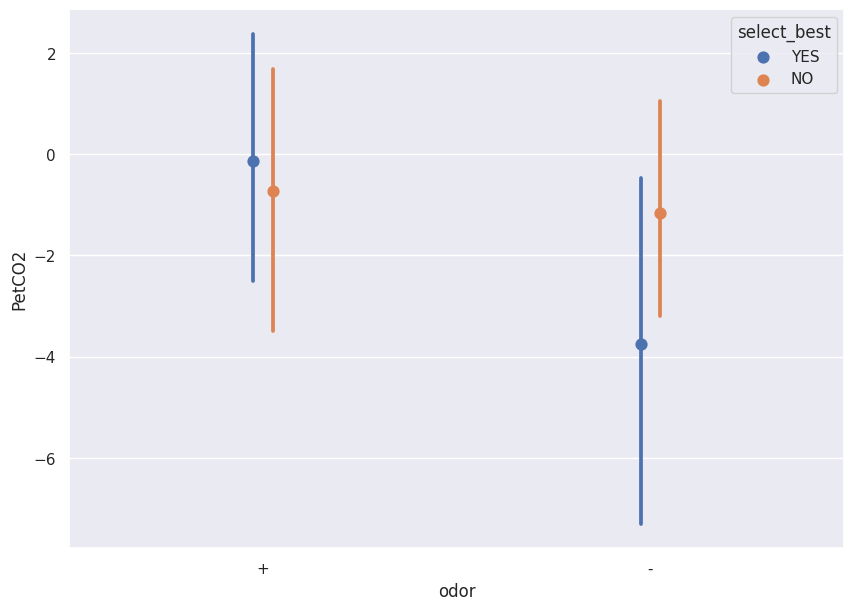

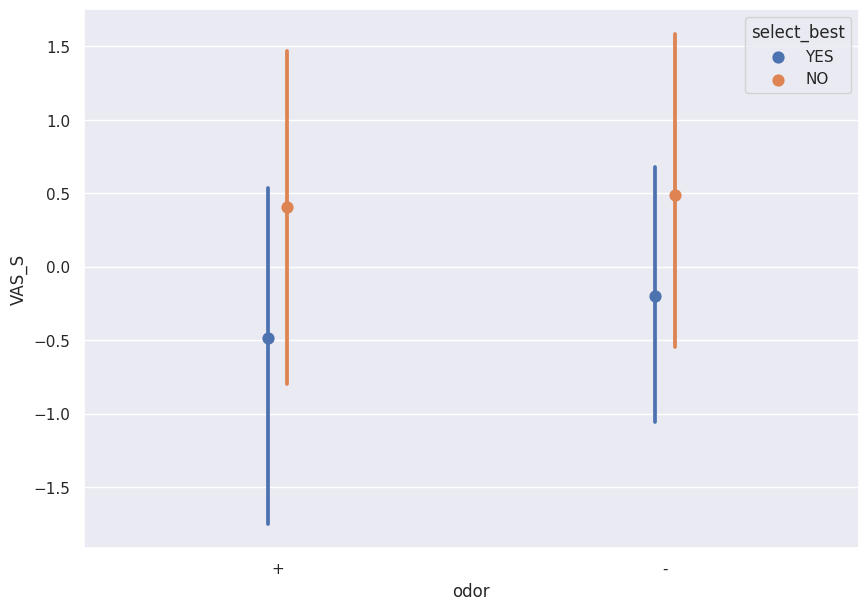

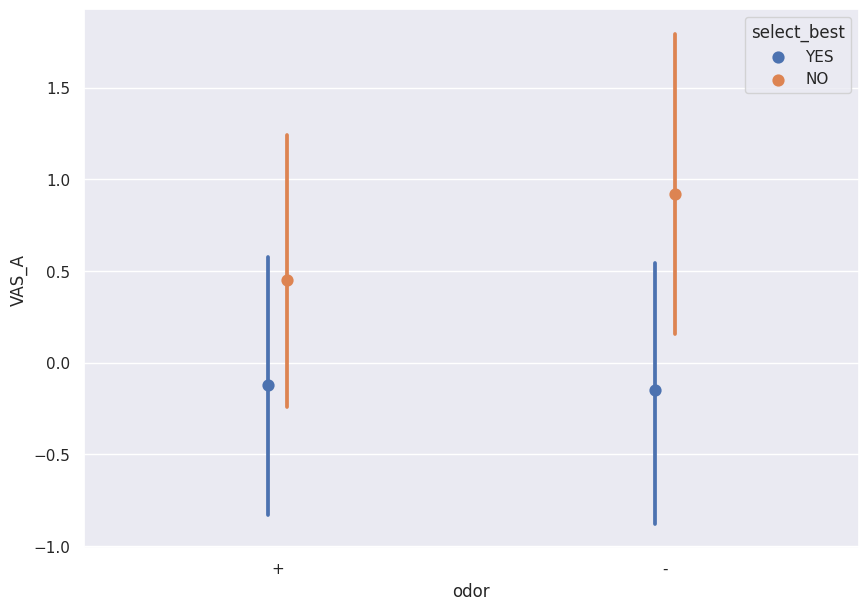

In [ ]:
df_plot = df_CO2_diff
sns.pointplot(data=df_plot, x="odor", y="PetCO2", hue="select_best", errorbar='sd', linestyles='none', dodge=True)
plt.show()
sns.pointplot(data=df_plot, x="odor", y="VAS_S", hue="select_best", errorbar='sd', linestyles='none', dodge=True)
plt.show()
sns.pointplot(data=df_plot, x="odor", y="VAS_A", hue="select_best", errorbar='sd', linestyles='none', dodge=True)
plt.show()

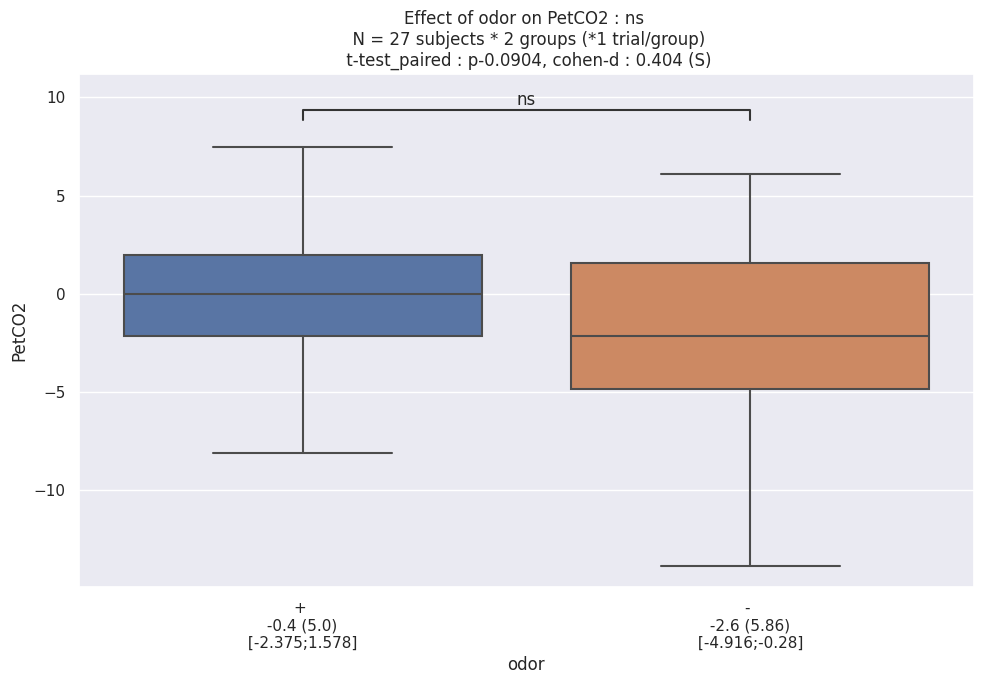

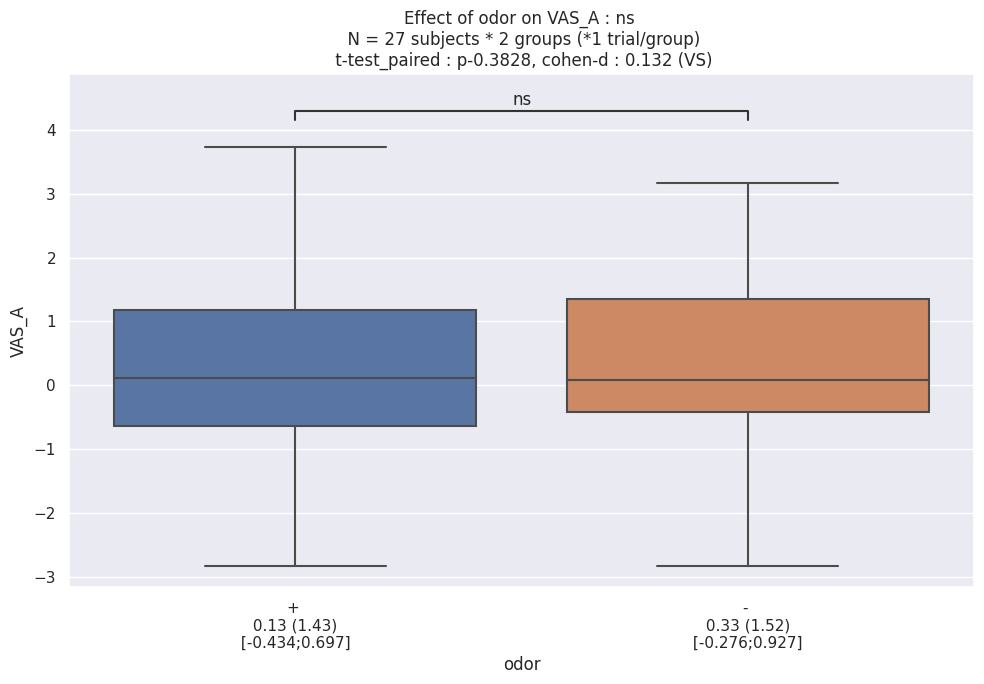

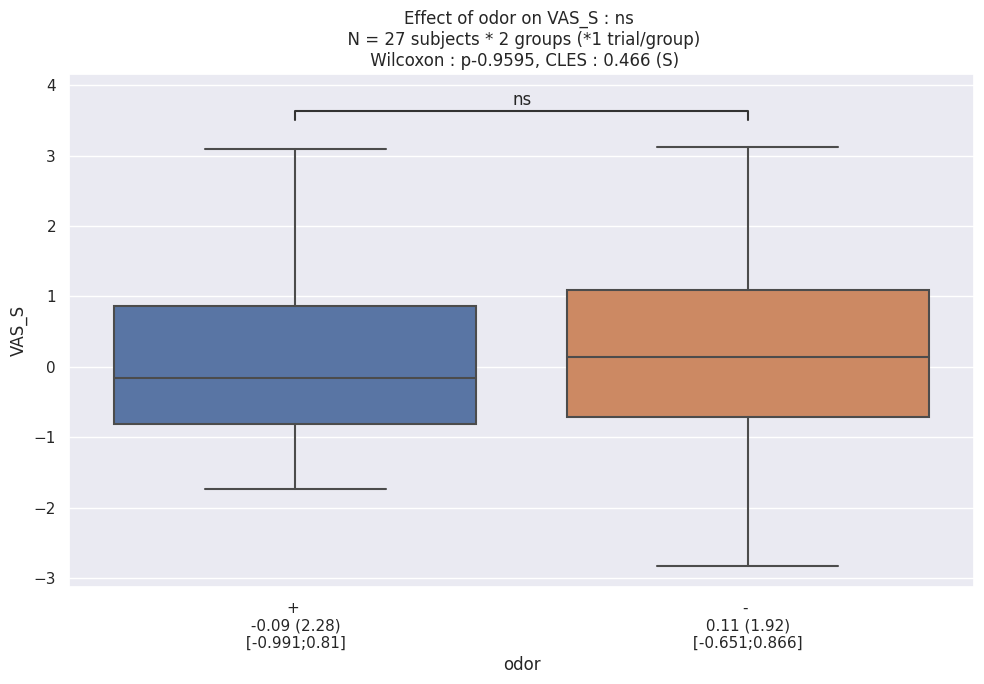

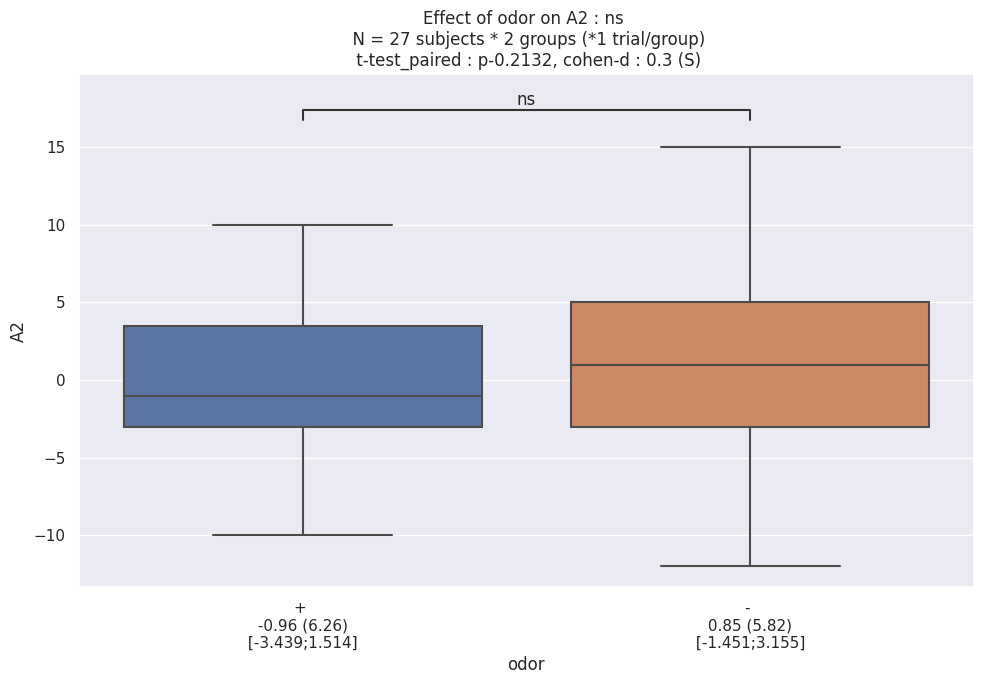

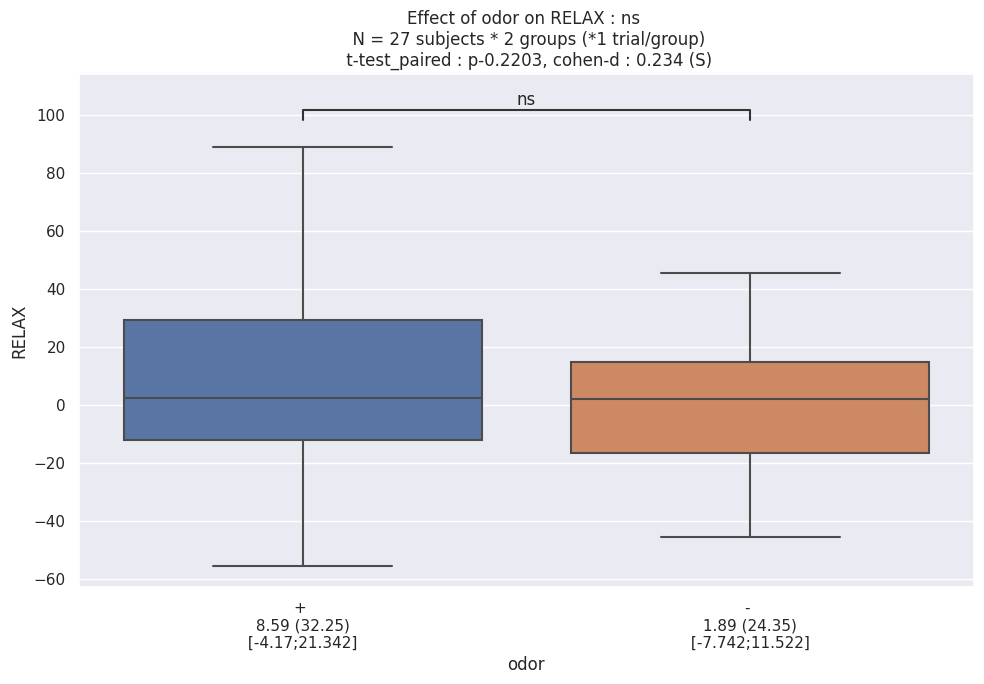

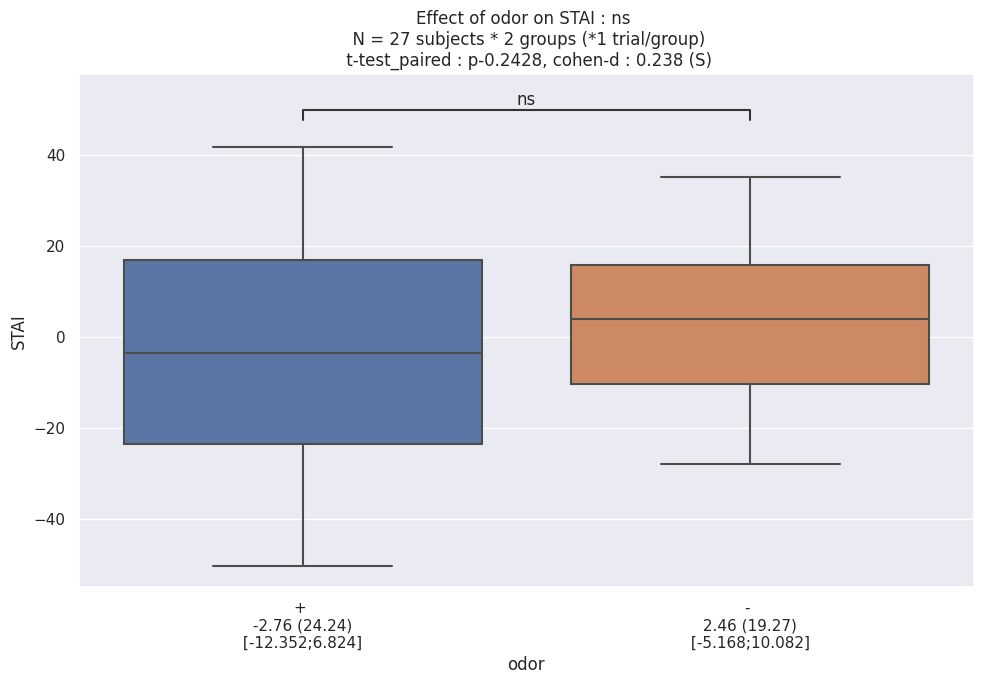

In [ ]:
df_stats = df_CO2_diff
predictor = 'odor'
for metric in ['PetCO2', 'VAS_A', 'VAS_S',  'A2', 'RELAX', 'STAI']:
    outcome = metric
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=False)
    plt.tight_layout()
    plt.show()

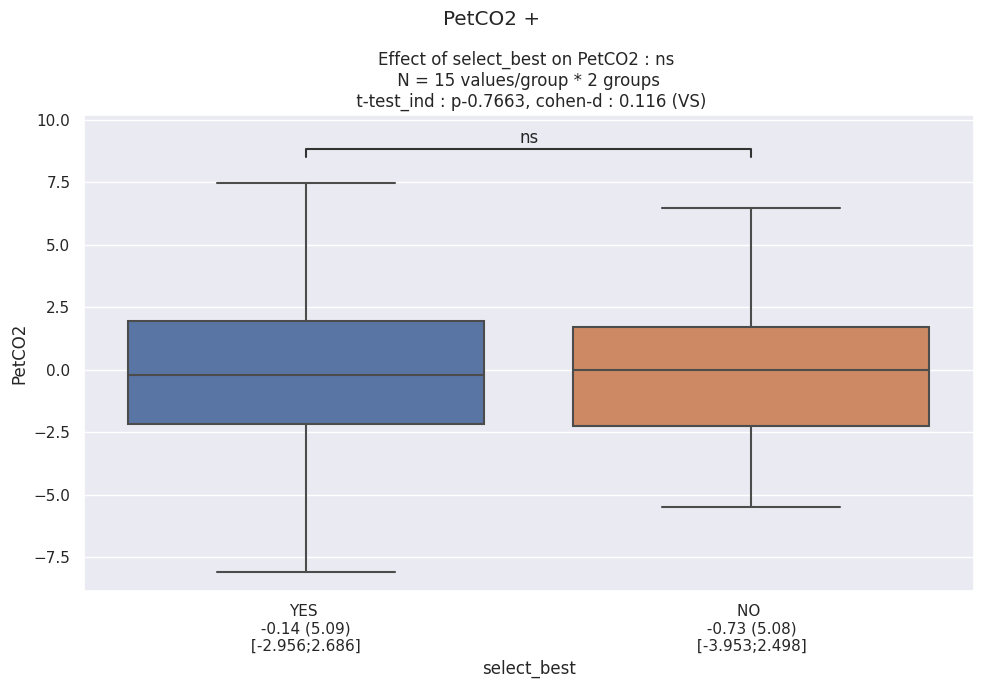

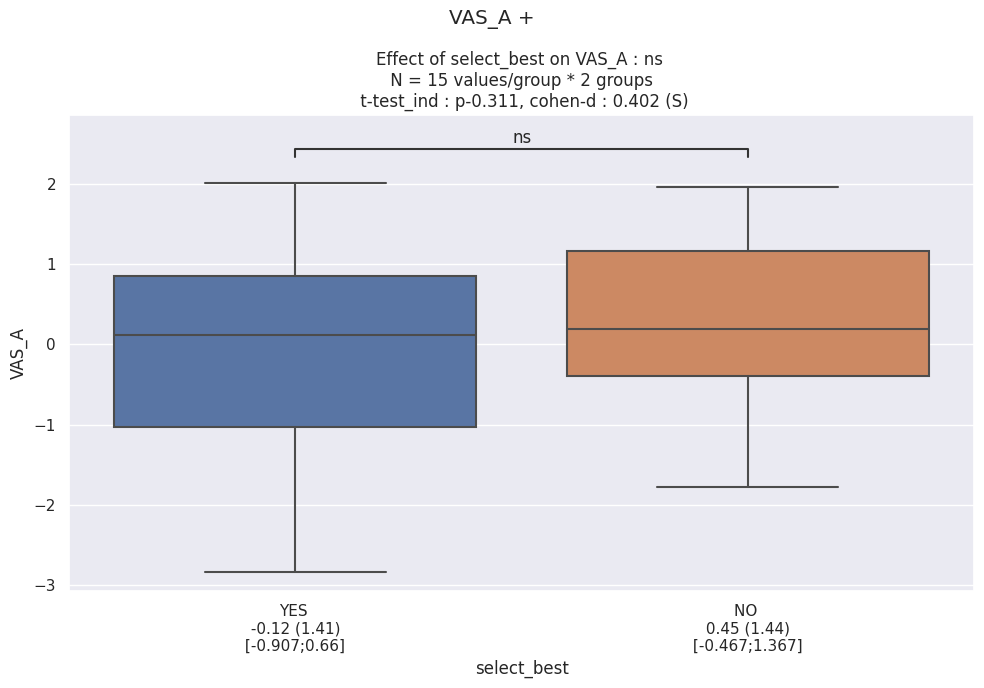

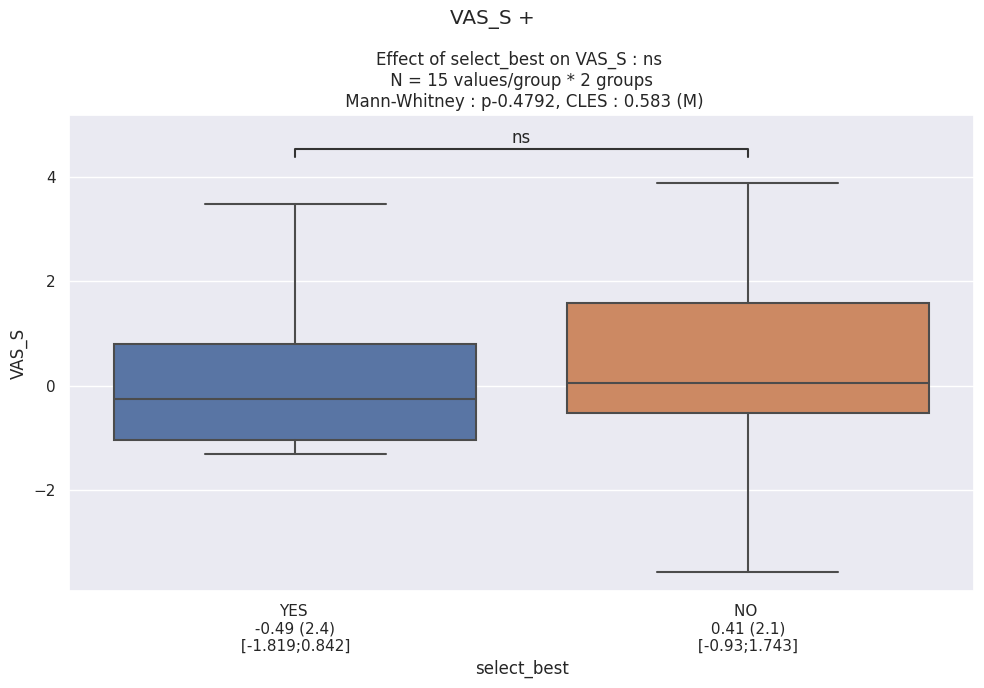

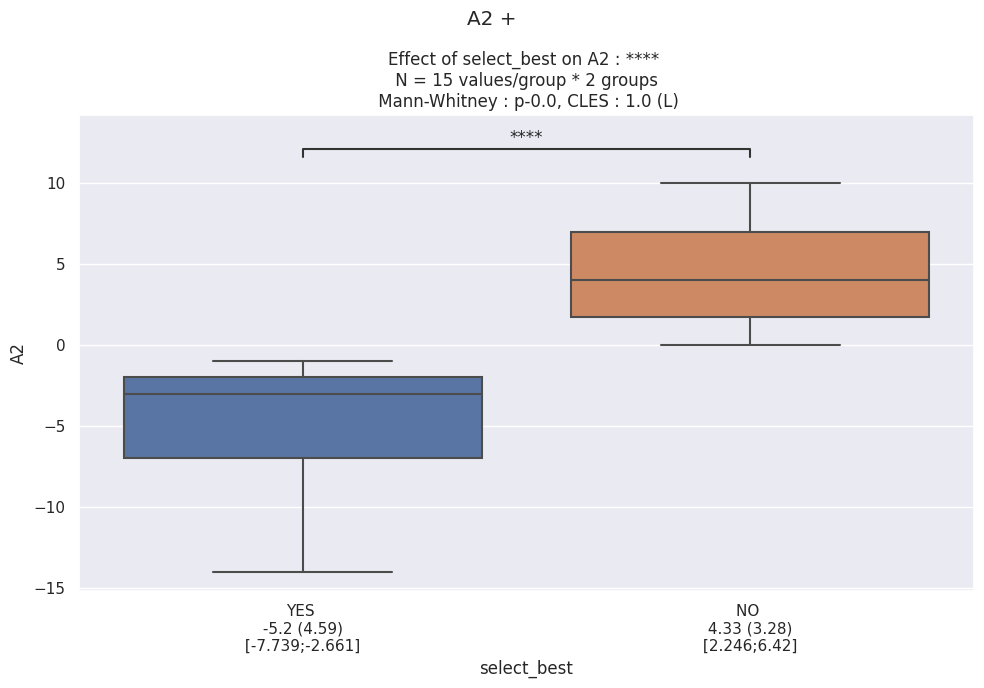

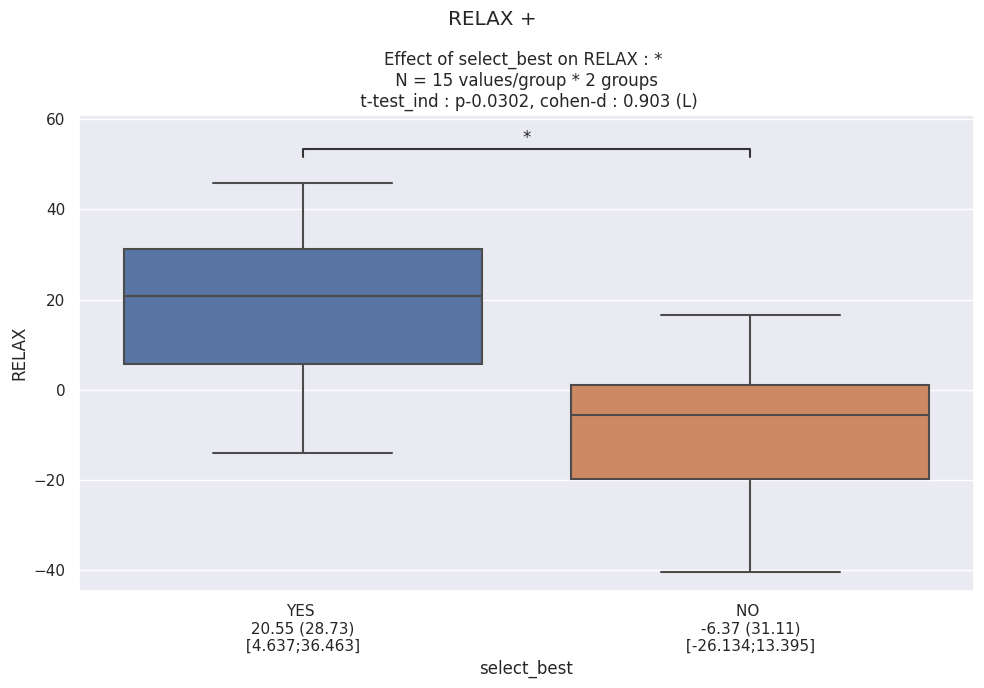

...

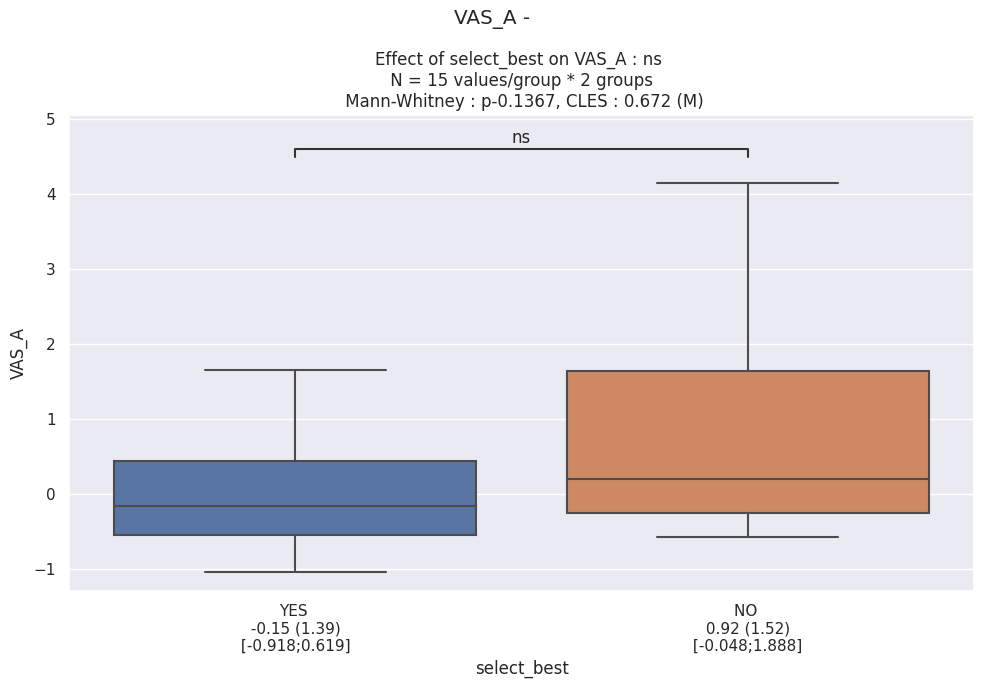

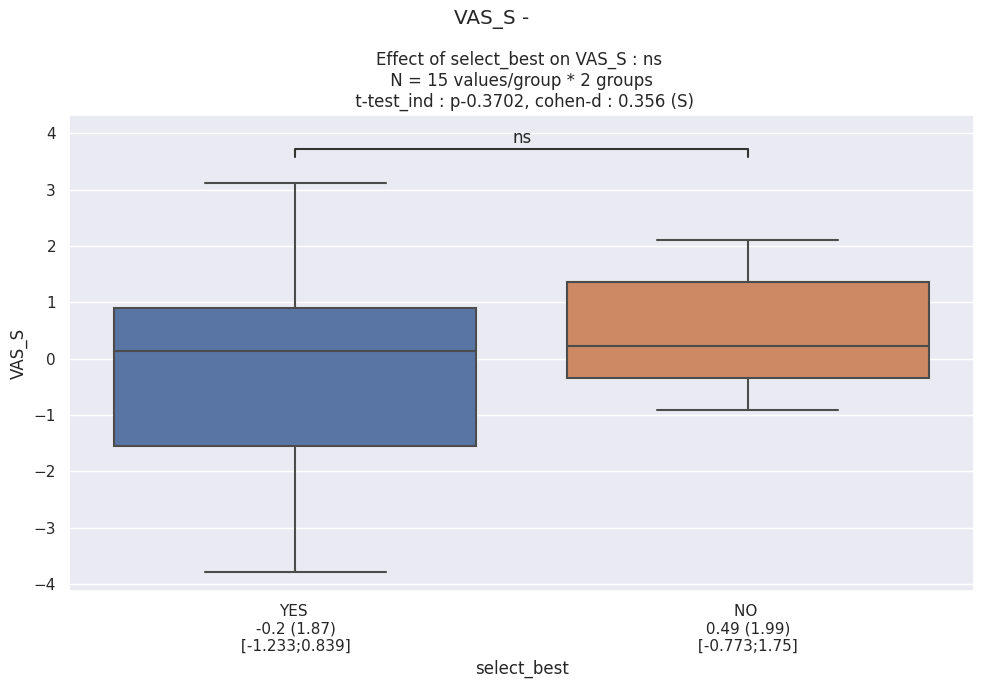

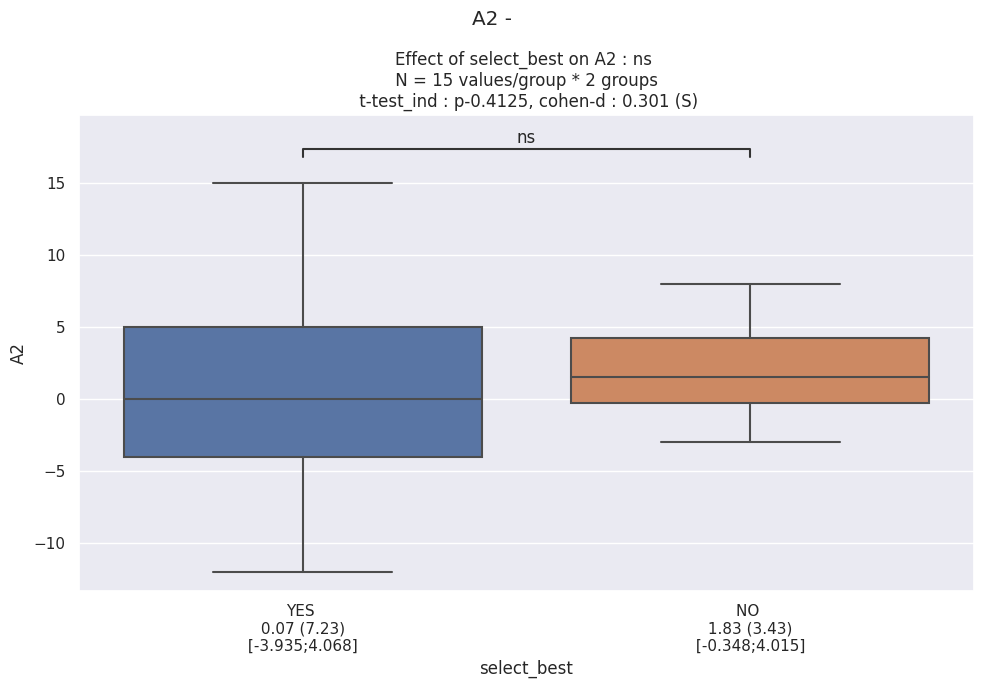

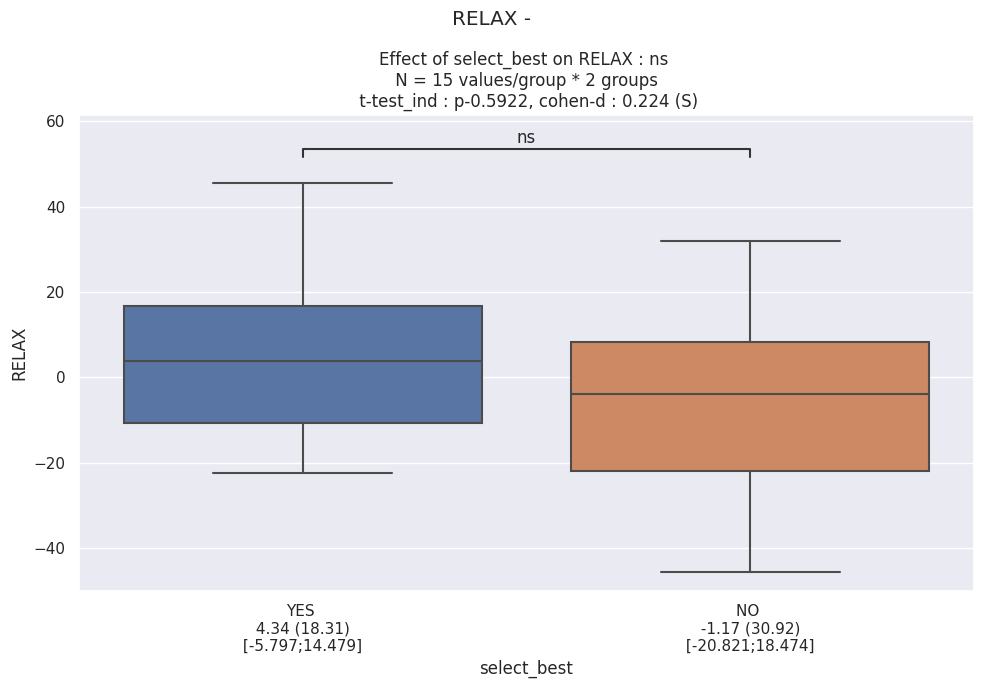

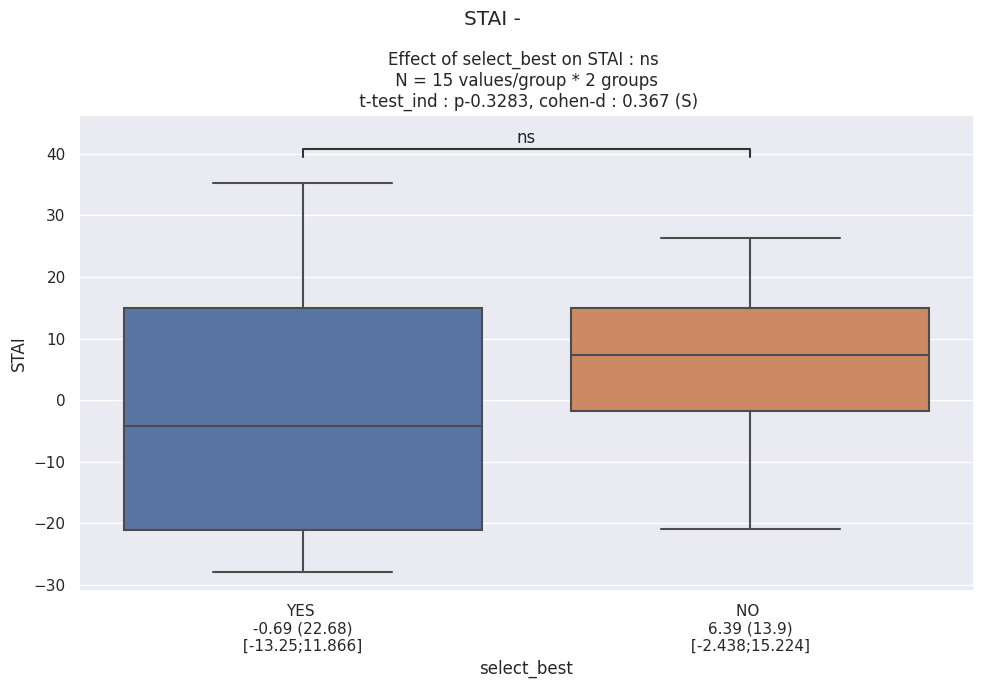

In [ ]:
predictor = 'odor'
for odor in ['+', '-']:
    for metric in ['PetCO2', 'VAS_A', 'VAS_S', 'A2', 'RELAX', 'STAI']:
        outcome = metric
        predictor = 'select_best'
        df_stats = df_CO2_diff.query(f"odor == '{odor}' and sujet in {sujet_list.tolist()}")
        fig, ax = plt.subplots()
        ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=False)
        plt.suptitle(f"{metric} {odor}")
        plt.tight_layout()
        plt.show()

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


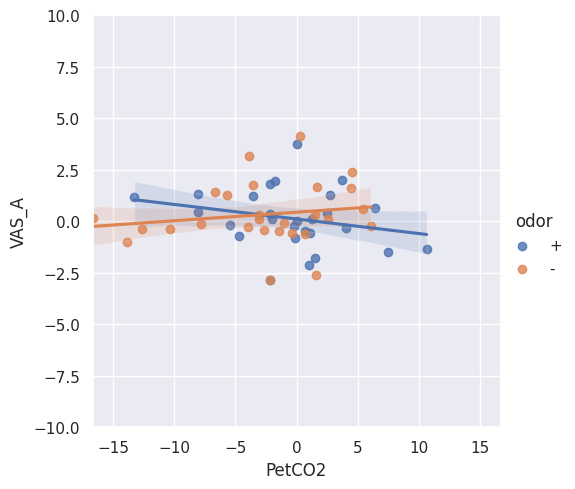

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


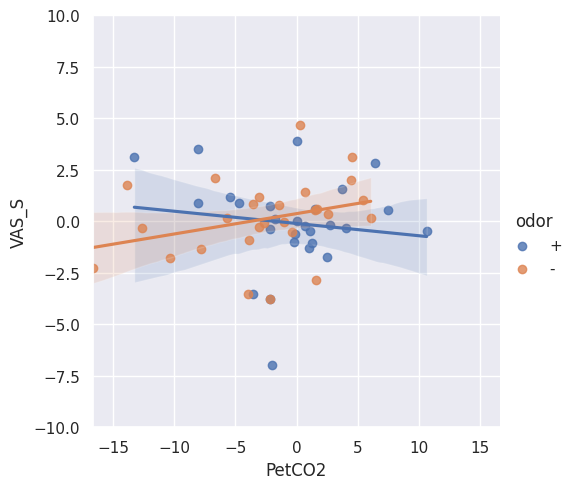

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


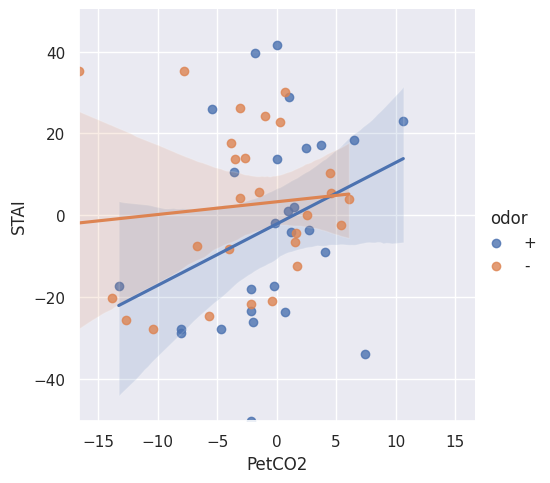

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


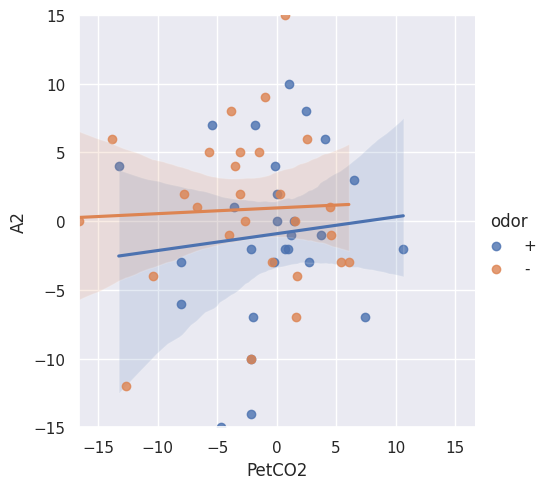

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


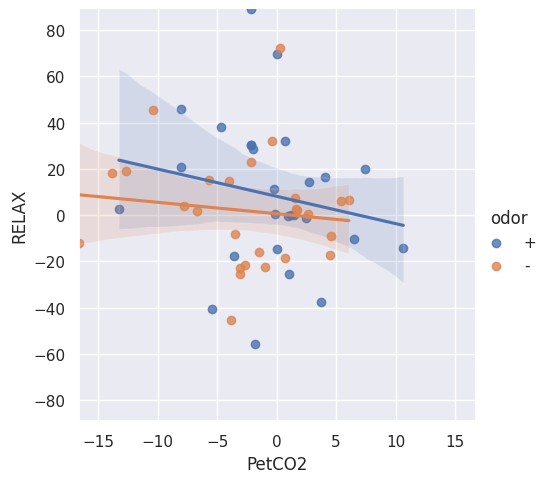

In [ ]:
scale = np.array([np.abs(df_CO2_diff['PetCO2'].values.min()), np.abs(df_CO2_diff['PetCO2'].values.max())]).max()

df_plot = df_CO2_diff
sns.lmplot(data=df_plot, x="PetCO2", y="VAS_A", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-10,10)
plt.show()

sns.lmplot(data=df_plot, x="PetCO2", y="VAS_S", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-10,10)
plt.show()

scale_y = np.array([np.abs(df_CO2_diff['STAI'].values.min()), np.abs(df_CO2_diff['STAI'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="STAI", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

scale_y = np.array([np.abs(df_CO2_diff['A2'].values.min()), np.abs(df_CO2_diff['A2'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="A2", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

scale_y = np.array([np.abs(df_CO2_diff['RELAX'].values.min()), np.abs(df_CO2_diff['RELAX'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="RELAX", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


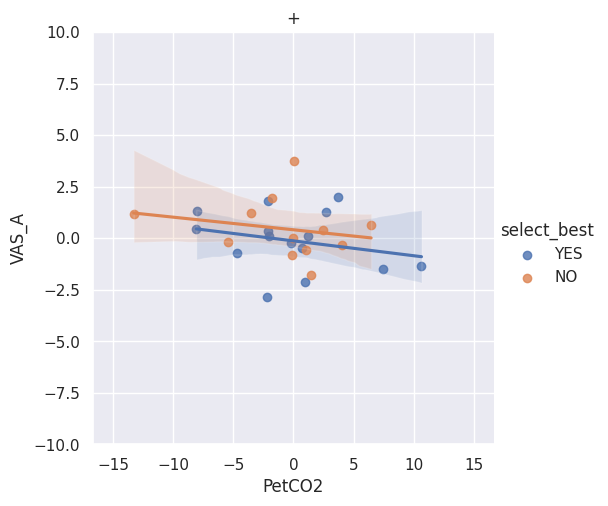

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


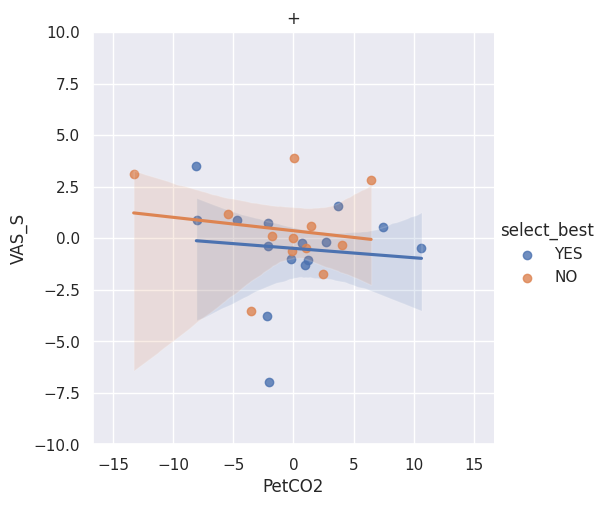

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


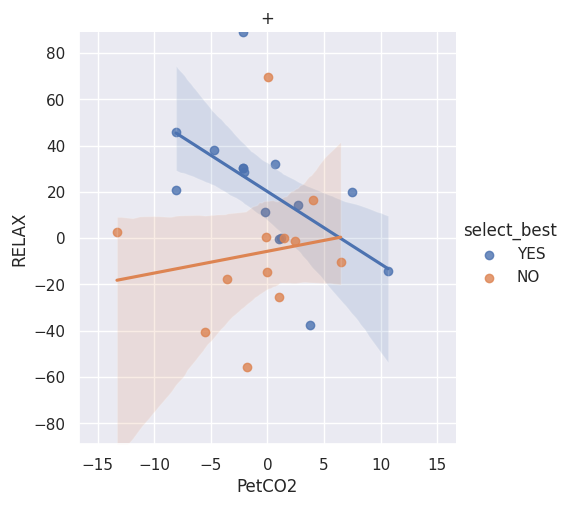

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


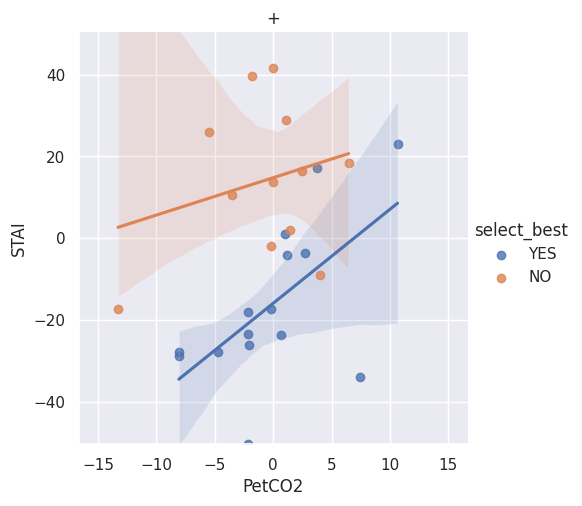

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


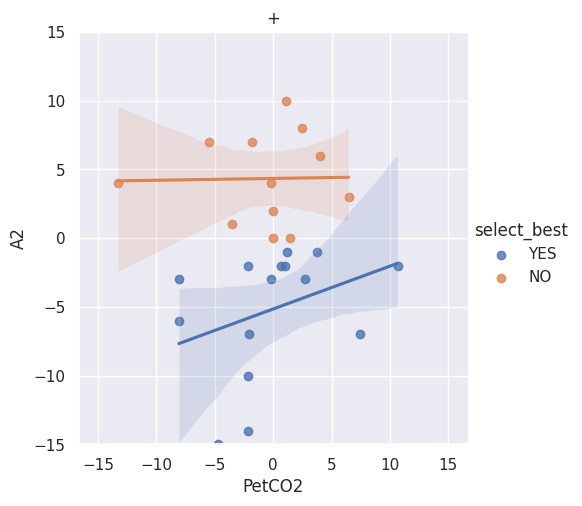

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


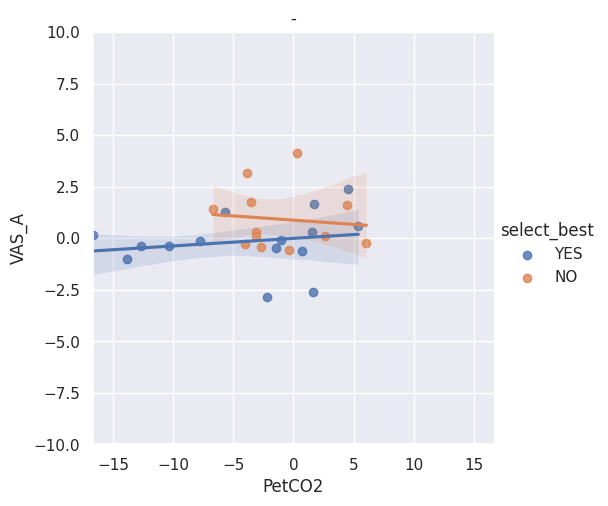

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


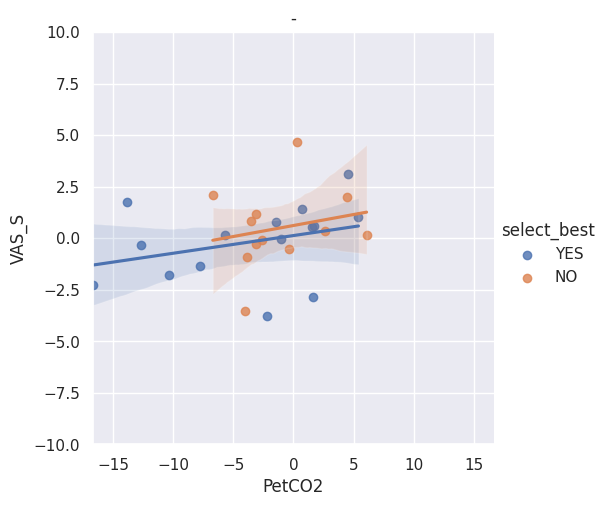

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


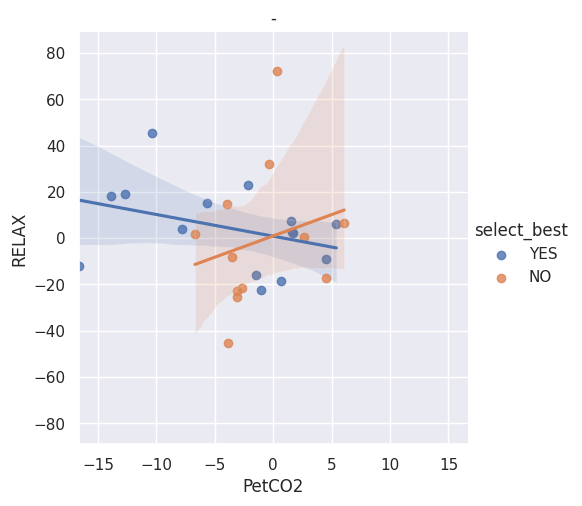

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


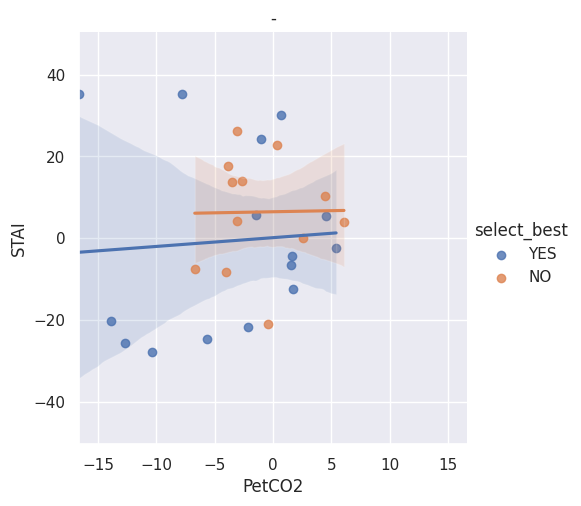

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


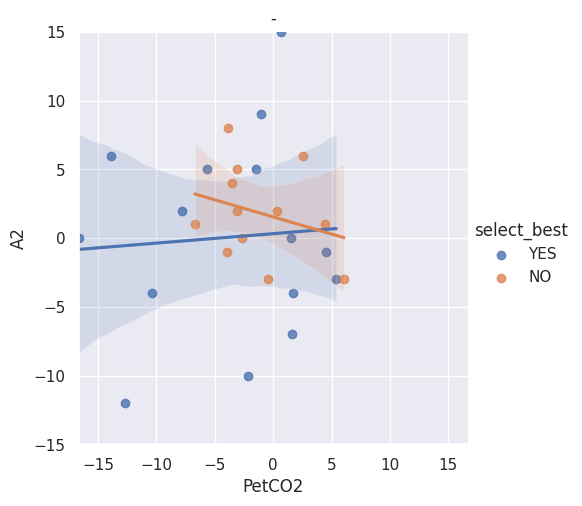

In [ ]:
scale = np.array([np.abs(df_CO2_diff['PetCO2'].values.min()), np.abs(df_CO2_diff['PetCO2'].values.max())]).max()

for odor in ['+', '-']:
    df_plot = df_CO2_diff.query(f"odor == '{odor}'")
    sns.lmplot(data=df_plot, x="PetCO2", y="VAS_A", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-10,10)
    plt.show()

    sns.lmplot(data=df_plot, x="PetCO2", y="VAS_S", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-10,10)
    plt.show()

    scale_y = np.array([np.abs(df_CO2_diff['RELAX'].values.min()), np.abs(df_CO2_diff['RELAX'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="RELAX", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

    scale_y = np.array([np.abs(df_CO2_diff['STAI'].values.min()), np.abs(df_CO2_diff['STAI'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="STAI", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

    scale_y = np.array([np.abs(df_CO2_diff['A2'].values.min()), np.abs(df_CO2_diff['A2'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="A2", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

## INTRASESSION

In [ ]:
df_A2.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['value'].values[0]

11.0

In [ ]:
data = {'sujet' : [], 'odor' : [], 'PetCO2' : [], 'STAI' : [], 'RELAX' : [], 'select_best' : []}

for sujet in sujet_list:
    
    for odor in odor_list:

        sujet_rev = f"{sujet[2:]}{sujet[:2]}"

        data['sujet'].append(sujet)
        data['odor'].append(odor)
        data['select_best'].append(df_CO2.query(f"sujet == '{sujet}' and odor == 'o' and cond == 'CO2'")['select_best'].values[0])

        diff_petco2 = df_CO2.query(f"sujet == '{sujet}' and odor == '{odor}' and cond == 'CO2'")['PetCO2'].values[0] - df_CO2.query(f"sujet == '{sujet}' and odor == 'o' and cond == 'FR_CV_1'")['PetCO2'].values[0]

        diff_stai = df_stai.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['val'].values[0] - df_stai.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'FR_CV_1'")['val'].values[0]
        diff_relax = df_relax.query(f"sujet == '{sujet_rev}' and session == '{odor}' and cond == 'CO2'")['val'].values[0] - df_relax.query(f"sujet == '{sujet_rev}' and session == 'o' and cond == 'FR_CV_1'")['val'].values[0]
        
        data['PetCO2'].append(diff_petco2)
        data['STAI'].append(diff_stai)
        data['RELAX'].append(diff_relax)

df_CO2_diff_intra = pd.DataFrame(data)
df_CO2_diff_intra   


,sujet,odor,PetCO2,STAI,RELAX,select_best
0,01PD,o,18.696194,21.278826,-32.075472,YES
1,01PD,+,19.683798,22.260279,-32.544165,YES
2,01PD,-,24.096529,18.863251,-26.174739,YES
3,03VN,o,13.022733,-10.297240,-14.649682,YES
4,03VN,+,23.673959,12.632696,-28.662420,YES
...,...,...,...,...,...,...
76,32CM,+,25.198347,23.118280,-26.451613,YES
77,32CM,-,28.029314,76.757651,-75.488007,YES
78,33MA,o,23.115365,66.991342,-90.909091,YES
79,33MA,+,20.955724,16.550063,-1.876833,YES


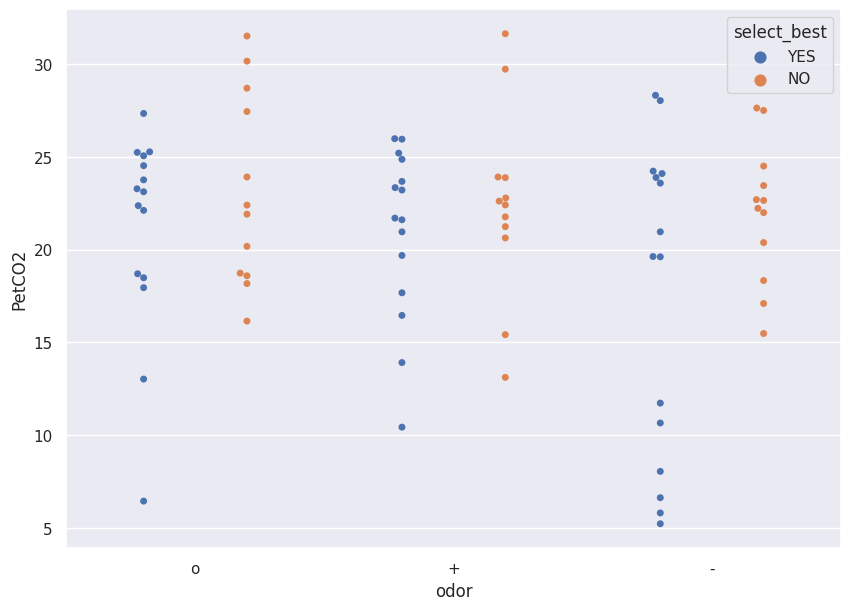

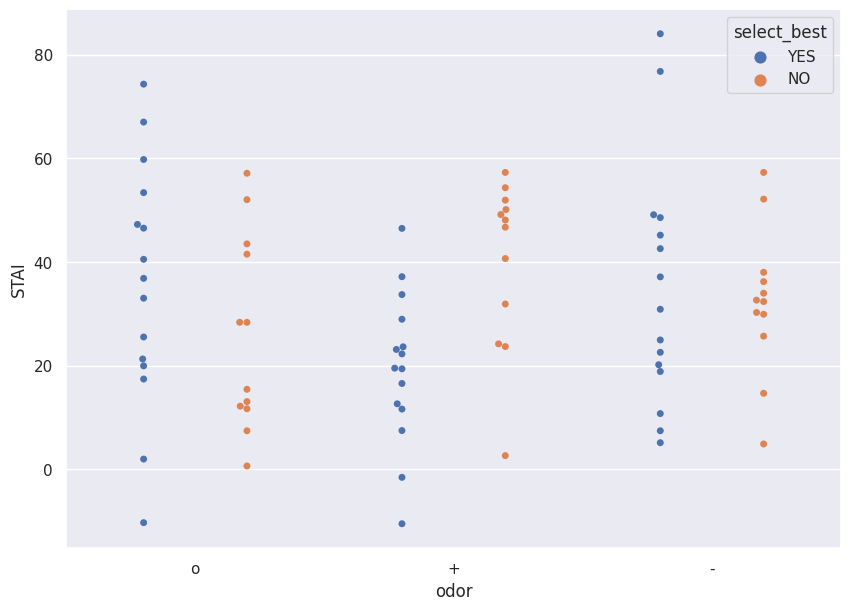

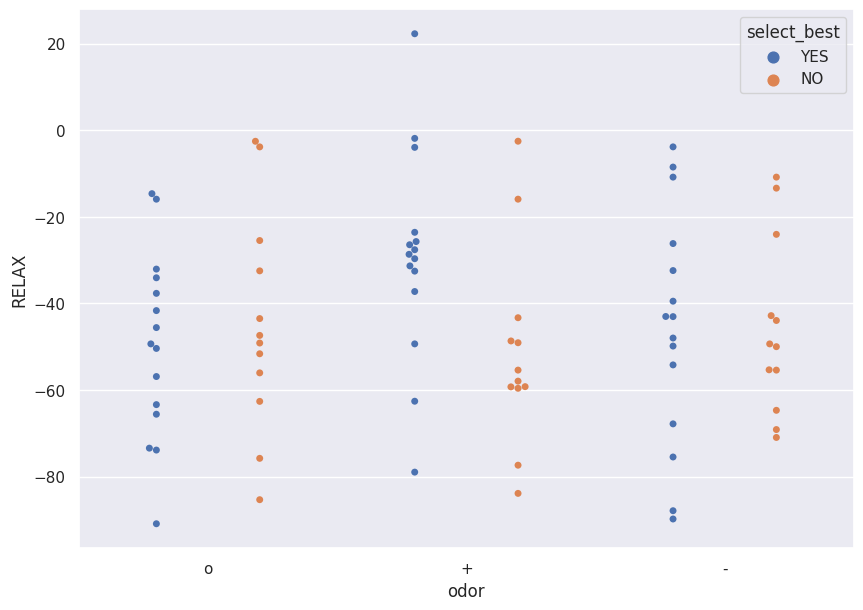

In [ ]:
df_plot = df_CO2_diff_intra
sns.swarmplot(data=df_plot, x="odor", y="PetCO2", hue="select_best", dodge=True)
plt.show()
sns.swarmplot(data=df_plot, x="odor", y="STAI", hue="select_best", dodge=True)
plt.show()
sns.swarmplot(data=df_plot, x="odor", y="RELAX", hue="select_best", dodge=True)
plt.show()

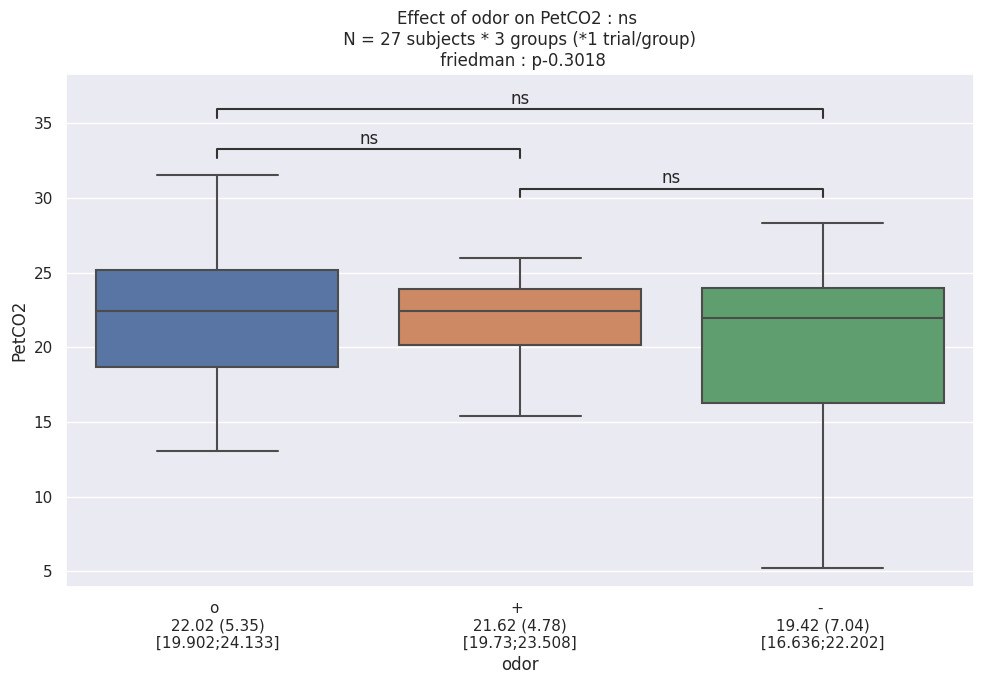

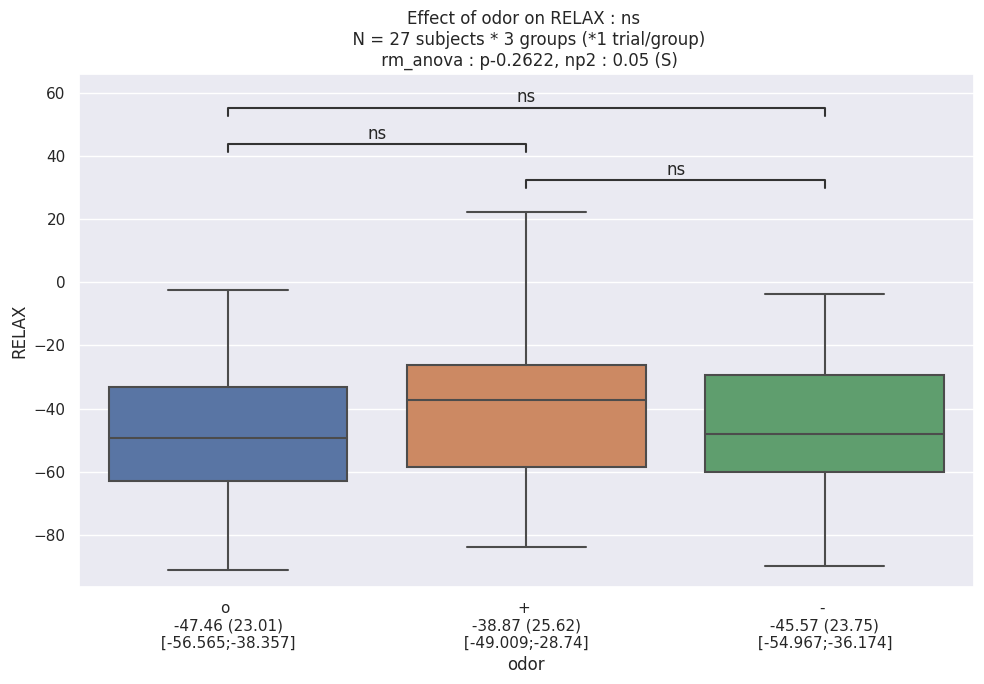

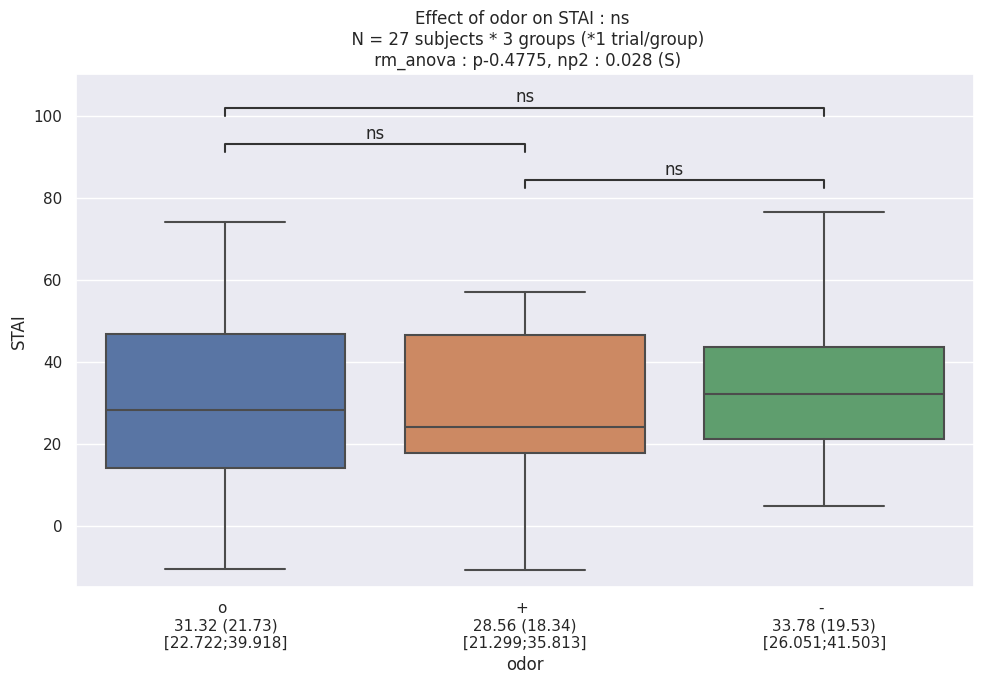

In [ ]:
df_stats = df_CO2_diff_intra
predictor = 'odor'
for metric in ['PetCO2', 'RELAX', 'STAI']:
    outcome = metric
    fig, ax = plt.subplots()
    ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='within', mode='box', transform=False, verbose=False)
    plt.tight_layout()
    plt.show()

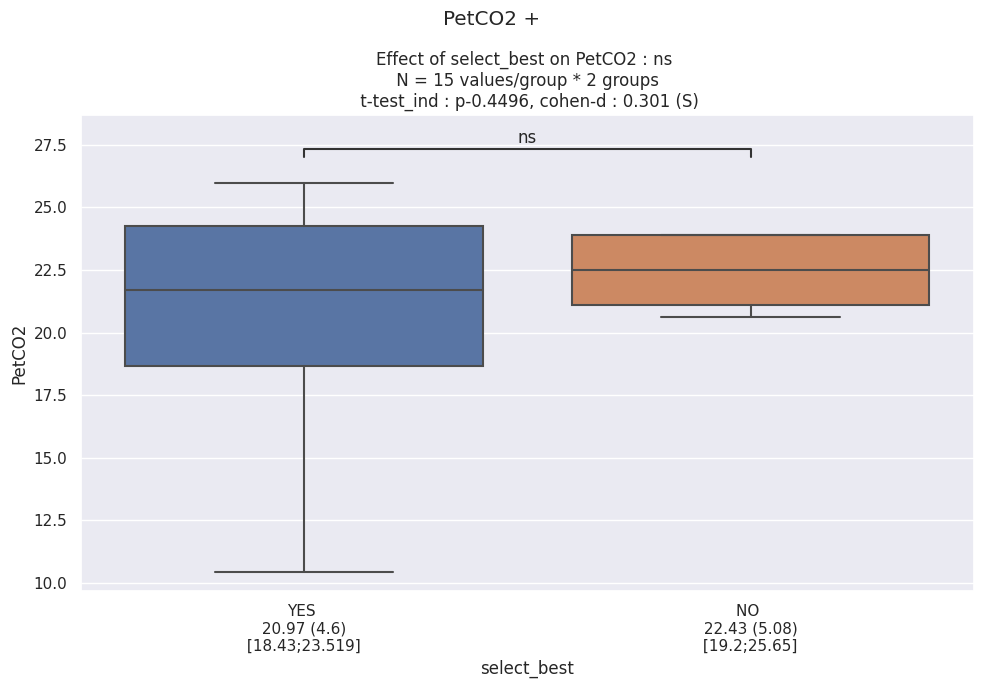

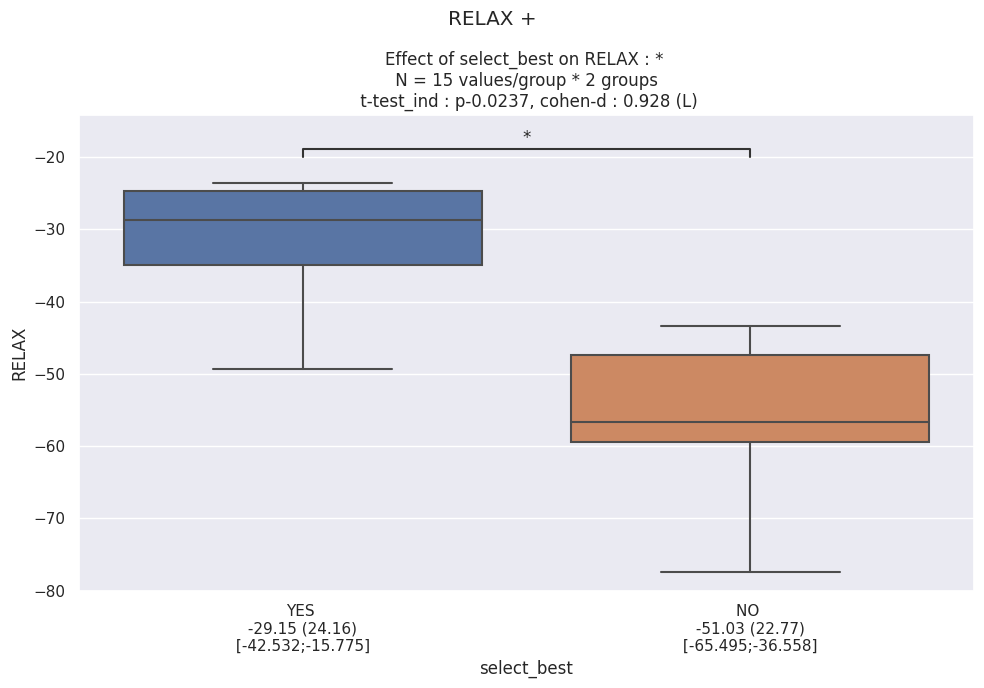

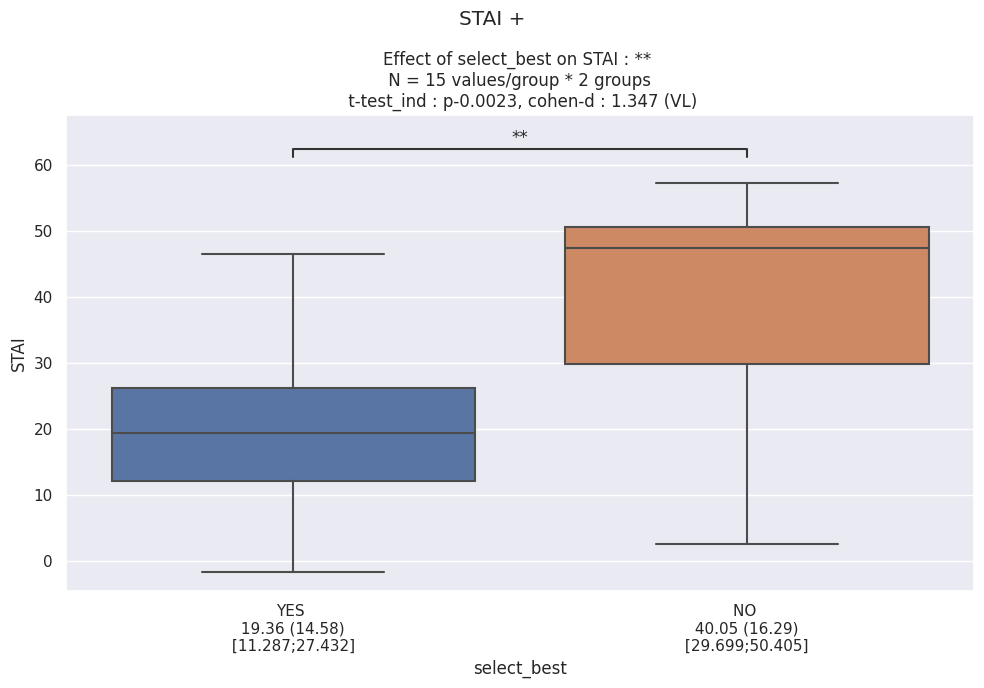

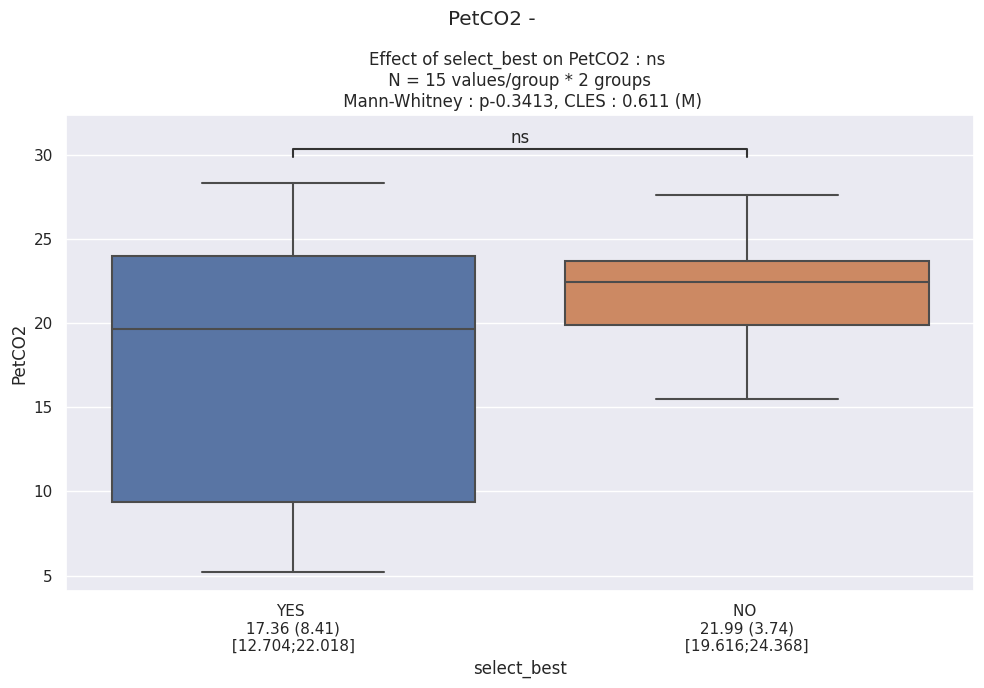

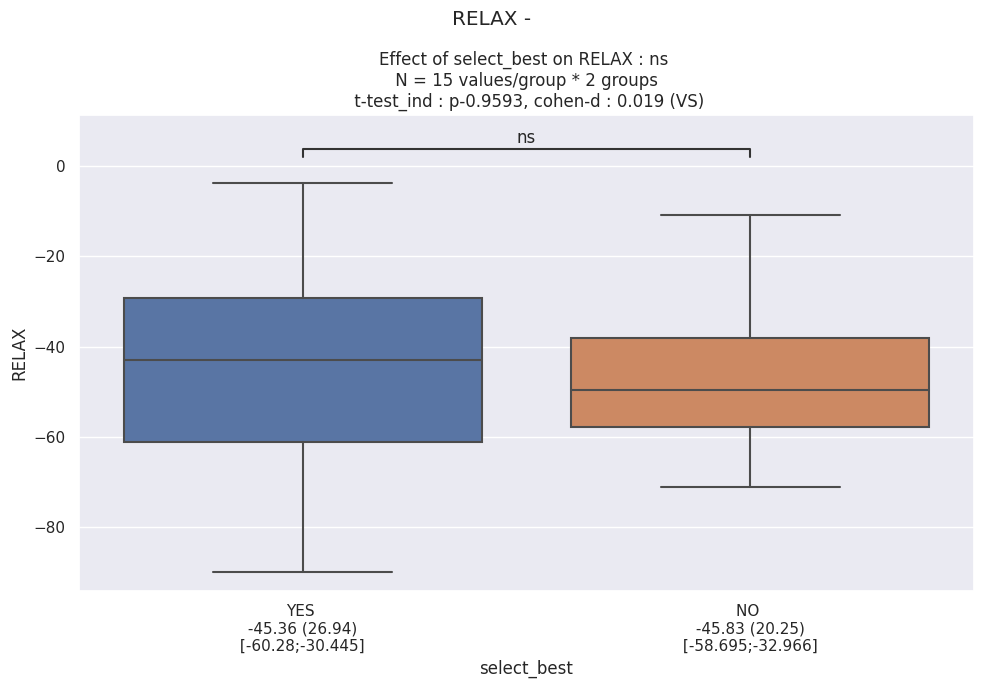

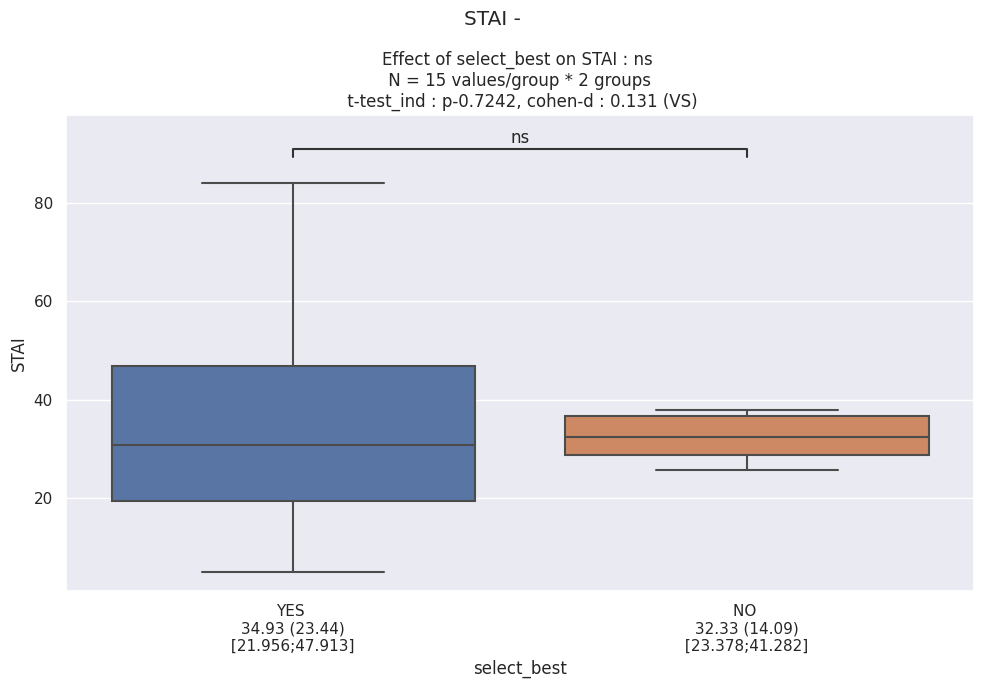

In [ ]:
predictor = 'odor'
for odor in ['+', '-']:
    for metric in ['PetCO2', 'RELAX', 'STAI']:
        outcome = metric
        predictor = 'select_best'
        df_stats = df_CO2_diff_intra.query(f"odor == '{odor}' and sujet in {sujet_list.tolist()}")
        fig, ax = plt.subplots()
        ax = auto_stats(df_stats, predictor, outcome, ax=ax, subject='sujet', design='between', mode='box', transform=False, verbose=False)
        plt.suptitle(f"{metric} {odor}")
        plt.tight_layout()
        plt.show()

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


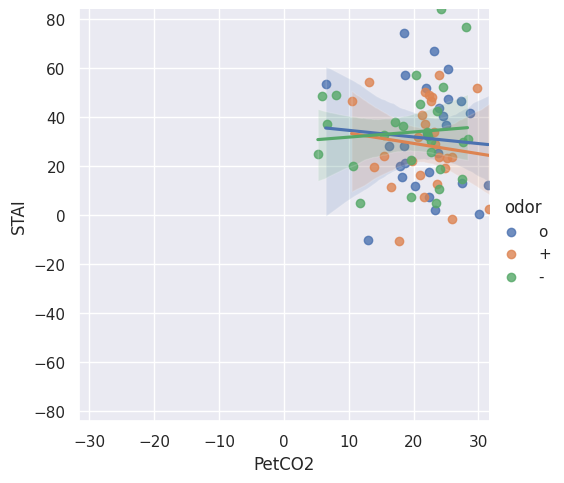

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


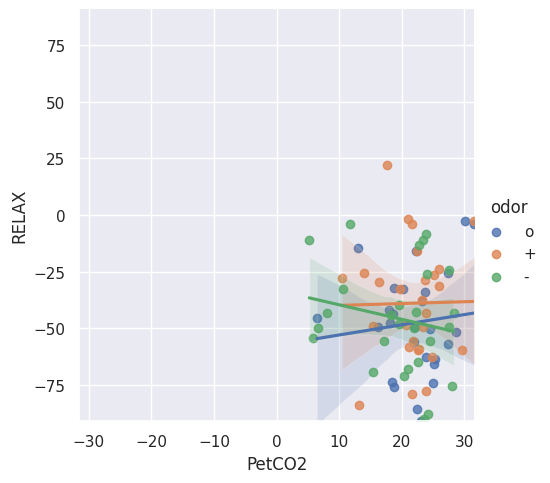

In [ ]:
scale = np.array([np.abs(df_CO2_diff_intra['PetCO2'].values.min()), np.abs(df_CO2_diff_intra['PetCO2'].values.max())]).max()

df_plot = df_CO2_diff_intra
scale_y = np.array([np.abs(df_CO2_diff_intra['STAI'].values.min()), np.abs(df_CO2_diff_intra['STAI'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="STAI", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

scale_y = np.array([np.abs(df_CO2_diff_intra['RELAX'].values.min()), np.abs(df_CO2_diff_intra['RELAX'].values.max())]).max()
sns.lmplot(data=df_plot, x="PetCO2", y="RELAX", hue="odor", height=5)
plt.xlim(-scale,scale)
plt.ylim(-scale_y,scale_y)
plt.show()

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


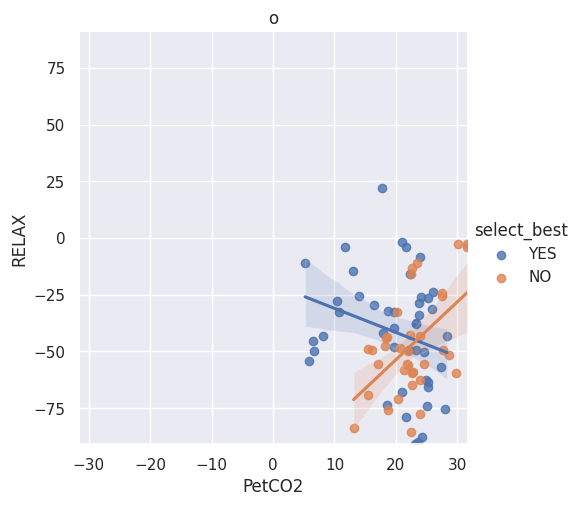

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


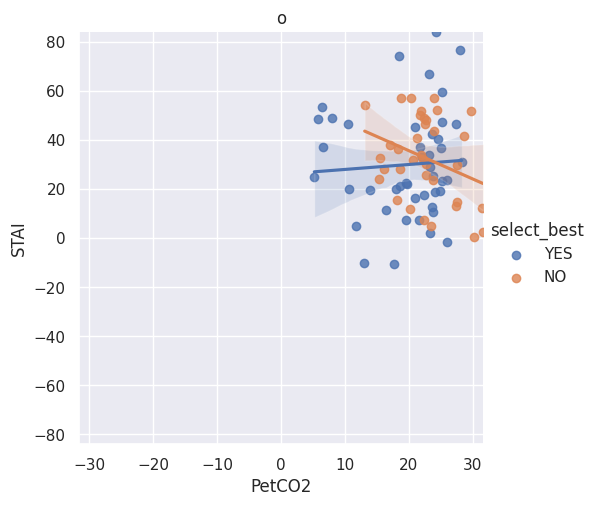

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


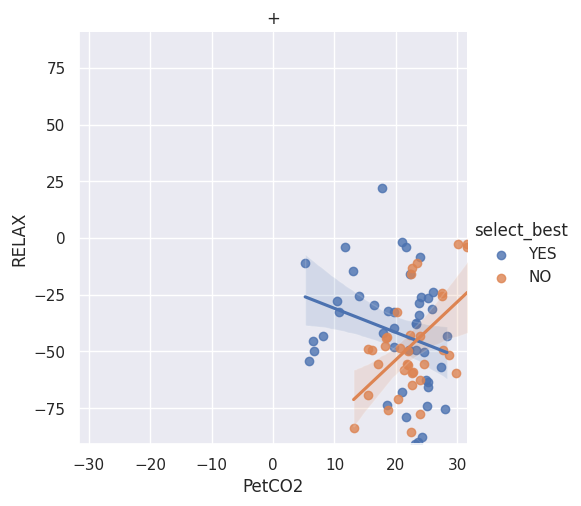

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


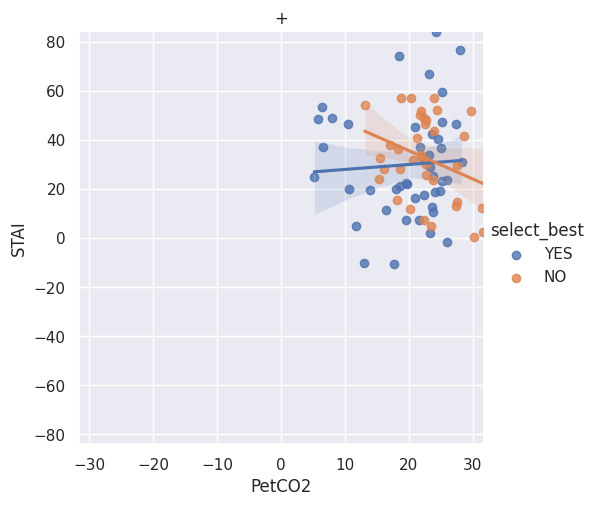

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


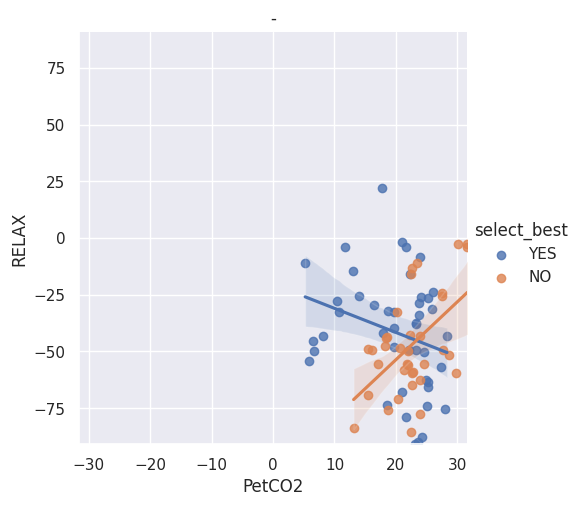

/home/jules/anaconda3/lib/python3.8/site-packages/seaborn/axisgrid.py:88: UserWarning: The figure layout has changed to tight
  self._figure.tight_layout(*args, **kwargs)


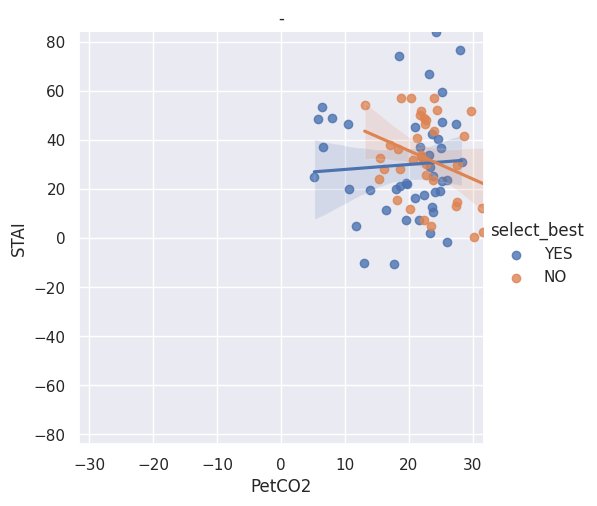

In [ ]:
scale = np.array([np.abs(df_CO2_diff_intra['PetCO2'].values.min()), np.abs(df_CO2_diff_intra['PetCO2'].values.max())]).max()

for odor in odor_list:

    scale_y = np.array([np.abs(df_CO2_diff_intra['RELAX'].values.min()), np.abs(df_CO2_diff_intra['RELAX'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="RELAX", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

    scale_y = np.array([np.abs(df_CO2_diff_intra['STAI'].values.min()), np.abs(df_CO2_diff_intra['STAI'].values.max())]).max()
    sns.lmplot(data=df_plot, x="PetCO2", y="STAI", hue="select_best", height=5)
    plt.title(odor)
    plt.xlim(-scale,scale)
    plt.ylim(-scale_y,scale_y)
    plt.show()

In [ ]:
import ghibtools
import neo.rawio
import physio
import pandas as pd

reader = neo.io.MicromedRawIO(filename='ecg_48chan_torse_vatin_+_tut.plx')
ecg_gibbs_these = reader.get_analogsignal_chunk(block_index=0)
ecg_tut = reader.get_analogsignal_chunk(block_index=1)

_, ecg_gibbs = physio.compute_ecg(ecg_gibbs_these)
_, ecg_tut = physio.compute_ecg(ecg_tut)

pval = auto_stats(df=pd.DataFrame([ecg_gibbs, ecg_tut]),
	outcome='gibbs', predictor='tut')['pval']

if pval < 0.05 and ecg_gibbs.mean() < ecg_tut.mean():

	print('these ez, plus relax que tut')